<div class="alert alert-block alert-info">
<center> <h1> BUSINESS CASE 3: SIEMENS ADVANTA CONSULTING </h1> </center> <br>
<center> <h2> Group G </h2> </center> <br>
<center> <h3> 2022/2023 </h3> </center> <br>

**Table of Contents** <br>
* [5. Initial Setup](#setup)
    * [Import Libraries](#importlibraries)
    * [Import Data](#importdata)
* [6. Modeling](#modeling)
    * [Product Group 1](#gck1)
    * [Product Group 3](#gck3)
    * [Product Group 4](#gck4)
    * [Product Group 5](#gck5)
    * [Product Group 6](#gck6)
    * [Product Group 8](#gck8)
    * [Product Group 9](#gck9)
    * [Product Group 11](#gck11)
    * [Product Group 12](#gck12)
    * [Product Group 13](#gck13)
    * [Product Group 14](#gck14)
    * [Product Group 16](#gck16)
    * [Product Group 20](#gck20)
    * [Product Group 36](#gck36)
    * [Readjusting Predictions](#re)

<hr>
<a class="anchor" id="setup">
    
# 1. Initial Setup
    
</a>

<a class="anchor" id="importlibraries">

## Import Libraries

</a>

No new library was used when compared to the previous notebook

In [426]:
import pandas as pd
from prophet import Prophet
import numpy as np
from sklearn import metrics
from xgboost import XGBRegressor
import matplotlib.pyplot as plt
from sklearn.model_selection import ParameterGrid
import calendar
import xgboost as xgb
import seaborn as sns
from scipy.stats import norm, kstest
from pmdarima import auto_arima

<a class="anchor" id="importdata">

## Import Data

</a>

In [1482]:
data_agg1=pd.read_csv('data_agg1.csv')
lag_data1=pd.read_csv('lag_data1.csv')
out_data_agg1=pd.read_csv('out_data_agg1.csv')

data_agg3=pd.read_csv('data_agg3.csv')
lag_data3=pd.read_csv('lag_data3.csv')
out_data_agg3=pd.read_csv('out_data_agg3.csv')
out_lag_data3=pd.read_csv('out_lag_data3.csv')

data_agg4=pd.read_csv('data_agg4.csv')
lag_data4=pd.read_csv('lag_data4.csv')
out_data_agg4=pd.read_csv('out_data_agg4.csv')
out_lag_data4=pd.read_csv('out_lag_data4.csv')

data_agg5=pd.read_csv('data_agg5.csv')
lag_data5=pd.read_csv('lag_data5.csv')

data_agg6=pd.read_csv('data_agg6.csv')
lag_data6=pd.read_csv('lag_data6.csv')

data_agg8=pd.read_csv('data_agg8.csv')
lag_data8=pd.read_csv('lag_data8.csv')
out_data_agg8=pd.read_csv('out_data_agg8.csv')
out_lag_data8=pd.read_csv('out_lag_data8.csv')

data_agg9=pd.read_csv('data_agg9.csv')
lag_data9=pd.read_csv('lag_data9.csv')
out_data_agg9=pd.read_csv('out_data_agg9.csv')
out_lag_data9=pd.read_csv('out_lag_data9.csv')

data_agg11=pd.read_csv('data_agg11.csv')
lag_data11=pd.read_csv('lag_data11.csv')

data_agg12=pd.read_csv('data_agg12.csv')
lag_data12=pd.read_csv('lag_data12.csv')

data_agg13=pd.read_csv('data_agg13.csv')
lag_data13=pd.read_csv('lag_data13.csv')

data_agg14=pd.read_csv('data_agg14.csv')
lag_data14=pd.read_csv('lag_data14.csv')
out_data_agg14=pd.read_csv('out_data_agg14.csv')
out_lag_data14=pd.read_csv('out_lag_data14.csv')

data_agg16=pd.read_csv('data_agg16.csv')
lag_data16=pd.read_csv('lag_data16.csv')
out_data_agg16=pd.read_csv('out_data_agg16.csv')

data_agg20=pd.read_csv('data_agg20.csv')
lag_data20=pd.read_csv('lag_data20.csv')

data_agg36=pd.read_csv('data_agg36.csv')
lag_data36=pd.read_csv('lag_data36.csv')
out_data_agg36=pd.read_csv('out_data_agg36.csv')
out_lag_data36=pd.read_csv('out_lag_data36.csv')

market_data_pred=pd.read_csv('market_data_pred.csv')

price_index = pd.read_csv("Cons_price_index.csv")

In [1483]:
# Remove the first row of the DataFrame
price_index = price_index[1:]

# Split the ';;Consumer price index;;' column into separate columns
new_cols = price_index[';;Consumer price index;;'].str.split(";", n=3, expand=True)
new_cols.columns = ['Year', 'Month', 'Consumer Price Index (2020=100)', 'Column']

# Concatenate the new columns to the original DataFrame and drop unnecessary columns
price_index = pd.concat([price_index, new_cols], axis=1)
price_index.drop(columns = [';;Consumer price index;;', 'Column'], axis=1, inplace=True)
price_index.head()

,Year,Month,Consumer Price Index (2020=100)
1,2004,January,79.4
2,2004,February,79.6
3,2004,March,79.9
4,2004,April,80.1
5,2004,May,80.3


In [1484]:
# Create a'Date' column using the 'Year' and 'Month' columns
price_index['Date'] = pd.to_datetime(price_index['Year'].astype(str) + '-' + price_index['Month'] + '-01')

# drop the 'Year' and 'Month' columns
price_index = price_index.drop(columns=['Year', 'Month'])
# Reorder columns
price_index = price_index.reindex(columns=['Date', 'Consumer Price Index (2020=100)'])

price_index.tail()

,Date,Consumer Price Index (2020=100)
227,2022-11-01,113.7
228,2022-12-01,113.2
229,2023-01-01,114.3
230,2023-02-01,115.2
231,2023-03-01,116.1


In [382]:
# Import test set
test_set=pd.read_csv('Case3_Test Set Template.csv',sep=';')
test_set.head()

,Month Year,Mapped_GCK,Sales_EUR
0,Mai 22,#3,NaN
1,Jun 22,#3,NaN
2,Jul 22,#3,NaN
3,Aug 22,#3,NaN
4,Sep 22,#3,NaN


In [383]:
# Define a mapping of month names to month numbers
month_map = {
    "Jan": 1,
    "Feb": 2,
    "Mai": 3,
    "Jun": 6,
    "Jul": 7,
    "Aug": 8,
    "Sep": 9,
    "Okt": 10,
    "Nov": 11,
    "Dez": 12
}
# Convert each date string into a datetime object representing the first day of the month
test_set['Month Year'] = [datetime.strptime(f"{month_map[date_string[:3]]} 01 {date_string[4:]}", "%m %d %y").date() for date_string in test_set['Month Year']]
test_set.head()

,Month Year,Mapped_GCK,Sales_EUR
0,2022-03-01,#3,NaN
1,2022-06-01,#3,NaN
2,2022-07-01,#3,NaN
3,2022-08-01,#3,NaN
4,2022-09-01,#3,NaN


<hr>
<a class="anchor" id="modeling">
    
# 6. Modeling
    
    
</a>

## Spliting Data

In [303]:
def data_split(data, split):
    """ This function splits the dataset of each product group into training and test and also into sales and market.
    The train_market and test_market are related with the exogenous features.
    The train_sales and test_sales are related with the actual sales."""
    
    # Seperate our data into sales and market 
    data.rename(columns={'Unnamed: 0': 'Date'}, inplace = True)
    data_sales = data.iloc[:,-1:]
    data_market = data.iloc[:,:-1]
    
    # If we want to use percentages to split the data
    perc = split/100
    train_size = int(len(data_sales) * perc)
    train_sales, test_sales = data_sales[:train_size], data_sales[train_size:]
    train_market, test_market = data_market[:train_size], data_market[train_size:]
        
    # Return the dataframes as a dictionary
    return {'train_sales': train_sales, 'test_sales': test_sales, 'train_market': train_market, 'test_market': test_market}

## Performance

In [304]:
def performance(data_train, data_test, train_predict, test_predict):
    measures_list = ["MAE", "RMSE", "R^2", "MAPE (%)"]
    train_error = [
        np.round(metrics.mean_absolute_error(data_train, train_predict),3),
        np.round(np.sqrt(metrics.mean_squared_error(data_train, train_predict)),3),
        np.round(metrics.r2_score(data_train, train_predict),3),
        np.round(metrics.mean_absolute_percentage_error(data_train, train_predict),3)]
    
    test_error = [
        np.round(metrics.mean_absolute_error(data_test, test_predict),3),
        np.round(np.sqrt(metrics.mean_squared_error(data_test, test_predict)),3),
        np.round(metrics.r2_score(data_test, test_predict),3),
        np.round(metrics.mean_absolute_percentage_error(data_test, test_predict),3)]
    
    result = pd.DataFrame({'Measure': measures_list,
                           'Train Error': train_error,
                           'Test Error': test_error},
                          columns = ['Measure', 'Train Error', 'Test Error'])
    return result

## Plot

In [305]:
def train_val_predictions(product, train, test, forecast):
    %matplotlib inline
    # Compute the minimum and maximum values of the 'Sales (€)' column
    y_max = max(train['Adjusted Sales (€)'].max(), test['Adjusted Sales (€)'].max(), forecast['Sales Predictions'].max())
    y_min = min(train['Adjusted Sales (€)'].min(), test['Adjusted Sales (€)'].min(), forecast['Sales Predictions'].min())

    # Generate 6 equally spaced levels between the minimum and maximum values
    y_ticks = np.linspace(y_min, y_max, num=7)

    # Format the tick labels as desired
    y_tick_labels = ['€{:.2f}'.format(val) for val in y_ticks]

    # Generate the month name and year based on the index
    month_names = [calendar.month_name[int(m.split('-')[1])] + '-' + m.split('-')[0][-2:] for m in forecast['Date'].values]


    fig, ax = plt.subplots(figsize=(9,4))
    ax.plot(forecast['Date'][:len(train)].values, train['Adjusted Sales (€)'], color='blue', label='Train')
    ax.plot(forecast['Date'][len(train):].values, test['Adjusted Sales (€)'], color='green', label='Test')
    ax.plot(forecast['Date'].values, forecast['Sales Predictions'], color='red', label='Predictions')
    ax.grid(False)

    ax.set_xlabel('Month')
    ax.set_xticks(range(len(forecast['Date'].values)))
    ax.set_xticklabels(month_names, rotation=90)
    ax.set_ylabel('Sales (€)')
    ax.set_yticks(y_ticks)
    ax.set_yticklabels(y_tick_labels)
    ax.set_title('Train and Test sets '+product)
    ax.legend()

    sns.despine()
    plt.show()

## Prophet

In [306]:
def best_split_prophet(split_list, data):
    """ This function finds the best split when applying the prophet model."""
     
    train_error = []
    test_error = []
    
    for i in split_list:
        split_data = data_split(data, i)
        train_sales = split_data['train_sales']
        test_sales = split_data['test_sales']
        train_market = split_data['train_market']
        test_market = split_data['test_market']
    
        prophet_data_train = pd.concat([train_market, train_sales], axis=1)
        prophet_data_train.rename(columns={'Date': 'ds', 'Adjusted Sales (€)': 'y'}, inplace=True)

        model_p = Prophet()
        for column in train_market.columns[1:]:
            model_p.add_regressor(column)
        model_p.fit(prophet_data_train)
        future = pd.concat([train_market, test_market])
        forecast = model_p.predict(future.rename(columns={'Date': 'ds'}))
    
        error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-forecast['yhat'][:len(train_sales)].values)**2).mean()), 3)
        train_error.append(error1)
        error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast['yhat'][len(train_sales):].values)**2).mean()), 3)
        test_error.append(error2)
        
    best_split = pd.DataFrame({'Split': split_list,
                              'Train Error': train_error,
                              'Test Error': test_error},
                             columns = ['Split', 'Train Error', 'Test Error'])
    
    return best_split

In [356]:
def prophet_forecast(split, data, changepoint_prior_scale_f, changepoint_range_f,seasonality_mode_f, seasonality_prior_scale_f):
    """This function apply the prophet model to the given dataset and splits the data accordingly to the split chosen."""
    
    split_data = data_split(data, split)
    train_sales = split_data['train_sales']
    test_sales = split_data['test_sales']
    train_market = split_data['train_market']
    test_market = split_data['test_market']
    
    prophet_data_train = pd.concat([train_market, train_sales], axis=1)
    prophet_data_train.rename(columns={'Date': 'ds', 'Adjusted Sales (€)': 'y'}, inplace=True)

    model_p = Prophet(seasonality_mode=seasonality_mode_f, changepoint_prior_scale=changepoint_prior_scale_f,
                     changepoint_range=changepoint_range_f, seasonality_prior_scale=seasonality_prior_scale_f)
    for column in train_market.columns[1:]:
        model_p.add_regressor(column)
    model_p.fit(prophet_data_train)
    future = pd.concat([train_market, test_market])
    forecast = model_p.predict(future.rename(columns={'Date': 'ds'}))
    
    result = forecast[['ds', 'yhat']]
    result.rename(columns={'ds': 'Date', 'yhat': 'Sales Predictions'}, inplace = True)
    result['Date'] = result['Date'].dt.strftime('%Y-%m-%d')
    
    perf = performance(train_sales['Adjusted Sales (€)'].values, test_sales['Adjusted Sales (€)'], 
                         forecast['yhat'][:len(train_sales)].values, forecast['yhat'][len(train_sales):].values)
    
    
    return {'Performance': perf, 'Predictions': result, 'Train': train_sales, 'Test': test_sales}

In [307]:
params_grid = {'seasonality_mode': ['multiplicative', 'additive'],
               'changepoint_prior_scale': [0.1, 0.3, 0.5],
               'changepoint_range': [0.6, 0.9],
               'seasonality_prior_scale': [0.01, 0.1, 1.0]}
grid = ParameterGrid(params_grid)

In [18]:
split_data = data_split(data_agg1, 50)
train_sales = split_data['train_sales']
test_sales = split_data['test_sales']
train_market = split_data['train_market']
test_market = split_data['test_market']
prophet_data_train = pd.concat([train_market, train_sales], axis=1)
prophet_data_train.rename(columns={'Date': 'ds', 'Adjusted Sales (€)': 'y'}, inplace=True)
future = pd.concat([train_market, test_market])
model_parameters = pd.DataFrame(columns = ['Parameters'])
for p in grid:   
    train_model =Prophet(seasonality_mode = p['seasonality_mode'],
                         changepoint_prior_scale = p['changepoint_prior_scale'],
                         changepoint_range=p['changepoint_range'],
                         seasonality_prior_scale=p['seasonality_prior_scale']
                         )
    for column in train_market.columns[1:]:
        train_model.add_regressor(column)
    train_model.fit(prophet_data_train)
    forecast = train_model.predict(future.rename(columns={'Date': 'ds'}))
    error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-forecast['yhat'][:len(train_sales)].values)**2).mean()), 3)
    error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast['yhat'][len(train_sales):].values)**2).mean()), 3)
    model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)

13:28:37 - cmdstanpy - INFO - Chain [1] start processing
13:28:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1650945658.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
13:28:38 - cmdstanpy - INFO - Chain [1] start processing
13:28:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1650945658.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
13:28:38 - cmdstanpy - INFO - Chain [1] start processing
13:28:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\migue\

13:28:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1650945658.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
13:28:44 - cmdstanpy - INFO - Chain [1] start processing
13:28:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1650945658.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
13:28:44 - cmdstanpy - INFO - Chain [1] start processing
13:28:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1650945658.py:22: Futu

In [19]:
model_parameters['Diff']=model_parameters['Test Error']-model_parameters['Train Error']
model_parameters.sort_values('Diff', ascending= True).head(30)

,Parameters,Test Error,Train Error,Diff
29,"{'changepoint_prior_scale': 0.5, 'changepoint_...",4.669072e+07,5404231.243,4.128649e+07
28,"{'changepoint_prior_scale': 0.5, 'changepoint_...",4.669072e+07,5404231.243,4.128649e+07
27,"{'changepoint_prior_scale': 0.5, 'changepoint_...",4.669072e+07,5404231.243,4.128649e+07
35,"{'changepoint_prior_scale': 0.5, 'changepoint_...",4.720254e+07,5397270.909,4.180526e+07
33,"{'changepoint_prior_scale': 0.5, 'changepoint_...",4.720254e+07,5397270.909,4.180526e+07
34,"{'changepoint_prior_scale': 0.5, 'changepoint_...",4.720254e+07,5397270.909,4.180526e+07
3,"{'changepoint_prior_scale': 0.1, 'changepoint_...",7.357326e+07,5953384.533,6.761987e+07
4,"{'changepoint_prior_scale': 0.1, 'changepoint_...",7.357326e+07,5953384.533,6.761987e+07
5,"{'changepoint_prior_scale': 0.1, 'changepoint_...",7.357326e+07,5953384.533,6.761987e+07
9,"{'changepoint_prior_scale': 0.1, 'changepoint_...",7.365514e+07,5953325.335,6.770181e+07


## XGBoost 

In [309]:
def best_split_xgboost(split_list, data):
    """ This function finds the best split when applying the XGBoost model."""
     
    train_error = []
    test_error = []
    
    for i in split_list:
        split_data = data_split(data, i)
        train_sales = split_data['train_sales']
        test_sales = split_data['test_sales']
        train_market = split_data['train_market']
        test_market = split_data['test_market']
    
        model_xg = XGBRegressor()
        model_xg.fit(train_market.iloc[:,1:], train_sales)
        
        future = pd.concat([train_market, test_market]).drop('Date', axis=1)
        forecast = model_xg.predict(future)

        error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-forecast[:len(train_sales)])**2).mean()), 3)
        train_error.append(error1)
        error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast[len(train_sales):])**2).mean()), 3)
        test_error.append(error2)
        
    best_split = pd.DataFrame({'Split': split_list,
                              'Train Error': train_error,
                              'Test Error': test_error},
                             columns = ['Split', 'Train Error', 'Test Error'])
    
    return best_split

In [310]:
def xgboost_forecast(split, data, alpha_f, learning_rate_f, max_depth_f, min_child_weight_f, subsample_f):
    """This function apply the XGBoost model to the given dataset and splits the data accordingly to the split chosen."""
    
    split_data = data_split(data, split)
    train_sales = split_data['train_sales']
    test_sales = split_data['test_sales']
    train_market = split_data['train_market']
    test_market = split_data['test_market']
    
    model_xg = XGBRegressor(alpha=alpha_f, subsample=subsample_f, learning_rate=learning_rate_f, max_depth=max_depth_f,
                           min_child_weight=min_child_weight_f)
    model_xg.fit(train_market.iloc[:,1:], train_sales)
        
    future = pd.concat([train_market, test_market]).drop('Date', axis=1)
    forecast = model_xg.predict(future)
    
    result = pd.DataFrame({'Date': list(data['Date']),
                           'Sales Predictions': forecast},
                         columns = ['Date', 'Sales Predictions'])
    
    perf = performance(train_sales['Adjusted Sales (€)'].values, test_sales['Adjusted Sales (€)'], 
                         result['Sales Predictions'][:len(train_sales)].values, result['Sales Predictions'][len(train_sales):].values)
    
    return {'Performance': perf, 'Predictions': result, 'Train': train_sales, 'Test': test_sales}

In [22]:
split_data = data_split(data_agg12, 60)
train_sales = split_data['train_sales']
test_sales = split_data['test_sales']
train_market = split_data['train_market']
test_market = split_data['test_market']

model_parameters = pd.DataFrame(columns = ['Parameters', 'Train Error', 'Test Error'])

# define the parameter grid to search over
params_grid = {
    'alpha':[0,1,2,5],
    'subsample':[0.1,0.3,0.5,1],
    'learning_rate': [0.5,0.1, 0.01, 0.001],
               'max_depth': [1, 2, 3, 5],
               'min_child_weight': [1,3, 5]}
grid = ParameterGrid(params_grid)

for p in grid:   
    model = xgb.XGBRegressor(**p)
    model.fit(train_market.iloc[:,1:], train_sales)
    forecast = model.predict(pd.concat([train_market, test_market]).drop('Date', axis=1))
    error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-forecast[:len(train_sales)])**2).mean()), 3)
    error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast[len(train_sales):])**2).mean()), 3)
    model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\4132433224.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

In [118]:
model_parameters['Diff']=model_parameters['Test Error']-model_parameters['Train Error']
model_parameters['|Diff|']=abs(model_parameters['Diff'])
model_parameters.sort_values('Diff', ascending= True).head(30)

,Parameters,Train Error,Test Error,Diff,|Diff|
892,"{'alpha': 5, 'learning_rate': 0.5, 'max_depth'...",14172.690,11302.386,-2870.304,2870.304
868,"{'alpha': 5, 'learning_rate': 0.5, 'max_depth'...",14172.690,11302.386,-2870.304,2870.304
880,"{'alpha': 5, 'learning_rate': 0.5, 'max_depth'...",14172.690,11302.386,-2870.304,2870.304
904,"{'alpha': 5, 'learning_rate': 0.5, 'max_depth'...",14172.690,11302.386,-2870.304,2870.304
916,"{'alpha': 5, 'learning_rate': 0.5, 'max_depth'...",14172.690,11302.386,-2870.304,2870.304
928,"{'alpha': 5, 'learning_rate': 0.5, 'max_depth'...",14172.690,11302.386,-2870.304,2870.304
640,"{'alpha': 2, 'learning_rate': 0.5, 'max_depth'...",14172.676,11302.420,-2870.256,2870.256
628,"{'alpha': 2, 'learning_rate': 0.5, 'max_depth'...",14172.676,11302.420,-2870.256,2870.256
616,"{'alpha': 2, 'learning_rate': 0.5, 'max_depth'...",14172.676,11302.420,-2870.256,2870.256
604,"{'alpha': 2, 'learning_rate': 0.5, 'max_depth'...",14172.676,11302.420,-2870.256,2870.256


In [24]:
model_parameters.iloc[600,:]['Parameters']

{'alpha': 1,
 'learning_rate': 0.01,
 'max_depth': 3,
 'min_child_weight': 5,
 'subsample': 0.1}

## AutoArima

In [311]:
def best_split_autoarima(split_list, data):
    """ This function finds the best split when applying the autoarima model."""
     
    train_error = []
    test_error = []
    
    for i in split_list:
        split_data = data_split(data, i)
        train_sales = split_data['train_sales']
        test_sales = split_data['test_sales']
        train_market = split_data['train_market']
        test_market = split_data['test_market']
    
        model_ar = auto_arima(train_sales,X=train_market.iloc[:,1:],stepwise=False)

        # get predictions for training data
        train_pred = model_ar.predict(n_periods=train_market.iloc[:,1:].shape[0],X=train_market.iloc[:,1:])

        # get predictions for testing data
        test_pred = model_ar.predict(n_periods=test_market.iloc[:,1:].shape[0],X=test_market.iloc[:,1:])

        error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-train_pred)**2).mean()), 3)
        train_error.append(error1)
        error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-test_pred)**2).mean()), 3)
        test_error.append(error2)
        
    best_split = pd.DataFrame({'Split': split_list,
                              'Train Error': train_error,
                              'Test Error': test_error},
                             columns = ['Split', 'Train Error', 'Test Error'])
    
    return best_split

In [346]:
def autoarima_forecast(split, data):
    """This function apply the autoarima model to the given dataset and splits the data accordingly to the split chosen."""
    
    split_data = data_split(data, split)
    train_sales = split_data['train_sales']
    test_sales = split_data['test_sales']
    train_market = split_data['train_market']
    test_market = split_data['test_market']
    
    model_ar = auto_arima(train_sales,X=train_market.iloc[:,1:],stepwise=False)
        
    # get predictions for training data
    train_pred = list(model_ar.predict(n_periods=train_market.iloc[:,1:].shape[0],X=train_market.iloc[:,1:]))

    # get predictions for testing data
    test_pred = list(model_ar.predict(n_periods=test_market.iloc[:,1:].shape[0],X=test_market.iloc[:,1:]))
    
    
    result = pd.DataFrame({'Date': list(data['Date']),
                           'Sales Predictions': train_pred + test_pred},
                         columns = ['Date', 'Sales Predictions'])
    
    perf = performance(train_sales['Adjusted Sales (€)'].values, test_sales['Adjusted Sales (€)'], 
                         train_pred, test_pred)
    
    return {'Performance': perf, 'Predictions': result, 'Train': train_sales, 'Test': test_sales}

## Mean

In [313]:
def best_split_mean(split_list, data):
    """ This function finds the best split when applying the mean model."""
     
    train_error = []
    test_error = []
    
    for i in split_list:
        split_data = data_split(data, i)
        train_sales = split_data['train_sales']
        test_sales = split_data['test_sales']
        train_market = split_data['train_market']
        test_market = split_data['test_market']
    
        model_mean = np.mean(train_sales['Adjusted Sales (€)'])

        # get predictions for training data
        train_pred = np.repeat(model_mean, train_sales.shape[0])

        # get predictions for testing data
        test_pred = np.repeat(model_mean, test_sales.shape[0])

        error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-train_pred)**2).mean()), 3)
        train_error.append(error1)
        error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-test_pred)**2).mean()), 3)
        test_error.append(error2)
        
    best_split = pd.DataFrame({'Split': split_list,
                              'Train Error': train_error,
                              'Test Error': test_error},
                             columns = ['Split', 'Train Error', 'Test Error'])
    
    return best_split

In [314]:
def mean_forecast(split, data):
    """This function apply the mean model to the given dataset and splits the data accordingly to the split chosen."""
    
    split_data = data_split(data, split)
    train_sales = split_data['train_sales']
    test_sales = split_data['test_sales']
    train_market = split_data['train_market']
    test_market = split_data['test_market']
    
    model_mean = np.mean(train_sales['Adjusted Sales (€)'])

    # get predictions for training data
    train_pred = list(np.repeat(model_mean, train_sales.shape[0]))

    # get predictions for testing data
    test_pred = list(np.repeat(model_mean, test_sales.shape[0]))
    
    result = pd.DataFrame({'Date': list(data['Date']),
                           'Sales Predictions': train_pred + test_pred},
                         columns = ['Date', 'Sales Predictions'])
    
    perf = performance(train_sales['Adjusted Sales (€)'].values, test_sales['Adjusted Sales (€)'], 
                         train_pred, test_pred)
    
    return {'Performance': perf, 'Predictions': result, 'Train': train_sales, 'Test': test_sales}

## Median

In [315]:
def best_split_median(split_list, data):
    """ This function finds the best split when applying the mean model."""
     
    train_error = []
    test_error = []
    
    for i in split_list:
        split_data = data_split(data, i)
        train_sales = split_data['train_sales']
        test_sales = split_data['test_sales']
        train_market = split_data['train_market']
        test_market = split_data['test_market']
    
        model_median = np.median(train_sales['Adjusted Sales (€)'])

        # get predictions for training data
        train_pred = np.repeat(model_median, train_sales.shape[0])

        # get predictions for testing data
        test_pred = np.repeat(model_median, test_sales.shape[0])

        error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-train_pred)**2).mean()), 3)
        train_error.append(error1)
        error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-test_pred)**2).mean()), 3)
        test_error.append(error2)
        
    best_split = pd.DataFrame({'Split': split_list,
                              'Train Error': train_error,
                              'Test Error': test_error},
                             columns = ['Split', 'Train Error', 'Test Error'])
    
    return best_split

In [316]:
def median_forecast(split, data):
    """This function apply the median model to the given dataset and splits the data accordingly to the split chosen."""
    
    split_data = data_split(data, split)
    train_sales = split_data['train_sales']
    test_sales = split_data['test_sales']
    train_market = split_data['train_market']
    test_market = split_data['test_market']
    
    model_median = np.median(train_sales['Adjusted Sales (€)'])

    # get predictions for training data
    train_pred = list(np.repeat(model_median, train_sales.shape[0]))

    # get predictions for testing data
    test_pred = list(np.repeat(model_median, test_sales.shape[0]))
    
    result = pd.DataFrame({'Date': list(data['Date']),
                           'Sales Predictions': train_pred + test_pred},
                          columns = ['Date', 'Sales Predictions'])
    
    perf = performance(train_sales['Adjusted Sales (€)'].values, test_sales['Adjusted Sales (€)'], 
                         train_pred, test_pred)
    
    return {'Performance': perf, 'Predictions': result, 'Train': train_sales, 'Test': test_sales}

## Simulation

In [317]:
def best_split_simulation(split_list, data):
    """ This function finds the best split when applying simulation."""
     
    train_error = []
    test_error = []
    
    for i in split_list:
        split_data = data_split(data, i)
        train_sales = split_data['train_sales']
        test_sales = split_data['test_sales']
        train_market = split_data['train_market']
        test_market = split_data['test_market']
    
        mu, std = norm.fit(train_sales['Adjusted Sales (€)'])
        
        # get predictions for training data
        train_pred = norm.rvs(mu,std, size=train_sales.shape[0])
        # get predictions for testing data
        test_pred = norm.rvs(mu,std, size=test_sales.shape[0])

        error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-train_pred)**2).mean()), 3)
        train_error.append(error1)
        error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-test_pred)**2).mean()), 3)
        test_error.append(error2)
        
    best_split = pd.DataFrame({'Split': split_list,
                              'Train Error': train_error,
                              'Test Error': test_error},
                             columns = ['Split', 'Train Error', 'Test Error'])
    
    return best_split

In [318]:
def simulation_forecast(split, data):
    """This function apply the simulation model to the given dataset and splits the data accordingly to the split chosen."""
    
    split_data = data_split(data, split)
    train_sales = split_data['train_sales']
    test_sales = split_data['test_sales']
    train_market = split_data['train_market']
    test_market = split_data['test_market']
    
    mu, std = norm.fit(train_sales['Adjusted Sales (€)'])
        
    # get predictions for training data
    train_pred = list(norm.rvs(mu,std, size=train_sales.shape[0]))
    # get predictions for testing data
    test_pred = list(norm.rvs(mu,std, size=test_sales.shape[0]))
    
    result = pd.DataFrame({'Date': list(data['Date']),
                           'Sales Predictions': train_pred + test_pred},
                          columns = ['Date', 'Sales Predictions'])
    
    perf = performance(train_sales['Adjusted Sales (€)'].values, test_sales['Adjusted Sales (€)'], 
                         train_pred, test_pred)
    
    return {'Performance': perf, 'Predictions': result, 'Train': train_sales, 'Test': test_sales}

<a class="anchor" id="gck1">
    
## Product Group 1
    
</a>

<a class="anchor" id="mean1">
    
### Mean
    
</a>

### data_agg1

In [211]:
split_list = [60,65,70,75,80,85,90]
best_split_mean(split_list, data_agg1)

,Split,Train Error,Test Error
0,60,6973907.170,5092161.454
1,65,6725492.377,5331418.682
2,70,6535575.906,5734257.724
3,75,6481185.105,5461325.162
4,80,6313194.938,5827568.152
5,85,6154939.410,6414424.769
6,90,6235126.753,5619579.068


In [98]:
forecast_mean1 = mean_forecast(60, data_agg1)

In [99]:
forecast_mean1['Performance']

,Measure,Train Error,Test Error
0,MAE,4176793.862,3848546.804
1,RMSE,6973907.170,5092161.454
2,R^2,0.000,-0.436
3,MAPE (%),0.321,0.098


In [100]:
forecast_mean1['Predictions']

,Date,Sales Predictions
0,2018-10-01,3.523522e+07
1,2018-11-01,3.523522e+07
2,2018-12-01,3.523522e+07
3,2019-01-01,3.523522e+07
4,2019-02-01,3.523522e+07
5,2019-03-01,3.523522e+07
6,2019-04-01,3.523522e+07
7,2019-05-01,3.523522e+07
8,2019-06-01,3.523522e+07
9,2019-07-01,3.523522e+07


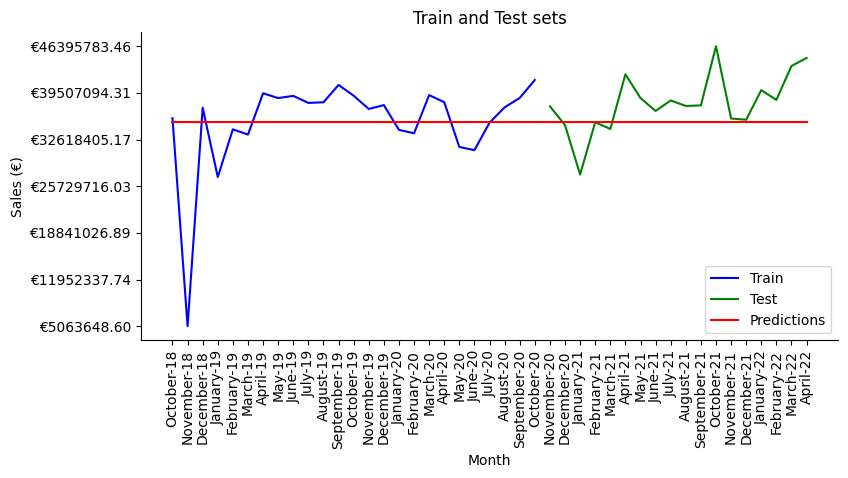

In [102]:
train_val_predictions('1', forecast_mean1['Train'], forecast_mean1['Test'], forecast_mean1['Predictions'])

### out_data_agg1

In [212]:
split_list = [60,65,70,75,80,85,90]
best_split_mean(split_list, out_data_agg1)

,Split,Train Error,Test Error
0,60,3271900.675,4521844.081
1,65,3172456.861,4779098.988
2,70,3438190.350,4918086.648
3,75,3525991.900,4752168.766
4,80,3439303.685,5153253.755
5,85,3354023.743,5758176.786
6,90,3634042.263,4975538.728


In [104]:
forecast_otmean1 = mean_forecast(60, out_data_agg1)

In [105]:
forecast_otmean1['Performance']

,Measure,Train Error,Test Error
0,MAE,2626702.657,3339748.591
1,RMSE,3271900.675,4521844.081
2,R^2,0.000,-0.133
3,MAPE (%),0.076,0.087


In [106]:
forecast_otmean1['Predictions']

,Date,Sales Predictions
0,2018-10-01,3.649458e+07
1,2018-11-01,3.649458e+07
2,2018-12-01,3.649458e+07
3,2019-01-01,3.649458e+07
4,2019-02-01,3.649458e+07
5,2019-03-01,3.649458e+07
6,2019-04-01,3.649458e+07
7,2019-05-01,3.649458e+07
8,2019-06-01,3.649458e+07
9,2019-07-01,3.649458e+07


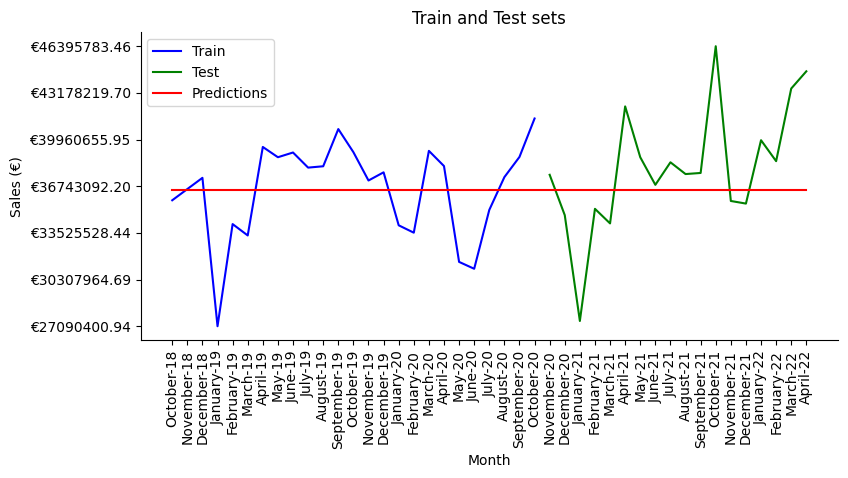

In [107]:
train_val_predictions('1', forecast_otmean1['Train'], forecast_otmean1['Test'], forecast_otmean1['Predictions'])

<a class="anchor" id="median1">
    
### Median
    
</a>

### data_agg1

In [61]:
split_list = [60,65,70,75,80,85,90]
best_split_median(split_list, data_agg1)

,Split,Train Error,Test Error
0,60,7293223.633,4301739.919
1,65,7036098.033,4515161.463
2,70,6905591.969,4127908.770
3,75,6783589.811,4137956.858
4,80,6584069.230,4558235.044
5,85,6428322.753,5101130.404
6,90,6429040.817,4453161.164


In [62]:
forecast_median1 = median_forecast(70, data_agg1)
forecast_median1['Predictions']

,Date,Sales Predictions
0,2018-10-01,3.722928e+07
1,2018-11-01,3.722928e+07
2,2018-12-01,3.722928e+07
3,2019-01-01,3.722928e+07
4,2019-02-01,3.722928e+07
5,2019-03-01,3.722928e+07
6,2019-04-01,3.722928e+07
7,2019-05-01,3.722928e+07
8,2019-06-01,3.722928e+07
9,2019-07-01,3.722928e+07


In [63]:
forecast_median1['Performance']

,Measure,Train Error,Test Error
0,MAE,3707038.609,2987030.725
1,RMSE,6905591.969,4127908.770
2,R^2,-0.116,-0.535
3,MAPE (%),0.292,0.070


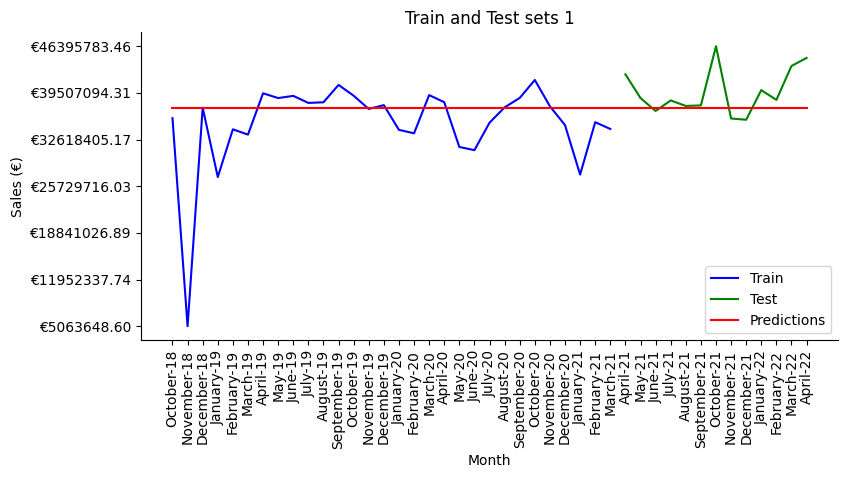

In [65]:
train_val_predictions('1', forecast_median1['Train'], forecast_median1['Test'], forecast_median1['Predictions'])

<a class="anchor" id="auto_arima1">
    
### Auto Arima
    
</a>

### data_agg1

In [344]:
split_list = [60,65,70,75,80,85,90]
best_split_autoarima(split_list, data_agg1)

,Split,Train Error,Test Error
0,60,6238619.274,4861485.439
1,65,6070006.865,4798730.000
2,70,6039567.127,3737830.313
3,75,5902066.998,3394635.182
4,80,5790006.811,3222803.469
5,85,5629095.595,3605233.710
6,90,5566789.838,3157146.266


In [347]:
forecast_autoarima1 = autoarima_forecast(70, data_agg1)
forecast_autoarima1['Predictions']

,Date,Sales Predictions
0,2018-10-01,3.614319e+07
1,2018-11-01,3.301845e+07
2,2018-12-01,3.473704e+07
3,2019-01-01,3.468947e+07
4,2019-02-01,3.296214e+07
5,2019-03-01,3.498012e+07
6,2019-04-01,3.795532e+07
7,2019-05-01,3.542114e+07
8,2019-06-01,3.158665e+07
9,2019-07-01,3.638746e+07


In [158]:
forecast_autoarima1['Performance']

,Measure,Train Error,Test Error
0,MAE,3177111.022,3397250.106
1,RMSE,6053784.558,3906268.332
2,R^2,0.142,-0.374
3,MAPE (%),0.258,0.084


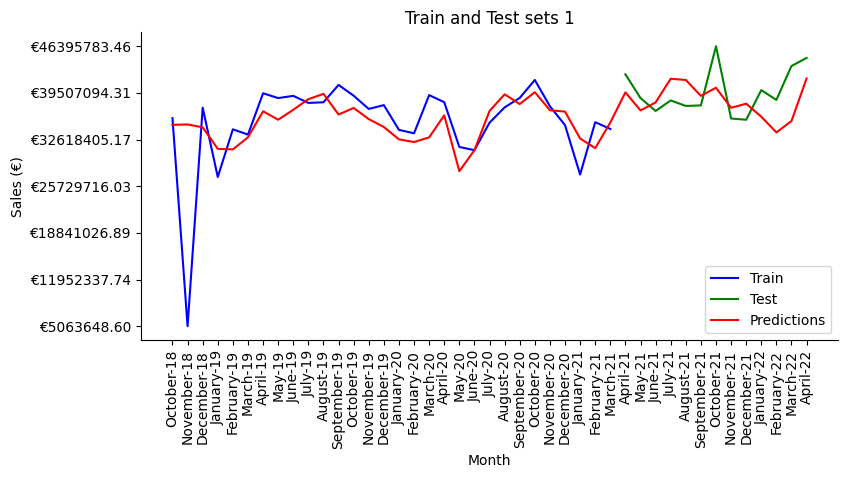

In [159]:
train_val_predictions('1', forecast_autoarima1['Train'], forecast_autoarima1['Test'], forecast_autoarima1['Predictions'])

### out_data_agg1

In [160]:
split_list = [60,65,70,75,80,85,90]
best_split_autoarima(split_list, out_data_agg1)

,Split,Train Error,Test Error
0,60,2000994.020,3822515.272
1,65,2061860.932,3506003.672
2,70,2350463.460,3006364.178
3,75,2317397.509,3296601.370
4,80,2488479.431,2972768.209
5,85,2305617.046,3566126.769
6,90,2933840.977,3531713.043


In [161]:
forecast_autoarima1_out = autoarima_forecast(80, out_data_agg1)
forecast_autoarima1_out['Predictions']

,Date,Sales Predictions
0,2018-10-01,3.574865e+07
1,2018-11-01,3.769665e+07
2,2018-12-01,3.843405e+07
3,2019-01-01,3.412702e+07
4,2019-02-01,3.252066e+07
5,2019-03-01,3.334853e+07
6,2019-04-01,3.821023e+07
7,2019-05-01,3.830488e+07
8,2019-06-01,3.981976e+07
9,2019-07-01,4.001865e+07


In [162]:
forecast_autoarima1_out['Performance']

,Measure,Train Error,Test Error
0,MAE,1774736.819,2858787.572
1,RMSE,2488479.431,2972768.209
2,R^2,0.476,0.371
3,MAPE (%),0.051,0.072


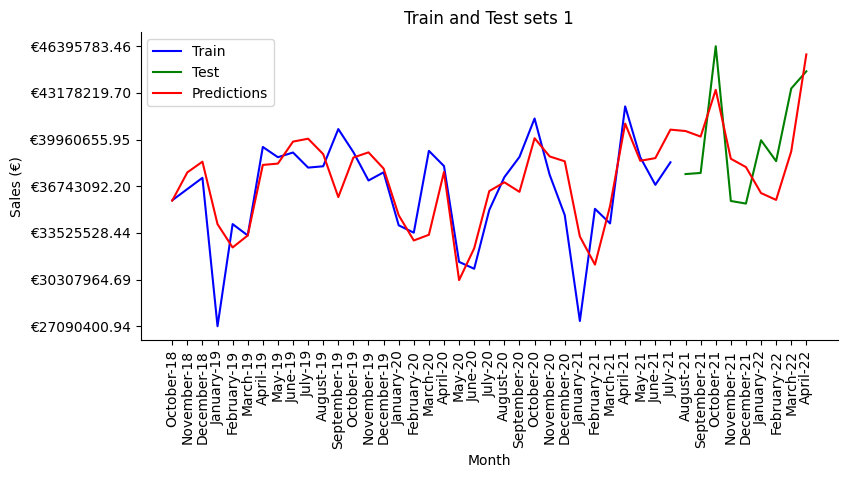

In [163]:
train_val_predictions('1', forecast_autoarima1_out['Train'], forecast_autoarima1_out['Test'], forecast_autoarima1_out['Predictions'])

<a class="anchor" id="simulation1">
    
### Simulation
    
</a>

### data_agg1

In [214]:
split_list = [60,65,70,75,80,85,90]
best_split_simulation(split_list, data_agg1)

,Split,Train Error,Test Error
0,60,9488659.484,7.666907e+06
1,65,9490661.079,5.671550e+06
2,70,8503818.410,9.321782e+06
3,75,7989601.306,1.010972e+07
4,80,8705939.408,1.043539e+07
5,85,8297053.341,4.067706e+06
6,90,7716321.926,5.725051e+06


In [136]:
forecast_simulation1 = simulation_forecast(90, data_agg1)

In [137]:
forecast_simulation1['Performance']

,Measure,Train Error,Test Error
0,MAE,6404135.571,5265583.502
1,RMSE,9135309.416,6524866.919
2,R^2,-1.147,-2.857
3,MAPE (%),0.306,0.125


In [138]:
forecast_simulation1['Predictions']

,Date,Sales Predictions
0,2018-10-01,4.413269e+07
1,2018-11-01,3.494871e+07
2,2018-12-01,3.620508e+07
3,2019-01-01,2.731830e+07
4,2019-02-01,4.054480e+07
5,2019-03-01,4.254416e+07
6,2019-04-01,3.953820e+07
7,2019-05-01,3.775740e+07
8,2019-06-01,3.799403e+07
9,2019-07-01,3.267840e+07


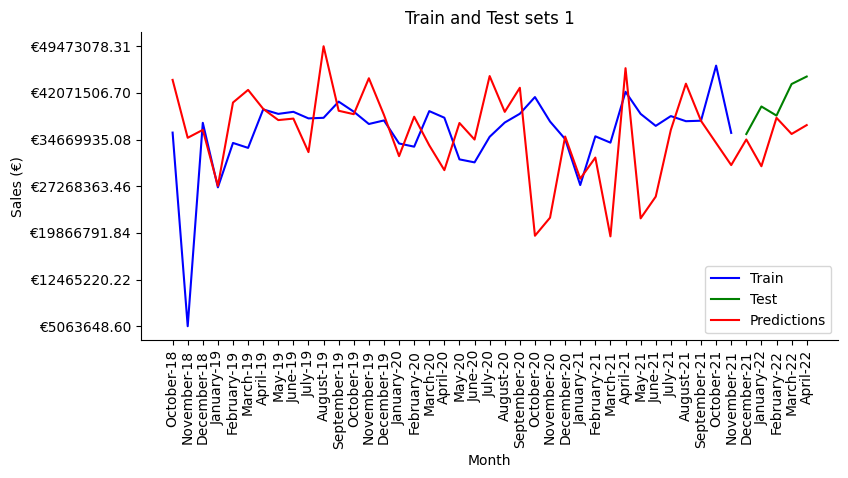

In [139]:
train_val_predictions('1', forecast_simulation1['Train'], forecast_simulation1['Test'], forecast_simulation1['Predictions'])

### out_data_agg1

In [215]:
split_list = [60,65,70,75,80,85,90]
best_split_simulation(split_list, out_data_agg1)

,Split,Train Error,Test Error
0,60,4240501.987,6295718.177
1,65,4953128.895,5595640.033
2,70,5096255.903,6389060.633
3,75,4786073.843,6673190.496
4,80,5097185.282,3496317.974
5,85,5201909.628,6744204.870
6,90,5752108.332,5386166.897


In [141]:
forecast_otsimulation1 = simulation_forecast(75, out_data_agg1)

In [142]:
forecast_otsimulation1['Performance']

,Measure,Train Error,Test Error
0,MAE,3615504.798,5529422.859
1,RMSE,4038459.992,6780452.857
2,R^2,-0.312,-2.703
3,MAPE (%),0.100,0.134


In [143]:
forecast_otsimulation1['Predictions']

,Date,Sales Predictions
0,2018-10-01,3.193676e+07
1,2018-11-01,4.057692e+07
2,2018-12-01,4.144278e+07
3,2019-01-01,3.256855e+07
4,2019-02-01,3.689590e+07
5,2019-03-01,3.343599e+07
6,2019-04-01,3.299966e+07
7,2019-05-01,3.427217e+07
8,2019-06-01,3.221805e+07
9,2019-07-01,3.708712e+07


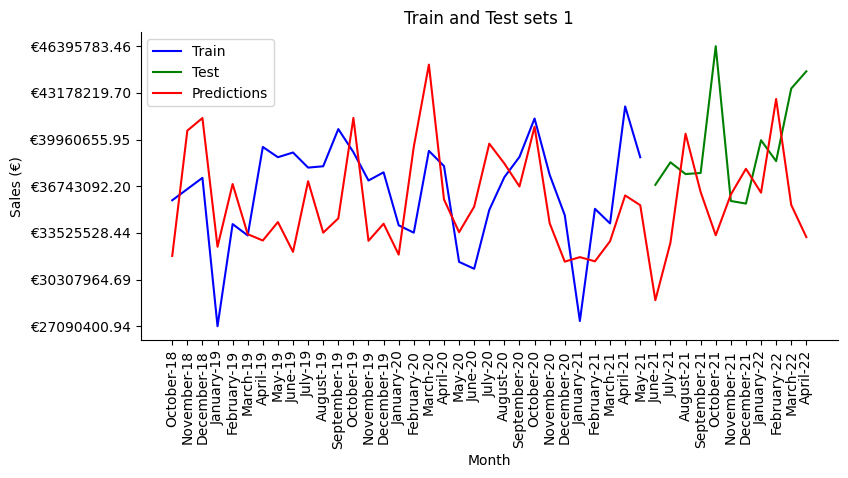

In [144]:
train_val_predictions('1', forecast_otsimulation1['Train'], forecast_otsimulation1['Test'], forecast_otsimulation1['Predictions'])

<a class="anchor" id="xgboost1">
    
### XGBoost
    
</a>

### lag_data1

In [216]:
split_list = [60,65,70,75,80,85,90]
best_split_xgboost(split_list, lag_data1)

,Split,Train Error,Test Error
0,60,5.228,3388868.225
1,65,5.283,4008615.525
2,70,5.784,2726207.906
3,75,5.616,3265358.583
4,80,5.629,3062015.859
5,85,5.727,2716789.959
6,90,6.269,4335718.414


In [202]:
split_data = data_split(lag_data1, 85)
train_sales = split_data['train_sales']
test_sales = split_data['test_sales']
train_market = split_data['train_market']
test_market = split_data['test_market']

model_parameters = pd.DataFrame(columns = ['Parameters', 'Train Error', 'Test Error'])

# define the parameter grid to search over
params_grid = {
    'alpha':[0,1,2,5],
    'subsample':[0.1,0.3,0.5,1],
    'learning_rate': [0.5,0.1, 0.01, 0.001],
               'max_depth': [1, 2, 3, 5, 6, 8],
               'min_child_weight': [1,3, 5]}
grid = ParameterGrid(params_grid)

for p in grid:   
    model = xgb.XGBRegressor(**p)
    model.fit(train_market.iloc[:,1:], train_sales)
    forecast = model.predict(pd.concat([train_market, test_market]).drop('Date', axis=1))
    error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-forecast[:len(train_sales)])**2).mean()), 3)
    error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast[len(train_sales):])**2).mean()), 3)
    model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\44580766.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppD

In [203]:
model_parameters['Diff']=model_parameters['Test Error']-model_parameters['Train Error']
model_parameters['|Diff|']=abs(model_parameters['Diff'])
model_parameters.sort_values('|Diff|', ascending= True).head(30)

,Parameters,Train Error,Test Error,Diff,|Diff|
936,"{'alpha': 5, 'learning_rate': 0.1, 'max_depth'...",2350717.098,2745627.814,394910.716,394910.716
360,"{'alpha': 1, 'learning_rate': 0.1, 'max_depth'...",2350715.620,2745627.814,394912.194,394912.194
648,"{'alpha': 2, 'learning_rate': 0.1, 'max_depth'...",2350715.783,2745628.360,394912.577,394912.577
72,"{'alpha': 0, 'learning_rate': 0.1, 'max_depth'...",2350715.161,2745629.669,394914.508,394914.508
708,"{'alpha': 2, 'learning_rate': 0.1, 'max_depth'...",2215157.606,2678972.209,463814.603,463814.603
684,"{'alpha': 2, 'learning_rate': 0.1, 'max_depth'...",2215157.606,2678972.209,463814.603,463814.603
696,"{'alpha': 2, 'learning_rate': 0.1, 'max_depth'...",2215157.606,2678972.209,463814.603,463814.603
420,"{'alpha': 1, 'learning_rate': 0.1, 'max_depth'...",2215157.599,2678972.209,463814.610,463814.610
408,"{'alpha': 1, 'learning_rate': 0.1, 'max_depth'...",2215157.599,2678972.209,463814.610,463814.610
396,"{'alpha': 1, 'learning_rate': 0.1, 'max_depth'...",2215157.599,2678972.209,463814.610,463814.610


In [204]:
model_parameters.iloc[936,:]['Parameters']

{'alpha': 5,
 'learning_rate': 0.1,
 'max_depth': 1,
 'min_child_weight': 1,
 'subsample': 0.1}

In [205]:
forecast_xgboost1 = xgboost_forecast(85,lag_data1,5,0.1,1,1,0.1)

In [206]:
forecast_xgboost1['Performance']

,Measure,Train Error,Test Error
0,MAE,1713937.836,2236283.270
1,RMSE,2350717.098,2745627.814
2,R^2,0.549,0.385
3,MAPE (%),0.048,0.056


In [207]:
forecast_xgboost1['Predictions']

,Date,Sales Predictions
0,2019-04-01,37308508.0
1,2019-05-01,39086752.0
2,2019-06-01,38659388.0
3,2019-07-01,38408876.0
4,2019-08-01,38051740.0
5,2019-09-01,38453772.0
6,2019-10-01,38697484.0
7,2019-11-01,38697484.0
8,2019-12-01,38113220.0
9,2020-01-01,36871632.0


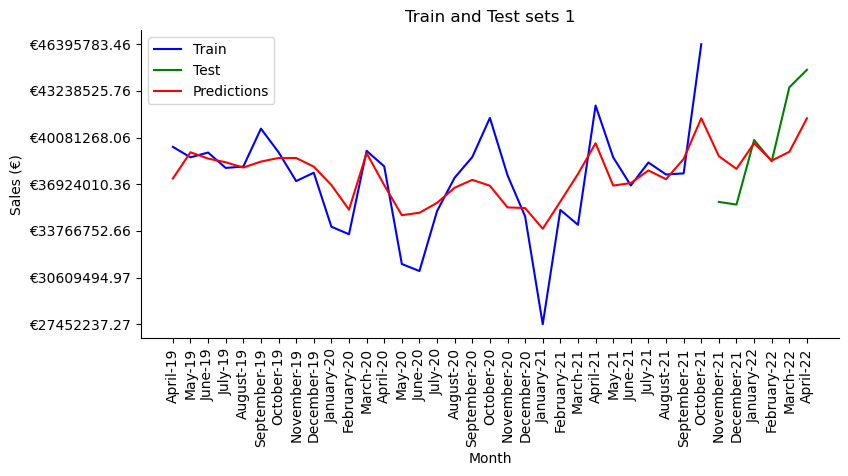

In [208]:
train_val_predictions('1', forecast_xgboost1['Train'], forecast_xgboost1['Test'], forecast_xgboost1['Predictions'])

<a class="anchor" id="xgboost1">
    
### Prophet
    
</a>

### data_agg1

In [476]:
split_list = [60,65,70,75,80,85,90]
best_split_prophet(split_list, data_agg1)

15:53:58 - cmdstanpy - INFO - Chain [1] start processing
15:54:23 - cmdstanpy - INFO - Chain [1] done processing
15:54:23 - cmdstanpy - INFO - Chain [1] start processing
15:54:25 - cmdstanpy - INFO - Chain [1] done processing
15:54:25 - cmdstanpy - INFO - Chain [1] start processing
15:54:25 - cmdstanpy - INFO - Chain [1] done processing
15:54:25 - cmdstanpy - INFO - Chain [1] start processing
15:54:25 - cmdstanpy - INFO - Chain [1] done processing
15:54:25 - cmdstanpy - INFO - Chain [1] start processing
15:54:26 - cmdstanpy - INFO - Chain [1] done processing
15:54:26 - cmdstanpy - INFO - Chain [1] start processing
15:54:26 - cmdstanpy - INFO - Chain [1] done processing
15:54:26 - cmdstanpy - INFO - Chain [1] start processing
15:54:26 - cmdstanpy - INFO - Chain [1] done processing
15:54:26 - cmdstanpy - INFO - Chain [1] start processing
15:54:26 - cmdstanpy - INFO - Chain [1] done processing


,Split,Train Error,Test Error
0,60,339.529,5.318139e+07
1,65,1657.116,2.043838e+09
2,70,3054504.936,4.219586e+07
3,75,3195418.415,4.128371e+07
4,80,3208134.316,5.850792e+07
5,85,3580183.117,1.314785e+07
6,90,3703109.448,7.569600e+06
7,year,3006679.970,4.782977e+07


In [477]:
split_data = data_split(data_agg1, 70)
train_sales = split_data['train_sales']
test_sales = split_data['test_sales']
train_market = split_data['train_market']
test_market = split_data['test_market']
prophet_data_train = pd.concat([train_market, train_sales], axis=1)
prophet_data_train.rename(columns={'Date': 'ds', 'Adjusted Sales (€)': 'y'}, inplace=True)
future = pd.concat([train_market, test_market])
model_parameters = pd.DataFrame(columns = ['Parameters'])
for p in grid:   
    train_model =Prophet(seasonality_mode = p['seasonality_mode'],
                         changepoint_prior_scale = p['changepoint_prior_scale'],
                         changepoint_range=p['changepoint_range'],
                         seasonality_prior_scale=p['seasonality_prior_scale']
                         )
    for column in train_market.columns[1:]:
        train_model.add_regressor(column)
    train_model.fit(prophet_data_train)
    forecast = train_model.predict(future.rename(columns={'Date': 'ds'}))
    error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-forecast['yhat'][:len(train_sales)].values)**2).mean()), 3)
    error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast['yhat'][len(train_sales):].values)**2).mean()), 3)
    model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)

15:54:41 - cmdstanpy - INFO - Chain [1] start processing
15:54:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\249735876.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:54:41 - cmdstanpy - INFO - Chain [1] start processing
15:54:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\249735876.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:54:41 - cmdstanpy - INFO - Chain [1] start processing
15:54:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppD

15:54:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\249735876.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:54:46 - cmdstanpy - INFO - Chain [1] start processing
15:55:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\249735876.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:55:07 - cmdstanpy - INFO - Chain [1] start processing
15:55:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\249735876.py:22: FutureWarn

In [326]:
model_parameters['Diff']=model_parameters['Test Error']-model_parameters['Train Error']
model_parameters['|Diff|']= abs(model_parameters['Diff'])
model_parameters.sort_values('|Diff|', ascending= True).head(30)

,Parameters,Test Error,Train Error,Diff,|Diff|
9,"{'changepoint_prior_scale': 0.1, 'changepoint_...",1.685217e+07,4753222.294,1.209895e+07,1.209895e+07
15,"{'changepoint_prior_scale': 0.3, 'changepoint_...",1.688636e+07,4753599.302,1.213276e+07,1.213276e+07
27,"{'changepoint_prior_scale': 0.5, 'changepoint_...",1.688778e+07,4753742.159,1.213404e+07,1.213404e+07
3,"{'changepoint_prior_scale': 0.1, 'changepoint_...",1.688804e+07,4753712.512,1.213432e+07,1.213432e+07
21,"{'changepoint_prior_scale': 0.3, 'changepoint_...",1.689007e+07,4753618.718,1.213645e+07,1.213645e+07
33,"{'changepoint_prior_scale': 0.5, 'changepoint_...",1.700104e+07,4752588.391,1.224845e+07,1.224845e+07
18,"{'changepoint_prior_scale': 0.3, 'changepoint_...",1.809498e+07,5044187.259,1.305079e+07,1.305079e+07
24,"{'changepoint_prior_scale': 0.5, 'changepoint_...",1.812592e+07,5044098.926,1.308183e+07,1.308183e+07
30,"{'changepoint_prior_scale': 0.5, 'changepoint_...",1.812983e+07,5044022.653,1.308581e+07,1.308581e+07
12,"{'changepoint_prior_scale': 0.3, 'changepoint_...",1.814323e+07,5044167.715,1.309907e+07,1.309907e+07


In [327]:
model_parameters.iloc[9,:]['Parameters']

{'changepoint_prior_scale': 0.1,
 'changepoint_range': 0.9,
 'seasonality_mode': 'additive',
 'seasonality_prior_scale': 0.01}

In [478]:
forecast_prophet1 = prophet_forecast(70, data_agg1,0.1, 0.9, 'additive', 0.01 )

15:56:48 - cmdstanpy - INFO - Chain [1] start processing
15:56:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\514556311.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result.rename(columns={'ds': 'Date', 'yhat': 'Sales Predictions'}, inplace = True)
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\514556311.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result['Date'] = result['Date'].dt.strftime('%Y-%m-%d')


In [479]:
forecast_prophet1['Performance']

,Measure,Train Error,Test Error
0,MAE,3049305.056,2655321.909
1,RMSE,5003203.033,3990754.090
2,R^2,0.414,-0.435
3,MAPE (%),0.208,0.065


In [480]:
forecast_prophet1['Predictions']

,Date,Sales Predictions
0,2018-10-01,2.689330e+07
1,2018-11-01,2.670924e+07
2,2018-12-01,3.123968e+07
3,2019-01-01,2.832325e+07
4,2019-02-01,3.095044e+07
5,2019-03-01,3.280256e+07
6,2019-04-01,3.833819e+07
7,2019-05-01,3.922051e+07
8,2019-06-01,3.902829e+07
9,2019-07-01,4.169879e+07


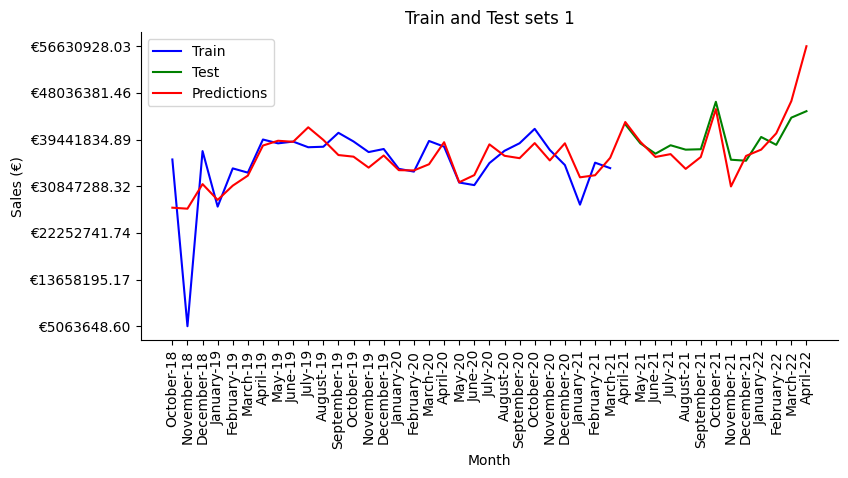

In [481]:
train_val_predictions('1', forecast_prophet1['Train'], forecast_prophet1['Test'], forecast_prophet1['Predictions'])

### Final Model

In [1531]:
# Values we have to predict
test_set[test_set['Mapped_GCK']=='#1']

,Month Year,Mapped_GCK,Sales_EUR
130,2022-03-01,#1,NaN
131,2022-06-01,#1,NaN
132,2022-07-01,#1,NaN
133,2022-08-01,#1,NaN
134,2022-09-01,#1,NaN
135,2022-10-01,#1,NaN
136,2022-11-01,#1,NaN
137,2022-12-01,#1,NaN
138,2023-01-01,#1,NaN
139,2023-02-01,#1,NaN


In [1532]:
# Arranging the dataset that will be used for the prediction
test_data_1=pd.DataFrame(index=test_set[test_set['Mapped_GCK']=='#1']['Month Year'],columns=lag_data1.columns).drop(
        columns='Unnamed: 0')
test_data_1.head()

,Shipments Index Machinery & Electricals Italy,Adjusted Sales Lag 6,Production Index Machinery and equipment n.e.c. United States,Production Index Electrical equipment United Kingdom,Producer Prices Electrical equipment China,Adjusted Sales (€)
Month Year,,,,,,
2022-03-01,NaN,NaN,NaN,NaN,NaN,NaN
2022-06-01,NaN,NaN,NaN,NaN,NaN,NaN
2022-07-01,NaN,NaN,NaN,NaN,NaN,NaN
2022-08-01,NaN,NaN,NaN,NaN,NaN,NaN
2022-09-01,NaN,NaN,NaN,NaN,NaN,NaN


In [1533]:
# Considering that the variables used have lags, we already have values we can fill
test_data_1.iloc[:,0]=market_data_pred['Shipments Index Machinery & Electricals Italy'].iloc[-10:].values
test_data_1.iloc[0,2]=market_data_pred['Production Index Machinery and equipment n.e.c. United States '].iloc[-1:].values[0]
test_data_1.iloc[0,3]=market_data_pred['Production Index Electrical equipment United Kingdom '].iloc[-1:].values[0]
test_data_1.iloc[0,4]=market_data_pred['Producer Prices Electrical equipment China '].iloc[-1:].values[0]

#### Production Index Machinery and equipment n.e.c United States

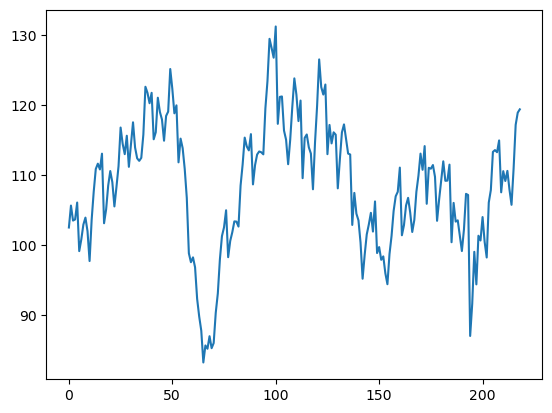

In [1534]:
plt.plot(market_data_pred.loc[:,'Production Index Machinery and equipment n.e.c. United States '])

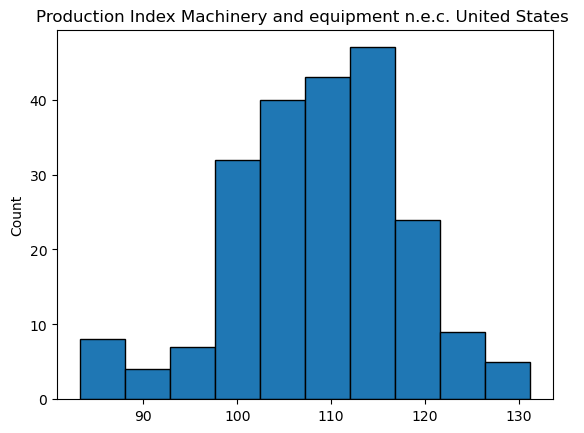

In [1535]:
# Create a new plot
fig, ax = plt.subplots()

# Define the series of values
values = market_data_pred.loc[:,'Production Index Machinery and equipment n.e.c. United States ']

# Calculate the number of bins and the bin size
num_bins = 10
data_range = max(values) - min(values)
bin_size = data_range / num_bins

# Create the histogram using the plt.hist() function
ax.hist(values, bins=np.arange(min(values), max(values) + bin_size, bin_size), edgecolor='black')

# Set the y-axis label
ax.set_ylabel('Count')

# Set the title of the plot
ax.set_title('Production Index Machinery and equipment n.e.c. United States ')

# Display the plot
plt.show()

values_copy=values.copy()
values_copy = values_copy.drop(values_copy.index[1])

Kolmogorov-Smirnov test result: KstestResult(statistic=0.06562128438836312, pvalue=0.28949185399861177)


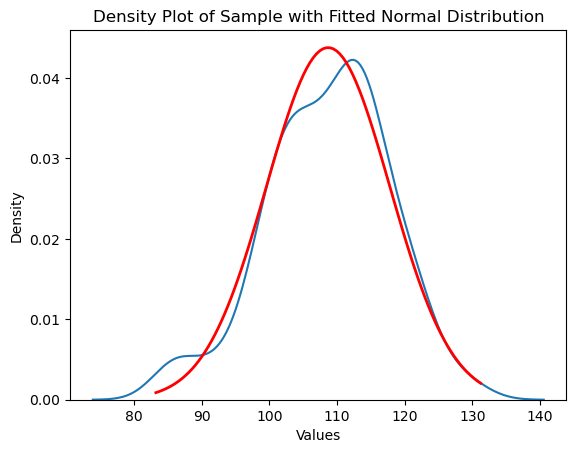

In [1536]:
# Define the series of values
values = market_data_pred.loc[:,'Production Index Machinery and equipment n.e.c. United States ']

# Generate the density plot
sns.kdeplot(values)

# Estimate the parameters of the normal distribution that best fit the density plot
mu, std = norm.fit(values)

# Calculate the PDF of the normal distribution with the estimated parameters
x = np.linspace(min(values), max(values), 100)
pdf = norm.pdf(x, mu, std)

# Plot the normal distribution
plt.plot(x, pdf, 'r', linewidth=2)

# Add labels and title
plt.xlabel('Values')
plt.ylabel('Density')
plt.title('Density Plot of Sample with Fitted Normal Distribution')

# Perform the Kolmogorov-Smirnov test to assess the fit of the normal distribution
kstest_result = kstest(values, 'norm', args=(mu, std))
print('Kolmogorov-Smirnov test result:', kstest_result)

# Show the plot
plt.show()

In [1537]:
# Generate 9 predictions based on the fitted distribution
predictions = norm.rvs(mu,std, size=9)

# Fill missing values
test_data_1.iloc[1:,2]=predictions

#### Production Index Electrical equipment United Kingdom

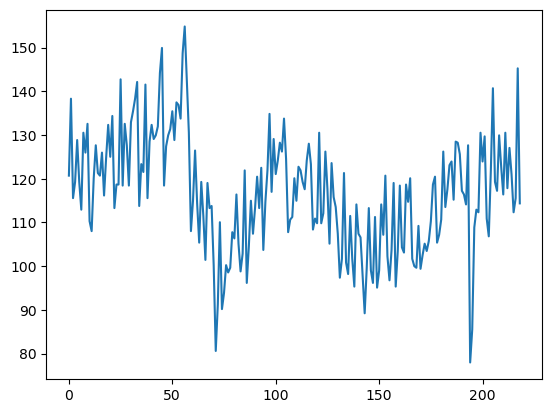

In [1538]:
plt.plot(market_data_pred.loc[:,'Production Index Electrical equipment United Kingdom '])

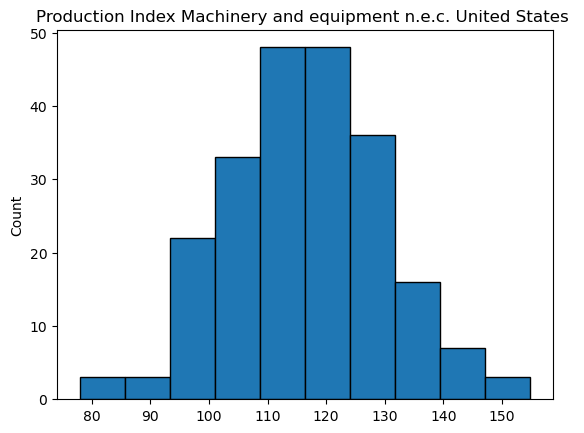

In [1539]:
# Create a new plot
fig, ax = plt.subplots()

# Define the series of values
values = market_data_pred.loc[:,'Production Index Electrical equipment United Kingdom ']

# Calculate the number of bins and the bin size
num_bins = 10
data_range = max(values) - min(values)
bin_size = data_range / num_bins

# Create the histogram using the plt.hist() function
ax.hist(values, bins=np.arange(min(values), max(values) + bin_size, bin_size), edgecolor='black')

# Set the y-axis label
ax.set_ylabel('Count')

# Set the title of the plot
ax.set_title('Production Index Machinery and equipment n.e.c. United States ')

# Display the plot
plt.show()

values_copy=values.copy()
values_copy = values_copy.drop(values_copy.index[1])

Kolmogorov-Smirnov test result: KstestResult(statistic=0.02874924576270682, pvalue=0.9912628241433826)


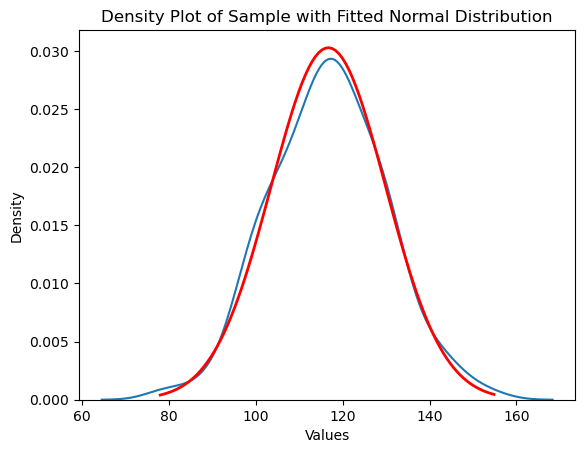

In [1540]:
# Define the series of values
values = market_data_pred.loc[:,'Production Index Electrical equipment United Kingdom ']

# Generate the density plot
sns.kdeplot(values)

# Estimate the parameters of the normal distribution that best fit the density plot
mu, std = norm.fit(values)

# Calculate the PDF of the normal distribution with the estimated parameters
x = np.linspace(min(values), max(values), 100)
pdf = norm.pdf(x, mu, std)

# Plot the normal distribution
plt.plot(x, pdf, 'r', linewidth=2)

# Add labels and title
plt.xlabel('Values')
plt.ylabel('Density')
plt.title('Density Plot of Sample with Fitted Normal Distribution')

# Perform the Kolmogorov-Smirnov test to assess the fit of the normal distribution
kstest_result = kstest(values, 'norm', args=(mu, std))
print('Kolmogorov-Smirnov test result:', kstest_result)

# Show the plot
plt.show()

In [1541]:
# Generate 9 predictions based on the fitted distribution
predictions = norm.rvs(mu,std, size=9)

# Fill missing values
test_data_1.iloc[1:,3]=predictions

#### Producer Prices Electrical equipment China 

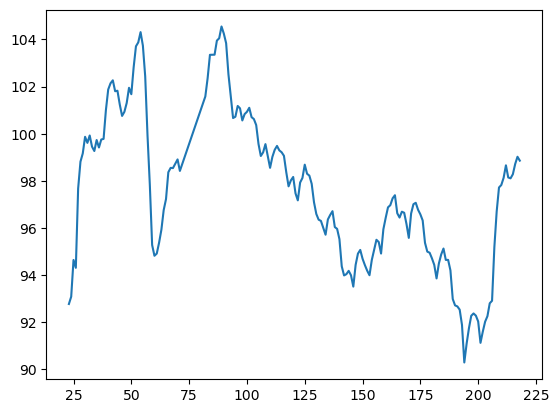

In [1542]:
plt.plot(market_data_pred.loc[:,'Producer Prices Electrical equipment China '])

In [1543]:
predict_ppeec=pd.DataFrame(market_data_pred.set_index('Unnamed: 0').loc[:,
            'Producer Prices Electrical equipment China '].dropna()).reset_index().rename(columns={'Unnamed: 0':'ds',
            'Producer Prices Electrical equipment China ':'y'})
predict_ppeec.head()

,ds,y
0,2006-01-01,92.773885
1,2006-02-01,93.085093
2,2006-03-01,94.642912
3,2006-04-01,94.310047
4,2006-05-01,97.673830


In [1544]:
prophet_ppeec=Prophet()
prophet_ppeec.fit(predict_ppeec)

23:38:16 - cmdstanpy - INFO - Chain [1] start processing
23:38:16 - cmdstanpy - INFO - Chain [1] done processing


In [1545]:
future = prophet_ppeec.make_future_dataframe(periods=9,freq='m')
forecast = prophet_ppeec.predict(future)

# Fill missing values
test_data_1.iloc[1:,4]=forecast['yhat'][-9:]

In [1546]:
test_data_1.iloc[:6,1]=data_agg1.iloc[-6:,-1]

In [1547]:
final_1 = XGBRegressor(alpha=5, subsample=0.1, learning_rate=0.1, max_depth=1,
                           min_child_weight=1)
final_1.fit(lag_data1.drop(columns='Adjusted Sales (€)').iloc[:,1:], lag_data1['Adjusted Sales (€)'])
        
future = pd.DataFrame(test_data_1.iloc[:4,:-1]).astype(float)
forecast_1 = final_1.predict(future)

In [1548]:
test_data_1.iloc[-4:,1]=forecast_1

In [1549]:
future = pd.DataFrame(test_data_1.iloc[-6:,:-1]).astype(float)
forecast_2 = final_1.predict(future)

In [1550]:
final_predictions_1=list(forecast_1)+list(forecast_2)
final_predictions_1

[40022200.0,
 35692640.0,
 41641390.0,
 41084860.0,
 42240564.0,
 40610720.0,
 36972144.0,
 38634170.0,
 40755120.0,
 40930524.0]

<a class="anchor" id="gck3">
    
## Product Group 3
    
</a>

<a class="anchor" id="mean1">
    
### Mean
    
</a>

### data_agg3

In [388]:
split_list = [60,65,70,75,80,85,90]
best_split_mean(split_list, data_agg3)

,Split,Train Error,Test Error
0,60,1898978.683,3791391.081
1,65,1967716.776,3883435.847
2,70,2555081.648,3416062.418
3,75,2508272.541,3624887.143
4,80,2482792.927,3780675.653
5,85,2529087.830,3786144.092
6,90,2755831.676,2591624.620


In [389]:
forecast_mean3 = mean_forecast(90, data_agg3)

In [390]:
forecast_mean3['Performance']

,Measure,Train Error,Test Error
0,MAE,2076346.992,2178329.324
1,RMSE,2755831.676,2591624.620
2,R^2,0.000,-2.407
3,MAPE (%),0.207,0.142


In [391]:
forecast_mean3['Predictions']

,Date,Sales Predictions
0,2018-10-01,1.233533e+07
1,2018-11-01,1.233533e+07
2,2018-12-01,1.233533e+07
3,2019-01-01,1.233533e+07
4,2019-02-01,1.233533e+07
5,2019-03-01,1.233533e+07
6,2019-04-01,1.233533e+07
7,2019-05-01,1.233533e+07
8,2019-06-01,1.233533e+07
9,2019-07-01,1.233533e+07


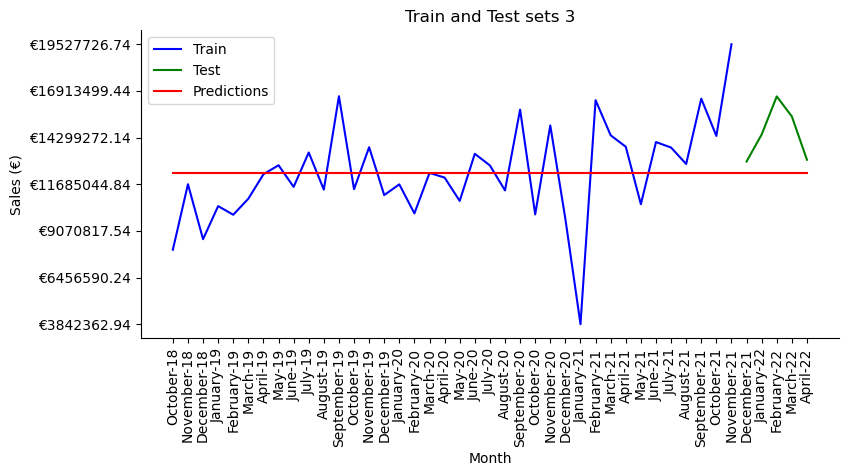

In [392]:
train_val_predictions('3', forecast_mean3['Train'], forecast_mean3['Test'], forecast_mean3['Predictions'])

### out_data_agg3

In [393]:
split_list = [60,65,70,75,80,85,90]
best_split_mean(split_list, out_data_agg3)

,Split,Train Error,Test Error
0,60,1898978.683,3314495.769
1,65,1967716.776,3349305.905
2,70,2094986.018,3181012.719
3,75,2068082.684,3384642.138
4,80,2050910.954,3557084.657
5,85,2115050.001,3576980.972
6,90,2377298.154,2391242.455


In [394]:
forecast_otmean3 = mean_forecast(60, out_data_agg3)

In [395]:
forecast_otmean3['Performance']

,Measure,Train Error,Test Error
0,MAE,1406460.130,2848016.249
1,RMSE,1898978.683,3314495.769
2,R^2,0.000,-1.296
3,MAPE (%),0.123,0.190


In [396]:
forecast_otmean3['Predictions']

,Date,Sales Predictions
0,2018-10-01,1.176066e+07
1,2018-11-01,1.176066e+07
2,2018-12-01,1.176066e+07
3,2019-01-01,1.176066e+07
4,2019-02-01,1.176066e+07
5,2019-03-01,1.176066e+07
6,2019-04-01,1.176066e+07
7,2019-05-01,1.176066e+07
8,2019-06-01,1.176066e+07
9,2019-07-01,1.176066e+07


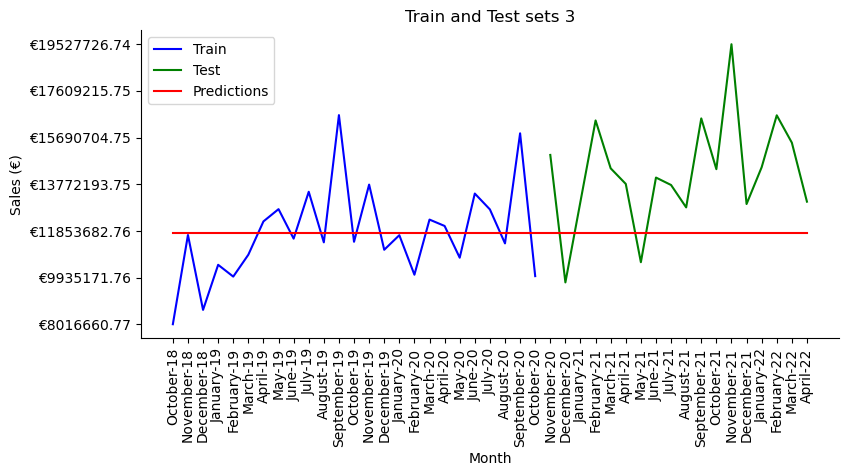

In [397]:
train_val_predictions('3', forecast_otmean3['Train'], forecast_otmean3['Test'], forecast_otmean3['Predictions'])

<a class="anchor" id="median3">
    
### Median
    
</a>

### data_agg3

In [66]:
split_list = [60,65,70,75,80,85,90]
best_split_median(split_list, data_agg3)

,Split,Train Error,Test Error
0,60,1912350.926,3913907.142
1,65,1986137.693,4036204.409
2,70,2560999.478,3553997.417
3,75,2516131.461,3794420.045
4,80,2494999.773,3988992.000
5,85,2537617.299,3959933.880
6,90,2762067.630,2749377.637


In [67]:
forecast_median3 = median_forecast(, data_agg3)
forecast_median3['Predictions']

,Date,Sales Predictions
0,2018-10-01,1.214984e+07
1,2018-11-01,1.214984e+07
2,2018-12-01,1.214984e+07
3,2019-01-01,1.214984e+07
4,2019-02-01,1.214984e+07
5,2019-03-01,1.214984e+07
6,2019-04-01,1.214984e+07
7,2019-05-01,1.214984e+07
8,2019-06-01,1.214984e+07
9,2019-07-01,1.214984e+07


In [69]:
forecast_median3['Performance']

,Measure,Train Error,Test Error
0,MAE,2070624.131,2363826.953
1,RMSE,2762067.630,2749377.637
2,R^2,-0.005,-2.834
3,MAPE (%),0.203,0.155


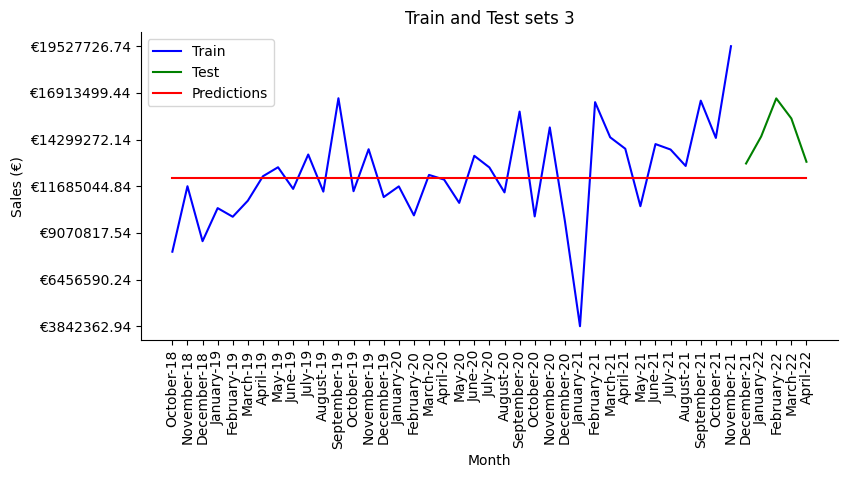

In [70]:
train_val_predictions('3', forecast_median3['Train'], forecast_median3['Test'], forecast_median3['Predictions'])

<a class="anchor" id="auto_arima3">
    
### Auto Arima
    
</a>

### data_agg3

In [164]:
split_list = [60,65,70,75,80,85,90]
best_split_autoarima(split_list, data_agg3)

,Split,Train Error,Test Error
0,60,1595475.759,3423180.803
1,65,1512058.371,3531317.635
2,70,2594548.848,3599890.007
3,75,2215123.922,2990895.280
4,80,2203252.425,2996662.103
5,85,2226480.739,2987254.629
6,90,2392006.001,2195791.966


In [168]:
forecast_autoarima3 = autoarima_forecast(90, data_agg3)
forecast_autoarima3['Predictions']

,Date,Sales Predictions
0,2018-10-01,9.899552e+06
1,2018-11-01,1.172898e+07
2,2018-12-01,9.752237e+06
3,2019-01-01,1.119442e+07
4,2019-02-01,1.249444e+07
5,2019-03-01,1.214044e+07
6,2019-04-01,1.214607e+07
7,2019-05-01,1.310412e+07
8,2019-06-01,1.320675e+07
9,2019-07-01,1.376419e+07


In [169]:
forecast_autoarima3['Performance']

,Measure,Train Error,Test Error
0,MAE,1749308.575,1674777.382
1,RMSE,2392006.001,2195791.966
2,R^2,0.247,-1.446
3,MAPE (%),0.176,0.121


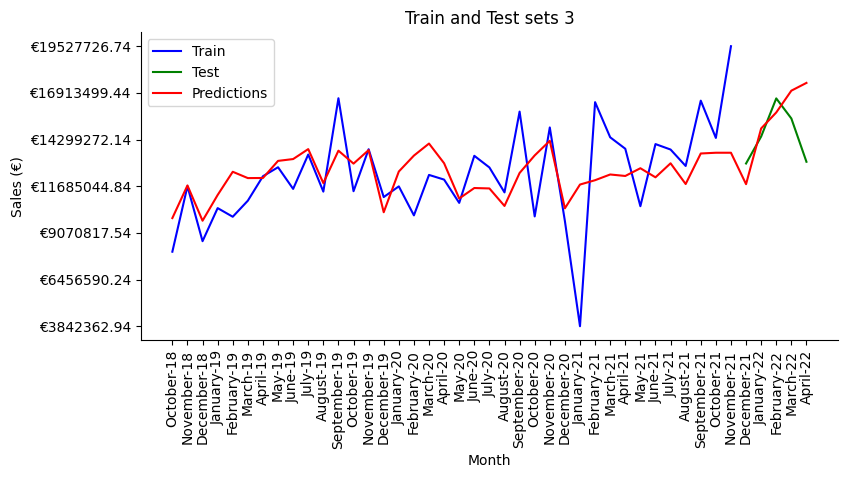

In [241]:
train_val_predictions('3', forecast_autoarima3['Train'], forecast_autoarima3['Test'], forecast_autoarima3['Predictions'])

### out_data_agg3

In [171]:
split_list = [60,65,70,75,80,85,90]
best_split_autoarima(split_list, out_data_agg3)

,Split,Train Error,Test Error
0,60,1595475.759,2514888.181
1,65,1512058.371,2729320.716
2,70,1537388.435,2840570.750
3,75,1605150.328,2645412.014
4,80,1615741.875,2647394.995
5,85,1642689.742,2745561.669
6,90,1808290.193,2357145.060


In [172]:
forecast_autoarima3_out = autoarima_forecast(90, out_data_agg3)
forecast_autoarima3_out['Predictions']

,Date,Sales Predictions
0,2018-10-01,9.826022e+06
1,2018-11-01,1.158122e+07
2,2018-12-01,8.908212e+06
3,2019-01-01,1.123838e+07
4,2019-02-01,1.211563e+07
5,2019-03-01,1.153410e+07
6,2019-04-01,1.191849e+07
7,2019-05-01,1.292869e+07
8,2019-06-01,1.270343e+07
9,2019-07-01,1.272586e+07


In [173]:
forecast_autoarima3_out['Performance']

,Measure,Train Error,Test Error
0,MAE,1403140.959,1706371.733
1,RMSE,1808290.193,2357145.060
2,R^2,0.421,-1.818
3,MAPE (%),0.113,0.126


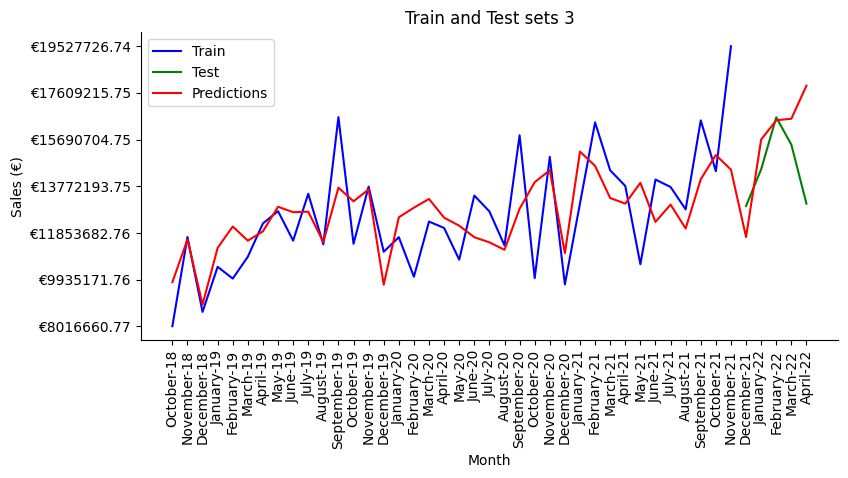

In [242]:
train_val_predictions('3', forecast_autoarima3_out['Train'], forecast_autoarima3_out['Test'], forecast_autoarima3_out['Predictions'])

<a class="anchor" id="xgboost1">
    
### XGBoost
    
</a>

### lag_data3

In [219]:
split_list = [60,65,70,75,80,85,90]
best_split_xgboost(split_list, lag_data3)

,Split,Train Error,Test Error
0,60,1.484,2577828.293
1,65,1.554,3114698.211
2,70,1.394,2770894.310
3,75,1.560,2660896.625
4,80,1.412,2468068.564
5,85,1.978,2471453.596
6,90,2.045,1118080.033


In [224]:
split_data = data_split(lag_data3, 90)
train_sales = split_data['train_sales']
test_sales = split_data['test_sales']
train_market = split_data['train_market']
test_market = split_data['test_market']

model_parameters = pd.DataFrame(columns = ['Parameters', 'Train Error', 'Test Error'])

# define the parameter grid to search over
params_grid = {
    'alpha':[0,1,2,5],
    'subsample':[0.1,0.3,0.5,1],
    'learning_rate': [0.5,0.1, 0.01, 0.001],
               'max_depth': [1, 2, 3, 5],
               'min_child_weight': [1,3,5]}
grid = ParameterGrid(params_grid)

for p in grid:   
    model = xgb.XGBRegressor(**p)
    model.fit(train_market.iloc[:,1:], train_sales)
    forecast = model.predict(pd.concat([train_market, test_market]).drop('Date', axis=1))
    error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-forecast[:len(train_sales)])**2).mean()), 3)
    error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast[len(train_sales):])**2).mean()), 3)
    model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\937343319.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

In [228]:
model_parameters['Diff']=model_parameters['Test Error']-model_parameters['Train Error']
model_parameters['|Diff|']= abs(model_parameters['Diff'])
model_parameters.sort_values('|Diff|', ascending= True).head(30)

,Parameters,Train Error,Test Error,Diff,|Diff|
50,"{'alpha': 0, 'learning_rate': 0.1, 'max_depth'...",1102013.704,1063535.178,-38478.526,38478.526
242,"{'alpha': 1, 'learning_rate': 0.1, 'max_depth'...",1102014.210,1063534.855,-38479.355,38479.355
434,"{'alpha': 2, 'learning_rate': 0.1, 'max_depth'...",1102014.194,1063534.580,-38479.614,38479.614
626,"{'alpha': 5, 'learning_rate': 0.1, 'max_depth'...",1102014.979,1063534.370,-38480.609,38480.609
243,"{'alpha': 1, 'learning_rate': 0.1, 'max_depth'...",809140.720,760376.988,-48763.732,48763.732
51,"{'alpha': 0, 'learning_rate': 0.1, 'max_depth'...",809140.637,760376.671,-48763.966,48763.966
435,"{'alpha': 2, 'learning_rate': 0.1, 'max_depth'...",809140.775,760376.641,-48764.134,48764.134
627,"{'alpha': 5, 'learning_rate': 0.1, 'max_depth'...",809141.127,760376.733,-48764.394,48764.394
450,"{'alpha': 2, 'learning_rate': 0.1, 'max_depth'...",836504.933,934598.425,98093.492,98093.492
258,"{'alpha': 1, 'learning_rate': 0.1, 'max_depth'...",836504.676,934599.044,98094.368,98094.368


In [229]:
model_parameters.iloc[50,:]['Parameters']

{'alpha': 0,
 'learning_rate': 0.1,
 'max_depth': 1,
 'min_child_weight': 1,
 'subsample': 0.5}

In [230]:
forecast_xgboost3 = xgboost_forecast(85, lag_data3, 0,0.1,1,1,0.5)

In [231]:
forecast_xgboost3['Performance']

,Measure,Train Error,Test Error
0,MAE,910875.065,1042691.660
1,RMSE,1230502.105,1242244.292
2,R^2,0.820,0.217
3,MAPE (%),0.089,0.074


In [232]:
forecast_xgboost3['Predictions']

,Date,Sales Predictions
0,2019-10-01,11916020.0
1,2019-11-01,14281901.0
2,2019-12-01,11931700.0
3,2020-01-01,11129680.0
4,2020-02-01,11569538.0
5,2020-03-01,11798920.0
6,2020-04-01,12124124.0
7,2020-05-01,10976622.0
8,2020-06-01,11939169.0
9,2020-07-01,13189497.0


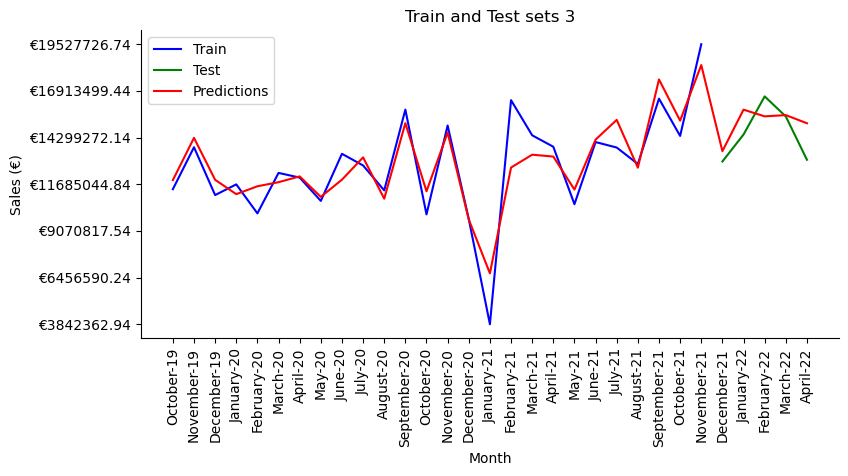

In [233]:
train_val_predictions('3', forecast_xgboost3['Train'], forecast_xgboost3['Test'], forecast_xgboost3['Predictions'])

<a class="anchor" id="xgboost1">
    
### Prophet
    
</a>

### data_agg3

In [482]:
split_list = [60,65,70,75,80,85,90]
best_split_prophet(split_list, data_agg3)

15:57:12 - cmdstanpy - INFO - Chain [1] start processing
15:57:25 - cmdstanpy - INFO - Chain [1] done processing
15:57:25 - cmdstanpy - INFO - Chain [1] start processing
15:57:44 - cmdstanpy - INFO - Chain [1] done processing
15:57:44 - cmdstanpy - INFO - Chain [1] start processing
15:57:45 - cmdstanpy - INFO - Chain [1] done processing
15:57:45 - cmdstanpy - INFO - Chain [1] start processing
15:57:45 - cmdstanpy - INFO - Chain [1] done processing
15:57:45 - cmdstanpy - INFO - Chain [1] start processing
15:57:45 - cmdstanpy - INFO - Chain [1] done processing
15:57:45 - cmdstanpy - INFO - Chain [1] start processing
15:57:45 - cmdstanpy - INFO - Chain [1] done processing
15:57:46 - cmdstanpy - INFO - Chain [1] start processing
15:57:46 - cmdstanpy - INFO - Chain [1] done processing
15:57:46 - cmdstanpy - INFO - Chain [1] start processing
15:57:46 - cmdstanpy - INFO - Chain [1] done processing


,Split,Train Error,Test Error
0,60,18.927,7532859.771
1,65,13.474,3112464.704
2,70,700754.164,2553136.149
3,75,763828.425,2773951.468
4,80,745515.726,2776062.898
5,85,733892.382,3210201.722
6,90,959637.446,2178599.044
7,year,709222.812,2891657.980


In [483]:
split_data = data_split(data_agg3, 90)
train_sales = split_data['train_sales']
test_sales = split_data['test_sales']
train_market = split_data['train_market']
test_market = split_data['test_market']
prophet_data_train = pd.concat([train_market, train_sales], axis=1)
prophet_data_train.rename(columns={'Date': 'ds', 'Adjusted Sales (€)': 'y'}, inplace=True)
future = pd.concat([train_market, test_market])
model_parameters = pd.DataFrame(columns = ['Parameters'])
for p in grid:   
    train_model =Prophet(seasonality_mode = p['seasonality_mode'],
                         changepoint_prior_scale = p['changepoint_prior_scale'],
                         changepoint_range=p['changepoint_range'],
                         seasonality_prior_scale=p['seasonality_prior_scale']
                         )
    for column in train_market.columns[1:]:
        train_model.add_regressor(column)
    train_model.fit(prophet_data_train)
    forecast = train_model.predict(future.rename(columns={'Date': 'ds'}))
    error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-forecast['yhat'][:len(train_sales)].values)**2).mean()), 3)
    error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast['yhat'][len(train_sales):].values)**2).mean()), 3)
    model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)

15:58:18 - cmdstanpy - INFO - Chain [1] start processing
15:58:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\2322381737.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:58:18 - cmdstanpy - INFO - Chain [1] start processing
15:58:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\2322381737.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:58:18 - cmdstanpy - INFO - Chain [1] start processing
15:58:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\Ap

15:58:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\2322381737.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:58:24 - cmdstanpy - INFO - Chain [1] start processing
15:58:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\2322381737.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:58:25 - cmdstanpy - INFO - Chain [1] start processing
15:58:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\2322381737.py:22: FutureW

In [484]:
model_parameters['Diff']=model_parameters['Test Error']-model_parameters['Train Error']
model_parameters['|Diff|']= abs(model_parameters['Diff'])
model_parameters.sort_values('|Diff|', ascending= True).head(30)

,Parameters,Test Error,Train Error,Diff,|Diff|
16,"{'changepoint_prior_scale': 0.3, 'changepoint_...",1743505.289,1515823.966,227681.323,227681.323
4,"{'changepoint_prior_scale': 0.1, 'changepoint_...",1778745.425,1534299.338,244446.087,244446.087
10,"{'changepoint_prior_scale': 0.1, 'changepoint_...",1778862.100,1534323.058,244539.042,244539.042
27,"{'changepoint_prior_scale': 0.5, 'changepoint_...",2308095.578,1972741.974,335353.604,335353.604
21,"{'changepoint_prior_scale': 0.3, 'changepoint_...",2391334.283,1995360.461,395973.822,395973.822
15,"{'changepoint_prior_scale': 0.3, 'changepoint_...",2411143.535,1998685.180,412458.355,412458.355
22,"{'changepoint_prior_scale': 0.3, 'changepoint_...",1894002.650,1481069.478,412933.172,412933.172
13,"{'changepoint_prior_scale': 0.3, 'changepoint_...",1925577.397,1499288.516,426288.881,426288.881
19,"{'changepoint_prior_scale': 0.3, 'changepoint_...",1921790.463,1493989.089,427801.374,427801.374
7,"{'changepoint_prior_scale': 0.1, 'changepoint_...",1984795.173,1529326.918,455468.255,455468.255


In [485]:
model_parameters.iloc[16,:]['Parameters']

{'changepoint_prior_scale': 0.3,
 'changepoint_range': 0.6,
 'seasonality_mode': 'additive',
 'seasonality_prior_scale': 0.1}

In [486]:
forecast_prophet3 = prophet_forecast(90, data_agg3,0.3, 0.6, 'additive', 0.1 )
forecast_prophet3['Predictions']

15:59:10 - cmdstanpy - INFO - Chain [1] start processing
15:59:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\514556311.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result.rename(columns={'ds': 'Date', 'yhat': 'Sales Predictions'}, inplace = True)
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\514556311.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result['Date'] = result['Date'].dt.strftime('%Y-%m-%d')


,Date,Sales Predictions
0,2018-10-01,9.268912e+06
1,2018-11-01,1.281324e+07
2,2018-12-01,8.893753e+06
3,2019-01-01,8.506851e+06
4,2019-02-01,1.156764e+07
5,2019-03-01,1.158771e+07
6,2019-04-01,1.154187e+07
7,2019-05-01,1.089228e+07
8,2019-06-01,1.180175e+07
9,2019-07-01,1.240294e+07


In [487]:
forecast_prophet3['Performance']

,Measure,Train Error,Test Error
0,MAE,1176954.809,1480955.538
1,RMSE,1515823.966,1743505.289
2,R^2,0.697,-0.542
3,MAPE (%),0.113,0.106


In [488]:
forecast_prophet3['Predictions']

,Date,Sales Predictions
0,2018-10-01,9.268912e+06
1,2018-11-01,1.281324e+07
2,2018-12-01,8.893753e+06
3,2019-01-01,8.506851e+06
4,2019-02-01,1.156764e+07
5,2019-03-01,1.158771e+07
6,2019-04-01,1.154187e+07
7,2019-05-01,1.089228e+07
8,2019-06-01,1.180175e+07
9,2019-07-01,1.240294e+07


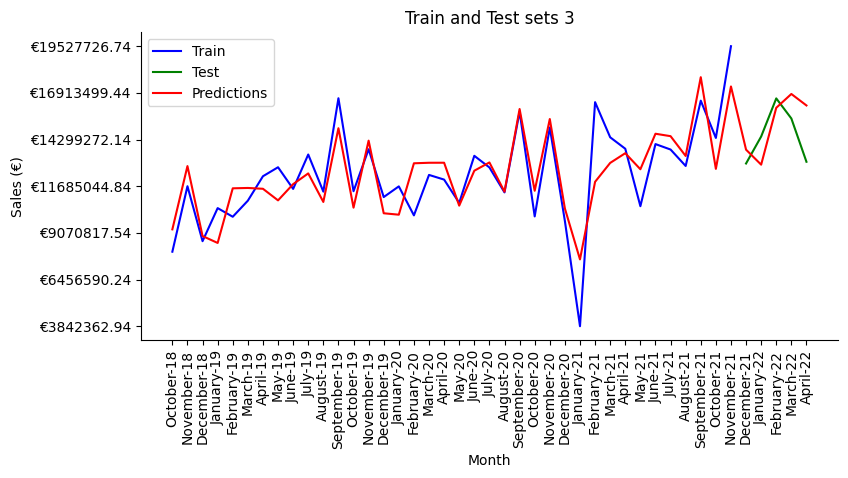

In [489]:
train_val_predictions('3', forecast_prophet3['Train'], forecast_prophet3['Test'], forecast_prophet3['Predictions'])

### Final Model

In [1327]:
# Values we have to predict
test_set[test_set['Mapped_GCK']=='#3']

,Month Year,Mapped_GCK,Sales_EUR
0,2022-03-01,#3,NaN
1,2022-06-01,#3,NaN
2,2022-07-01,#3,NaN
3,2022-08-01,#3,NaN
4,2022-09-01,#3,NaN
5,2022-10-01,#3,NaN
6,2022-11-01,#3,NaN
7,2022-12-01,#3,NaN
8,2023-01-01,#3,NaN
9,2023-02-01,#3,NaN


In [1328]:
# Arranging the dataset that will be used for the prediction
test_data_3=pd.DataFrame(index=test_set[test_set['Mapped_GCK']=='#3']['Month Year'],columns=lag_data3.columns).drop(
        columns='Unnamed: 0')
test_data_3.head()

,Producer Prices Electrical equipment United States,Production Index Electrical equipment Italy,Producer Prices Electrical equipment United Kingdom,Production Index Machinery & Electricals United Kingdom,Production Index Machinery and equipment n.e.c. United States,Adjusted Sales (€)
Month Year,,,,,,
2022-03-01,NaN,NaN,NaN,NaN,NaN,NaN
2022-06-01,NaN,NaN,NaN,NaN,NaN,NaN
2022-07-01,NaN,NaN,NaN,NaN,NaN,NaN
2022-08-01,NaN,NaN,NaN,NaN,NaN,NaN
2022-09-01,NaN,NaN,NaN,NaN,NaN,NaN


In [1329]:
# Considering that the variables used have lags and that we have already predicted for some of the features, 
#we already have values we can fill
test_data_3.iloc[:6,0]=market_data_pred['Producer Prices Electrical equipment United States'][-6:].values
test_data_3.iloc[:4,1]=market_data_pred['Production Index Electrical equipment Italy  '][-4:].values
test_data_3.iloc[:,2]=market_data_pred['Producer Prices Electrical equipment United Kingdom '][207:217].values
test_data_3.iloc[:9,3]=market_data_pred['Production Index Machinery & Electricals United Kingdom'][-9:].values
test_data_3.iloc[0,4]=market_data_pred['Production Index Machinery and equipment n.e.c. United States '][-1:].values[0]
test_data_3.iloc[-9:,4]=test_data_1.iloc[1:,3]

#### Producer Prices Electrical equipment United States

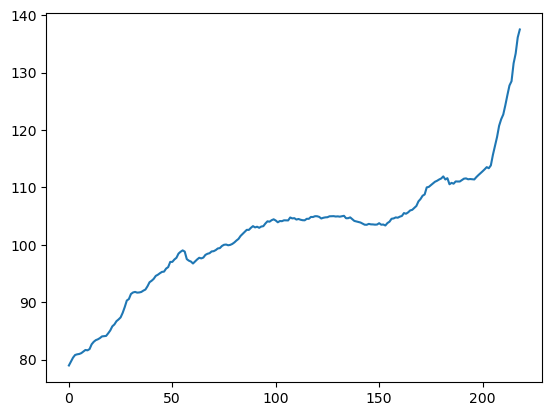

In [1330]:
plt.plot(market_data_pred.loc[:,'Producer Prices Electrical equipment United States'])

In [1331]:
predict_ppeeus=pd.DataFrame(market_data_pred.set_index('Unnamed: 0').loc[:,
            'Producer Prices Electrical equipment United States'].dropna()).reset_index().rename(columns={'Unnamed: 0':'ds',
            'Producer Prices Electrical equipment United States':'y'})
predict_ppeeus.head()

,ds,y
0,2004-02-01,78.969864
1,2004-03-01,79.673569
2,2004-04-01,80.337639
3,2004-05-01,80.798828
4,2004-06-01,80.913490


In [1332]:
prophet_ppeeus=Prophet()
prophet_ppeeus.fit(predict_ppeeus)

23:10:55 - cmdstanpy - INFO - Chain [1] start processing
23:10:55 - cmdstanpy - INFO - Chain [1] done processing


In [1333]:
future = prophet_ppeec.make_future_dataframe(periods=4,freq='m')
forecast = prophet_ppeec.predict(future)

# Fill missing values
test_data_3.iloc[-4:,0]=forecast['yhat'][-4:]

#### Production Index Electrical equipment Italy

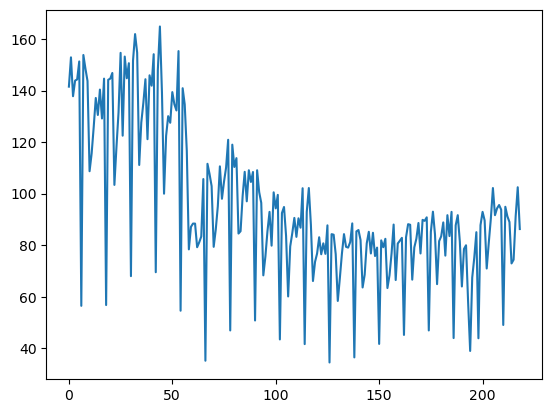

In [1334]:
plt.plot(market_data_pred.loc[:,'Production Index Electrical equipment Italy  '])

In [1335]:
predict_pieei=pd.DataFrame(market_data_pred.set_index('Unnamed: 0').loc[:,
            'Production Index Electrical equipment Italy  '].dropna()).reset_index().rename(columns={'Unnamed: 0':'ds',
            'Production Index Electrical equipment Italy  ':'y'})
predict_pieei.head()

,ds,y
0,2004-02-01,141.510864
1,2004-03-01,152.880234
2,2004-04-01,137.796875
3,2004-05-01,143.860535
4,2004-06-01,144.315308


In [1336]:
prophet_pieei=Prophet()
prophet_pieei.fit(predict_pieei)

23:10:59 - cmdstanpy - INFO - Chain [1] start processing
23:10:59 - cmdstanpy - INFO - Chain [1] done processing


In [1337]:
future = prophet_pieei.make_future_dataframe(periods=6,freq='m')
forecast = prophet_pieei.predict(future)

# Fill missing values
test_data_3.iloc[-6:,1]=forecast['yhat'][-6:]

#### Production Index Machinery & Electricals United Kingdom

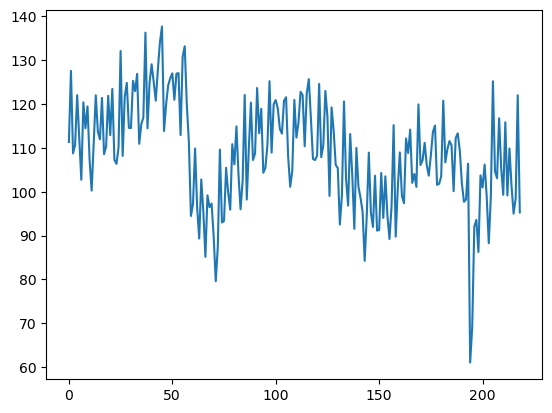

In [1338]:
plt.plot(market_data_pred.loc[:,'Production Index Machinery & Electricals United Kingdom'])

In [1339]:
test_data_3.iloc[-1,3]=np.mean(market_data_pred.loc[:,'Production Index Machinery & Electricals United Kingdom'])

In [1340]:
final_3 = XGBRegressor(alpha=0, subsample=0.5, learning_rate=0.1, max_depth=1,
                           min_child_weight=1)

final_3.fit(lag_data3.drop(columns='Adjusted Sales (€)').iloc[:,1:], lag_data3['Adjusted Sales (€)'])
        
future = pd.DataFrame(test_data_3.iloc[:,:-1]).astype(float)
forecast = final_3.predict(future)

In [1342]:
final_predictions_3=list(forecast)
final_predictions_3

[13847199.0,
 14955788.0,
 16671588.0,
 13774605.0,
 13169405.0,
 13894429.0,
 16021500.0,
 11298930.0,
 16238522.0,
 15741882.0]

<a class="anchor" id="gck4">
    
## Product Group 4
    
</a>

<a class="anchor" id="mean1">
    
### Mean
    
</a>

### data_agg4

In [235]:
split_list = [60,65,70,75,80,85,90]
best_split_mean(split_list, data_agg4)

,Split,Train Error,Test Error
0,60,127247.961,190329.657
1,65,123386.488,200666.907
2,70,150047.925,167245.915
3,75,151021.278,167110.206
4,80,168468.247,95229.175
5,85,165027.944,93450.126
6,90,161089.526,103474.435


In [238]:
forecast_mean4 = mean_forecast(85, data_agg4)

In [239]:
forecast_mean4['Performance']

,Measure,Train Error,Test Error
0,MAE,122369.565,81550.294
1,RMSE,165027.944,93450.126
2,R^2,0.000,-0.887
3,MAPE (%),0.419,0.303


In [240]:
forecast_mean4['Predictions']

,Date,Sales Predictions
0,2018-10-01,378105.285787
1,2018-11-01,378105.285787
2,2018-12-01,378105.285787
3,2019-01-01,378105.285787
4,2019-02-01,378105.285787
5,2019-03-01,378105.285787
6,2019-04-01,378105.285787
7,2019-05-01,378105.285787
8,2019-06-01,378105.285787
9,2019-07-01,378105.285787


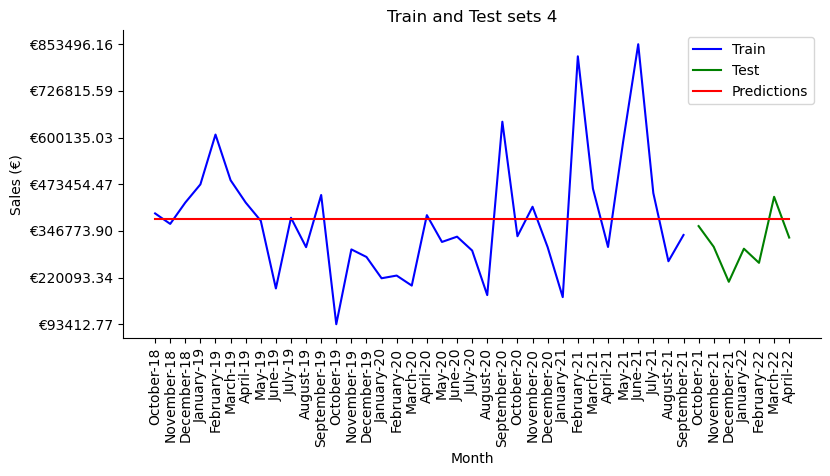

In [241]:
train_val_predictions('4', forecast_mean4['Train'], forecast_mean4['Test'], forecast_mean4['Predictions'])

### out_data_agg4

In [242]:
split_list = [60,65,70,75,80,85,90]
best_split_mean(split_list, out_data_agg4)

,Split,Train Error,Test Error
0,60,127247.961,153574.053
1,65,123386.488,161499.023
2,70,150047.925,105888.841
3,75,151021.278,91891.869
4,80,149373.257,88052.672
5,85,146362.343,87343.676
6,90,142845.259,97854.120


In [243]:
forecast_otmean4 = mean_forecast(85, out_data_agg4)

In [244]:
forecast_otmean4['Performance']

,Measure,Train Error,Test Error
0,MAE,112344.175,74914.180
1,RMSE,146362.343,87343.676
2,R^2,0.000,-0.648
3,MAPE (%),0.399,0.278


In [245]:
forecast_otmean4['Predictions']

,Date,Sales Predictions
0,2018-10-01,368814.726352
1,2018-11-01,368814.726352
2,2018-12-01,368814.726352
3,2019-01-01,368814.726352
4,2019-02-01,368814.726352
5,2019-03-01,368814.726352
6,2019-04-01,368814.726352
7,2019-05-01,368814.726352
8,2019-06-01,368814.726352
9,2019-07-01,368814.726352


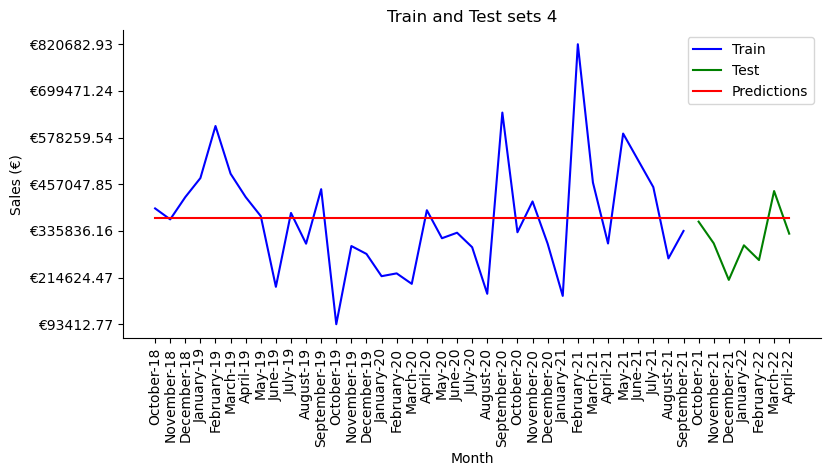

In [246]:
train_val_predictions('4', forecast_otmean4['Train'], forecast_otmean4['Test'], forecast_otmean4['Predictions'])

<a class="anchor" id="median4">
    
### Median
    
</a>

### data_agg4

In [72]:
split_list = [60,65,70,75,80,85,90]
best_split_median(split_list, data_agg4)

,Split,Train Error,Test Error
0,60,127999.928,194534.952
1,65,124258.507,205229.145
2,70,150492.535,169257.698
3,75,151962.710,168658.072
4,80,168949.163,86036.500
5,85,167286.196,77288.847
6,90,163490.854,87472.878


In [73]:
forecast_median4 = median_forecast(85, data_agg4)
forecast_median4['Predictions']

,Date,Sales Predictions
0,2018-10-01,350710.96338
1,2018-11-01,350710.96338
2,2018-12-01,350710.96338
3,2019-01-01,350710.96338
4,2019-02-01,350710.96338
5,2019-03-01,350710.96338
6,2019-04-01,350710.96338
7,2019-05-01,350710.96338
8,2019-06-01,350710.96338
9,2019-07-01,350710.96338


In [74]:
forecast_median4['Performance']

,Measure,Train Error,Test Error
0,MAE,121464.615,64585.536
1,RMSE,167286.196,77288.847
2,R^2,-0.028,-0.290
3,MAPE (%),0.387,0.236


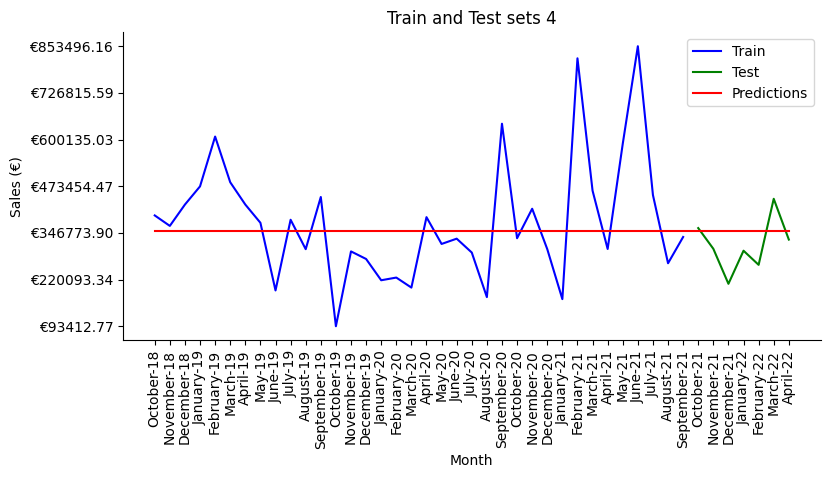

In [243]:
train_val_predictions('4', forecast_median4['Train'], forecast_median4['Test'], forecast_median4['Predictions'])

<a class="anchor" id="auto_arima4">
    
### Auto Arima
    
</a>

### data_agg4

In [175]:
split_list = [60,65,70,75,80,85,90]
best_split_autoarima(split_list, data_agg4)

,Split,Train Error,Test Error
0,60,114242.111,233222.825
1,65,114572.173,226698.019
2,70,173441.999,223976.696
3,75,148384.921,146784.540
4,80,159218.096,92856.590
5,85,156652.556,73149.511
6,90,152771.637,78825.312


In [176]:
forecast_autoarima4 = autoarima_forecast(85, data_agg4)
forecast_autoarima4['Predictions']

,Date,Sales Predictions
0,2018-10-01,368761.535643
1,2018-11-01,340409.767898
2,2018-12-01,326627.755655
3,2019-01-01,407637.120721
4,2019-02-01,378291.003534
5,2019-03-01,379158.297129
6,2019-04-01,305811.654507
7,2019-05-01,367847.629435
8,2019-06-01,345461.438544
9,2019-07-01,334260.050039


In [177]:
forecast_autoarima4['Performance']

,Measure,Train Error,Test Error
0,MAE,121215.171,63241.806
1,RMSE,156652.556,73149.511
2,R^2,0.099,-0.156
3,MAPE (%),0.408,0.235


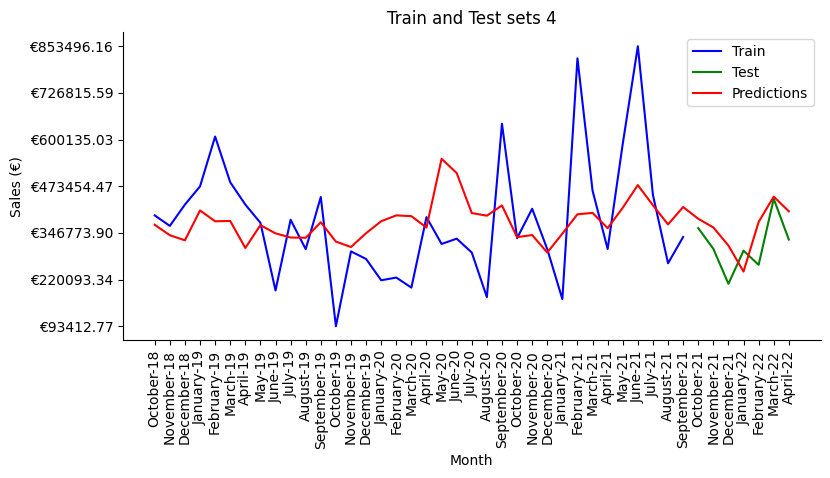

In [244]:
train_val_predictions('4', forecast_autoarima4['Train'], forecast_autoarima4['Test'], forecast_autoarima4['Predictions'])

### out_data_agg4

In [179]:
split_list = [60,65,70,75,80,85,90]
best_split_autoarima(split_list, out_data_agg4)

,Split,Train Error,Test Error
0,60,114242.111,199935.183
1,65,114572.173,189321.902
2,70,173441.999,173789.490
3,75,148384.921,74742.070
4,80,144941.271,79668.093
5,85,142232.886,66630.916
6,90,138640.977,73638.812


In [180]:
forecast_autoarima4_out = autoarima_forecast(85, out_data_agg4)
forecast_autoarima4_out['Predictions']

,Date,Sales Predictions
0,2018-10-01,371098.088355
1,2018-11-01,352198.506139
2,2018-12-01,339580.761268
3,2019-01-01,397660.172914
4,2019-02-01,374063.461994
5,2019-03-01,375314.313894
6,2019-04-01,325906.323880
7,2019-05-01,369007.125920
8,2019-06-01,350979.052462
9,2019-07-01,342450.288888


In [181]:
forecast_autoarima4_out['Performance']

,Measure,Train Error,Test Error
0,MAE,110049.863,54591.302
1,RMSE,142232.886,66630.916
2,R^2,0.056,0.041
3,MAPE (%),0.385,0.206


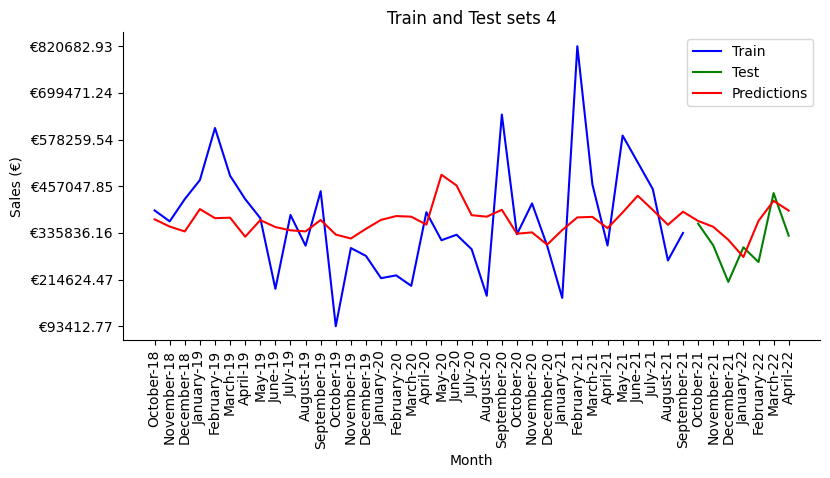

In [245]:
train_val_predictions('4', forecast_autoarima4_out['Train'], forecast_autoarima4_out['Test'], forecast_autoarima4_out['Predictions'])

<a class="anchor" id="xgboost1">
    
### XGBoost
    
</a>

### lag_data4

In [220]:
split_list = [60,65,70,75,80,85,90]
best_split_xgboost(split_list, lag_data4)

,Split,Train Error,Test Error
0,60,0.052,236523.754
1,65,0.060,161757.930
2,70,0.056,206568.386
3,75,0.048,109212.879
4,80,0.054,68241.417
5,85,0.050,81923.648
6,90,0.053,62093.893


In [194]:
split_data = data_split(lag_data4, 90)
train_sales = split_data['train_sales']
test_sales = split_data['test_sales']
train_market = split_data['train_market']
test_market = split_data['test_market']

model_parameters = pd.DataFrame(columns = ['Parameters', 'Train Error', 'Test Error'])

# define the parameter grid to search over
params_grid = {
    'alpha':[0,1,2,5],
    'subsample':[0.1,0.3,0.5,1],
    'learning_rate': [0.5,0.1, 0.01, 0.001],
               'max_depth': [1, 2, 3, 5, 6, 8],
               'min_child_weight': [1,3, 5]}
grid = ParameterGrid(params_grid)

for p in grid:   
    model = xgb.XGBRegressor(**p)
    model.fit(train_market.iloc[:,1:], train_sales)
    forecast = model.predict(pd.concat([train_market, test_market]).drop('Date', axis=1))
    error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-forecast[:len(train_sales)])**2).mean()), 3)
    error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast[len(train_sales):])**2).mean()), 3)
    model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3763910317.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

In [195]:
model_parameters['Diff']=model_parameters['Test Error']-model_parameters['Train Error']
model_parameters['|Diff|']=abs(model_parameters['Diff'])
model_parameters.sort_values('|Diff|', ascending= True).head(30)

,Parameters,Train Error,Test Error,Diff,|Diff|
75,"{'alpha': 0, 'learning_rate': 0.1, 'max_depth'...",63632.692,59963.965,-3668.727,3668.727
363,"{'alpha': 1, 'learning_rate': 0.1, 'max_depth'...",63632.810,59963.903,-3668.907,3668.907
651,"{'alpha': 2, 'learning_rate': 0.1, 'max_depth'...",63632.924,59963.852,-3669.072,3669.072
939,"{'alpha': 5, 'learning_rate': 0.1, 'max_depth'...",63633.294,59963.689,-3669.605,3669.605
79,"{'alpha': 0, 'learning_rate': 0.1, 'max_depth'...",77324.998,72044.640,-5280.358,5280.358
367,"{'alpha': 1, 'learning_rate': 0.1, 'max_depth'...",77325.075,72044.551,-5280.524,5280.524
655,"{'alpha': 2, 'learning_rate': 0.1, 'max_depth'...",77325.169,72044.463,-5280.706,5280.706
943,"{'alpha': 5, 'learning_rate': 0.1, 'max_depth'...",77325.419,72044.181,-5281.238,5281.238
954,"{'alpha': 5, 'learning_rate': 0.1, 'max_depth'...",58419.054,64025.203,5606.149,5606.149
666,"{'alpha': 2, 'learning_rate': 0.1, 'max_depth'...",58418.711,64025.546,5606.835,5606.835


In [196]:
model_parameters.iloc[75,:]['Parameters']

{'alpha': 0,
 'learning_rate': 0.1,
 'max_depth': 1,
 'min_child_weight': 1,
 'subsample': 1}

In [197]:
forecast_xgboost4 = xgboost_forecast(90,lag_data4,0,0.1,1,1,1)

In [198]:
forecast_xgboost4['Performance']

,Measure,Train Error,Test Error
0,MAE,52864.895,55326.855
1,RMSE,63632.692,59963.965
2,R^2,0.855,0.194
3,MAPE (%),0.200,0.162


In [199]:
forecast_xgboost4['Predictions']

,Date,Sales Predictions
0,2019-04-01,327093.906250
1,2019-05-01,327093.906250
2,2019-06-01,298442.906250
3,2019-07-01,327093.906250
4,2019-08-01,284736.343750
5,2019-09-01,327093.906250
6,2019-10-01,193588.859375
7,2019-11-01,284603.437500
8,2019-12-01,246836.531250
9,2020-01-01,251310.703125


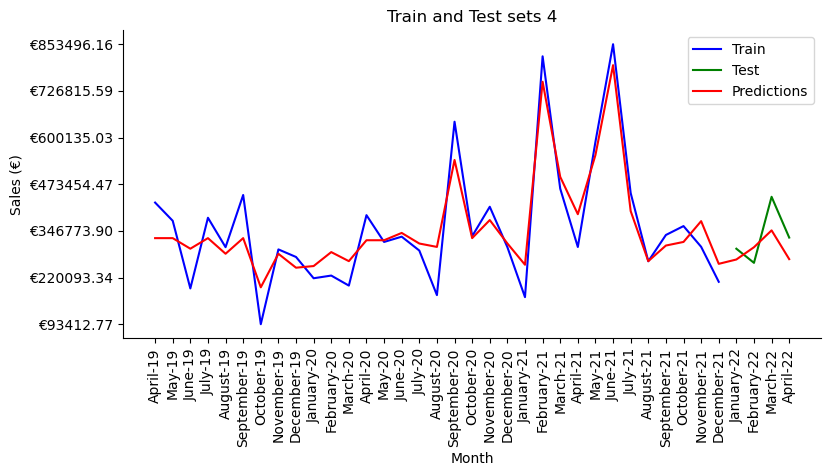

In [200]:
train_val_predictions('4', forecast_xgboost4['Train'], forecast_xgboost4['Test'], forecast_xgboost4['Predictions'])

<a class="anchor" id="xgboost1">
    
### Prophet
    
</a>

### data_agg4

In [359]:
split_list = [60,65,70,75,80,85,90]
best_split_prophet(split_list, data_agg4)

14:50:31 - cmdstanpy - INFO - Chain [1] start processing
14:51:10 - cmdstanpy - INFO - Chain [1] done processing
14:51:11 - cmdstanpy - INFO - Chain [1] start processing
14:51:11 - cmdstanpy - INFO - Chain [1] done processing
14:51:11 - cmdstanpy - INFO - Chain [1] start processing
14:51:11 - cmdstanpy - INFO - Chain [1] done processing
14:51:12 - cmdstanpy - INFO - Chain [1] start processing
14:51:12 - cmdstanpy - INFO - Chain [1] done processing
14:51:12 - cmdstanpy - INFO - Chain [1] start processing
14:51:12 - cmdstanpy - INFO - Chain [1] done processing
14:51:12 - cmdstanpy - INFO - Chain [1] start processing
14:51:12 - cmdstanpy - INFO - Chain [1] done processing
14:51:13 - cmdstanpy - INFO - Chain [1] start processing
14:51:13 - cmdstanpy - INFO - Chain [1] done processing
14:51:13 - cmdstanpy - INFO - Chain [1] start processing
14:51:13 - cmdstanpy - INFO - Chain [1] done processing


,Split,Train Error,Test Error
0,60,4.916,360787.377
1,65,24076.896,454135.300
2,70,31196.104,339695.383
3,75,50434.488,249697.997
4,80,66553.622,272821.689
5,85,75331.407,205888.292
6,90,74374.730,213871.041
7,year,50788.820,232278.549


In [368]:
split_data = data_split(data_agg4, 70)
train_sales = split_data['train_sales']
test_sales = split_data['test_sales']
train_market = split_data['train_market']
test_market = split_data['test_market']
prophet_data_train = pd.concat([train_market, train_sales], axis=1)
prophet_data_train.rename(columns={'Date': 'ds', 'Adjusted Sales (€)': 'y'}, inplace=True)
future = pd.concat([train_market, test_market])
model_parameters = pd.DataFrame(columns = ['Parameters'])
for p in grid:   
    train_model =Prophet(seasonality_mode = p['seasonality_mode'],
                         changepoint_prior_scale = p['changepoint_prior_scale'],
                         changepoint_range=p['changepoint_range'],
                         seasonality_prior_scale=p['seasonality_prior_scale']
                         )
    for column in train_market.columns[1:]:
        train_model.add_regressor(column)
    train_model.fit(prophet_data_train)
    forecast = train_model.predict(future.rename(columns={'Date': 'ds'}))
    error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-forecast['yhat'][:len(train_sales)].values)**2).mean()), 3)
    error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast['yhat'][len(train_sales):].values)**2).mean()), 3)
    model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)

14:55:19 - cmdstanpy - INFO - Chain [1] start processing
14:55:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\1038126552.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
14:55:19 - cmdstanpy - INFO - Chain [1] start processing
14:55:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\1038126552.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
14:55:20 - cmdstanpy - INFO - Chain [1] start processing
14:55:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\Ap

14:55:27 - cmdstanpy - INFO - Chain [1] start processing
14:55:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\1038126552.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
14:55:27 - cmdstanpy - INFO - Chain [1] start processing
14:55:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\1038126552.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
14:55:28 - cmdstanpy - INFO - Chain [1] start processing
14:55:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\Ap

In [369]:
model_parameters['Diff']=model_parameters['Test Error']-model_parameters['Train Error']
model_parameters['|Diff|']= abs(model_parameters['Diff'])
model_parameters.sort_values('|Diff|', ascending= True).head(30)

,Parameters,Test Error,Train Error,Diff,|Diff|
3,"{'changepoint_prior_scale': 0.1, 'changepoint_...",128924.585,123773.415,5151.170,5151.170
9,"{'changepoint_prior_scale': 0.1, 'changepoint_...",128979.944,123751.416,5228.528,5228.528
6,"{'changepoint_prior_scale': 0.1, 'changepoint_...",139625.064,133090.525,6534.539,6534.539
0,"{'changepoint_prior_scale': 0.1, 'changepoint_...",139625.721,133089.913,6535.808,6535.808
15,"{'changepoint_prior_scale': 0.3, 'changepoint_...",158874.510,118258.268,40616.242,40616.242
21,"{'changepoint_prior_scale': 0.3, 'changepoint_...",159018.244,118263.220,40755.024,40755.024
27,"{'changepoint_prior_scale': 0.5, 'changepoint_...",200116.399,114152.780,85963.619,85963.619
33,"{'changepoint_prior_scale': 0.5, 'changepoint_...",200599.758,114135.666,86464.092,86464.092
1,"{'changepoint_prior_scale': 0.1, 'changepoint_...",187237.693,95543.109,91694.584,91694.584
7,"{'changepoint_prior_scale': 0.1, 'changepoint_...",187473.093,95563.506,91909.587,91909.587


In [370]:
model_parameters.iloc[3,:]['Parameters']

{'changepoint_prior_scale': 0.1,
 'changepoint_range': 0.6,
 'seasonality_mode': 'additive',
 'seasonality_prior_scale': 0.01}

In [371]:
forecast_prophet4 = prophet_forecast(85, data_agg4,0.1, 0.6, 'additive', 0.01 )
forecast_prophet4['Predictions']

14:56:44 - cmdstanpy - INFO - Chain [1] start processing
14:56:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\514556311.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result.rename(columns={'ds': 'Date', 'yhat': 'Sales Predictions'}, inplace = True)
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\514556311.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result['Date'] = result['Date'].dt.strftime('%Y-%m-%d')


,Date,Sales Predictions
0,2018-10-01,411987.153560
1,2018-11-01,440546.322344
2,2018-12-01,381610.383637
3,2019-01-01,276295.072902
4,2019-02-01,467130.924641
5,2019-03-01,477899.860436
6,2019-04-01,385573.597560
7,2019-05-01,407699.450350
8,2019-06-01,481931.815681
9,2019-07-01,353562.970672


In [372]:
forecast_prophet4['Performance']

,Measure,Train Error,Test Error
0,MAE,97461.584,86269.002
1,RMSE,127142.034,93556.674
2,R^2,0.406,-0.891
3,MAPE (%),0.338,0.285


In [373]:
forecast_prophet4['Predictions']

,Date,Sales Predictions
0,2018-10-01,411987.153560
1,2018-11-01,440546.322344
2,2018-12-01,381610.383637
3,2019-01-01,276295.072902
4,2019-02-01,467130.924641
5,2019-03-01,477899.860436
6,2019-04-01,385573.597560
7,2019-05-01,407699.450350
8,2019-06-01,481931.815681
9,2019-07-01,353562.970672


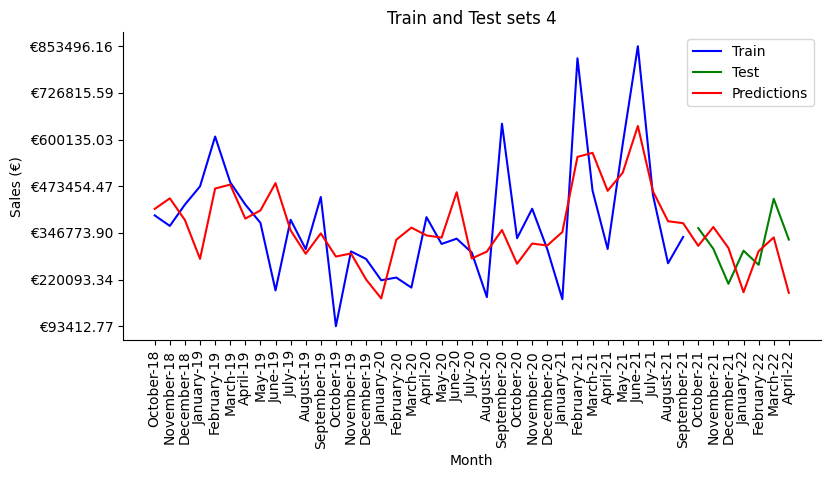

In [374]:
train_val_predictions('4', forecast_prophet4['Train'], forecast_prophet4['Test'], forecast_prophet4['Predictions'])

### Final Model

In [1343]:
# Values we have to predict
test_set[test_set['Mapped_GCK']=='#4']

,Month Year,Mapped_GCK,Sales_EUR
10,2022-03-01,#4,NaN
11,2022-06-01,#4,NaN
12,2022-07-01,#4,NaN
13,2022-08-01,#4,NaN
14,2022-09-01,#4,NaN
15,2022-10-01,#4,NaN
16,2022-11-01,#4,NaN
17,2022-12-01,#4,NaN
18,2023-01-01,#4,NaN
19,2023-02-01,#4,NaN


In [1344]:
# Arranging the dataset that will be used for the prediction
test_data_4=pd.DataFrame(index=test_set[test_set['Mapped_GCK']=='#4']['Month Year'],columns=lag_data4.columns).drop(
        columns='Unnamed: 0')
test_data_4.head()

,Production Index Machinery & Electricals France,Production Index Machinery and equipment n.e.c. Italy,Production Index Machinery and equipment n.e.c. Japan,Shipments Index Machinery & Electricals Japan,Adjusted Sales (€)
Month Year,,,,,
2022-03-01,NaN,NaN,NaN,NaN,NaN
2022-06-01,NaN,NaN,NaN,NaN,NaN
2022-07-01,NaN,NaN,NaN,NaN,NaN
2022-08-01,NaN,NaN,NaN,NaN,NaN
2022-09-01,NaN,NaN,NaN,NaN,NaN


In [1345]:
# Considering that the variables used have lags and that we have already predicted for some of the features, 
#we already have values we can fill
test_data_4.iloc[:,0]=market_data_pred['Production Index Machinery & Electricals France'][-10:].values
test_data_4.iloc[:5,1]=market_data_pred['Production Index Machinery and equipment n.e.c. Italy '][-5:]
test_data_4.iloc[:,2]=market_data_pred['Production Index Machinery and equipment n.e.c. Japan '][-10:].values
test_data_4.iloc[:,3]=market_data_pred['Shipments Index Machinery & Electricals Japan'][-10:].values

#### Production Index Machinery and equipment n.e.c. Italy 

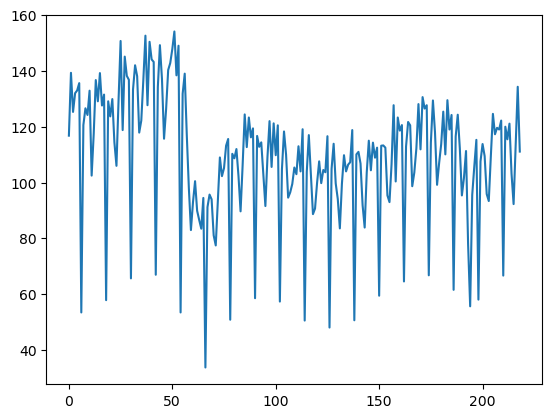

In [1346]:
plt.plot(market_data_pred['Production Index Machinery and equipment n.e.c. Italy '])

In [1347]:
predict_pimei=pd.DataFrame(market_data_pred.set_index('Unnamed: 0').loc[:,
            'Production Index Machinery and equipment n.e.c. Italy '].dropna()).reset_index().rename(columns={'Unnamed: 0':'ds',
            'Production Index Machinery and equipment n.e.c. Italy ':'y'})
predict_pimei.head()

,ds,y
0,2004-02-01,116.790276
1,2004-03-01,139.288391
2,2004-04-01,125.289566
3,2004-05-01,131.988998
4,2004-06-01,132.988922


In [1348]:
prophet_pimei=Prophet()
prophet_pimei.fit(predict_pieei)

23:12:41 - cmdstanpy - INFO - Chain [1] start processing
23:12:41 - cmdstanpy - INFO - Chain [1] done processing


In [1349]:
future = prophet_pieei.make_future_dataframe(periods=5,freq='m')
forecast = prophet_pieei.predict(future)

# Fill missing values
test_data_4.iloc[-5:,1]=forecast['yhat'][-5:]

In [1351]:
final_4 = XGBRegressor(alpha=0, subsample=1, learning_rate=0.1, max_depth=1,
                           min_child_weight=1)

final_4.fit(lag_data4.drop(columns='Adjusted Sales (€)').iloc[:,1:], lag_data4['Adjusted Sales (€)'])
        
future = pd.DataFrame(test_data_4.iloc[:,:-1]).astype(float)
forecast = final_4.predict(future)

final_predictions_4=list(forecast)
final_predictions_4

[325405.9,
 290607.5,
 325405.9,
 183936.62,
 325405.9,
 325405.9,
 308531.22,
 319419.03,
 416345.56,
 308531.22]

<a class="anchor" id="gck5">
    
## Product Group 5
    
</a>

<a class="anchor" id="mean1">
    
### Mean
    
</a>

### data_agg5

In [247]:
split_list = [60,65,70,75,80,85,90]
best_split_mean(split_list, data_agg5)

,Split,Train Error,Test Error
0,60,3393033.733,4361186.372
1,65,3270039.348,4623049.110
2,70,3706434.971,4089531.093
3,75,3614265.751,4430136.155
4,80,3535325.080,4793698.440
5,85,3989754.403,2579847.911
6,90,3895076.160,2932282.305


In [248]:
forecast_mean5 = mean_forecast(60, data_agg5)

In [249]:
forecast_mean5['Performance']

,Measure,Train Error,Test Error
0,MAE,2899046.195,3040989.503
1,RMSE,3393033.733,4361186.372
2,R^2,0.000,-0.080
3,MAPE (%),0.410,0.512


In [250]:
forecast_mean5['Predictions']

,Date,Sales Predictions
0,2018-10-01,9.637193e+06
1,2018-11-01,9.637193e+06
2,2018-12-01,9.637193e+06
3,2019-01-01,9.637193e+06
4,2019-02-01,9.637193e+06
5,2019-03-01,9.637193e+06
6,2019-04-01,9.637193e+06
7,2019-05-01,9.637193e+06
8,2019-06-01,9.637193e+06
9,2019-07-01,9.637193e+06


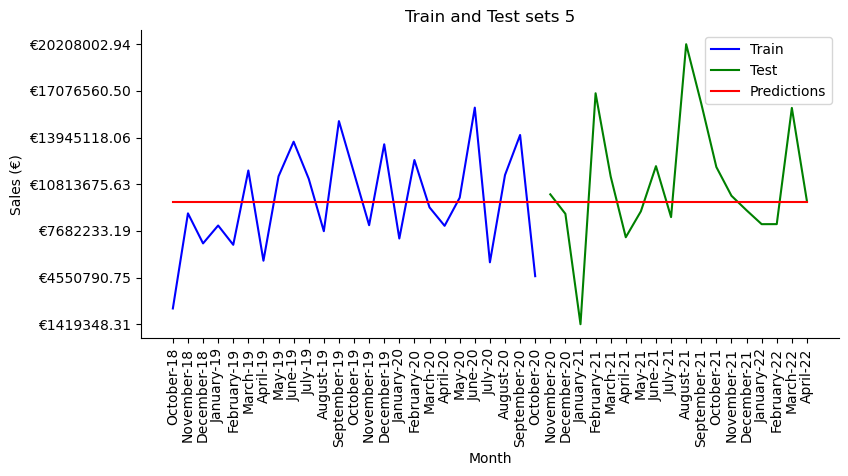

In [251]:
train_val_predictions('5', forecast_mean5['Train'], forecast_mean5['Test'], forecast_mean5['Predictions'])

<a class="anchor" id="median5">
    
### Median
    
</a>

### data_agg5

In [84]:
split_list = [60,65,70,75,80,85,90]
best_split_median(split_list, data_agg5)

,Split,Train Error,Test Error
0,60,3413942.253,4478831.366
1,65,3290425.051,4744256.860
2,70,3707026.447,4115855.077
3,75,3639635.581,4663722.547
4,80,3566909.011,5061610.865
5,85,4020221.530,2689828.727
6,90,3898087.166,2939304.190


In [85]:
forecast_median5 = median_forecast(85, data_agg5)
forecast_median5['Predictions']

,Date,Sales Predictions
0,2018-10-01,9.585925e+06
1,2018-11-01,9.585925e+06
2,2018-12-01,9.585925e+06
3,2019-01-01,9.585925e+06
4,2019-02-01,9.585925e+06
5,2019-03-01,9.585925e+06
6,2019-04-01,9.585925e+06
7,2019-05-01,9.585925e+06
8,2019-06-01,9.585925e+06
9,2019-07-01,9.585925e+06


In [86]:
forecast_median5['Performance']

,Measure,Train Error,Test Error
0,MAE,3182777.908,1812175.506
1,RMSE,4020221.530,2689828.727
2,R^2,-0.015,-0.106
3,MAPE (%),0.509,0.152


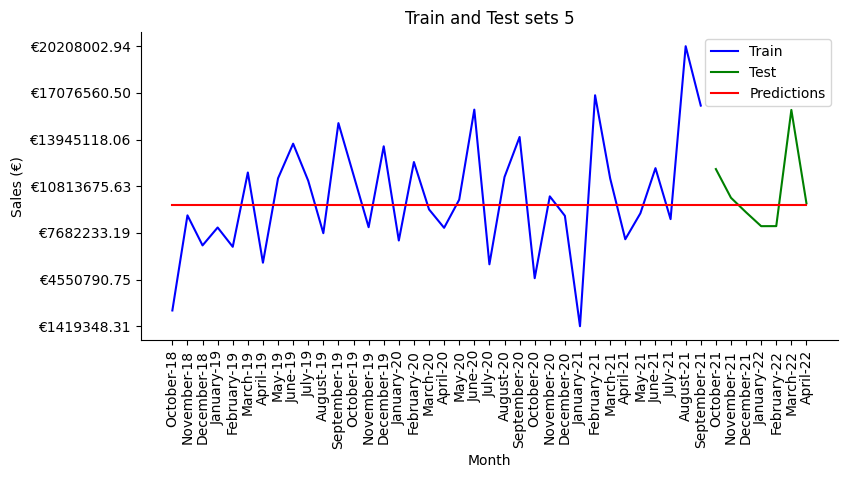

In [87]:
train_val_predictions('5', forecast_median5['Train'], forecast_median5['Test'], forecast_median5['Predictions'])

<a class="anchor" id="auto_arima5">
    
### Auto Arima
    
</a>

### data_agg5

In [183]:
split_list = [60,65,70,75,80,85,90]
best_split_autoarima(split_list, data_agg5)

,Split,Train Error,Test Error
0,60,3034436.286,3824504.038
1,65,2949568.766,4042944.011
2,70,3150490.362,3944636.605
3,75,3146615.842,4135719.864
4,80,3075140.541,4569119.145
5,85,3564190.189,2297725.361
6,90,3507308.227,2266428.458


In [184]:
forecast_autoarima5 = autoarima_forecast(90, data_agg5)
forecast_autoarima5['Predictions']

,Date,Sales Predictions
0,2018-10-01,8.843333e+06
1,2018-11-01,1.102550e+07
2,2018-12-01,9.960817e+06
3,2019-01-01,4.968431e+06
4,2019-02-01,1.027344e+07
5,2019-03-01,1.058636e+07
6,2019-04-01,9.052185e+06
7,2019-05-01,9.595569e+06
8,2019-06-01,1.065633e+07
9,2019-07-01,8.800201e+06


In [185]:
forecast_autoarima5['Performance']

,Measure,Train Error,Test Error
0,MAE,2980973.951,1923952.935
1,RMSE,3507308.227,2266428.458
2,R^2,0.189,0.402
3,MAPE (%),0.440,0.183


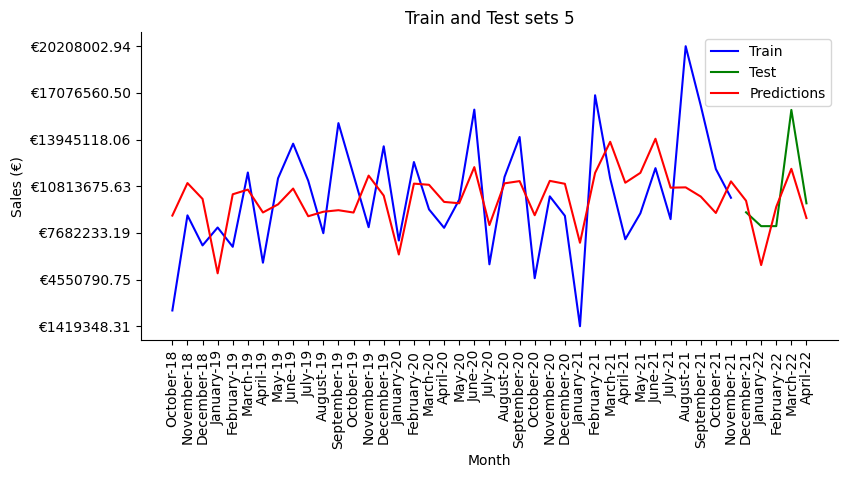

In [246]:
train_val_predictions('5', forecast_autoarima5['Train'], forecast_autoarima5['Test'], forecast_autoarima5['Predictions'])

<a class="anchor" id="xgboost1">
    
### XGBoost
    
</a>

### lag_data5

In [221]:
split_list = [60,65,70,75,80,85,90]
best_split_xgboost(split_list, lag_data5)

,Split,Train Error,Test Error
0,60,0.963,5467590.331
1,65,1.541,5357397.291
2,70,1.692,4380550.752
3,75,1.641,4229683.790
4,80,1.840,3017251.414
5,85,1.752,2474327.079
6,90,1.724,3623939.543


In [185]:
split_data = data_split(lag_data5, 85)
train_sales = split_data['train_sales']
test_sales = split_data['test_sales']
train_market = split_data['train_market']
test_market = split_data['test_market']

model_parameters = pd.DataFrame(columns = ['Parameters', 'Train Error', 'Test Error'])

# define the parameter grid to search over
params_grid = {
    'alpha':[0,0.3,0.5,1,2,3,5],
    'subsample':[0.3,0.5,1],
    'learning_rate': [0.001, 0.01, 0.1, 0.5, 1],
               'max_depth': [1,2, 3, 5, 7],
               'min_child_weight': [1, 3, 5, 7]}
grid = ParameterGrid(params_grid)

for p in grid:   
    model = xgb.XGBRegressor(**p)
    model.fit(train_market.iloc[:,1:], train_sales)
    forecast = model.predict(pd.concat([train_market, test_market]).drop('Date', axis=1))
    error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-forecast[:len(train_sales)])**2).mean()), 3)
    error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast[len(train_sales):])**2).mean()), 3)
    model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3240144271.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

In [186]:
model_parameters['Diff']=model_parameters['Test Error']-model_parameters['Train Error']
model_parameters['|Diff|']=abs(model_parameters['Diff'])
model_parameters.sort_values('|Diff|', ascending= True).head(30)

,Parameters,Train Error,Test Error,Diff,|Diff|
1874,"{'alpha': 5, 'learning_rate': 0.01, 'max_depth...",4938414.434,4904077.271,-34337.163,34337.163
1274,"{'alpha': 2, 'learning_rate': 0.01, 'max_depth...",4938414.418,4904077.171,-34337.247,34337.247
1574,"{'alpha': 3, 'learning_rate': 0.01, 'max_depth...",4938414.419,4904077.171,-34337.248,34337.248
74,"{'alpha': 0, 'learning_rate': 0.01, 'max_depth...",4938414.351,4904076.962,-34337.389,34337.389
374,"{'alpha': 0.3, 'learning_rate': 0.01, 'max_dep...",4938414.386,4904076.962,-34337.424,34337.424
974,"{'alpha': 1, 'learning_rate': 0.01, 'max_depth...",4938414.405,4904076.962,-34337.443,34337.443
674,"{'alpha': 0.5, 'learning_rate': 0.01, 'max_dep...",4938414.233,4904076.722,-34337.511,34337.511
1577,"{'alpha': 3, 'learning_rate': 0.01, 'max_depth...",4942502.897,4991191.678,48688.781,48688.781
1277,"{'alpha': 2, 'learning_rate': 0.01, 'max_depth...",4942502.874,4991191.678,48688.804,48688.804
977,"{'alpha': 1, 'learning_rate': 0.01, 'max_depth...",4942502.844,4991191.678,48688.834,48688.834


In [187]:
model_parameters.iloc[1874,:]['Parameters']

{'alpha': 5,
 'learning_rate': 0.01,
 'max_depth': 2,
 'min_child_weight': 1,
 'subsample': 1}

In [188]:
forecast_xgboost5 = xgboost_forecast(85,lag_data5,5,0.01,2,1,1)

In [189]:
forecast_xgboost5['Performance']

,Measure,Train Error,Test Error
0,MAE,4236459.602,4096735.967
1,RMSE,4938414.434,4904077.271
2,R^2,-0.579,-2.356
3,MAPE (%),0.371,0.373


In [190]:
forecast_xgboost5['Predictions']

,Date,Sales Predictions
0,2019-04-01,4.837539e+06
1,2019-05-01,5.984065e+06
2,2019-06-01,7.291278e+06
3,2019-07-01,4.837539e+06
4,2019-08-01,6.176730e+06
5,2019-09-01,8.463186e+06
6,2019-10-01,6.520582e+06
7,2019-11-01,4.837539e+06
8,2019-12-01,7.291278e+06
9,2020-01-01,5.001880e+06


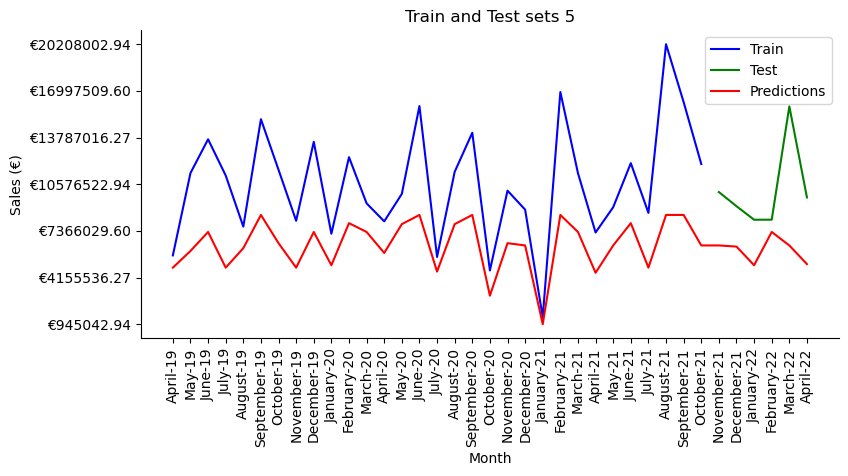

In [191]:
train_val_predictions('5', forecast_xgboost5['Train'], forecast_xgboost5['Test'], forecast_xgboost5['Predictions'])

<a class="anchor" id="xgboost1">
    
### Prophet
    
</a>

### data_agg5

In [375]:
split_list = [60,65,70,75,80,85,90]
best_split_prophet(split_list, data_agg5)

14:56:59 - cmdstanpy - INFO - Chain [1] start processing
14:57:39 - cmdstanpy - INFO - Chain [1] done processing
14:57:40 - cmdstanpy - INFO - Chain [1] start processing
14:57:40 - cmdstanpy - INFO - Chain [1] done processing
14:57:40 - cmdstanpy - INFO - Chain [1] start processing
14:57:40 - cmdstanpy - INFO - Chain [1] done processing
14:57:40 - cmdstanpy - INFO - Chain [1] start processing
14:57:41 - cmdstanpy - INFO - Chain [1] done processing
14:57:41 - cmdstanpy - INFO - Chain [1] start processing
14:57:41 - cmdstanpy - INFO - Chain [1] done processing
14:57:41 - cmdstanpy - INFO - Chain [1] start processing
14:57:41 - cmdstanpy - INFO - Chain [1] done processing
14:57:42 - cmdstanpy - INFO - Chain [1] start processing
14:57:42 - cmdstanpy - INFO - Chain [1] done processing
14:57:42 - cmdstanpy - INFO - Chain [1] start processing
14:57:42 - cmdstanpy - INFO - Chain [1] done processing


,Split,Train Error,Test Error
0,60,85.315,3.367496e+07
1,65,379235.444,8.596083e+07
2,70,1503971.485,3.847352e+07
3,75,1551892.565,9.743403e+06
4,80,1574334.751,5.685943e+06
5,85,1845121.362,6.324921e+06
6,90,1997345.317,6.409736e+06
7,year,1573128.152,1.119383e+07


In [376]:
split_data = data_split(data_agg5, 70)
train_sales = split_data['train_sales']
test_sales = split_data['test_sales']
train_market = split_data['train_market']
test_market = split_data['test_market']
prophet_data_train = pd.concat([train_market, train_sales], axis=1)
prophet_data_train.rename(columns={'Date': 'ds', 'Adjusted Sales (€)': 'y'}, inplace=True)
future = pd.concat([train_market, test_market])
model_parameters = pd.DataFrame(columns = ['Parameters'])
for p in grid:   
    train_model =Prophet(seasonality_mode = p['seasonality_mode'],
                         changepoint_prior_scale = p['changepoint_prior_scale'],
                         changepoint_range=p['changepoint_range'],
                         seasonality_prior_scale=p['seasonality_prior_scale']
                         )
    for column in train_market.columns[1:]:
        train_model.add_regressor(column)
    train_model.fit(prophet_data_train)
    forecast = train_model.predict(future.rename(columns={'Date': 'ds'}))
    error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-forecast['yhat'][:len(train_sales)].values)**2).mean()), 3)
    error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast['yhat'][len(train_sales):].values)**2).mean()), 3)
    model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)

14:57:56 - cmdstanpy - INFO - Chain [1] start processing
14:57:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\3023300888.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
14:57:56 - cmdstanpy - INFO - Chain [1] start processing
14:57:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\3023300888.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
14:57:56 - cmdstanpy - INFO - Chain [1] start processing
14:57:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\Ap

14:58:04 - cmdstanpy - INFO - Chain [1] start processing
14:58:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\3023300888.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
14:58:04 - cmdstanpy - INFO - Chain [1] start processing
14:58:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\3023300888.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
14:58:05 - cmdstanpy - INFO - Chain [1] start processing
14:58:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\Ap

In [377]:
model_parameters['Diff']=model_parameters['Test Error']-model_parameters['Train Error']
model_parameters['|Diff|']= abs(model_parameters['Diff'])
model_parameters.sort_values('|Diff|', ascending= True).head(30)

,Parameters,Test Error,Train Error,Diff,|Diff|
24,"{'changepoint_prior_scale': 0.5, 'changepoint_...",4.754653e+06,2344426.119,2.410227e+06,2.410227e+06
30,"{'changepoint_prior_scale': 0.5, 'changepoint_...",4.755608e+06,2344427.663,2.411180e+06,2.411180e+06
18,"{'changepoint_prior_scale': 0.3, 'changepoint_...",5.354301e+06,2486202.030,2.868099e+06,2.868099e+06
12,"{'changepoint_prior_scale': 0.3, 'changepoint_...",5.368168e+06,2488243.807,2.879925e+06,2.879925e+06
1,"{'changepoint_prior_scale': 0.1, 'changepoint_...",8.256925e+06,2343941.507,5.912984e+06,5.912984e+06
7,"{'changepoint_prior_scale': 0.1, 'changepoint_...",8.268229e+06,2344120.077,5.924108e+06,5.924108e+06
35,"{'changepoint_prior_scale': 0.5, 'changepoint_...",9.309687e+06,1301779.754,8.007907e+06,8.007907e+06
29,"{'changepoint_prior_scale': 0.5, 'changepoint_...",9.312193e+06,1301854.481,8.010338e+06,8.010338e+06
33,"{'changepoint_prior_scale': 0.5, 'changepoint_...",1.021029e+07,2097682.180,8.112611e+06,8.112611e+06
27,"{'changepoint_prior_scale': 0.5, 'changepoint_...",1.021381e+07,2099279.658,8.114533e+06,8.114533e+06


In [378]:
model_parameters.iloc[24,:]['Parameters']

{'changepoint_prior_scale': 0.5,
 'changepoint_range': 0.6,
 'seasonality_mode': 'multiplicative',
 'seasonality_prior_scale': 0.01}

In [379]:
forecast_prophet5 = prophet_forecast(85, data_agg5,0.5, 0.6, 'multiplicative', 0.01 )

14:59:14 - cmdstanpy - INFO - Chain [1] start processing
14:59:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\514556311.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result.rename(columns={'ds': 'Date', 'yhat': 'Sales Predictions'}, inplace = True)
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\514556311.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result['Date'] = result['Date'].dt.strftime('%Y-%m-%d')


In [380]:
forecast_prophet5['Performance']

,Measure,Train Error,Test Error
0,MAE,2134581.018,2930015.887
1,RMSE,2650972.009,3296942.873
2,R^2,0.559,-0.662
3,MAPE (%),0.329,0.301


In [381]:
forecast_prophet5['Predictions']

,Date,Sales Predictions
0,2018-10-01,5.268250e+06
1,2018-11-01,6.962296e+06
2,2018-12-01,8.487184e+06
3,2019-01-01,7.433608e+06
4,2019-02-01,1.024047e+07
5,2019-03-01,9.319191e+06
6,2019-04-01,6.092460e+06
7,2019-05-01,9.346292e+06
8,2019-06-01,1.081834e+07
9,2019-07-01,8.898243e+06


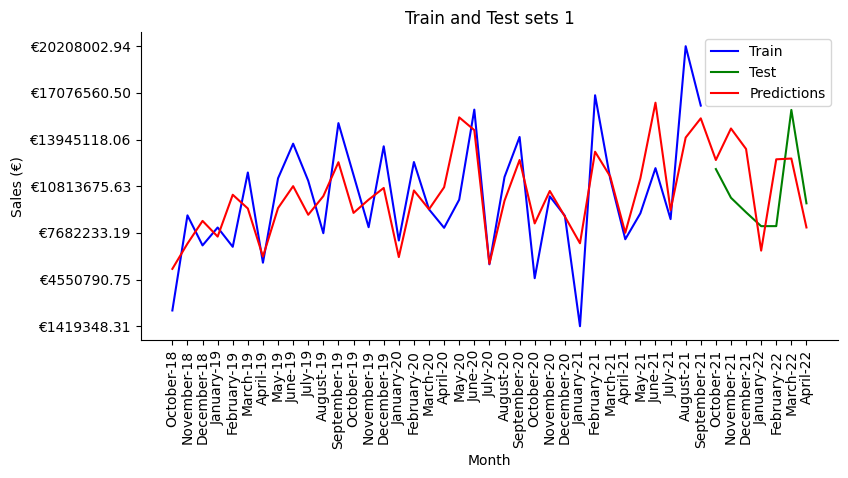

In [382]:
train_val_predictions('5', forecast_prophet5['Train'], forecast_prophet5['Test'], forecast_prophet5['Predictions'])

### Final Model

In [1353]:
final_predictions_5=list(np.repeat(np.median(data_agg5['Adjusted Sales (€)']),10))
final_predictions_5

[9666452.99264,
 9666452.99264,
 9666452.99264,
 9666452.99264,
 9666452.99264,
 9666452.99264,
 9666452.99264,
 9666452.99264,
 9666452.99264,
 9666452.99264]

<a class="anchor" id="gck6">
    
## Product Group 6
    
</a>

<a class="anchor" id="mean1">
    
### Mean
    
</a>

### data_agg6

In [166]:
split_list = [60,65,70,75,80,85,90]
best_split_mean(split_list, data_agg6)

,Split,Train Error,Test Error
0,60,248802.054,233773.017
1,65,244694.410,233516.288
2,70,249206.095,215701.890
3,75,242376.377,233043.465
4,80,235146.116,257716.466
5,85,241653.094,242409.929
6,90,241204.624,233655.042
7,year,245873.286,223421.737


In [167]:
forecast_mean6 = mean_forecast(70, data_agg6)

In [168]:
forecast_mean6['Performance']

,Measure,Train Error,Test Error
0,MAE,206908.575,165248.176
1,RMSE,249206.095,215701.890
2,R^2,0.000,-0.061
3,MAPE (%),2.100,0.553


In [169]:
forecast_mean6['Predictions']

,Date,Sales Predictions
0,2018-10-01,500309.337662
1,2018-11-01,500309.337662
2,2018-12-01,500309.337662
3,2019-01-01,500309.337662
4,2019-02-01,500309.337662
5,2019-03-01,500309.337662
6,2019-04-01,500309.337662
7,2019-05-01,500309.337662
8,2019-06-01,500309.337662
9,2019-07-01,500309.337662


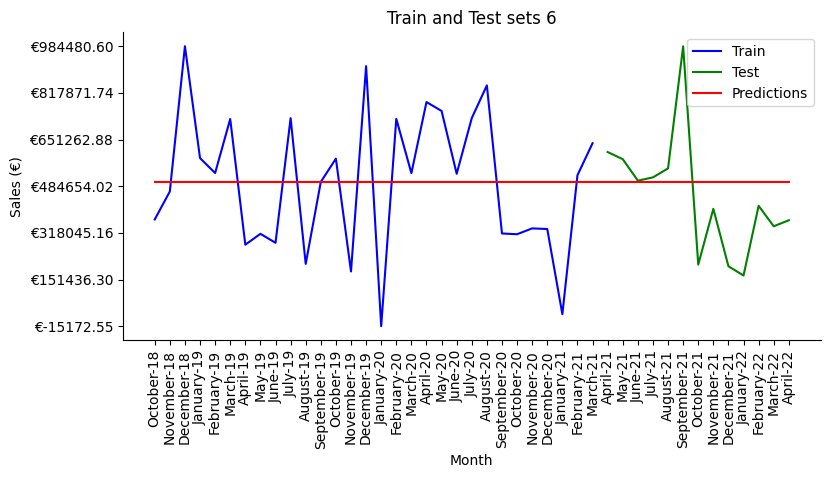

In [170]:
train_val_predictions('6', forecast_mean6['Train'], forecast_mean6['Test'], forecast_mean6['Predictions'])

<a class="anchor" id="median6">
    
### Median
    
</a>

### data_agg6

In [88]:
split_list = [60,65,70,75,80,85,90]
best_split_median(split_list, data_agg6)

,Split,Train Error,Test Error
0,60,248857.705,236048.127
1,65,245300.090,239450.187
2,70,250576.093,223404.474
3,75,243568.110,242737.773
4,80,236000.549,266417.133
5,85,241835.414,251030.512
6,90,241805.037,249250.046


In [90]:
forecast_median6 = median_forecast(70, data_agg6)
forecast_median6['Predictions']

,Date,Sales Predictions
0,2018-10-01,526476.12499
1,2018-11-01,526476.12499
2,2018-12-01,526476.12499
3,2019-01-01,526476.12499
4,2019-02-01,526476.12499
5,2019-03-01,526476.12499
6,2019-04-01,526476.12499
7,2019-05-01,526476.12499
8,2019-06-01,526476.12499
9,2019-07-01,526476.12499


In [91]:
forecast_median6['Performance']

,Measure,Train Error,Test Error
0,MAE,205336.201,172208.011
1,RMSE,250576.093,223404.474
2,R^2,-0.011,-0.138
3,MAPE (%),2.203,0.596


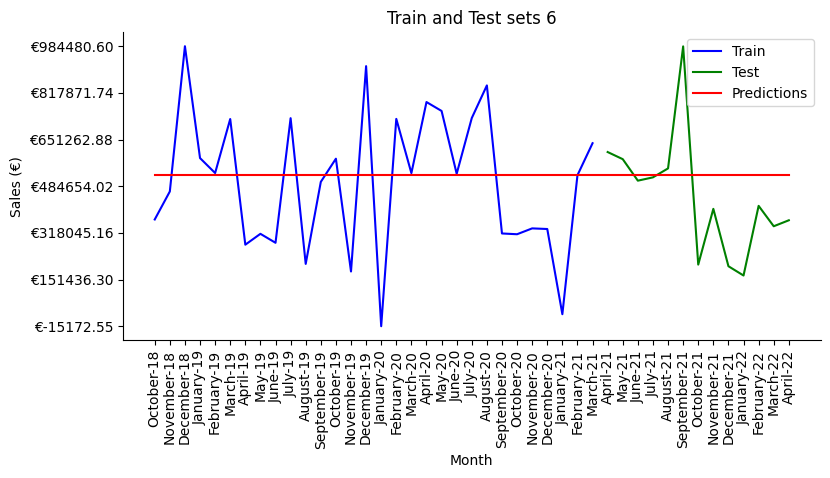

In [92]:
train_val_predictions('6', forecast_median6['Train'], forecast_median6['Test'], forecast_median6['Predictions'])

<a class="anchor" id="auto_arima6">
    
### Auto Arima
    
</a>

### data_agg6

In [187]:
split_list = [60,65,70,75,80,85,90]
best_split_autoarima(split_list, data_agg6)

,Split,Train Error,Test Error
0,60,208031.662,361878.949
1,65,202368.591,374666.585
2,70,206423.866,217266.956
3,75,204368.275,169768.202
4,80,200316.694,167092.631
5,85,205153.418,142869.968
6,90,200769.530,118316.273


In [188]:
forecast_autoarima6 = autoarima_forecast(90, data_agg6)
forecast_autoarima6['Predictions']

,Date,Sales Predictions
0,2018-10-01,544608.846842
1,2018-11-01,533411.089782
2,2018-12-01,527459.519636
3,2019-01-01,357157.931912
4,2019-02-01,614506.433013
5,2019-03-01,661540.310119
6,2019-04-01,573623.123545
7,2019-05-01,572786.938959
8,2019-06-01,392691.518882
9,2019-07-01,507780.633776


In [189]:
forecast_autoarima6['Performance']

,Measure,Train Error,Test Error
0,MAE,167451.127,96101.222
1,RMSE,200769.530,118316.273
2,R^2,0.307,-0.490
3,MAPE (%),0.875,0.381


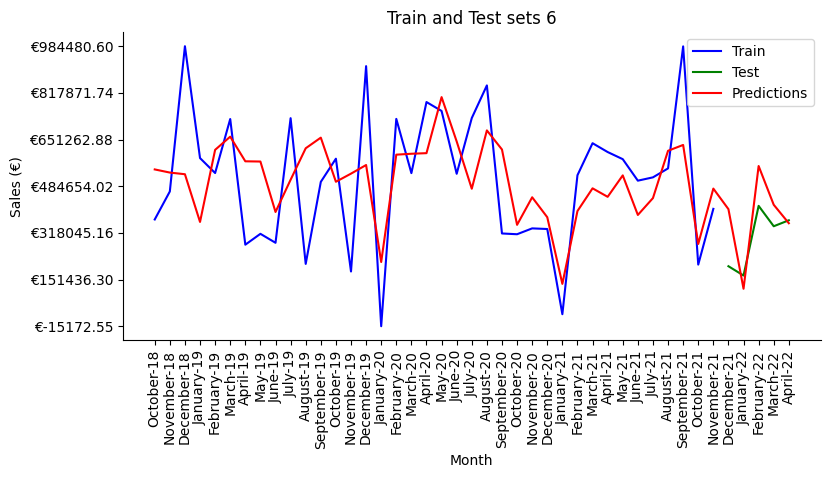

In [247]:
train_val_predictions('6', forecast_autoarima6['Train'], forecast_autoarima6['Test'], forecast_autoarima6['Predictions'])

<a class="anchor" id="xgboost1">
    
### XGBoost
    
</a>

### lag_data6

In [222]:
split_list = [60,65,70,75,80,85,90]
best_split_xgboost(split_list, lag_data6)

,Split,Train Error,Test Error
0,60,0.083,350914.932
1,65,0.075,364738.932
2,70,0.073,249121.505
3,75,0.076,252567.658
4,80,0.075,257226.921
5,85,0.086,130487.658
6,90,0.058,168505.572


In [178]:
split_data = data_split(lag_data6, 90)
train_sales = split_data['train_sales']
test_sales = split_data['test_sales']
train_market = split_data['train_market']
test_market = split_data['test_market']

model_parameters = pd.DataFrame(columns = ['Parameters', 'Train Error', 'Test Error'])

# define the parameter grid to search over
params_grid = {
    'alpha':[0,0.3,0.5,1,2,3,5],
    'subsample':[0.3,0.5,1],
    'learning_rate': [0.001, 0.01, 0.1, 0.5, 1],
               'max_depth': [1,2, 3, 5, 7],
               'min_child_weight': [1, 3, 5, 7]}
grid = ParameterGrid(params_grid)

for p in grid:   
    model = xgb.XGBRegressor(**p)
    model.fit(train_market.iloc[:,1:], train_sales)
    forecast = model.predict(pd.concat([train_market, test_market]).drop('Date', axis=1))
    error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-forecast[:len(train_sales)])**2).mean()), 3)
    error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast[len(train_sales):])**2).mean()), 3)
    model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3419888786.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

In [179]:
model_parameters['Diff']=model_parameters['Test Error']-model_parameters['Train Error']
model_parameters['|Diff|']=abs(model_parameters['Diff'])
model_parameters.sort_values('|Diff|', ascending= True).head(30)

,Parameters,Train Error,Test Error,Diff,|Diff|
1920,"{'alpha': 5, 'learning_rate': 0.1, 'max_depth'...",135785.252,144836.977,9051.725,9051.725
1320,"{'alpha': 2, 'learning_rate': 0.1, 'max_depth'...",135785.087,144837.202,9052.115,9052.115
1620,"{'alpha': 3, 'learning_rate': 0.1, 'max_depth'...",135785.154,144837.273,9052.119,9052.119
1020,"{'alpha': 1, 'learning_rate': 0.1, 'max_depth'...",135785.038,144837.283,9052.245,9052.245
720,"{'alpha': 0.5, 'learning_rate': 0.1, 'max_dept...",135785.033,144837.297,9052.264,9052.264
120,"{'alpha': 0, 'learning_rate': 0.1, 'max_depth'...",135785.032,144837.370,9052.338,9052.338
420,"{'alpha': 0.3, 'learning_rate': 0.1, 'max_dept...",135784.984,144837.372,9052.388,9052.388
726,"{'alpha': 0.5, 'learning_rate': 0.1, 'max_dept...",172396.229,163204.472,-9191.757,9191.757
1026,"{'alpha': 1, 'learning_rate': 0.1, 'max_depth'...",172396.246,163204.489,-9191.757,9191.757
126,"{'alpha': 0, 'learning_rate': 0.1, 'max_depth'...",172396.202,163204.424,-9191.778,9191.778


In [180]:
model_parameters.iloc[1920,:]['Parameters']

{'alpha': 5,
 'learning_rate': 0.1,
 'max_depth': 1,
 'min_child_weight': 1,
 'subsample': 0.3}

In [181]:
forecast_xgboost6 = xgboost_forecast(90,lag_data6,5,0.1,1,1,0.3)

In [182]:
forecast_xgboost6['Performance']

,Measure,Train Error,Test Error
0,MAE,108958.090,122651.978
1,RMSE,135785.252,144836.977
2,R^2,0.693,-1.396
3,MAPE (%),0.469,0.356


In [183]:
forecast_xgboost6['Predictions']

,Date,Sales Predictions
0,2019-04-01,326103.875000
1,2019-05-01,572616.750000
2,2019-06-01,290063.750000
3,2019-07-01,557642.812500
4,2019-08-01,457669.156250
5,2019-09-01,575808.687500
6,2019-10-01,592419.500000
7,2019-11-01,333859.843750
8,2019-12-01,592402.125000
9,2020-01-01,74690.515625


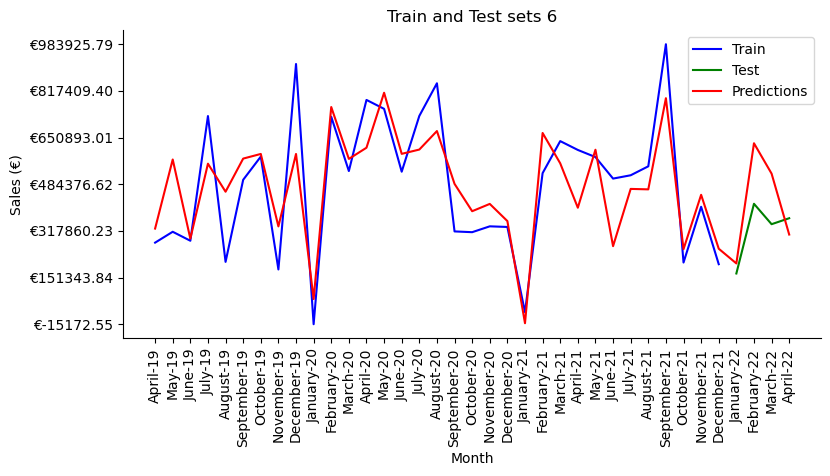

In [184]:
train_val_predictions('6', forecast_xgboost6['Train'], forecast_xgboost6['Test'], forecast_xgboost6['Predictions'])

<a class="anchor" id="xgboost1">
    
### Prophet
    
</a>

### data_agg6

In [383]:
split_list = [60,65,70,75,80,85,90]
best_split_prophet(split_list, data_agg6)

14:59:45 - cmdstanpy - INFO - Chain [1] start processing
14:59:50 - cmdstanpy - INFO - Chain [1] done processing
14:59:50 - cmdstanpy - INFO - Chain [1] start processing
15:00:18 - cmdstanpy - INFO - Chain [1] done processing
15:00:19 - cmdstanpy - INFO - Chain [1] start processing
15:00:19 - cmdstanpy - INFO - Chain [1] done processing
15:00:19 - cmdstanpy - INFO - Chain [1] start processing
15:00:19 - cmdstanpy - INFO - Chain [1] done processing
15:00:20 - cmdstanpy - INFO - Chain [1] start processing
15:00:20 - cmdstanpy - INFO - Chain [1] done processing
15:00:20 - cmdstanpy - INFO - Chain [1] start processing
15:00:20 - cmdstanpy - INFO - Chain [1] done processing
15:00:20 - cmdstanpy - INFO - Chain [1] start processing
15:00:20 - cmdstanpy - INFO - Chain [1] done processing
15:00:21 - cmdstanpy - INFO - Chain [1] start processing
15:00:21 - cmdstanpy - INFO - Chain [1] done processing


,Split,Train Error,Test Error
0,60,7.313,1953575.655
1,65,5.862,1936223.830
2,70,45152.511,479373.011
3,75,53130.982,383419.267
4,80,73394.223,277087.473
5,85,84453.996,282916.394
6,90,84286.906,433809.504
7,year,44414.858,502261.053


In [384]:
split_data = data_split(data_agg6, 70)
train_sales = split_data['train_sales']
test_sales = split_data['test_sales']
train_market = split_data['train_market']
test_market = split_data['test_market']
prophet_data_train = pd.concat([train_market, train_sales], axis=1)
prophet_data_train.rename(columns={'Date': 'ds', 'Adjusted Sales (€)': 'y'}, inplace=True)
future = pd.concat([train_market, test_market])
model_parameters = pd.DataFrame(columns = ['Parameters'])
for p in grid:   
    train_model =Prophet(seasonality_mode = p['seasonality_mode'],
                         changepoint_prior_scale = p['changepoint_prior_scale'],
                         changepoint_range=p['changepoint_range'],
                         seasonality_prior_scale=p['seasonality_prior_scale']
                         )
    for column in train_market.columns[1:]:
        train_model.add_regressor(column)
    train_model.fit(prophet_data_train)
    forecast = train_model.predict(future.rename(columns={'Date': 'ds'}))
    error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-forecast['yhat'][:len(train_sales)].values)**2).mean()), 3)
    error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast['yhat'][len(train_sales):].values)**2).mean()), 3)
    model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)

15:00:45 - cmdstanpy - INFO - Chain [1] start processing
15:00:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\1293303892.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:00:45 - cmdstanpy - INFO - Chain [1] start processing
15:00:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\1293303892.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:00:46 - cmdstanpy - INFO - Chain [1] start processing
15:00:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\Ap

15:00:53 - cmdstanpy - INFO - Chain [1] start processing
15:00:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\1293303892.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:00:53 - cmdstanpy - INFO - Chain [1] start processing
15:00:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\1293303892.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:00:53 - cmdstanpy - INFO - Chain [1] start processing
15:00:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\Ap

In [385]:
model_parameters['Diff']=model_parameters['Test Error']-model_parameters['Train Error']
model_parameters['|Diff|']= abs(model_parameters['Diff'])
model_parameters.sort_values('|Diff|', ascending= True).head(30)

,Parameters,Test Error,Train Error,Diff,|Diff|
24,"{'changepoint_prior_scale': 0.5, 'changepoint_...",243245.205,202607.058,40638.147,40638.147
30,"{'changepoint_prior_scale': 0.5, 'changepoint_...",247608.868,206254.000,41354.868,41354.868
6,"{'changepoint_prior_scale': 0.1, 'changepoint_...",249224.001,207274.124,41949.877,41949.877
0,"{'changepoint_prior_scale': 0.1, 'changepoint_...",249582.355,207276.702,42305.653,42305.653
18,"{'changepoint_prior_scale': 0.3, 'changepoint_...",249831.365,207275.031,42556.334,42556.334
12,"{'changepoint_prior_scale': 0.3, 'changepoint_...",250132.410,207282.437,42849.973,42849.973
9,"{'changepoint_prior_scale': 0.1, 'changepoint_...",292340.583,203423.893,88916.690,88916.690
3,"{'changepoint_prior_scale': 0.1, 'changepoint_...",292343.990,203425.440,88918.550,88918.550
15,"{'changepoint_prior_scale': 0.3, 'changepoint_...",292726.326,203426.577,89299.749,89299.749
27,"{'changepoint_prior_scale': 0.5, 'changepoint_...",292732.357,203389.672,89342.685,89342.685


In [386]:
model_parameters.iloc[24,:]['Parameters']

{'changepoint_prior_scale': 0.5,
 'changepoint_range': 0.6,
 'seasonality_mode': 'multiplicative',
 'seasonality_prior_scale': 0.01}

In [388]:
forecast_prophet6 = prophet_forecast(80, data_agg6,0.5, 0.6, 'multiplicative', 0.01 )

15:02:25 - cmdstanpy - INFO - Chain [1] start processing
15:02:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\514556311.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result.rename(columns={'ds': 'Date', 'yhat': 'Sales Predictions'}, inplace = True)
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\514556311.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result['Date'] = result['Date'].dt.strftime('%Y-%m-%d')


In [389]:
forecast_prophet6['Performance']

,Measure,Train Error,Test Error
0,MAE,2766062.124,6939129.940
1,RMSE,4617102.840,8623920.979
2,R^2,0.437,-3.619
3,MAPE (%),0.181,0.167


In [390]:
forecast_prophet6['Predictions']

,Date,Sales Predictions
0,2018-10-01,2.852651e+07
1,2018-11-01,2.689632e+07
2,2018-12-01,3.072913e+07
3,2019-01-01,3.003613e+07
4,2019-02-01,3.115134e+07
5,2019-03-01,3.290172e+07
6,2019-04-01,3.742803e+07
7,2019-05-01,3.756196e+07
8,2019-06-01,3.568686e+07
9,2019-07-01,3.994286e+07


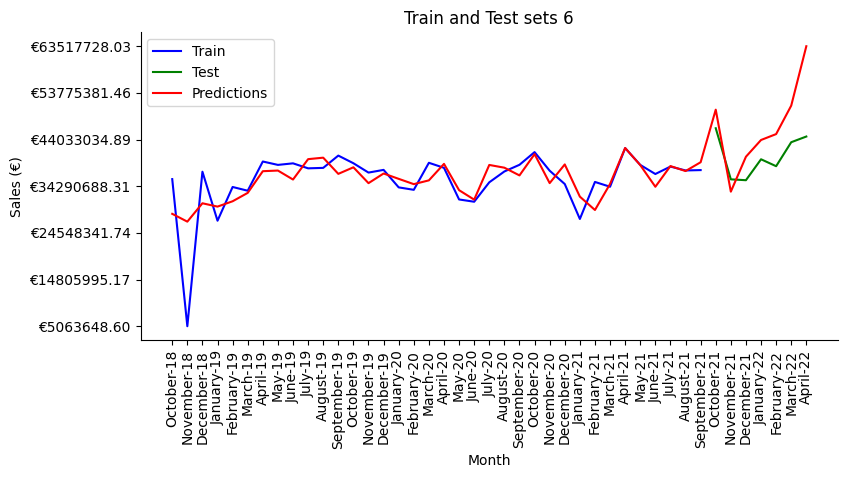

In [391]:
train_val_predictions('6', forecast_prophet6['Train'], forecast_prophet6['Test'], forecast_prophet6['Predictions'])

### Final Model

In [1354]:
# Values we have to predict
test_set[test_set['Mapped_GCK']=='#6']

,Month Year,Mapped_GCK,Sales_EUR
30,2022-03-01,#6,NaN
31,2022-06-01,#6,NaN
32,2022-07-01,#6,NaN
33,2022-08-01,#6,NaN
34,2022-09-01,#6,NaN
35,2022-10-01,#6,NaN
36,2022-11-01,#6,NaN
37,2022-12-01,#6,NaN
38,2023-01-01,#6,NaN
39,2023-02-01,#6,NaN


In [1355]:
# Arranging the dataset that will be used for the prediction
test_data_6=pd.DataFrame(index=test_set[test_set['Mapped_GCK']=='#6']['Month Year'],columns=data_agg6.columns).drop(
        columns='Unnamed: 0')
test_data_6.head()

,Price of Natural gas index World,Production Index Machinery & Electricals Japan,Price of Energy World,Production Index Electrical equipment Italy,Production Index Electrical equipment Japan,Shipments Index Machinery & Electricals Italy,Adjusted Sales (€)
Month Year,,,,,,,
2022-03-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-06-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-07-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-08-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-09-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [1356]:
# Considering that the variables used have lags and that we have already predicted for some of the features, 
#we already have values we can fill
test_data_6.iloc[:,0]=market_data_pred['Price of Natural gas index World '][-10:].values
test_data_6.iloc[:5,1]=market_data_pred['Production Index Machinery & Electricals Japan'][-5:].values
test_data_6.iloc[0,2]=market_data_pred['Price of Energy World '][-1:].values[0]
test_data_6.iloc[0,3]=market_data_pred['Production Index Electrical equipment Italy  '][-1:].values[0]
test_data_6.iloc[:5,4]=market_data_pred['Production Index Electrical equipment Japan '][-5:].values
test_data_6.iloc[0,5]=market_data_pred['Shipments Index Machinery & Electricals Italy'][-1:].values[0]

#### Production Index Machinery & Electricals Japan

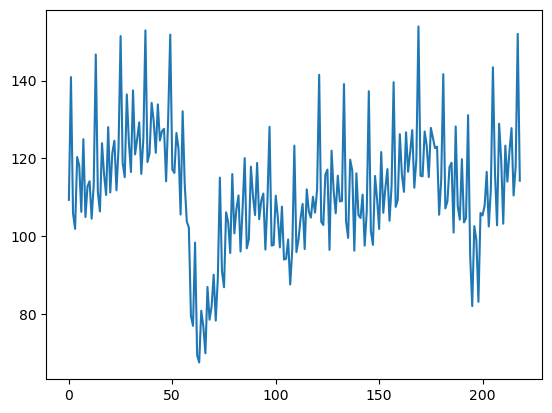

In [1357]:
plt.plot(market_data_pred['Production Index Machinery & Electricals Japan'])

In [1358]:
predict_pimej=pd.DataFrame(market_data_pred.set_index('Unnamed: 0').loc[:,
            'Production Index Machinery & Electricals Japan'].dropna()).reset_index().rename(columns={'Unnamed: 0':'ds',
            'Production Index Machinery & Electricals Japan':'y'})
predict_pimej.head()

,ds,y
0,2004-02-01,109.334010
1,2004-03-01,140.884616
2,2004-04-01,105.853579
3,2004-05-01,101.864777
4,2004-06-01,120.332920


In [1359]:
prophet_pimej=Prophet()
prophet_pimej.fit(predict_pimej)

23:14:45 - cmdstanpy - INFO - Chain [1] start processing
23:14:45 - cmdstanpy - INFO - Chain [1] done processing


In [1360]:
future = prophet_pimej.make_future_dataframe(periods=5,freq='m')
forecast = prophet_pimej.predict(future)

# Fill missing values
test_data_6.iloc[-5:,1]=forecast['yhat'][-5:]

#### Price of Energy World

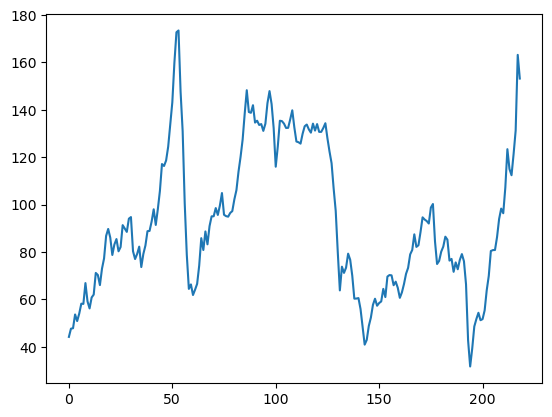

In [1361]:
plt.plot(market_data_pred.loc[:,'Price of Energy World '])

In [1362]:
predict_pew=pd.DataFrame(market_data_pred.set_index('Unnamed: 0').loc[:,
            'Price of Energy World '].dropna()).reset_index().rename(columns={'Unnamed: 0':'ds',
            'Price of Energy World ':'y'})
predict_pew.head()

,ds,y
0,2004-02-01,44.123338
1,2004-03-01,47.588957
2,2004-04-01,47.779013
3,2004-05-01,53.590898
4,2004-06-01,50.799575


In [1363]:
prophet_pew=Prophet()
prophet_pew.fit(predict_pew)

23:14:49 - cmdstanpy - INFO - Chain [1] start processing
23:14:49 - cmdstanpy - INFO - Chain [1] done processing


In [1364]:
future = prophet_pew.make_future_dataframe(periods=9,freq='m')
forecast = prophet_pew.predict(future)

# Fill missing values
test_data_6.iloc[-9:,2]=forecast['yhat'][-9:]

#### Production Index Electrical equipment Italy

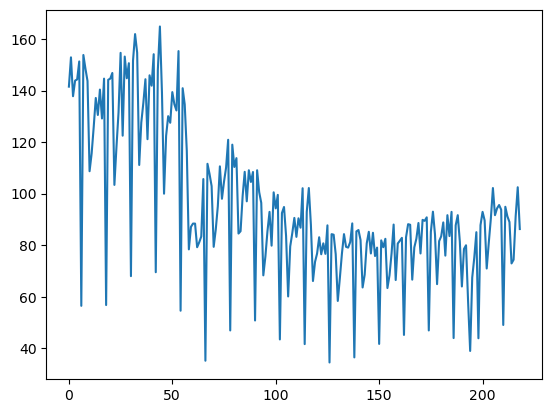

In [1365]:
plt.plot(market_data_pred.loc[:,'Production Index Electrical equipment Italy  '])

In [1366]:
predict_pieei=pd.DataFrame(market_data_pred.set_index('Unnamed: 0').loc[:,
            'Production Index Electrical equipment Italy  '].dropna()).reset_index().rename(columns={'Unnamed: 0':'ds',
            'Production Index Electrical equipment Italy  ':'y'})
predict_pieei.head()

,ds,y
0,2004-02-01,141.510864
1,2004-03-01,152.880234
2,2004-04-01,137.796875
3,2004-05-01,143.860535
4,2004-06-01,144.315308


In [1367]:
prophet_pieei=Prophet()
prophet_pieei.fit(predict_pieei)

23:14:53 - cmdstanpy - INFO - Chain [1] start processing
23:14:53 - cmdstanpy - INFO - Chain [1] done processing


In [1368]:
future = prophet_pieei.make_future_dataframe(periods=9,freq='m')
forecast = prophet_pieei.predict(future)

# Fill missing values
test_data_6.iloc[-9:,3]=forecast['yhat'][-9:]

#### Production Index Electrical equipment Japan

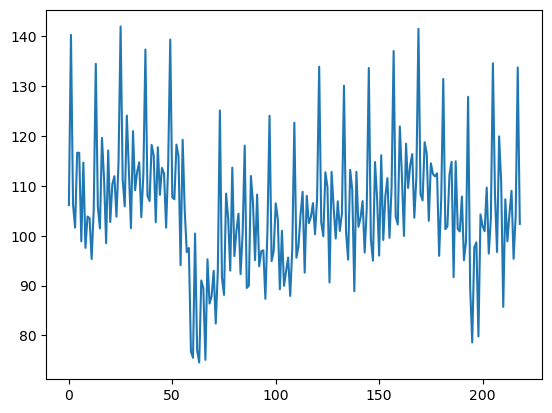

In [1369]:
plt.plot(market_data_pred.loc[:,'Production Index Electrical equipment Japan '])

In [1370]:
predict_pieej=pd.DataFrame(market_data_pred.set_index('Unnamed: 0').loc[:,
            'Production Index Electrical equipment Japan '].dropna()).reset_index().rename(columns={'Unnamed: 0':'ds',
            'Production Index Electrical equipment Japan ':'y'})
predict_pieej.head()

,ds,y
0,2004-02-01,106.161262
1,2004-03-01,140.288741
2,2004-04-01,106.271197
3,2004-05-01,101.608710
4,2004-06-01,116.655248


In [1371]:
prophet_pieej=Prophet()
prophet_pieej.fit(predict_pieej)

23:14:57 - cmdstanpy - INFO - Chain [1] start processing
23:14:57 - cmdstanpy - INFO - Chain [1] done processing


In [1372]:
future = prophet_pieej.make_future_dataframe(periods=5,freq='m')
forecast = prophet_pieej.predict(future)

# Fill missing values
test_data_6.iloc[-5:,4]=forecast['yhat'][-5:]

#### Shipments Index Machinery & Electricals Italy

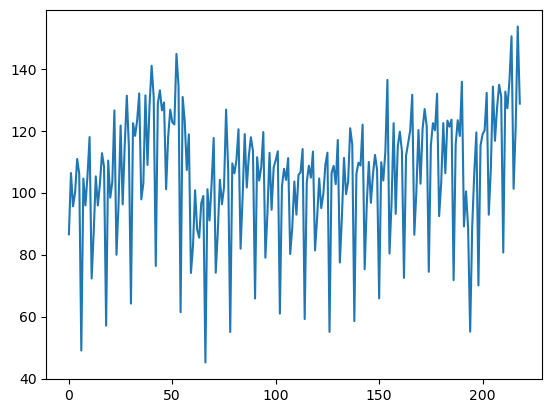

In [1373]:
plt.plot(market_data_pred.loc[:,'Shipments Index Machinery & Electricals Italy'])

In [1374]:
predict_simei=pd.DataFrame(market_data_pred.set_index('Unnamed: 0').loc[:,
            'Shipments Index Machinery & Electricals Italy'].dropna()).reset_index().rename(columns={'Unnamed: 0':'ds',
            'Shipments Index Machinery & Electricals Italy':'y'})
predict_simei.head()

,ds,y
0,2004-02-01,86.560493
1,2004-03-01,106.344544
2,2004-04-01,95.579673
3,2004-05-01,100.087039
4,2004-06-01,110.889719


In [1375]:
prophet_simei=Prophet()
prophet_simei.fit(predict_simei)

23:15:00 - cmdstanpy - INFO - Chain [1] start processing
23:15:01 - cmdstanpy - INFO - Chain [1] done processing


In [1376]:
future = prophet_simei.make_future_dataframe(periods=9,freq='m')
forecast = prophet_simei.predict(future)

# Fill missing values
test_data_6.iloc[-9:,5]=forecast['yhat'][-9:]

In [1378]:
final_6=auto_arima(data_agg6.iloc[:,-1],X=data_agg6.iloc[:,1:7],stepwise=False)
forecast=final_6.predict(n_periods=10,X=test_data_6.iloc[:,:-1])
final_predictions_6=list(forecast.values)
final_predictions_6

[316601.9316078057,
 177378.53138054896,
 69877.3652001032,
 212068.09044510347,
 161784.16464452213,
 -228067.51813649634,
 35590.309924870555,
 16415.66167570661,
 -390165.7945196294,
 2549.509922523728]

<a class="anchor" id="gck8">
    
## Product Group 8
    
</a>

A clear trend is noticed in the time series of group 8, thus the mean and the median are not reasonable approaches to apply.

<a class="anchor" id="auto_arima8">
    
### Auto Arima
    
</a>

### data_agg8

In [323]:
split_list = [60,65,70,75,80,85,90]
best_split_autoarima(split_list, data_agg8)

,Split,Train Error,Test Error
0,60,209483.061,828455.533
1,65,203187.071,835224.019
2,70,251694.261,662441.888
3,75,251711.459,523548.505
4,80,257833.608,691259.813
5,85,277733.434,725577.103
6,90,288005.558,537344.586


In [348]:
forecast_autoarima8 = autoarima_forecast(75, data_agg8)
forecast_autoarima8['Predictions']

,Date,Sales Predictions
0,2018-10-01,1.918044e+05
1,2018-11-01,3.808356e+05
2,2018-12-01,6.035852e+05
3,2019-01-01,3.196167e+05
4,2019-02-01,5.818777e+05
5,2019-03-01,6.849550e+05
6,2019-04-01,5.256619e+05
7,2019-05-01,3.596707e+05
8,2019-06-01,3.362583e+05
9,2019-07-01,3.112971e+05


In [349]:
forecast_autoarima8['Performance']

,Measure,Train Error,Test Error
0,MAE,202320.763,387225.504
1,RMSE,251711.459,523548.505
2,R^2,0.491,0.259
3,MAPE (%),0.464,0.323


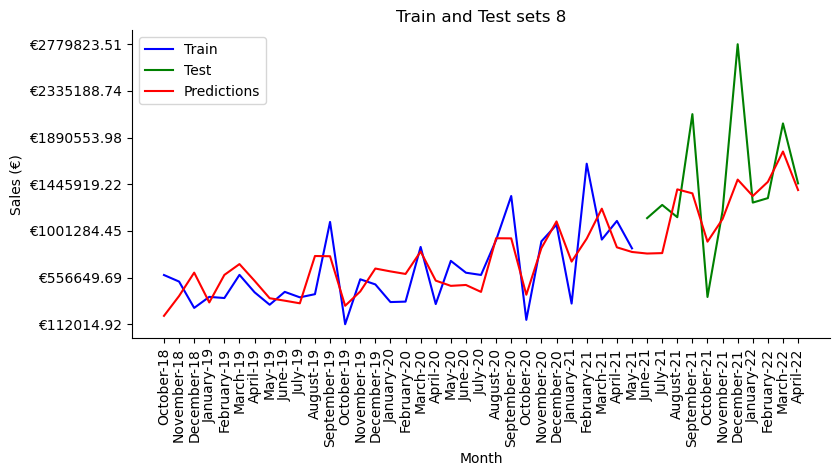

In [350]:
train_val_predictions('8', forecast_autoarima8['Train'], forecast_autoarima8['Test'], forecast_autoarima8['Predictions'])

### out_data_agg8

In [329]:
split_list = [60,65,70,75,80,85,90]
best_split_autoarima(split_list, out_data_agg8)

,Split,Train Error,Test Error
0,60,209483.061,686861.337
1,65,203187.071,683447.951
2,70,251694.261,480699.884
3,75,251711.459,361889.421
4,80,257833.608,703604.306
5,85,277733.434,726368.945
6,90,288005.558,240694.443


In [351]:
forecast_autoarima8_out = autoarima_forecast(90, out_data_agg8)
forecast_autoarima8_out['Predictions']

,Date,Sales Predictions
0,2018-10-01,2.810534e+04
1,2018-11-01,3.330281e+05
2,2018-12-01,6.189656e+05
3,2019-01-01,3.105548e+05
4,2019-02-01,5.850868e+05
5,2019-03-01,7.495591e+05
6,2019-04-01,5.403232e+05
7,2019-05-01,3.147011e+05
8,2019-06-01,3.679475e+05
9,2019-07-01,3.668354e+05


In [352]:
forecast_autoarima8_out['Performance']

,Measure,Train Error,Test Error
0,MAE,229494.523,196562.668
1,RMSE,288005.558,240694.443
2,R^2,0.564,0.354
3,MAPE (%),0.423,0.153


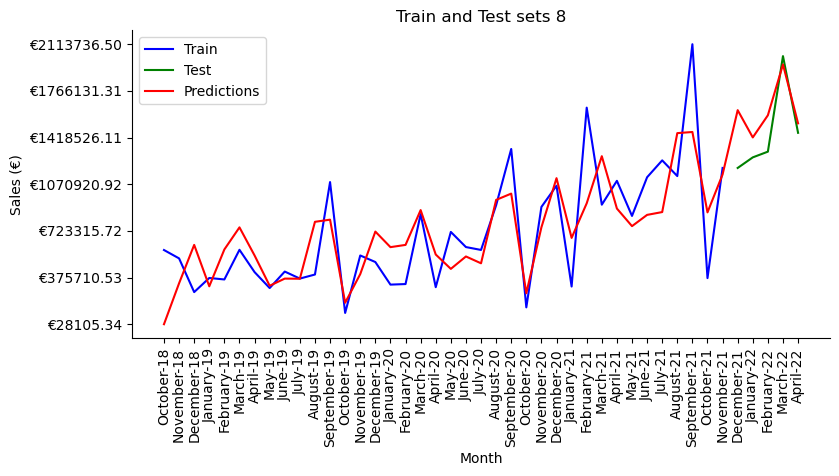

In [353]:
train_val_predictions('8', forecast_autoarima8_out['Train'], forecast_autoarima8_out['Test'], forecast_autoarima8_out['Predictions'])

<a class="anchor" id="xgboost1">
    
### XGBoost
    
</a>

### lag_data8

In [98]:
split_list = [60,65,70,75,80,85,90]
best_split_xgboost(split_list, lag_data8)

C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\658444845.py:22: RuntimeWarning: Mean of empty slice.
  error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast[len(train_sales):])**2).mean()), 3)
C:\Users\rodri\anaconda3\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


,Split,Train Error,Test Error
0,60,0.134,588432.601
1,65,0.138,828146.378
2,70,0.147,788963.488
3,75,0.208,755743.377
4,80,0.216,566989.640
5,85,0.196,548454.513
6,90,0.204,592892.182
7,year,0.202,NaN


In [252]:
split_data = data_split(lag_data8, 85)
train_sales = split_data['train_sales']
test_sales = split_data['test_sales']
train_market = split_data['train_market']
test_market = split_data['test_market']

model_parameters = pd.DataFrame(columns = ['Parameters', 'Train Error', 'Test Error'])

# define the parameter grid to search over
params_grid = {
    'alpha':[0,1,2,5],
    'subsample':[0.1,0.3,0.5,1],
    'learning_rate': [0.5,0.1, 0.01, 0.001],
               'max_depth': [1, 2, 3, 5, 6],
               'min_child_weight': [1,3,5]}
grid = ParameterGrid(params_grid)

for p in grid:   
    model = xgb.XGBRegressor(**p)
    model.fit(train_market.iloc[:,1:], train_sales)
    forecast = model.predict(pd.concat([train_market, test_market]).drop('Date', axis=1))
    error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-forecast[:len(train_sales)])**2).mean()), 3)
    error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast[len(train_sales):])**2).mean()), 3)
    model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\179877998.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\A

In [254]:
model_parameters['Diff']=model_parameters['Test Error']-model_parameters['Train Error']
model_parameters['|Diff|']= abs(model_parameters['Diff'])
model_parameters.sort_values('Test Error', ascending= True).head(30)

,Parameters,Train Error,Test Error,Diff,|Diff|
732,"{'alpha': 5, 'learning_rate': 0.5, 'max_depth'...",340769.746,525149.392,184379.646,184379.646
744,"{'alpha': 5, 'learning_rate': 0.5, 'max_depth'...",340769.746,525149.392,184379.646,184379.646
768,"{'alpha': 5, 'learning_rate': 0.5, 'max_depth'...",340769.746,525149.392,184379.646,184379.646
756,"{'alpha': 5, 'learning_rate': 0.5, 'max_depth'...",340769.746,525149.392,184379.646,184379.646
504,"{'alpha': 2, 'learning_rate': 0.5, 'max_depth'...",340770.220,525149.981,184379.761,184379.761
492,"{'alpha': 2, 'learning_rate': 0.5, 'max_depth'...",340770.220,525149.981,184379.761,184379.761
516,"{'alpha': 2, 'learning_rate': 0.5, 'max_depth'...",340770.220,525149.981,184379.761,184379.761
528,"{'alpha': 2, 'learning_rate': 0.5, 'max_depth'...",340770.220,525149.981,184379.761,184379.761
252,"{'alpha': 1, 'learning_rate': 0.5, 'max_depth'...",340770.516,525150.272,184379.756,184379.756
264,"{'alpha': 1, 'learning_rate': 0.5, 'max_depth'...",340770.516,525150.272,184379.756,184379.756


In [255]:
model_parameters.iloc[732,:]['Parameters']

{'alpha': 5,
 'learning_rate': 0.5,
 'max_depth': 2,
 'min_child_weight': 1,
 'subsample': 0.1}

In [256]:
forecast_xgboost8 = xgboost_forecast(85, lag_data8, 5,0.5,2,1,0.1)

In [257]:
forecast_xgboost8['Performance']

,Measure,Train Error,Test Error
0,MAE,244775.899,443218.741
1,RMSE,340769.746,525149.392
2,R^2,0.466,0.160
3,MAPE (%),0.351,0.244


In [258]:
forecast_xgboost8['Predictions']

,Date,Sales Predictions
0,2020-01-01,2.551464e+05
1,2020-02-01,3.518484e+05
2,2020-03-01,7.174593e+05
3,2020-04-01,2.551464e+05
4,2020-05-01,5.119335e+05
5,2020-06-01,6.300921e+05
6,2020-07-01,2.386085e+05
7,2020-08-01,9.166696e+05
8,2020-09-01,3.527512e+05
9,2020-10-01,4.352856e+05


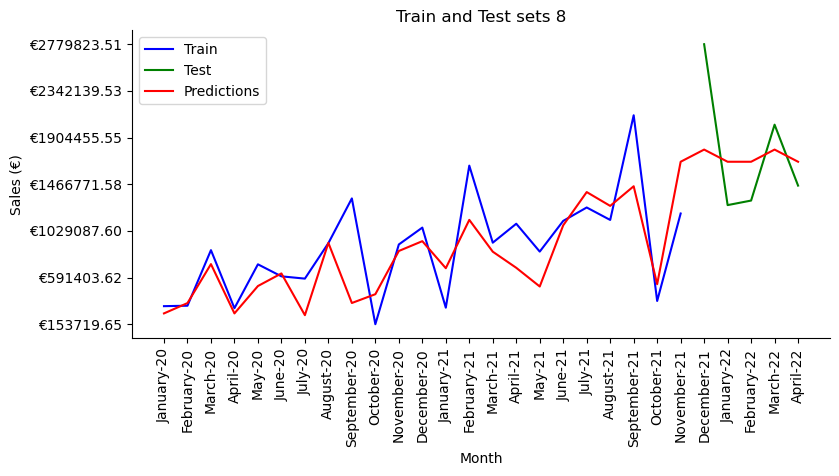

In [259]:
train_val_predictions('8', forecast_xgboost8['Train'], forecast_xgboost8['Test'], forecast_xgboost8['Predictions'])

<a class="anchor" id="xgboost1">
    
### Prophet
    
</a>

### data_agg8

In [490]:
split_list = [60,65,70,75,80,85,90]
best_split_prophet(split_list, data_agg8)

16:00:24 - cmdstanpy - INFO - Chain [1] start processing
16:00:48 - cmdstanpy - INFO - Chain [1] done processing
16:00:48 - cmdstanpy - INFO - Chain [1] start processing
16:01:10 - cmdstanpy - INFO - Chain [1] done processing
16:01:10 - cmdstanpy - INFO - Chain [1] start processing
16:01:11 - cmdstanpy - INFO - Chain [1] done processing
16:01:11 - cmdstanpy - INFO - Chain [1] start processing
16:01:11 - cmdstanpy - INFO - Chain [1] done processing
16:01:11 - cmdstanpy - INFO - Chain [1] start processing
16:01:11 - cmdstanpy - INFO - Chain [1] done processing
16:01:11 - cmdstanpy - INFO - Chain [1] start processing
16:01:11 - cmdstanpy - INFO - Chain [1] done processing
16:01:12 - cmdstanpy - INFO - Chain [1] start processing
16:01:12 - cmdstanpy - INFO - Chain [1] done processing
16:01:12 - cmdstanpy - INFO - Chain [1] start processing
16:01:12 - cmdstanpy - INFO - Chain [1] done processing


,Split,Train Error,Test Error
0,60,2.589,2729914.634
1,65,4.499,3257765.802
2,70,65003.270,3051234.801
3,75,106877.813,2393604.708
4,80,130070.042,639297.522
5,85,138286.220,651631.083
6,90,143692.969,937170.384
7,year,83301.076,885307.545


In [492]:
split_data = data_split(data_agg8, 80)
train_sales = split_data['train_sales']
test_sales = split_data['test_sales']
train_market = split_data['train_market']
test_market = split_data['test_market']
prophet_data_train = pd.concat([train_market, train_sales], axis=1)
prophet_data_train.rename(columns={'Date': 'ds', 'Adjusted Sales (€)': 'y'}, inplace=True)
future = pd.concat([train_market, test_market])
model_parameters = pd.DataFrame(columns = ['Parameters'])
for p in grid:   
    train_model =Prophet(seasonality_mode = p['seasonality_mode'],
                         changepoint_prior_scale = p['changepoint_prior_scale'],
                         changepoint_range=p['changepoint_range'],
                         seasonality_prior_scale=p['seasonality_prior_scale']
                         )
    for column in train_market.columns[1:]:
        train_model.add_regressor(column)
    train_model.fit(prophet_data_train)
    forecast = train_model.predict(future.rename(columns={'Date': 'ds'}))
    error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-forecast['yhat'][:len(train_sales)].values)**2).mean()), 3)
    error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast['yhat'][len(train_sales):].values)**2).mean()), 3)
    model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)

16:01:47 - cmdstanpy - INFO - Chain [1] start processing
16:01:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\4273199612.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
16:01:47 - cmdstanpy - INFO - Chain [1] start processing
16:01:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\4273199612.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
16:01:47 - cmdstanpy - INFO - Chain [1] start processing
16:01:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\Ap

16:01:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\4273199612.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
16:01:53 - cmdstanpy - INFO - Chain [1] start processing
16:01:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\4273199612.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
16:01:54 - cmdstanpy - INFO - Chain [1] start processing
16:01:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\4273199612.py:22: FutureW

In [493]:
model_parameters['Diff']=model_parameters['Test Error']-model_parameters['Train Error']
model_parameters['|Diff|']= abs(model_parameters['Diff'])
model_parameters.sort_values('|Diff|', ascending= True).head(30)

,Parameters,Test Error,Train Error,Diff,|Diff|
24,"{'changepoint_prior_scale': 0.5, 'changepoint_...",561431.639,237034.644,324396.995,324396.995
19,"{'changepoint_prior_scale': 0.3, 'changepoint_...",505830.642,169646.762,336183.880,336183.880
13,"{'changepoint_prior_scale': 0.3, 'changepoint_...",505959.212,169638.139,336321.073,336321.073
30,"{'changepoint_prior_scale': 0.5, 'changepoint_...",574156.578,237190.636,336965.942,336965.942
27,"{'changepoint_prior_scale': 0.5, 'changepoint_...",575475.192,224461.492,351013.700,351013.700
33,"{'changepoint_prior_scale': 0.5, 'changepoint_...",576898.903,224456.538,352442.365,352442.365
16,"{'changepoint_prior_scale': 0.3, 'changepoint_...",543292.486,172168.532,371123.954,371123.954
6,"{'changepoint_prior_scale': 0.1, 'changepoint_...",614594.226,241230.780,373363.446,373363.446
0,"{'changepoint_prior_scale': 0.1, 'changepoint_...",615173.847,241221.363,373952.484,373952.484
12,"{'changepoint_prior_scale': 0.3, 'changepoint_...",615145.907,241166.639,373979.268,373979.268


In [494]:
model_parameters.iloc[24,:]['Parameters']

{'changepoint_prior_scale': 0.5,
 'changepoint_range': 0.6,
 'seasonality_mode': 'multiplicative',
 'seasonality_prior_scale': 0.01}

In [495]:
forecast_prophet8 = prophet_forecast(85, data_agg8,0.5, 0.6, 'multiplicative', 0.01 )

16:02:16 - cmdstanpy - INFO - Chain [1] start processing
16:02:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\514556311.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result.rename(columns={'ds': 'Date', 'yhat': 'Sales Predictions'}, inplace = True)
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\514556311.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result['Date'] = result['Date'].dt.strftime('%Y-%m-%d')


In [496]:
forecast_prophet8['Performance']

,Measure,Train Error,Test Error
0,MAE,195692.040,747565.098
1,RMSE,249369.132,796769.662
2,R^2,0.675,-0.319
3,MAPE (%),0.420,0.718


In [497]:
forecast_prophet8['Predictions']

,Date,Sales Predictions
0,2018-10-01,2.173601e+05
1,2018-11-01,2.885382e+05
2,2018-12-01,4.778908e+05
3,2019-01-01,3.743831e+05
4,2019-02-01,4.439912e+05
5,2019-03-01,4.509280e+05
6,2019-04-01,3.160762e+05
7,2019-05-01,2.760338e+05
8,2019-06-01,2.987794e+05
9,2019-07-01,5.428308e+05


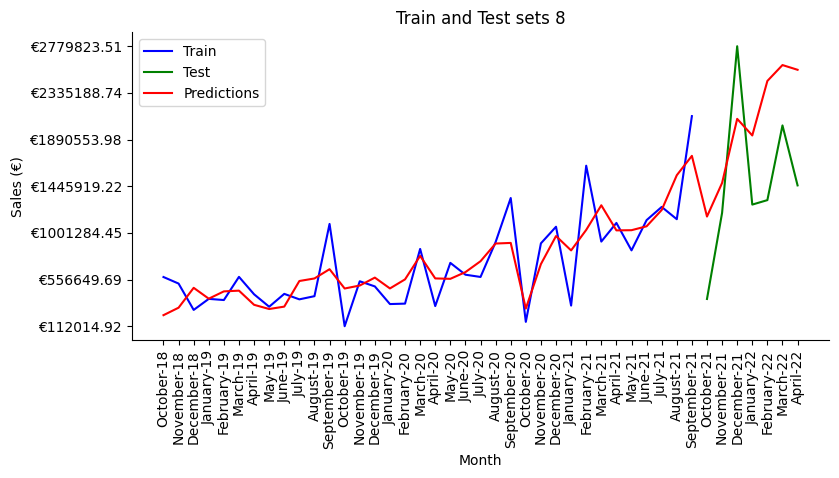

In [498]:
train_val_predictions('8', forecast_prophet8['Train'], forecast_prophet8['Test'], forecast_prophet8['Predictions'])

### Final Model

In [1379]:
# Values we have to predict
test_set[test_set['Mapped_GCK']=='#8']

,Month Year,Mapped_GCK,Sales_EUR
40,2022-03-01,#8,NaN
41,2022-06-01,#8,NaN
42,2022-07-01,#8,NaN
43,2022-08-01,#8,NaN
44,2022-09-01,#8,NaN
45,2022-10-01,#8,NaN
46,2022-11-01,#8,NaN
47,2022-12-01,#8,NaN
48,2023-01-01,#8,NaN
49,2023-02-01,#8,NaN


In [1380]:
# Arranging the dataset that will be used for the prediction
test_data_8=pd.DataFrame(index=test_set[test_set['Mapped_GCK']=='#8']['Month Year'],columns=out_data_agg8.columns).drop(
        columns='Unnamed: 0')
test_data_8.head()

,Shipments Index Machinery & Electricals Italy,Shipments Index Machinery & Electricals China,Producer Prices Electrical equipment France,Production Index Electrical equipment Japan,Production Index Machinery and equipment n.e.c. Germany,Producer Prices Electrical equipment United States,Adjusted Sales (€)
Month Year,,,,,,,
2022-03-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-06-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-07-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-08-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-09-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [1381]:
# Considering that the variables used have lags and that we have already predicted for some of the features, 
#we already have values we can fill
test_data_8.iloc[:9,0]=market_data_pred['Shipments Index Machinery & Electricals Italy'][-9:].values
test_data_8.iloc[:9,1]=market_data_pred['Shipments Index Machinery & Electricals China'][-9:].values
test_data_8.iloc[:6,2]=market_data_pred['Producer Prices Electrical equipment France  '][-6:].values
test_data_8.iloc[:7,3]=market_data_pred['Production Index Electrical equipment Japan '][-7:].values
test_data_8.iloc[:7,4]=market_data_pred['Production Index Machinery and equipment n.e.c. Germany '][-7:].values
test_data_8.iloc[:4,5]=market_data_pred['Producer Prices Electrical equipment United States'][-4:].values
test_data_8.iloc[-1,0]=test_data_6.iloc[2,5]
test_data_8.iloc[-3:,3]=test_data_6.iloc[5:8,4]

#### Shipments Index Machinery & Electricals China

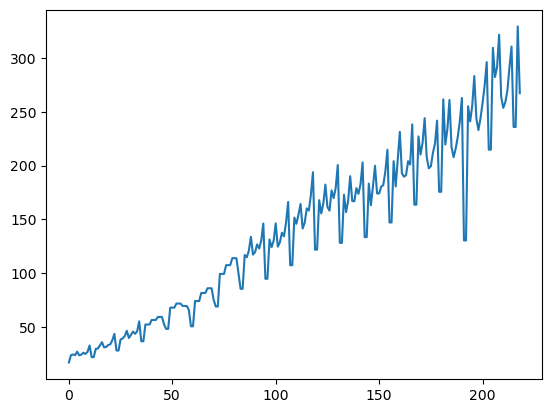

In [1382]:
plt.plot(market_data_pred.loc[:,'Shipments Index Machinery & Electricals China'])

In [1383]:
predict_simec=pd.DataFrame(market_data_pred.set_index('Unnamed: 0').loc[:,
            'Shipments Index Machinery & Electricals China'].dropna()).reset_index().rename(columns={'Unnamed: 0':'ds',
            'Shipments Index Machinery & Electricals China':'y'})
predict_simec.head()

,ds,y
0,2004-02-01,16.940704
1,2004-03-01,23.711852
2,2004-04-01,24.435235
3,2004-05-01,23.708115
4,2004-06-01,27.009138


In [1384]:
prophet_simec=Prophet()
prophet_simec.fit(predict_simec)

23:15:43 - cmdstanpy - INFO - Chain [1] start processing
23:15:43 - cmdstanpy - INFO - Chain [1] done processing


In [1385]:
future = prophet_simec.make_future_dataframe(periods=1,freq='m')
forecast = prophet_simec.predict(future)

# Fill missing values
test_data_8.iloc[-1:,1]=forecast['yhat'][-1:]

#### Producer Prices Electrical equipment France 

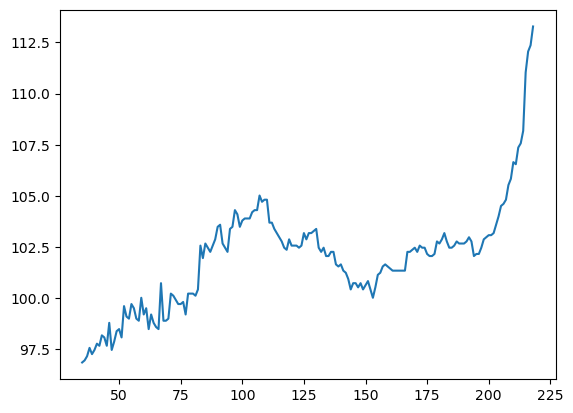

In [1386]:
plt.plot(market_data_pred.loc[:,'Producer Prices Electrical equipment France  '])

In [1387]:
predict_ppeef=pd.DataFrame(market_data_pred.set_index('Unnamed: 0').loc[:,
            'Producer Prices Electrical equipment France  '].dropna()).reset_index().rename(columns={'Unnamed: 0':'ds',
            'Producer Prices Electrical equipment France  ':'y'})
predict_ppeef.head()

,ds,y
0,2007-01-01,96.864647
1,2007-02-01,96.966606
2,2007-03-01,97.170540
3,2007-04-01,97.578384
4,2007-05-01,97.272499


In [1388]:
prophet_ppeef=Prophet()
prophet_ppeef.fit(predict_ppeef)

23:15:46 - cmdstanpy - INFO - Chain [1] start processing
23:15:47 - cmdstanpy - INFO - Chain [1] done processing


In [1389]:
future = prophet_ppeef.make_future_dataframe(periods=4,freq='m')
forecast = prophet_ppeef.predict(future)

# Fill missing values
test_data_8.iloc[-4:,2]=forecast['yhat'][-4:]

#### Production Index Machinery and equipment n.e.c. Germany

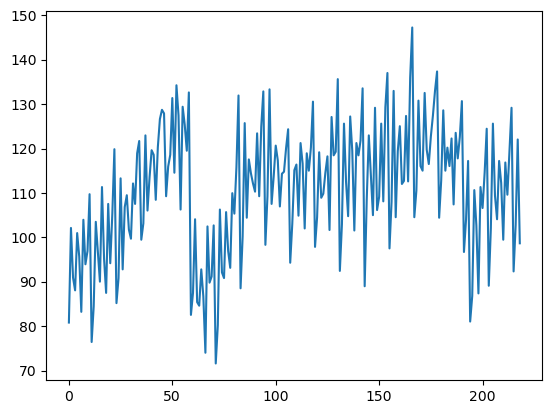

In [1390]:
plt.plot(market_data_pred.loc[:,'Production Index Machinery and equipment n.e.c. Germany '])

In [1391]:
predict_pimeg=pd.DataFrame(market_data_pred.set_index('Unnamed: 0').loc[:,
            'Production Index Machinery and equipment n.e.c. Germany '].dropna()).reset_index().rename(columns={'Unnamed: 0':'ds',
            'Production Index Machinery and equipment n.e.c. Germany ':'y'})
predict_pimeg.head()

,ds,y
0,2004-02-01,80.829010
1,2004-03-01,102.130104
2,2004-04-01,90.961426
3,2004-05-01,88.082901
4,2004-06-01,100.978699


In [1392]:
prophet_pimeg=Prophet()
prophet_pimeg.fit(predict_pimeg)

23:15:50 - cmdstanpy - INFO - Chain [1] start processing
23:15:50 - cmdstanpy - INFO - Chain [1] done processing


In [1393]:
future = prophet_pimeg.make_future_dataframe(periods=3,freq='m')
forecast = prophet_pimeg.predict(future)

# Fill missing values
test_data_8.iloc[-3:,4]=forecast['yhat'][-3:]

#### Producer Prices Electrical equipment United States

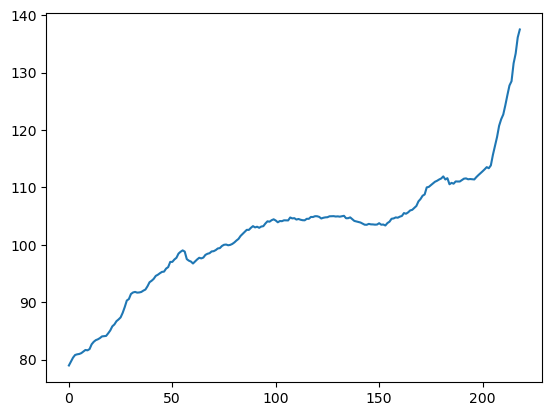

In [1394]:
plt.plot(market_data_pred.loc[:,'Producer Prices Electrical equipment United States'])

In [1395]:
predict_ppeeus=pd.DataFrame(market_data_pred.set_index('Unnamed: 0').loc[:,
            'Producer Prices Electrical equipment United States'].dropna()).reset_index().rename(columns={'Unnamed: 0':'ds',
            'Producer Prices Electrical equipment United States':'y'})
predict_ppeeus.head()

,ds,y
0,2004-02-01,78.969864
1,2004-03-01,79.673569
2,2004-04-01,80.337639
3,2004-05-01,80.798828
4,2004-06-01,80.913490


In [1396]:
prophet_ppeeus=Prophet()
prophet_ppeeus.fit(predict_ppeeus)

23:15:53 - cmdstanpy - INFO - Chain [1] start processing
23:15:53 - cmdstanpy - INFO - Chain [1] done processing


In [1397]:
future = prophet_ppeec.make_future_dataframe(periods=6,freq='m')
forecast = prophet_ppeec.predict(future)

# Fill missing values
test_data_8.iloc[-6:,5]=forecast['yhat'][-6:]

In [1398]:
final_8=auto_arima(out_data_agg8.iloc[:,-1],X=out_data_agg8.iloc[:,1:7],stepwise=False)
forecast=final_8.predict(n_periods=10,X=test_data_8.iloc[:,:-1])
final_predictions_8=list(forecast.values)
final_predictions_8

[1524596.6424376573,
 1611587.1079895524,
 1475198.404595631,
 2073491.8089592878,
 115477.37780019338,
 -529171.3145280661,
 52454.08804062726,
 298306.6204558599,
 1427.7996249450503,
 37971.54606377629]

<a class="anchor" id="gck9">
    
## Product Group 9
    
</a>

<a class="anchor" id="mean1">
    
### Mean
    
</a>

### data_agg9

In [181]:
split_list = [60,65,70,75,80,85,90]
best_split_mean(split_list, data_agg9)

,Split,Train Error,Test Error
0,60,8528.683,7743.503
1,65,8484.321,7793.928
2,70,9075.442,5683.627
3,75,8956.783,5443.413
4,80,8717.851,5890.424
5,85,8561.610,6021.093
6,90,8480.252,5660.560
7,year,9099.150,5212.181


In [187]:
forecast_mean9 = mean_forecast(80, data_agg9)

In [188]:
forecast_mean9['Performance']

,Measure,Train Error,Test Error
0,MAE,6.010314e+03,5542.131
1,RMSE,8.717851e+03,5890.424
2,R^2,0.000000e+00,-0.098
3,MAPE (%),1.011245e+18,3.923


In [189]:
forecast_mean9['Predictions']

,Date,Sales Predictions
0,2018-10-01,7634.413156
1,2018-11-01,7634.413156
2,2018-12-01,7634.413156
3,2019-01-01,7634.413156
4,2019-02-01,7634.413156
5,2019-03-01,7634.413156
6,2019-04-01,7634.413156
7,2019-05-01,7634.413156
8,2019-06-01,7634.413156
9,2019-07-01,7634.413156


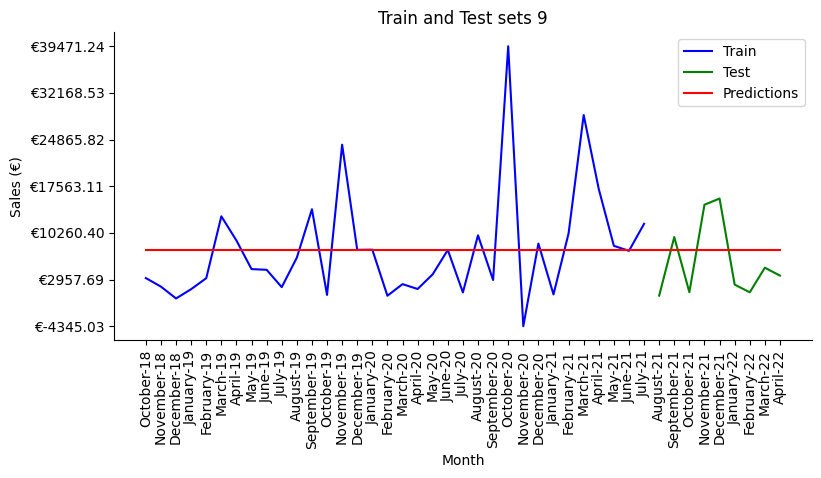

In [190]:
train_val_predictions('9', forecast_mean9['Train'], forecast_mean9['Test'], forecast_mean9['Predictions'])

### out_data_agg9

In [192]:
split_list = [60,65,70,75,80,85,90]
best_split_mean(split_list, out_data_agg9)

,Split,Train Error,Test Error
0,60,5467.691,8106.561
1,65,5607.870,8310.694
2,70,6918.700,5911.914
3,75,6989.594,5364.030
4,80,6844.664,5650.594
5,85,6746.798,5867.514
6,90,6759.749,5363.492
7,year,7092.263,5172.957


In [194]:
forecast_otmean9 = mean_forecast(70, out_data_agg9)

In [195]:
forecast_otmean9['Performance']

,Measure,Train Error,Test Error
0,MAE,5.103549e+03,5048.210
1,RMSE,6.918700e+03,5911.914
2,R^2,0.000000e+00,-0.085
3,MAPE (%),8.751406e+17,2.148


In [196]:
forecast_otmean9['Predictions']

,Date,Sales Predictions
0,2018-10-01,5829.607643
1,2018-11-01,5829.607643
2,2018-12-01,5829.607643
3,2019-01-01,5829.607643
4,2019-02-01,5829.607643
5,2019-03-01,5829.607643
6,2019-04-01,5829.607643
7,2019-05-01,5829.607643
8,2019-06-01,5829.607643
9,2019-07-01,5829.607643


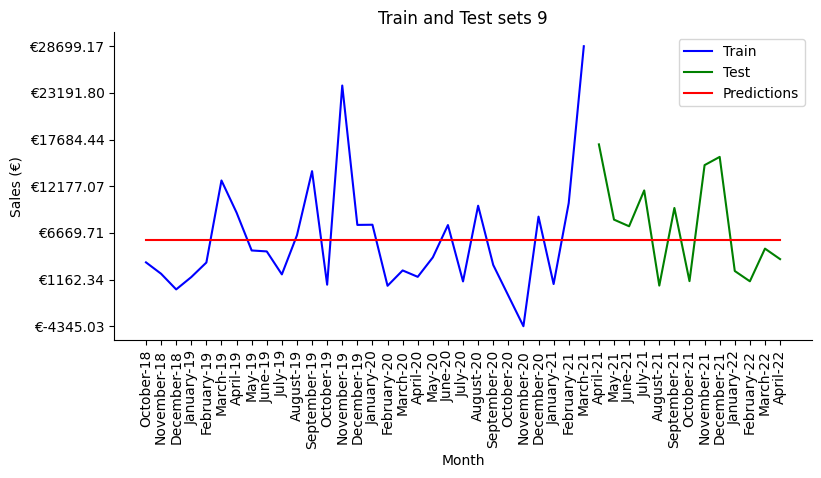

In [198]:
train_val_predictions('9', forecast_otmean9['Train'], forecast_otmean9['Test'], forecast_otmean9['Predictions'])

<a class="anchor" id="median9">
    
### Median
    
</a>

### data_agg9

In [97]:
split_list = [60,65,70,75,80,85,90]
best_split_median(split_list, data_agg9)

,Split,Train Error,Test Error
0,60,9065.785,8687.308
1,65,8910.775,8906.837
2,70,9570.512,6592.800
3,75,9437.656,5719.155
4,80,8977.735,5633.846
5,85,8792.049,5894.894
6,90,8716.877,5266.175


In [98]:
forecast_median9 = median_forecast(90, data_agg9)
forecast_median9['Predictions']

,Date,Sales Predictions
0,2018-10-01,5489.93334
1,2018-11-01,5489.93334
2,2018-12-01,5489.93334
3,2019-01-01,5489.93334
4,2019-02-01,5489.93334
5,2019-03-01,5489.93334
6,2019-04-01,5489.93334
7,2019-05-01,5489.93334
8,2019-06-01,5489.93334
9,2019-07-01,5489.93334


In [99]:
forecast_median9['Performance']

,Measure,Train Error,Test Error
0,MAE,5.900107e+03,4118.392
1,RMSE,8.716877e+03,5266.175
2,R^2,-5.700000e-02,-0.000
3,MAPE (%),6.506437e+17,1.520


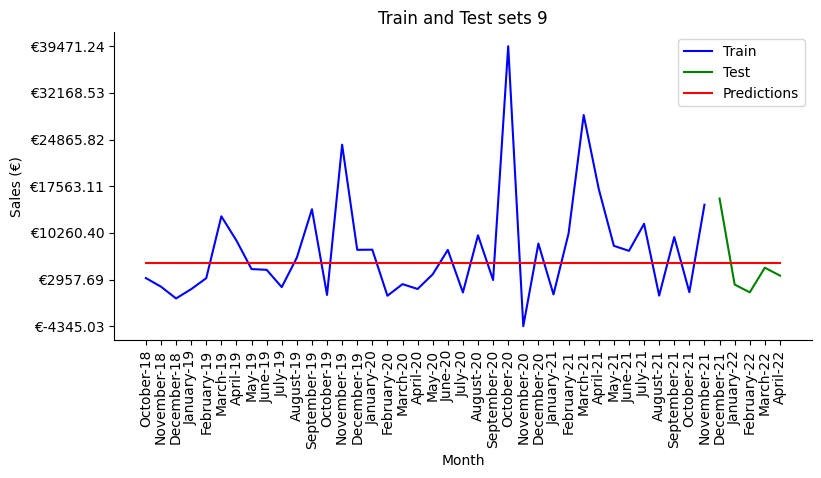

In [100]:
train_val_predictions('9', forecast_median9['Train'], forecast_median9['Test'], forecast_median9['Predictions'])

<a class="anchor" id="auto_arima9">
    
### Auto Arima
    
</a>

### data_agg9

In [193]:
split_list = [60,65,70,75,80,85,90]
best_split_autoarima(split_list, data_agg9)

,Split,Train Error,Test Error
0,60,8246.048,9599.893
1,65,8223.244,8993.050
2,70,8264.310,7896.472
3,75,8138.721,8003.665
4,80,7881.037,8025.896
5,85,7882.650,7761.516
6,90,7779.200,6905.834


In [194]:
forecast_autoarima9 = autoarima_forecast(90, data_agg9)
forecast_autoarima9['Predictions']

,Date,Sales Predictions
0,2018-10-01,-2725.387266
1,2018-11-01,3567.929830
2,2018-12-01,355.549891
3,2019-01-01,2271.001861
4,2019-02-01,7688.939678
5,2019-03-01,7536.122147
6,2019-04-01,5423.863568
7,2019-05-01,6223.831978
8,2019-06-01,7505.613801
9,2019-07-01,6928.144760


In [195]:
forecast_autoarima9['Performance']

,Measure,Train Error,Test Error
0,MAE,5.207947e+03,4770.917
1,RMSE,7.779200e+03,6905.834
2,R^2,1.590000e-01,-0.720
3,MAPE (%),4.213827e+16,1.136


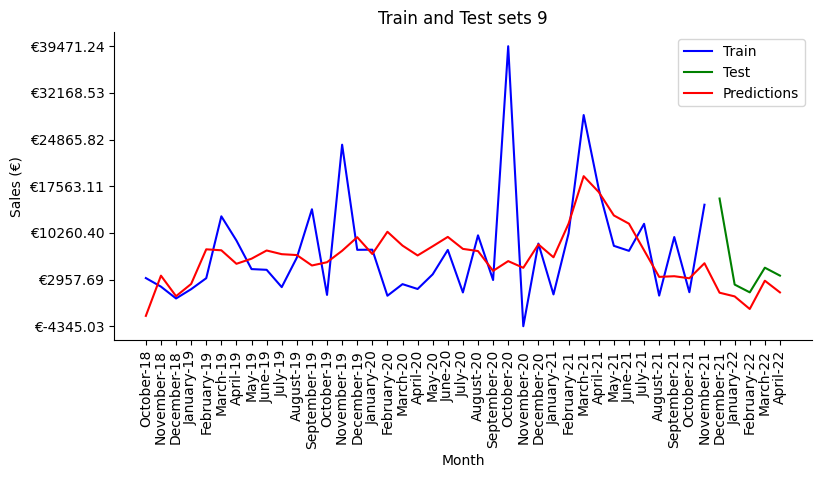

In [248]:
train_val_predictions('9', forecast_autoarima9['Train'], forecast_autoarima9['Test'], forecast_autoarima9['Predictions'])

### out_data_agg9

In [197]:
split_list = [60,65,70,75,80,85,90]
best_split_autoarima(split_list, out_data_agg9)

,Split,Train Error,Test Error
0,60,4675.204,5559.693
1,65,4738.129,4706.277
2,70,4696.093,5007.329
3,75,4765.425,3914.908
4,80,5019.904,4282.625
5,85,4794.299,3567.814
6,90,4738.641,2402.975


In [198]:
forecast_autoarima9_out = autoarima_forecast(90, out_data_agg9)
forecast_autoarima9_out['Predictions']

,Date,Sales Predictions
0,2018-10-01,2163.607445
1,2018-11-01,9921.893025
2,2018-12-01,6193.896605
3,2019-01-01,-1384.366926
4,2019-02-01,2593.904402
5,2019-03-01,8982.573355
6,2019-04-01,6685.586117
7,2019-05-01,6271.668174
8,2019-06-01,5665.534018
9,2019-07-01,5156.755730


In [199]:
forecast_autoarima9_out['Performance']

,Measure,Train Error,Test Error
0,MAE,3.907029e+03,2220.499
1,RMSE,4.738641e+03,2402.975
2,R^2,5.090000e-01,0.792
3,MAPE (%),7.340745e+17,0.994


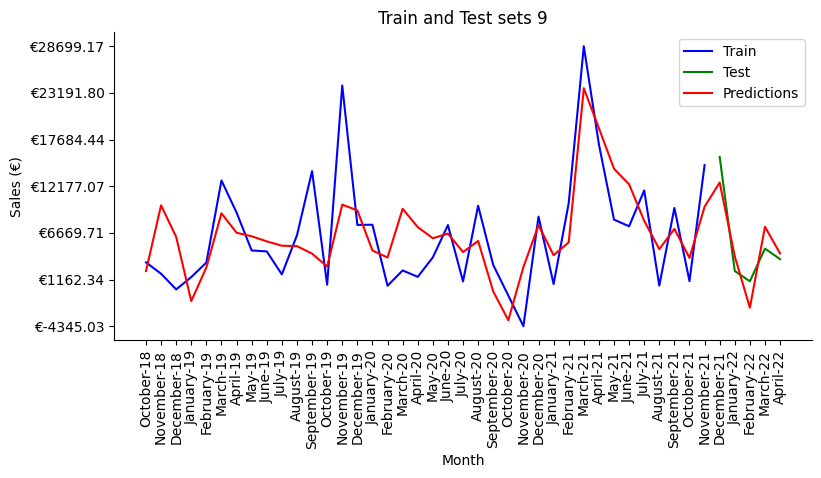

In [249]:
train_val_predictions('9', forecast_autoarima9_out['Train'], forecast_autoarima9_out['Test'], forecast_autoarima9_out['Predictions'])

<a class="anchor" id="xgboost1">
    
### XGBoost
    
</a>

### lag_data9

In [223]:
split_list = [60,65,70,75,80,85,90]
best_split_xgboost(split_list, lag_data9)

,Split,Train Error,Test Error
0,60,0.003,21668.695
1,65,0.003,14453.579
2,70,0.003,13225.165
3,75,0.003,4828.610
4,80,0.003,4398.148
5,85,0.003,4444.943
6,90,0.003,2038.649


In [171]:
split_data = data_split(lag_data9, 80)
train_sales = split_data['train_sales']
test_sales = split_data['test_sales']
train_market = split_data['train_market']
test_market = split_data['test_market']

model_parameters = pd.DataFrame(columns = ['Parameters', 'Train Error', 'Test Error'])

# define the parameter grid to search over
params_grid = {
    'alpha':[0,0.3,0.5,1,2,3,5],
    'subsample':[0.3,0.5,1],
    'learning_rate': [0.001, 0.01, 0.1, 0.5, 1],
               'max_depth': [1,2, 3, 5, 6, 7],
               'min_child_weight': [1, 3, 5, 7]}
grid = ParameterGrid(params_grid)

for p in grid:   
    model = xgb.XGBRegressor(**p)
    model.fit(train_market.iloc[:,1:], train_sales)
    forecast = model.predict(pd.concat([train_market, test_market]).drop('Date', axis=1))
    error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-forecast[:len(train_sales)])**2).mean()), 3)
    error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast[len(train_sales):])**2).mean()), 3)
    model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3530353043.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

In [172]:
model_parameters['Diff']=model_parameters['Test Error']-model_parameters['Train Error']
model_parameters['|Diff|']=abs(model_parameters['Diff'])
model_parameters.sort_values('|Diff|', ascending= True).head(30)

,Parameters,Train Error,Test Error,Diff,|Diff|
1284,"{'alpha': 1, 'learning_rate': 0.1, 'max_depth'...",4327.875,4329.218,1.343,1.343
924,"{'alpha': 0.5, 'learning_rate': 0.1, 'max_dept...",4327.795,4329.168,1.373,1.373
564,"{'alpha': 0.3, 'learning_rate': 0.1, 'max_dept...",4327.763,4329.148,1.385,1.385
204,"{'alpha': 0, 'learning_rate': 0.1, 'max_depth'...",4327.716,4329.117,1.401,1.401
2364,"{'alpha': 5, 'learning_rate': 0.1, 'max_depth'...",4328.772,4340.108,11.336,11.336
2004,"{'alpha': 3, 'learning_rate': 0.1, 'max_depth'...",4328.449,4339.882,11.433,11.433
1644,"{'alpha': 2, 'learning_rate': 0.1, 'max_depth'...",4328.288,4339.770,11.482,11.482
1992,"{'alpha': 3, 'learning_rate': 0.1, 'max_depth'...",4338.698,4363.550,24.852,24.852
1632,"{'alpha': 2, 'learning_rate': 0.1, 'max_depth'...",4338.534,4363.466,24.932,24.932
1272,"{'alpha': 1, 'learning_rate': 0.1, 'max_depth'...",4338.373,4363.379,25.006,25.006


In [173]:
model_parameters.iloc[1284,:]['Parameters']

{'alpha': 1,
 'learning_rate': 0.1,
 'max_depth': 7,
 'min_child_weight': 1,
 'subsample': 0.3}

In [174]:
forecast_xgboost9 = xgboost_forecast(80,lag_data9,1,0.1,7,1,0.3)

In [175]:
forecast_xgboost9['Performance']

,Measure,Train Error,Test Error
0,MAE,2680.413,3975.298
1,RMSE,4327.875,4329.218
2,R^2,0.776,0.403
3,MAPE (%),0.909,1.155


In [176]:
forecast_xgboost9['Predictions']

,Date,Sales Predictions
0,2019-04-01,8679.490234
1,2019-05-01,4855.661133
2,2019-06-01,5159.585938
3,2019-07-01,2107.676758
4,2019-08-01,7018.834473
5,2019-09-01,9265.794922
6,2019-10-01,3725.903564
7,2019-11-01,17355.671875
8,2019-12-01,7002.305664
9,2020-01-01,7506.614746


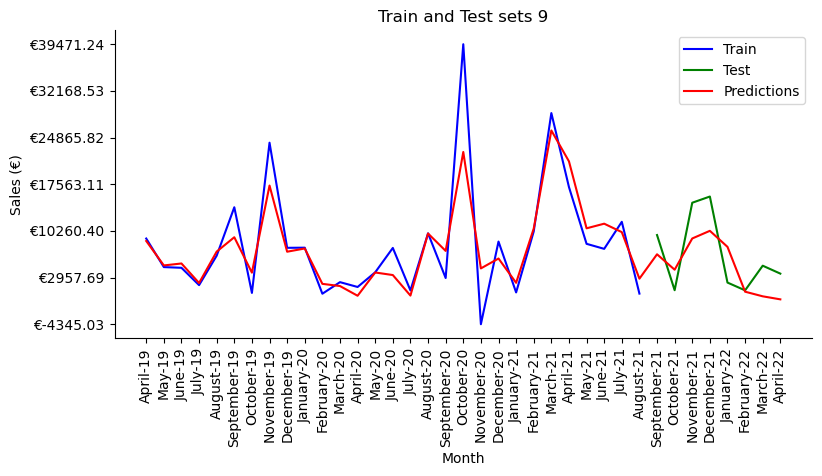

In [177]:
train_val_predictions('9', forecast_xgboost9['Train'], forecast_xgboost9['Test'], forecast_xgboost9['Predictions'])

<a class="anchor" id="xgboost1">
    
### Prophet
    
</a>

### data_agg9

In [393]:
split_list = [60,65,70,75,80,85,90]
best_split_prophet(split_list, data_agg9)

15:05:52 - cmdstanpy - INFO - Chain [1] start processing
15:05:53 - cmdstanpy - INFO - Chain [1] done processing
15:05:53 - cmdstanpy - INFO - Chain [1] start processing
15:06:08 - cmdstanpy - INFO - Chain [1] done processing
15:06:08 - cmdstanpy - INFO - Chain [1] start processing
15:06:08 - cmdstanpy - INFO - Chain [1] done processing
15:06:08 - cmdstanpy - INFO - Chain [1] start processing
15:06:08 - cmdstanpy - INFO - Chain [1] done processing
15:06:09 - cmdstanpy - INFO - Chain [1] start processing
15:06:09 - cmdstanpy - INFO - Chain [1] done processing
15:06:09 - cmdstanpy - INFO - Chain [1] start processing
15:06:09 - cmdstanpy - INFO - Chain [1] done processing
15:06:10 - cmdstanpy - INFO - Chain [1] start processing
15:06:10 - cmdstanpy - INFO - Chain [1] done processing
15:06:10 - cmdstanpy - INFO - Chain [1] start processing
15:06:10 - cmdstanpy - INFO - Chain [1] done processing


,Split,Train Error,Test Error
0,60,0.279,30722.753
1,65,0.355,112168.473
2,70,1053.528,49084.448
3,75,1849.533,14228.534
4,80,2006.793,20154.157
5,85,2051.970,21350.654
6,90,2641.015,22115.167
7,year,1877.050,13508.404


In [394]:
split_data = data_split(data_agg9, 75)
train_sales = split_data['train_sales']
test_sales = split_data['test_sales']
train_market = split_data['train_market']
test_market = split_data['test_market']
prophet_data_train = pd.concat([train_market, train_sales], axis=1)
prophet_data_train.rename(columns={'Date': 'ds', 'Adjusted Sales (€)': 'y'}, inplace=True)
future = pd.concat([train_market, test_market])
model_parameters = pd.DataFrame(columns = ['Parameters'])
for p in grid:   
    train_model =Prophet(seasonality_mode = p['seasonality_mode'],
                         changepoint_prior_scale = p['changepoint_prior_scale'],
                         changepoint_range=p['changepoint_range'],
                         seasonality_prior_scale=p['seasonality_prior_scale']
                         )
    for column in train_market.columns[1:]:
        train_model.add_regressor(column)
    train_model.fit(prophet_data_train)
    forecast = train_model.predict(future.rename(columns={'Date': 'ds'}))
    error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-forecast['yhat'][:len(train_sales)].values)**2).mean()), 3)
    error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast['yhat'][len(train_sales):].values)**2).mean()), 3)
    model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)

15:07:57 - cmdstanpy - INFO - Chain [1] start processing
15:07:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\2662185532.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:07:58 - cmdstanpy - INFO - Chain [1] start processing
15:07:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\2662185532.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:07:58 - cmdstanpy - INFO - Chain [1] start processing
15:07:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\Ap

15:08:30 - cmdstanpy - INFO - Chain [1] start processing
15:08:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\2662185532.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:08:31 - cmdstanpy - INFO - Chain [1] start processing
15:08:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\2662185532.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:08:31 - cmdstanpy - INFO - Chain [1] start processing
15:08:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\Ap

In [395]:
model_parameters['Diff']=model_parameters['Test Error']-model_parameters['Train Error']
model_parameters['|Diff|']= abs(model_parameters['Diff'])
model_parameters.sort_values('|Diff|', ascending= True).head(30)

,Parameters,Test Error,Train Error,Diff,|Diff|
25,"{'changepoint_prior_scale': 0.5, 'changepoint_...",6463.928,6767.872,-303.944,303.944
19,"{'changepoint_prior_scale': 0.3, 'changepoint_...",6458.683,6768.631,-309.948,309.948
1,"{'changepoint_prior_scale': 0.1, 'changepoint_...",6455.503,6768.568,-313.065,313.065
31,"{'changepoint_prior_scale': 0.5, 'changepoint_...",6432.776,6769.409,-336.633,336.633
13,"{'changepoint_prior_scale': 0.3, 'changepoint_...",6421.876,6771.986,-350.110,350.110
7,"{'changepoint_prior_scale': 0.1, 'changepoint_...",6332.434,6791.695,-459.261,459.261
6,"{'changepoint_prior_scale': 0.1, 'changepoint_...",16337.621,7393.128,8944.493,8944.493
30,"{'changepoint_prior_scale': 0.5, 'changepoint_...",16410.116,7392.577,9017.539,9017.539
0,"{'changepoint_prior_scale': 0.1, 'changepoint_...",16428.083,7393.060,9035.023,9035.023
24,"{'changepoint_prior_scale': 0.5, 'changepoint_...",16434.544,7392.807,9041.737,9041.737


In [396]:
model_parameters.iloc[25,:]['Parameters']

{'changepoint_prior_scale': 0.5,
 'changepoint_range': 0.6,
 'seasonality_mode': 'multiplicative',
 'seasonality_prior_scale': 0.1}

In [410]:
forecast_prophet9 = prophet_forecast(75, data_agg9,0.5, 0.6, 'multiplicative', 0.1 )

15:15:52 - cmdstanpy - INFO - Chain [1] start processing
15:15:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\514556311.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result.rename(columns={'ds': 'Date', 'yhat': 'Sales Predictions'}, inplace = True)
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\514556311.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result['Date'] = result['Date'].dt.strftime('%Y-%m-%d')


In [411]:
forecast_prophet9['Performance']

,Measure,Train Error,Test Error
0,MAE,4.718840e+03,5107.579
1,RMSE,6.767872e+03,6463.928
2,R^2,4.290000e-01,-0.456
3,MAPE (%),3.865198e+17,1.960


In [412]:
forecast_prophet9['Predictions']

,Date,Sales Predictions
0,2018-10-01,1488.442287
1,2018-11-01,1689.456246
2,2018-12-01,2746.388480
3,2019-01-01,3861.597588
4,2019-02-01,5651.996576
5,2019-03-01,5189.074812
6,2019-04-01,4229.822697
7,2019-05-01,5452.941059
8,2019-06-01,8416.616132
9,2019-07-01,5626.572386


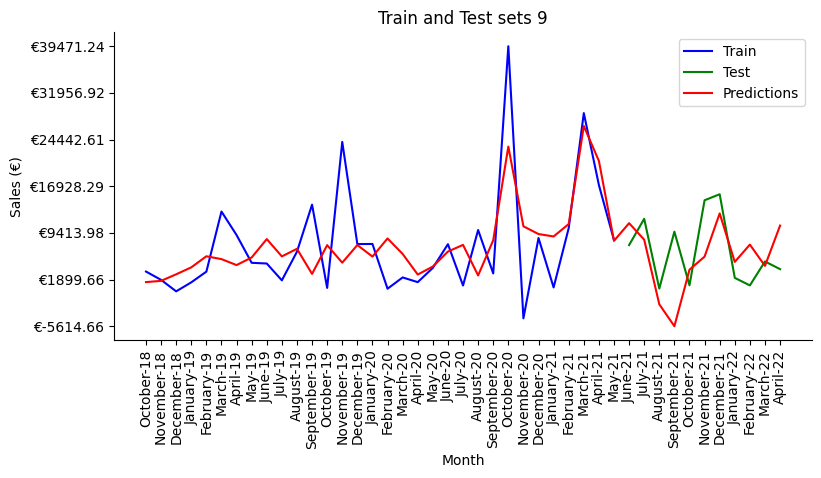

In [413]:
train_val_predictions('9', forecast_prophet9['Train'], forecast_prophet9['Test'], forecast_prophet9['Predictions'])

### Final Model

In [1399]:
# Values we have to predict
test_set[test_set['Mapped_GCK']=='#9']

,Month Year,Mapped_GCK,Sales_EUR
50,2022-03-01,#9,NaN
51,2022-06-01,#9,NaN
52,2022-07-01,#9,NaN
53,2022-08-01,#9,NaN
54,2022-09-01,#9,NaN
55,2022-10-01,#9,NaN
56,2022-11-01,#9,NaN
57,2022-12-01,#9,NaN
58,2023-01-01,#9,NaN
59,2023-02-01,#9,NaN


In [1400]:
# Arranging the dataset that will be used for the prediction
test_data_9=pd.DataFrame(index=test_set[test_set['Mapped_GCK']=='#9']['Month Year'],columns=lag_data9.columns).drop(
        columns='Unnamed: 0')
test_data_9.head()

,Shipments Index Machinery & Electricals United Kingdom,Price of Copper World,Adjusted Sales (€)
Month Year,,,
2022-03-01,NaN,NaN,NaN
2022-06-01,NaN,NaN,NaN
2022-07-01,NaN,NaN,NaN
2022-08-01,NaN,NaN,NaN
2022-09-01,NaN,NaN,NaN


In [1401]:
# Considering that the variables used have lags and that we have already predicted for some of the features, 
#we already have values we can fill
test_data_9.iloc[:,0]=market_data_pred['Shipments Index Machinery & Electricals United Kingdom'][208:218].values
test_data_9.iloc[:,1]=market_data_pred['Price of Copper World '][207:217].values

In [1402]:
final_9 = XGBRegressor(alpha=1, subsample=0.3, learning_rate=0.1, max_depth=7,
                           min_child_weight=1)

final_9.fit(lag_data9.drop(columns='Adjusted Sales (€)').iloc[:,1:], lag_data9['Adjusted Sales (€)'])
        
future = pd.DataFrame(test_data_9.iloc[:,:-1]).astype(float)
forecast = final_9.predict(future)

final_predictions_9=list(forecast)
final_predictions_9

[6182.1836,
 12237.436,
 15205.705,
 964.4625,
 964.4625,
 12673.554,
 15205.705,
 3665.9968,
 16008.024,
 6046.3125]

<a class="anchor" id="gck11">
    
## Product Group 11
    
</a>

<a class="anchor" id="mean1">
    
### Mean
    
</a>

### data_agg11

In [199]:
split_list = [60,65,70,75,80,85,90,'year']
best_split_mean(split_list, data_agg11)

,Split,Train Error,Test Error
0,60,990116.269,987743.327
1,65,974166.336,1025180.052
2,70,966608.593,1060427.948
3,75,942808.687,1130716.483
4,80,929979.877,1200646.537
5,85,1013998.025,838673.843
6,90,1013274.881,767046.347
7,year,951488.374,1105029.113


In [200]:
forecast_mean11 = mean_forecast(85, data_agg11)

In [201]:
forecast_mean11['Performance']

,Measure,Train Error,Test Error
0,MAE,827632.773,739610.019
1,RMSE,1013998.025,838673.843
2,R^2,0.000,-0.002
3,MAPE (%),3.121,1.401


In [202]:
forecast_mean11['Predictions']

,Date,Sales Predictions
0,2018-10-01,1.560561e+06
1,2018-11-01,1.560561e+06
2,2018-12-01,1.560561e+06
3,2019-01-01,1.560561e+06
4,2019-02-01,1.560561e+06
5,2019-03-01,1.560561e+06
6,2019-04-01,1.560561e+06
7,2019-05-01,1.560561e+06
8,2019-06-01,1.560561e+06
9,2019-07-01,1.560561e+06


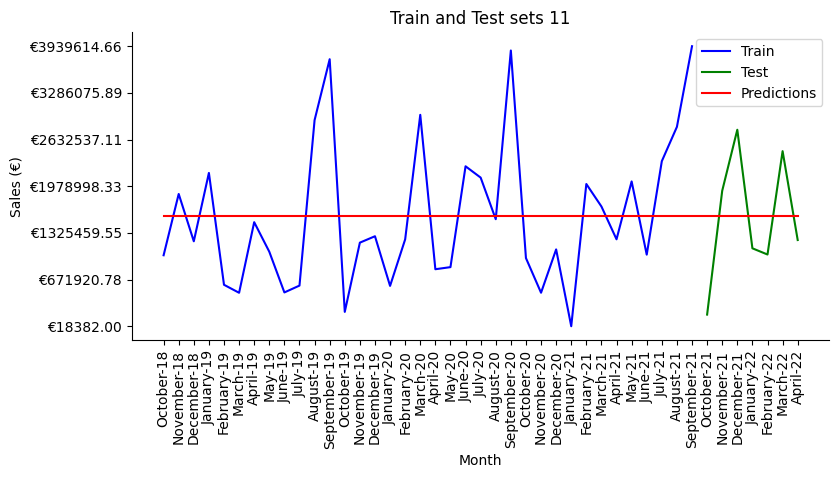

In [203]:
train_val_predictions('11', forecast_mean11['Train'], forecast_mean11['Test'], forecast_mean11['Predictions'])

<a class="anchor" id="median11">
    
### Median
    
</a>

### data_agg11

In [101]:
split_list = [60,65,70,75,80,85,90]
best_split_median(split_list, data_agg11)

,Split,Train Error,Test Error
0,60,1032272.810,1066916.456
1,65,1007856.725,1125959.243
2,70,993211.828,1170861.911
3,75,967843.291,1234246.065
4,80,958612.145,1311834.630
5,85,1064897.531,887586.354
6,90,1056278.922,887846.129


In [102]:
forecast_median11 = median_forecast(85, data_agg11)
forecast_median11['Predictions']

,Date,Sales Predictions
0,2018-10-01,1.235270e+06
1,2018-11-01,1.235270e+06
2,2018-12-01,1.235270e+06
3,2019-01-01,1.235270e+06
4,2019-02-01,1.235270e+06
5,2019-03-01,1.235270e+06
6,2019-04-01,1.235270e+06
7,2019-05-01,1.235270e+06
8,2019-06-01,1.235270e+06
9,2019-07-01,1.235270e+06


In [103]:
forecast_median11['Performance']

,Measure,Train Error,Test Error
0,MAE,786765.384,693139.761
1,RMSE,1064897.531,887586.354
2,R^2,-0.103,-0.122
3,MAPE (%),2.445,1.079


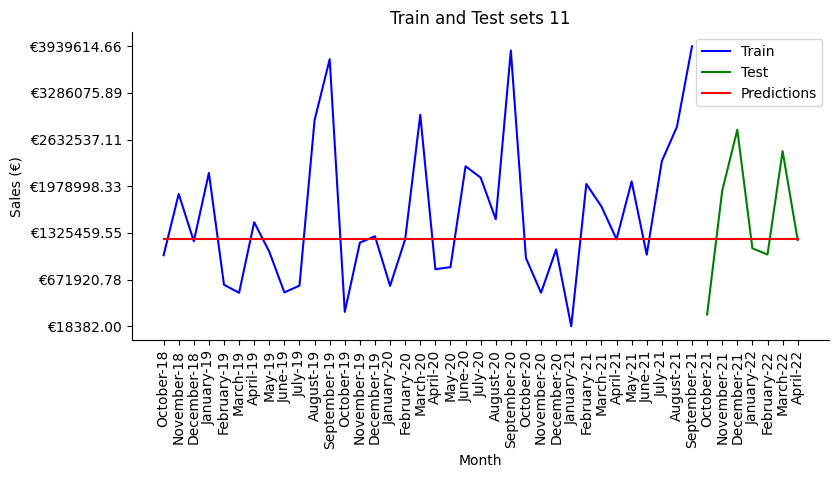

In [104]:
train_val_predictions('11', forecast_median11['Train'], forecast_median11['Test'], forecast_median11['Predictions'])

<a class="anchor" id="auto_arima11">
    
### Auto Arima
    
</a>

### data_agg11

In [201]:
split_list = [60,65,70,75,80,85,90]
best_split_autoarima(split_list, data_agg11)

,Split,Train Error,Test Error
0,60,920044.769,823884.066
1,65,916424.591,785871.818
2,70,897699.243,797381.820
3,75,883195.497,877376.783
4,80,883540.754,942659.218
5,85,909285.870,660907.701
6,90,903046.379,578488.649


In [202]:
forecast_autoarima11 = autoarima_forecast(90, data_agg11)
forecast_autoarima11['Predictions']

,Date,Sales Predictions
0,2018-10-01,8.898070e+05
1,2018-11-01,1.299681e+06
2,2018-12-01,1.798179e+06
3,2019-01-01,1.186136e+06
4,2019-02-01,1.222767e+06
5,2019-03-01,1.774496e+06
6,2019-04-01,1.375910e+06
7,2019-05-01,1.196464e+06
8,2019-06-01,1.356177e+06
9,2019-07-01,1.789749e+06


In [203]:
forecast_autoarima11['Performance']

,Measure,Train Error,Test Error
0,MAE,717791.262,483821.772
1,RMSE,903046.379,578488.649
2,R^2,0.206,0.396
3,MAPE (%),2.218,0.270


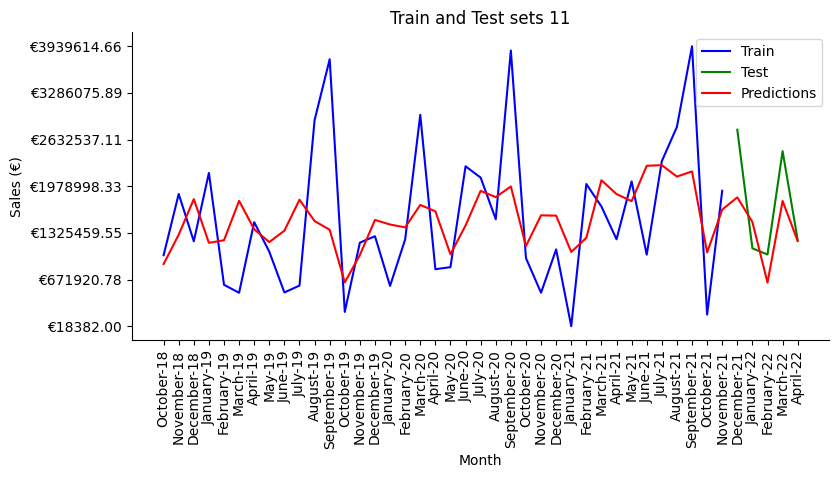

In [250]:
train_val_predictions('11', forecast_autoarima11['Train'], forecast_autoarima11['Test'], forecast_autoarima11['Predictions'])

<a class="anchor" id="xgboost1">
    
### XGBoost
    
</a>

### lag_data11

In [86]:
split_list = [60,65,70,75,80,85,90]
best_split_xgboost(split_list, lag_data11)

C:\Users\Ruben\AppData\Local\Temp\ipykernel_7916\658444845.py:22: RuntimeWarning: Mean of empty slice.
  error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast[len(train_sales):])**2).mean()), 3)
C:\ProgramData\anaconda3\lib\site-packages\numpy\core\_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


,Split,Train Error,Test Error
0,60,0.228,831225.918
1,65,0.247,808696.177
2,70,0.216,780915.074
3,75,0.221,882909.347
4,80,0.211,691737.542
5,85,0.227,740312.499
6,90,0.235,301996.715
7,year,0.232,NaN


In [161]:
split_data = data_split(lag_data11, 80)
train_sales = split_data['train_sales']
test_sales = split_data['test_sales']
train_market = split_data['train_market']
test_market = split_data['test_market']

model_parameters = pd.DataFrame(columns = ['Parameters', 'Train Error', 'Test Error'])

# define the parameter grid to search over
params_grid = {
    'alpha':[0,0.3,0.5,1,2,3,5],
    'subsample':[0.3,0.5,1],
    'learning_rate': [0.001, 0.01, 0.1, 0.5, 1],
               'max_depth': [1,2, 3, 5, 6, 7],
               'min_child_weight': [1, 3, 5, 7]}
grid = ParameterGrid(params_grid)

for p in grid:   
    model = xgb.XGBRegressor(**p)
    model.fit(train_market.iloc[:,1:], train_sales)
    forecast = model.predict(pd.concat([train_market, test_market]).drop('Date', axis=1))
    error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-forecast[:len(train_sales)])**2).mean()), 3)
    error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast[len(train_sales):])**2).mean()), 3)
    model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1578437400.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

In [165]:
model_parameters['Diff']=model_parameters['Test Error']-model_parameters['Train Error']
model_parameters['|Diff|']=abs(model_parameters['Diff'])
model_parameters.sort_values('|Diff|', ascending= True).head(30)

,Parameters,Train Error,Test Error,Diff,|Diff|
2451,"{'alpha': 5, 'learning_rate': 1, 'max_depth': ...",868857.648,868046.737,-810.911,810.911
2091,"{'alpha': 3, 'learning_rate': 1, 'max_depth': ...",868858.274,868046.312,-811.962,811.962
1731,"{'alpha': 2, 'learning_rate': 1, 'max_depth': ...",868858.535,868046.183,-812.352,812.352
1371,"{'alpha': 1, 'learning_rate': 1, 'max_depth': ...",868859.241,868046.066,-813.175,813.175
1011,"{'alpha': 0.5, 'learning_rate': 1, 'max_depth'...",868859.183,868045.791,-813.392,813.392
651,"{'alpha': 0.3, 'learning_rate': 1, 'max_depth'...",868859.392,868045.294,-814.098,814.098
291,"{'alpha': 0, 'learning_rate': 1, 'max_depth': ...",868859.846,868045.508,-814.338,814.338
702,"{'alpha': 0.3, 'learning_rate': 1, 'max_depth'...",771555.889,762672.251,-8883.638,8883.638
714,"{'alpha': 0.3, 'learning_rate': 1, 'max_depth'...",771555.889,762672.251,-8883.638,8883.638
690,"{'alpha': 0.3, 'learning_rate': 1, 'max_depth'...",771555.889,762672.251,-8883.638,8883.638


In [166]:
model_parameters.iloc[2451,:]['Parameters']

{'alpha': 5,
 'learning_rate': 1,
 'max_depth': 1,
 'min_child_weight': 3,
 'subsample': 0.3}

In [167]:
forecast_xgboost11 = xgboost_forecast(80,lag_data11,5,1,1,3,0.3)

In [168]:
forecast_xgboost11['Performance']

,Measure,Train Error,Test Error
0,MAE,682217.598,588443.318
1,RMSE,868857.648,868046.737
2,R^2,0.331,-0.614
3,MAPE (%),2.408,0.428


In [169]:
forecast_xgboost11['Predictions']

,Date,Sales Predictions
0,2020-01-01,1.819890e+06
1,2020-02-01,1.586212e+05
2,2020-03-01,3.234048e+06
3,2020-04-01,1.161094e+06
4,2020-05-01,-8.778607e+05
5,2020-06-01,2.191018e+06
6,2020-07-01,2.997504e+06
7,2020-08-01,3.443029e+06
8,2020-09-01,4.024360e+06
9,2020-10-01,8.968516e+05


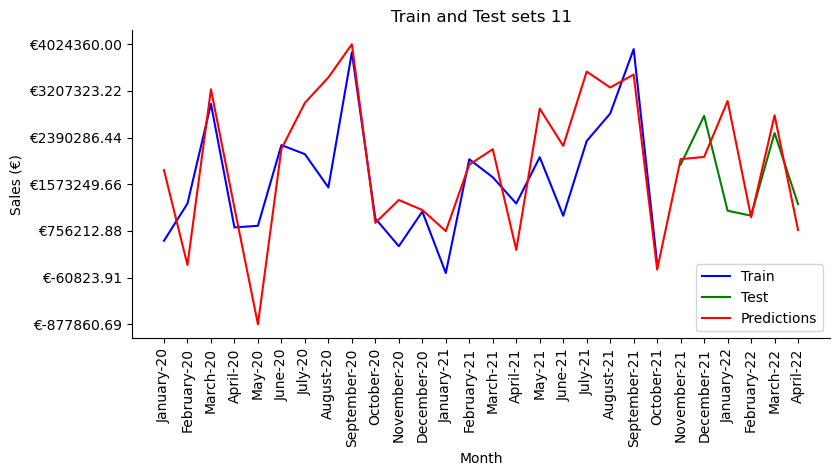

In [170]:
train_val_predictions('11', forecast_xgboost11['Train'], forecast_xgboost11['Test'], forecast_xgboost11['Predictions'])

<a class="anchor" id="xgboost1">
    
### Prophet
    
</a>

### data_agg11

In [405]:
split_list = [60,65,70,75,80,85,90]
best_split_prophet(split_list, data_agg11)

15:12:42 - cmdstanpy - INFO - Chain [1] start processing
15:13:22 - cmdstanpy - INFO - Chain [1] done processing
15:13:23 - cmdstanpy - INFO - Chain [1] start processing
15:13:57 - cmdstanpy - INFO - Chain [1] done processing
15:13:57 - cmdstanpy - INFO - Chain [1] start processing
15:13:57 - cmdstanpy - INFO - Chain [1] done processing
15:13:57 - cmdstanpy - INFO - Chain [1] start processing
15:13:58 - cmdstanpy - INFO - Chain [1] done processing
15:13:58 - cmdstanpy - INFO - Chain [1] start processing
15:13:58 - cmdstanpy - INFO - Chain [1] done processing
15:13:58 - cmdstanpy - INFO - Chain [1] start processing
15:13:58 - cmdstanpy - INFO - Chain [1] done processing
15:13:59 - cmdstanpy - INFO - Chain [1] start processing
15:13:59 - cmdstanpy - INFO - Chain [1] done processing
15:13:59 - cmdstanpy - INFO - Chain [1] start processing
15:13:59 - cmdstanpy - INFO - Chain [1] done processing


,Split,Train Error,Test Error
0,60,22.768,2076068.249
1,65,11.903,7973108.791
2,70,280370.028,1165069.854
3,75,338349.399,1855761.745
4,80,340542.059,1619464.516
5,85,363413.870,1130543.088
6,90,413263.689,584022.817
7,year,275867.494,1216830.508


In [406]:
split_data = data_split(data_agg11, 70)
train_sales = split_data['train_sales']
test_sales = split_data['test_sales']
train_market = split_data['train_market']
test_market = split_data['test_market']
prophet_data_train = pd.concat([train_market, train_sales], axis=1)
prophet_data_train.rename(columns={'Date': 'ds', 'Adjusted Sales (€)': 'y'}, inplace=True)
future = pd.concat([train_market, test_market])
model_parameters = pd.DataFrame(columns = ['Parameters'])
for p in grid:   
    train_model =Prophet(seasonality_mode = p['seasonality_mode'],
                         changepoint_prior_scale = p['changepoint_prior_scale'],
                         changepoint_range=p['changepoint_range'],
                         seasonality_prior_scale=p['seasonality_prior_scale']
                         )
    for column in train_market.columns[1:]:
        train_model.add_regressor(column)
    train_model.fit(prophet_data_train)
    forecast = train_model.predict(future.rename(columns={'Date': 'ds'}))
    error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-forecast['yhat'][:len(train_sales)].values)**2).mean()), 3)
    error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast['yhat'][len(train_sales):].values)**2).mean()), 3)
    model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)

15:15:01 - cmdstanpy - INFO - Chain [1] start processing
15:15:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\2703262269.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:15:02 - cmdstanpy - INFO - Chain [1] start processing
15:15:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\2703262269.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:15:02 - cmdstanpy - INFO - Chain [1] start processing
15:15:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\Ap

15:15:09 - cmdstanpy - INFO - Chain [1] start processing
15:15:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\2703262269.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:15:09 - cmdstanpy - INFO - Chain [1] start processing
15:15:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\2703262269.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:15:09 - cmdstanpy - INFO - Chain [1] start processing
15:15:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\Ap

In [407]:
model_parameters['Diff']=model_parameters['Test Error']-model_parameters['Train Error']
model_parameters['|Diff|']= abs(model_parameters['Diff'])
model_parameters.sort_values('|Diff|', ascending= True).head(30)

,Parameters,Test Error,Train Error,Diff,|Diff|
26,"{'changepoint_prior_scale': 0.5, 'changepoint_...",894820.609,444070.571,450750.038,450750.038
32,"{'changepoint_prior_scale': 0.5, 'changepoint_...",907624.784,444551.576,463073.208,463073.208
2,"{'changepoint_prior_scale': 0.1, 'changepoint_...",1103665.667,451655.966,652009.701,652009.701
8,"{'changepoint_prior_scale': 0.1, 'changepoint_...",1115066.240,451612.897,663453.343,663453.343
14,"{'changepoint_prior_scale': 0.3, 'changepoint_...",1117282.385,452102.422,665179.963,665179.963
20,"{'changepoint_prior_scale': 0.3, 'changepoint_...",1119906.790,452046.389,667860.401,667860.401
17,"{'changepoint_prior_scale': 0.3, 'changepoint_...",1094574.108,295709.092,798865.016,798865.016
23,"{'changepoint_prior_scale': 0.3, 'changepoint_...",1094926.372,295725.570,799200.802,799200.802
5,"{'changepoint_prior_scale': 0.1, 'changepoint_...",1094969.343,295669.152,799300.191,799300.191
11,"{'changepoint_prior_scale': 0.1, 'changepoint_...",1095530.987,295695.221,799835.766,799835.766


In [408]:
model_parameters.iloc[26,:]['Parameters']

{'changepoint_prior_scale': 0.5,
 'changepoint_range': 0.6,
 'seasonality_mode': 'multiplicative',
 'seasonality_prior_scale': 1.0}

In [414]:
forecast_prophet11 = prophet_forecast(70, data_agg11,0.5, 0.6, 'multiplicative', 1.0 )

15:16:51 - cmdstanpy - INFO - Chain [1] start processing
15:16:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\514556311.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result.rename(columns={'ds': 'Date', 'yhat': 'Sales Predictions'}, inplace = True)
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\514556311.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result['Date'] = result['Date'].dt.strftime('%Y-%m-%d')


In [415]:
forecast_prophet11['Performance']

,Measure,Train Error,Test Error
0,MAE,367909.660,713780.384
1,RMSE,444070.571,894820.609
2,R^2,0.789,0.151
3,MAPE (%),1.452,1.178


In [416]:
forecast_prophet11['Predictions']

,Date,Sales Predictions
0,2018-10-01,9.699627e+05
1,2018-11-01,1.595008e+06
2,2018-12-01,1.502953e+06
3,2019-01-01,1.297337e+06
4,2019-02-01,1.292695e+06
5,2019-03-01,1.240090e+06
6,2019-04-01,1.330621e+06
7,2019-05-01,7.547740e+05
8,2019-06-01,8.137044e+05
9,2019-07-01,8.806061e+05


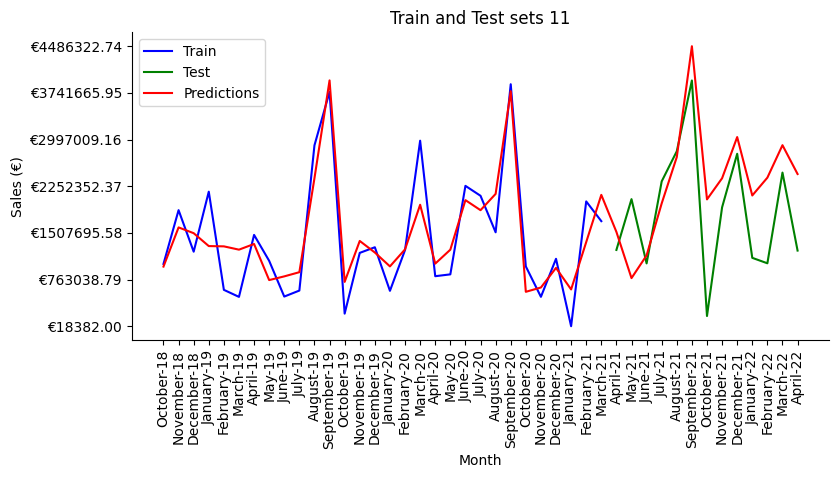

In [417]:
train_val_predictions('11', forecast_prophet11['Train'], forecast_prophet11['Test'], forecast_prophet11['Predictions'])

### Final Model

In [1403]:
final_predictions_11=list(np.repeat(np.mean(data_agg11['Adjusted Sales (€)']),10))
final_predictions_11

[1555211.9386083721,
 1555211.9386083721,
 1555211.9386083721,
 1555211.9386083721,
 1555211.9386083721,
 1555211.9386083721,
 1555211.9386083721,
 1555211.9386083721,
 1555211.9386083721,
 1555211.9386083721]

<a class="anchor" id="gck12">
    
## Product Group 12
    
</a>

<a class="anchor" id="mean1">
    
### Mean
    
</a>

### data_agg12

In [205]:
split_list = [60,65,70,75,80,85,90]
best_split_mean(split_list, data_agg12)

,Split,Train Error,Test Error
0,60,110906.393,217487.004
1,65,126145.394,196955.207
2,70,126151.551,201589.320
3,75,136136.349,178955.765
4,80,140042.656,165652.258
5,85,143156.736,152490.170
6,90,146049.384,125901.098
7,year,131768.394,190048.794


In [206]:
forecast_mean12 = mean_forecast(60, data_agg12)

In [207]:
forecast_mean12['Performance']

,Measure,Train Error,Test Error
0,MAE,96005.358,193281.513
1,RMSE,110906.393,217487.004
2,R^2,0.000,-3.325
3,MAPE (%),7.275,0.572


In [208]:
forecast_mean12['Predictions']

,Date,Sales Predictions
0,2018-10-01,116990.610681
1,2018-11-01,116990.610681
2,2018-12-01,116990.610681
3,2019-01-01,116990.610681
4,2019-02-01,116990.610681
5,2019-03-01,116990.610681
6,2019-04-01,116990.610681
7,2019-05-01,116990.610681
8,2019-06-01,116990.610681
9,2019-07-01,116990.610681


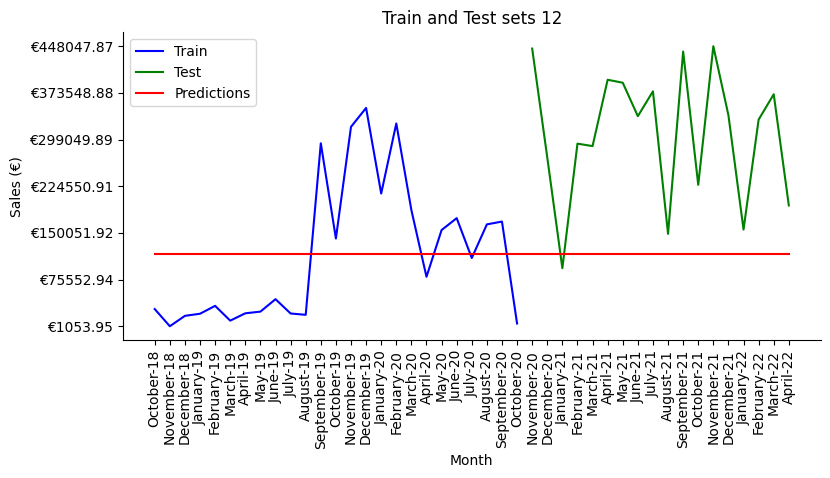

In [209]:
train_val_predictions('12', forecast_mean12['Train'], forecast_mean12['Test'], forecast_mean12['Predictions'])

<a class="anchor" id="median12">
    
### Median
    
</a>

### data_agg12

In [105]:
split_list = [60,65,70,75,80,85,90]
best_split_median(split_list, data_agg12)

,Split,Train Error,Test Error
0,60,116928.165,250597.349
1,65,128570.550,218389.365
2,70,127470.423,217682.298
3,75,136621.139,188486.543
4,80,140540.820,174661.517
5,85,144367.789,167248.428
6,90,147450.749,141356.247


In [107]:
forecast_median12 = median_forecast(90, data_agg12)
forecast_median12['Predictions']

,Date,Sales Predictions
0,2018-10-01,165872.3855
1,2018-11-01,165872.3855
2,2018-12-01,165872.3855
3,2019-01-01,165872.3855
4,2019-02-01,165872.3855
5,2019-03-01,165872.3855
6,2019-04-01,165872.3855
7,2019-05-01,165872.3855
8,2019-06-01,165872.3855
9,2019-07-01,165872.3855


In [108]:
forecast_median12['Performance']

,Measure,Train Error,Test Error
0,MAE,126193.877,116179.448
1,RMSE,147450.749,141356.247
2,R^2,-0.019,-1.684
3,MAPE (%),7.004,0.355


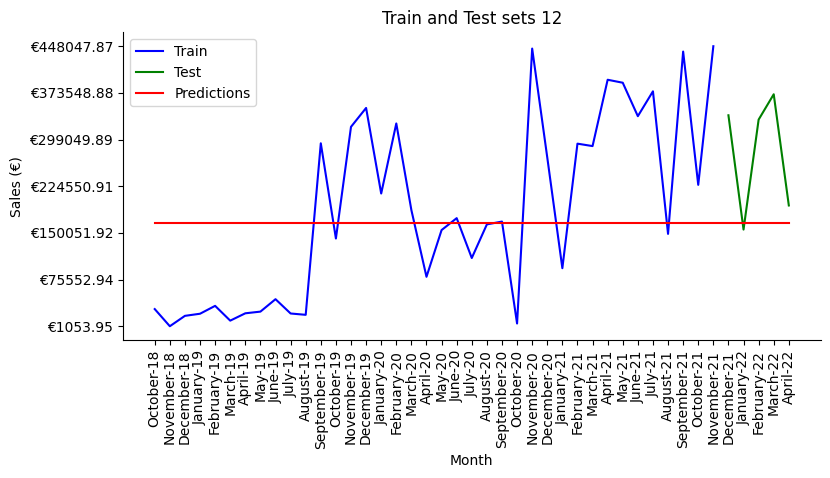

In [109]:
train_val_predictions('12', forecast_median12['Train'], forecast_median12['Test'], forecast_median12['Predictions'])

<a class="anchor" id="auto_arima12">
    
### Auto Arima
    
</a>

### data_agg12

In [205]:
split_list = [60,65,70,75,80,85,90]
best_split_autoarima(split_list, data_agg12)

,Split,Train Error,Test Error
0,60,103158.845,165060.787
1,65,109711.080,119804.484
2,70,104557.877,138629.117
3,75,112385.304,108324.313
4,80,112751.815,105402.031
5,85,116986.447,52463.955
6,90,114928.528,43761.752


In [206]:
forecast_autoarima12 = autoarima_forecast(90, data_agg12)
forecast_autoarima12['Predictions']

,Date,Sales Predictions
0,2018-10-01,-10502.854587
1,2018-11-01,220629.591701
2,2018-12-01,186617.762698
3,2019-01-01,70777.247754
4,2019-02-01,160102.762330
5,2019-03-01,167688.029514
6,2019-04-01,75718.507226
7,2019-05-01,150433.503197
8,2019-06-01,171439.113755
9,2019-07-01,137731.008241


In [207]:
forecast_autoarima12['Performance']

,Measure,Train Error,Test Error
0,MAE,99067.312,40050.390
1,RMSE,114928.528,43761.752
2,R^2,0.381,0.743
3,MAPE (%),7.611,0.161


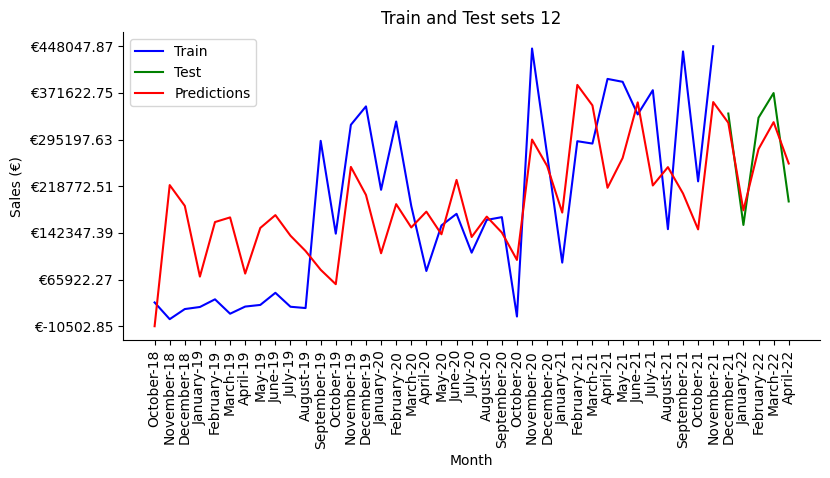

In [251]:
train_val_predictions('12', forecast_autoarima12['Train'], forecast_autoarima12['Test'], forecast_autoarima12['Predictions'])

<a class="anchor" id="xgboost1">
    
### XGBoost
    
</a>

### lag_data12

In [135]:
split_list = [60,65,70,75,80,85,90]
best_split_xgboost(split_list, lag_data12)

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\658444845.py:22: RuntimeWarning: Mean of empty slice.
  error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast[len(train_sales):])**2).mean()), 3)
C:\Users\migue\anaconda3\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


,Split,Train Error,Test Error
0,60,0.035,72547.216
1,65,0.039,81685.591
2,70,0.042,84671.901
3,75,0.042,74730.806
4,80,0.048,85989.637
5,85,0.038,92756.423
6,90,0.039,54808.174
7,year,0.038,NaN


In [144]:
split_data = data_split(lag_data12, 90)
train_sales = split_data['train_sales']
test_sales = split_data['test_sales']
train_market = split_data['train_market']
test_market = split_data['test_market']

model_parameters = pd.DataFrame(columns = ['Parameters', 'Train Error', 'Test Error'])

# define the parameter grid to search over
params_grid = {
    'alpha':[0,1,2,5],
    'subsample':[0.1,0.3,0.5,1],
    'learning_rate': [0.5,0.1, 0.01, 0.001],
               'max_depth': [1, 2, 3, 5, 6, 8],
               'min_child_weight': [1,3, 5]}
grid = ParameterGrid(params_grid)

for p in grid:   
    model = xgb.XGBRegressor(**p)
    model.fit(train_market.iloc[:,1:], train_sales)
    forecast = model.predict(pd.concat([train_market, test_market]).drop('Date', axis=1))
    error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-forecast[:len(train_sales)])**2).mean()), 3)
    error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast[len(train_sales):])**2).mean()), 3)
    model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2764079754.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

In [145]:
model_parameters['Diff']=model_parameters['Test Error']-model_parameters['Train Error']
model_parameters['|Diff|']=abs(model_parameters['Diff'])
model_parameters.sort_values('|Diff|', ascending= True).head(30)

,Parameters,Train Error,Test Error,Diff,|Diff|
198,"{'alpha': 0, 'learning_rate': 0.01, 'max_depth...",135597.965,135938.920,340.955,340.955
186,"{'alpha': 0, 'learning_rate': 0.01, 'max_depth...",135597.965,135938.920,340.955,340.955
174,"{'alpha': 0, 'learning_rate': 0.01, 'max_depth...",135597.965,135938.920,340.955,340.955
210,"{'alpha': 0, 'learning_rate': 0.01, 'max_depth...",135597.965,135938.920,340.955,340.955
486,"{'alpha': 1, 'learning_rate': 0.01, 'max_depth...",135598.051,135939.034,340.983,340.983
474,"{'alpha': 1, 'learning_rate': 0.01, 'max_depth...",135598.051,135939.034,340.983,340.983
498,"{'alpha': 1, 'learning_rate': 0.01, 'max_depth...",135598.051,135939.034,340.983,340.983
462,"{'alpha': 1, 'learning_rate': 0.01, 'max_depth...",135598.051,135939.034,340.983,340.983
786,"{'alpha': 2, 'learning_rate': 0.01, 'max_depth...",135598.119,135939.111,340.992,340.992
750,"{'alpha': 2, 'learning_rate': 0.01, 'max_depth...",135598.119,135939.111,340.992,340.992


In [156]:
model_parameters.iloc[738,:]['Parameters']

{'alpha': 2,
 'learning_rate': 0.01,
 'max_depth': 2,
 'min_child_weight': 3,
 'subsample': 0.5}

In [157]:
forecast_xgboost12 = xgboost_forecast(90,lag_data12,2,0.01,2,3,0.5)

In [158]:
forecast_xgboost12['Performance']

,Measure,Train Error,Test Error
0,MAE,115581.598,132566.137
1,RMSE,135651.636,136159.044
2,R^2,-0.208,-2.212
3,MAPE (%),1.100,0.449


In [159]:
forecast_xgboost12['Predictions']

,Date,Sales Predictions
0,2020-01-01,89986.968750
1,2020-02-01,168481.203125
2,2020-03-01,77456.867188
3,2020-04-01,90564.250000
4,2020-05-01,72115.218750
5,2020-06-01,128374.054688
6,2020-07-01,70355.000000
7,2020-08-01,77770.117188
8,2020-09-01,72495.953125
9,2020-10-01,99897.609375


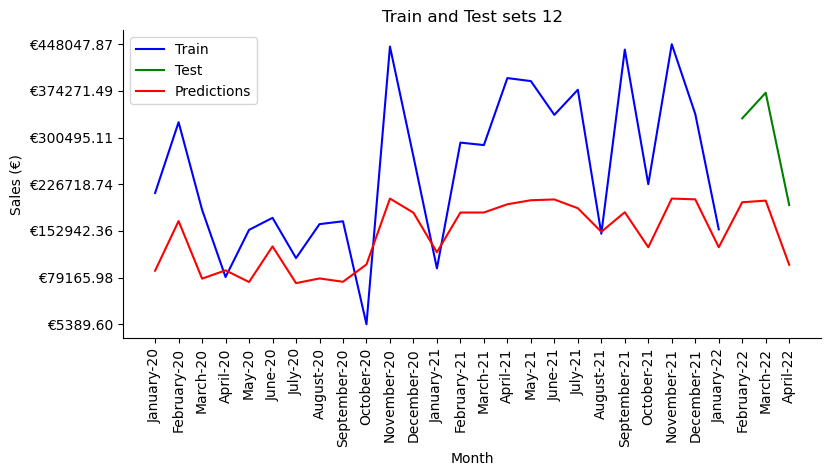

In [160]:
train_val_predictions('12', forecast_xgboost12['Train'], forecast_xgboost12['Test'], forecast_xgboost12['Predictions'])

<a class="anchor" id="xgboost1">
    
### Prophet
    
</a>

### data_agg12

In [423]:
split_list = [60,65,70,75,80,85,90]
best_split_prophet(split_list, data_agg12)

15:27:22 - cmdstanpy - INFO - Chain [1] start processing
15:27:38 - cmdstanpy - INFO - Chain [1] done processing
15:27:38 - cmdstanpy - INFO - Chain [1] start processing
15:27:38 - cmdstanpy - INFO - Chain [1] done processing
15:27:38 - cmdstanpy - INFO - Chain [1] start processing
15:27:38 - cmdstanpy - INFO - Chain [1] done processing
15:27:38 - cmdstanpy - INFO - Chain [1] start processing
15:27:39 - cmdstanpy - INFO - Chain [1] done processing
15:27:39 - cmdstanpy - INFO - Chain [1] start processing
15:27:39 - cmdstanpy - INFO - Chain [1] done processing
15:27:39 - cmdstanpy - INFO - Chain [1] start processing
15:27:39 - cmdstanpy - INFO - Chain [1] done processing
15:27:39 - cmdstanpy - INFO - Chain [1] start processing
15:27:39 - cmdstanpy - INFO - Chain [1] done processing
15:27:40 - cmdstanpy - INFO - Chain [1] start processing
15:27:40 - cmdstanpy - INFO - Chain [1] done processing


,Split,Train Error,Test Error
0,60,2.024,392129.640
1,65,10716.153,403637.854
2,70,46683.580,245415.368
3,75,58018.686,250980.610
4,80,59076.656,275831.210
5,85,61874.638,300109.221
6,90,60688.450,338017.762
7,year,55044.705,247021.362


In [424]:
split_data = data_split(data_agg12, 70)
train_sales = split_data['train_sales']
test_sales = split_data['test_sales']
train_market = split_data['train_market']
test_market = split_data['test_market']
prophet_data_train = pd.concat([train_market, train_sales], axis=1)
prophet_data_train.rename(columns={'Date': 'ds', 'Adjusted Sales (€)': 'y'}, inplace=True)
future = pd.concat([train_market, test_market])
model_parameters = pd.DataFrame(columns = ['Parameters'])
for p in grid:   
    train_model =Prophet(seasonality_mode = p['seasonality_mode'],
                         changepoint_prior_scale = p['changepoint_prior_scale'],
                         changepoint_range=p['changepoint_range'],
                         seasonality_prior_scale=p['seasonality_prior_scale']
                         )
    for column in train_market.columns[1:]:
        train_model.add_regressor(column)
    train_model.fit(prophet_data_train)
    forecast = train_model.predict(future.rename(columns={'Date': 'ds'}))
    error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-forecast['yhat'][:len(train_sales)].values)**2).mean()), 3)
    error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast['yhat'][len(train_sales):].values)**2).mean()), 3)
    model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)

15:27:55 - cmdstanpy - INFO - Chain [1] start processing
15:27:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\891609896.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:27:55 - cmdstanpy - INFO - Chain [1] start processing
15:27:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\891609896.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:27:55 - cmdstanpy - INFO - Chain [1] start processing
15:27:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppD

15:28:02 - cmdstanpy - INFO - Chain [1] start processing
15:28:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\891609896.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:28:02 - cmdstanpy - INFO - Chain [1] start processing
15:28:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\891609896.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:28:03 - cmdstanpy - INFO - Chain [1] start processing
15:28:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppD

In [425]:
model_parameters['Diff']=model_parameters['Test Error']-model_parameters['Train Error']
model_parameters['|Diff|']= abs(model_parameters['Diff'])
model_parameters.sort_values('|Diff|', ascending= True).head(30)

,Parameters,Test Error,Train Error,Diff,|Diff|
25,"{'changepoint_prior_scale': 0.5, 'changepoint_...",129564.300,50754.011,78810.289,78810.289
31,"{'changepoint_prior_scale': 0.5, 'changepoint_...",132200.009,50412.921,81787.088,81787.088
30,"{'changepoint_prior_scale': 0.5, 'changepoint_...",149621.395,65445.413,84175.982,84175.982
13,"{'changepoint_prior_scale': 0.3, 'changepoint_...",136094.355,51416.020,84678.335,84678.335
24,"{'changepoint_prior_scale': 0.5, 'changepoint_...",150306.341,65453.020,84853.321,84853.321
19,"{'changepoint_prior_scale': 0.3, 'changepoint_...",136936.883,51464.235,85472.648,85472.648
34,"{'changepoint_prior_scale': 0.5, 'changepoint_...",161520.540,61253.082,100267.458,100267.458
28,"{'changepoint_prior_scale': 0.5, 'changepoint_...",161538.264,61254.766,100283.498,100283.498
27,"{'changepoint_prior_scale': 0.5, 'changepoint_...",188586.361,80038.788,108547.573,108547.573
33,"{'changepoint_prior_scale': 0.5, 'changepoint_...",188591.475,80041.659,108549.816,108549.816


In [426]:
model_parameters.iloc[25,:]['Parameters']

{'changepoint_prior_scale': 0.5,
 'changepoint_range': 0.6,
 'seasonality_mode': 'multiplicative',
 'seasonality_prior_scale': 0.1}

In [427]:
forecast_prophet12 = prophet_forecast(70, data_agg12,0.5, 0.6, 'multiplicative', 0.1 )

15:29:16 - cmdstanpy - INFO - Chain [1] start processing
15:29:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\514556311.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result.rename(columns={'ds': 'Date', 'yhat': 'Sales Predictions'}, inplace = True)
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\514556311.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result['Date'] = result['Date'].dt.strftime('%Y-%m-%d')


In [428]:
forecast_prophet12['Performance']

,Measure,Train Error,Test Error
0,MAE,38087.461,112899.070
1,RMSE,50754.011,129564.300
2,R^2,0.838,-0.695
3,MAPE (%),1.313,0.364


In [429]:
forecast_prophet12['Predictions']

,Date,Sales Predictions
0,2018-10-01,33436.469791
1,2018-11-01,103.343529
2,2018-12-01,-566.943325
3,2019-01-01,-18506.584410
4,2019-02-01,11712.036285
5,2019-03-01,20444.992421
6,2019-04-01,4846.072730
7,2019-05-01,61931.563302
8,2019-06-01,71791.276412
9,2019-07-01,68983.204727


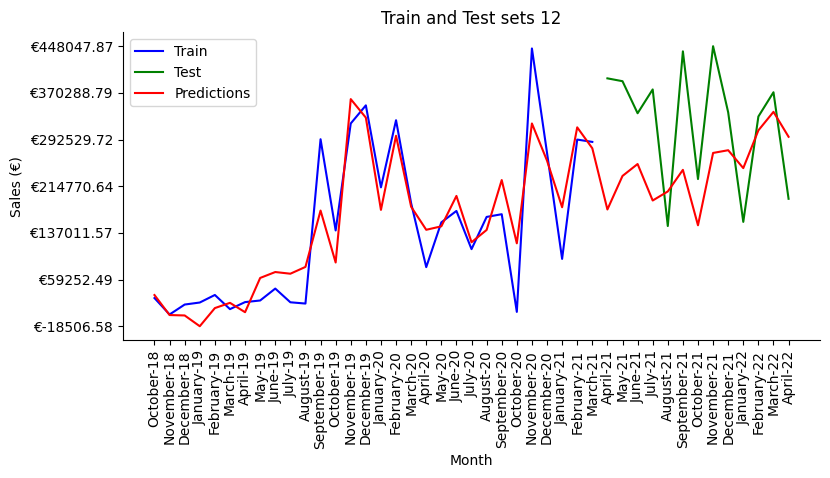

In [430]:
train_val_predictions('12', forecast_prophet12['Train'], forecast_prophet12['Test'], forecast_prophet12['Predictions'])

### Final Model

In [1404]:
# Values we have to predict
test_set[test_set['Mapped_GCK']=='#12']

,Month Year,Mapped_GCK,Sales_EUR
70,2022-03-01,#12,NaN
71,2022-06-01,#12,NaN
72,2022-07-01,#12,NaN
73,2022-08-01,#12,NaN
74,2022-09-01,#12,NaN
75,2022-10-01,#12,NaN
76,2022-11-01,#12,NaN
77,2022-12-01,#12,NaN
78,2023-01-01,#12,NaN
79,2023-02-01,#12,NaN


In [1405]:
# Arranging the dataset that will be used for the prediction
test_data_12=pd.DataFrame(index=test_set[test_set['Mapped_GCK']=='#12']['Month Year'],columns=data_agg12.columns).drop(
        columns='Unnamed: 0')
test_data_12.head()

,Producer Prices Electrical equipment United States,Production Index Machinery & Electricals Switzerland,Production Index Machinery and equipment n.e.c. Germany,Adjusted Sales (€)
Month Year,,,,
2022-03-01,NaN,NaN,NaN,NaN
2022-06-01,NaN,NaN,NaN,NaN
2022-07-01,NaN,NaN,NaN,NaN
2022-08-01,NaN,NaN,NaN,NaN
2022-09-01,NaN,NaN,NaN,NaN


In [1406]:
# Considering that the variables used have lags and that we have already predicted for some of the features, 
#we already have values we can fill
test_data_12.iloc[:9,0]=market_data_pred['Producer Prices Electrical equipment United States'][-9:].values
test_data_12.iloc[:8,1]=market_data_pred['Production Index Machinery & Electricals Switzerland'][-8:].values
test_data_12.iloc[:,2]=market_data_pred['Production Index Machinery and equipment n.e.c. Germany '][-10:].values
test_data_12.iloc[-1:,0]=test_data_8.iloc[4,5]

#### Production Index Machinery & Electricals Switzerland

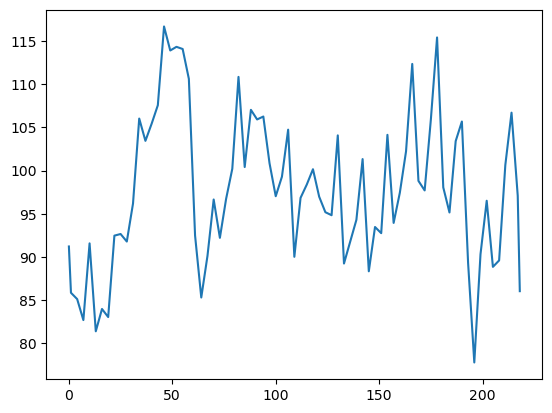

In [1407]:
plt.plot(market_data_pred.loc[:,'Production Index Machinery & Electricals Switzerland'])

In [1408]:
predict_pimes=pd.DataFrame(market_data_pred.set_index('Unnamed: 0').loc[:,
            'Production Index Machinery & Electricals Switzerland'].dropna()).reset_index().rename(columns={'Unnamed: 0':'ds',
            'Production Index Machinery & Electricals Switzerland':'y'})
predict_pimes.head()

,ds,y
0,2004-02-01,91.221862
1,2004-03-01,85.866287
2,2004-04-01,85.622508
3,2004-05-01,85.378729
4,2004-06-01,85.134950


In [1409]:
prophet_pimes=Prophet()
prophet_pimes.fit(predict_pimes)

23:17:11 - cmdstanpy - INFO - Chain [1] start processing
23:17:11 - cmdstanpy - INFO - Chain [1] done processing


In [1410]:
future = prophet_pimes.make_future_dataframe(periods=2,freq='m')
forecast = prophet_pimes.predict(future)

# Fill missing values
test_data_12.iloc[-2:,1]=forecast['yhat'][-2:]

In [1411]:
final_12=auto_arima(data_agg12.iloc[:,-1],X=data_agg12.iloc[:,1:4],stepwise=False)
forecast=final_12.predict(n_periods=10,X=test_data_12.iloc[:,:-1])
final_predictions_12=list(forecast.values)
final_predictions_12

[286522.9385312986,
 327818.5575896204,
 287875.13550130517,
 321433.16335369716,
 314634.7770742485,
 327105.3725560156,
 498867.2196026446,
 547749.8156262379,
 452789.21608788153,
 106479.12950757932]

<a class="anchor" id="gck13">
    
## Product Group 13
    
</a>

<a class="anchor" id="mean1">
    
### Mean
    
</a>

### data_agg13

In [219]:
split_list = [60,65,70,75,80,85,90]
best_split_mean(split_list, data_agg13)

,Split,Train Error,Test Error
0,60,16617.772,15175.936
1,65,16061.046,15988.280
2,70,17140.888,13266.544
3,75,17175.669,12221.132
4,80,17153.767,10730.553
5,85,16829.790,10992.957
6,90,16614.749,10556.250
7,year,17045.697,13387.946


In [220]:
forecast_mean13 = mean_forecast(80, data_agg13)

In [221]:
forecast_mean13['Performance']

,Measure,Train Error,Test Error
0,MAE,13292.563,9776.045
1,RMSE,17153.767,10730.553
2,R^2,0.000,-0.000
3,MAPE (%),1.184,0.586


In [222]:
forecast_mean13['Predictions']

,Date,Sales Predictions
0,2018-10-01,23699.867124
1,2018-11-01,23699.867124
2,2018-12-01,23699.867124
3,2019-01-01,23699.867124
4,2019-02-01,23699.867124
5,2019-03-01,23699.867124
6,2019-04-01,23699.867124
7,2019-05-01,23699.867124
8,2019-06-01,23699.867124
9,2019-07-01,23699.867124


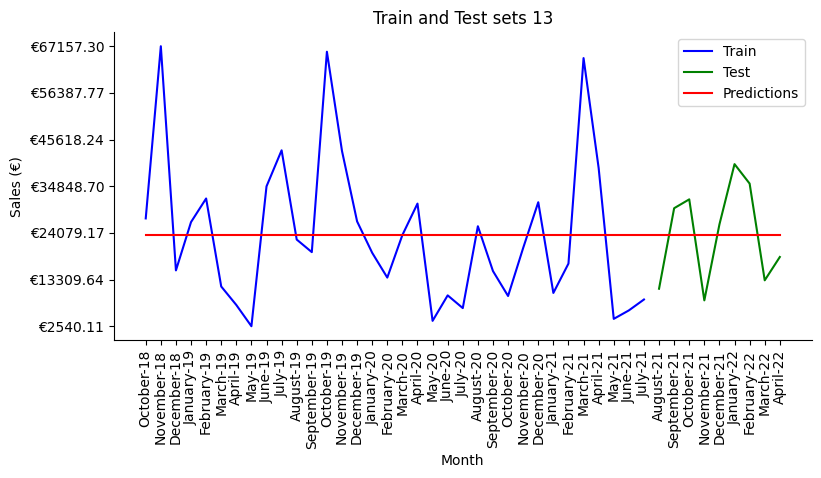

In [223]:
train_val_predictions('13', forecast_mean13['Train'], forecast_mean13['Test'], forecast_mean13['Predictions'])

<a class="anchor" id="median13">
    
### Median
    
</a>

### data_agg13

In [111]:
split_list = [60,65,70,75,80,85,90]
best_split_median(split_list, data_agg13)

,Split,Train Error,Test Error
0,60,16697.198,15149.332
1,65,16156.456,15916.014
2,70,17464.916,12677.763
3,75,17460.962,11614.280
4,80,17523.138,11349.567
5,85,17169.832,11871.059
6,90,16924.527,11955.420


In [112]:
forecast_median13 = median_forecast(80, data_agg13)
forecast_median13['Predictions']

,Date,Sales Predictions
0,2018-10-01,20120.95059
1,2018-11-01,20120.95059
2,2018-12-01,20120.95059
3,2019-01-01,20120.95059
4,2019-02-01,20120.95059
5,2019-03-01,20120.95059
6,2019-04-01,20120.95059
7,2019-05-01,20120.95059
8,2019-06-01,20120.95059
9,2019-07-01,20120.95059


In [113]:
forecast_median13['Performance']

,Measure,Train Error,Test Error
0,MAE,13035.432,10173.703
1,RMSE,17523.138,11349.567
2,R^2,-0.044,-0.119
3,MAPE (%),0.995,0.514


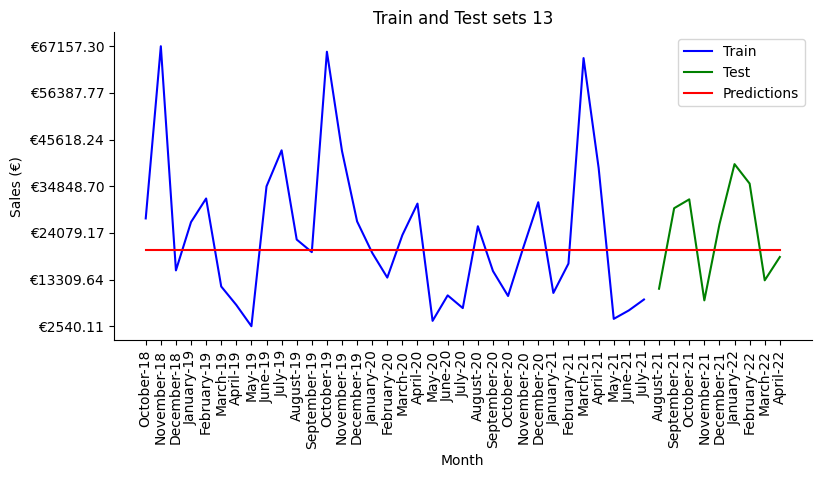

In [114]:
train_val_predictions('13', forecast_median13['Train'], forecast_median13['Test'], forecast_median13['Predictions'])

<a class="anchor" id="auto_arima13">
    
### Auto Arima
    
</a>

### data_agg13

In [209]:
split_list = [60,65,70,75,80,85,90]
best_split_autoarima(split_list, data_agg13)

,Split,Train Error,Test Error
0,60,15692.393,14458.746
1,65,15147.216,15247.919
2,70,16522.556,11997.849
3,75,16380.069,10392.038
4,80,16074.553,9465.366
5,85,16180.575,8925.583
6,90,15545.624,6757.074


In [210]:
forecast_autoarima13 = autoarima_forecast(90, data_agg13)
forecast_autoarima13['Predictions']

,Date,Sales Predictions
0,2018-10-01,23453.785125
1,2018-11-01,33166.418747
2,2018-12-01,29757.250204
3,2019-01-01,29631.381175
4,2019-02-01,26621.845421
5,2019-03-01,23446.879158
6,2019-04-01,20720.277288
7,2019-05-01,20572.783683
8,2019-06-01,19067.801881
9,2019-07-01,17319.355487


In [211]:
forecast_autoarima13['Performance']

,Measure,Train Error,Test Error
0,MAE,12466.862,5953.646
1,RMSE,15545.624,6757.074
2,R^2,0.125,0.547
3,MAPE (%),0.987,0.280


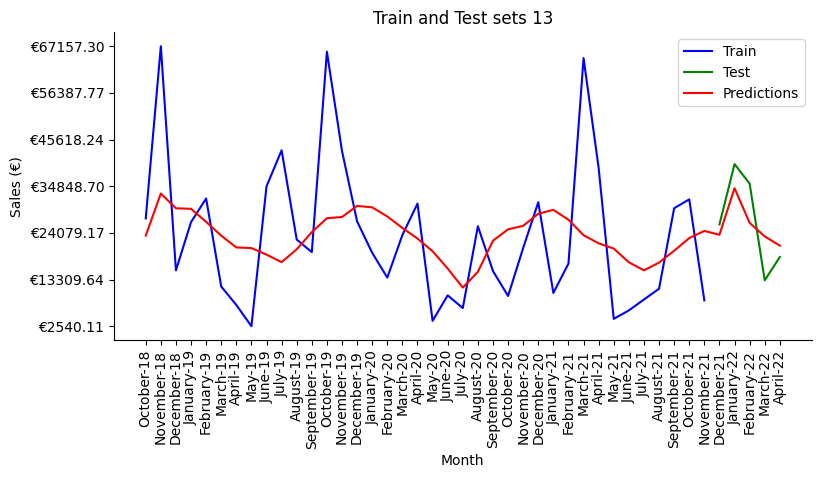

In [252]:
train_val_predictions('13', forecast_autoarima13['Train'], forecast_autoarima13['Test'], forecast_autoarima13['Predictions'])

<a class="anchor" id="xgboost1">
    
### XGBoost
    
</a>

### lag_data13

In [43]:
split_list = [60,65,70,75,80,85,90]
best_split_xgboost(split_list, lag_data13)

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\658444845.py:22: RuntimeWarning: Mean of empty slice.
  error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast[len(train_sales):])**2).mean()), 3)
C:\Users\migue\anaconda3\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


,Split,Train Error,Test Error
0,60,0.004,10923.669
1,65,0.003,12152.464
2,70,0.003,13798.174
3,75,0.003,15017.168
4,80,0.003,14171.700
5,85,0.003,20901.485
6,90,0.003,16849.950
7,year,0.004,NaN


In [116]:
split_data = data_split(lag_data13, 65)
train_sales = split_data['train_sales']
test_sales = split_data['test_sales']
train_market = split_data['train_market']
test_market = split_data['test_market']

model_parameters = pd.DataFrame(columns = ['Parameters', 'Train Error', 'Test Error'])

# define the parameter grid to search over
params_grid = {
    'alpha':[0,1,2,5],
    'subsample':[0.1,0.3,0.5,1],
    'learning_rate': [0.5,0.1, 0.01, 0.001],
               'max_depth': [1, 2, 3, 5, 6, 8],
               'min_child_weight': [1,3, 5]}
grid = ParameterGrid(params_grid)

for p in grid:   
    model = xgb.XGBRegressor(**p)
    model.fit(train_market.iloc[:,1:], train_sales)
    forecast = model.predict(pd.concat([train_market, test_market]).drop('Date', axis=1))
    error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-forecast[:len(train_sales)])**2).mean()), 3)
    error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast[len(train_sales):])**2).mean()), 3)
    model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\2927661763.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

In [117]:
model_parameters['Diff']=model_parameters['Test Error']-model_parameters['Train Error']
model_parameters['|Diff|']=abs(model_parameters['Diff'])
model_parameters.sort_values('|Diff|', ascending= True).head(30)

,Parameters,Train Error,Test Error,Diff,|Diff|
1073,"{'alpha': 5, 'learning_rate': 0.01, 'max_depth...",15909.046,15859.547,-49.499,49.499
1037,"{'alpha': 5, 'learning_rate': 0.01, 'max_depth...",15909.046,15859.547,-49.499,49.499
1049,"{'alpha': 5, 'learning_rate': 0.01, 'max_depth...",15909.046,15859.547,-49.499,49.499
1061,"{'alpha': 5, 'learning_rate': 0.01, 'max_depth...",15909.046,15859.547,-49.499,49.499
749,"{'alpha': 2, 'learning_rate': 0.01, 'max_depth...",15908.805,15859.261,-49.544,49.544
773,"{'alpha': 2, 'learning_rate': 0.01, 'max_depth...",15908.805,15859.261,-49.544,49.544
785,"{'alpha': 2, 'learning_rate': 0.01, 'max_depth...",15908.805,15859.261,-49.544,49.544
761,"{'alpha': 2, 'learning_rate': 0.01, 'max_depth...",15908.805,15859.261,-49.544,49.544
497,"{'alpha': 1, 'learning_rate': 0.01, 'max_depth...",15908.725,15859.164,-49.561,49.561
485,"{'alpha': 1, 'learning_rate': 0.01, 'max_depth...",15908.725,15859.164,-49.561,49.561


In [130]:
model_parameters.iloc[749,:]['Parameters']

{'alpha': 2,
 'learning_rate': 0.01,
 'max_depth': 3,
 'min_child_weight': 3,
 'subsample': 0.3}

In [131]:
forecast_xgboost13 = xgboost_forecast(65,lag_data13,2,0.01,3,3,0.3)

In [132]:
forecast_xgboost13['Performance']

,Measure,Train Error,Test Error
0,MAE,10423.016,12564.482
1,RMSE,15908.805,15859.261
2,R^2,-0.174,-1.025
3,MAPE (%),0.462,0.466


In [133]:
forecast_xgboost13['Predictions']

,Date,Sales Predictions
0,2020-01-01,9872.907227
1,2020-02-01,9642.502930
2,2020-03-01,12052.658203
3,2020-04-01,11145.818359
4,2020-05-01,7187.592285
5,2020-06-01,8089.125977
6,2020-07-01,9411.446289
7,2020-08-01,10937.492188
8,2020-09-01,10462.449219
9,2020-10-01,9105.789062


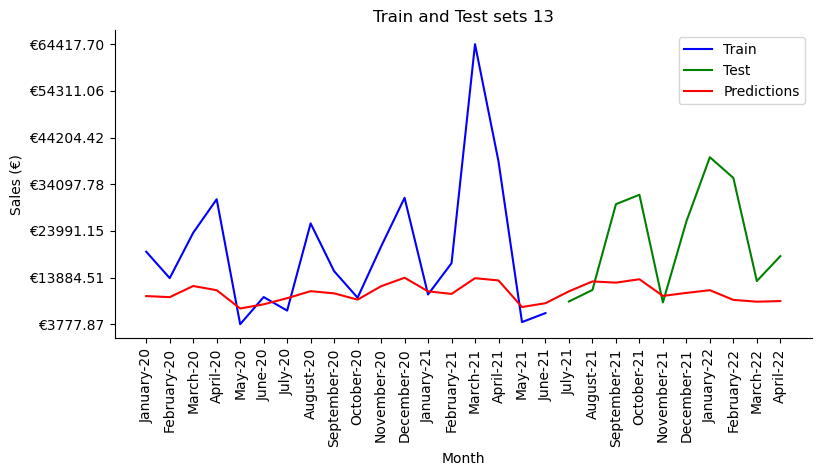

In [134]:
train_val_predictions('13', forecast_xgboost13['Train'], forecast_xgboost13['Test'], forecast_xgboost13['Predictions'])

<a class="anchor" id="xgboost1">
    
### Prophet
    
</a>

### data_agg13

In [383]:
split_list = [60,65,70,75,80,85,90]
best_split_prophet(split_list, data_agg13)

14:59:45 - cmdstanpy - INFO - Chain [1] start processing
14:59:50 - cmdstanpy - INFO - Chain [1] done processing
14:59:50 - cmdstanpy - INFO - Chain [1] start processing
15:00:18 - cmdstanpy - INFO - Chain [1] done processing
15:00:19 - cmdstanpy - INFO - Chain [1] start processing
15:00:19 - cmdstanpy - INFO - Chain [1] done processing
15:00:19 - cmdstanpy - INFO - Chain [1] start processing
15:00:19 - cmdstanpy - INFO - Chain [1] done processing
15:00:20 - cmdstanpy - INFO - Chain [1] start processing
15:00:20 - cmdstanpy - INFO - Chain [1] done processing
15:00:20 - cmdstanpy - INFO - Chain [1] start processing
15:00:20 - cmdstanpy - INFO - Chain [1] done processing
15:00:20 - cmdstanpy - INFO - Chain [1] start processing
15:00:20 - cmdstanpy - INFO - Chain [1] done processing
15:00:21 - cmdstanpy - INFO - Chain [1] start processing
15:00:21 - cmdstanpy - INFO - Chain [1] done processing


,Split,Train Error,Test Error
0,60,7.313,1953575.655
1,65,5.862,1936223.830
2,70,45152.511,479373.011
3,75,53130.982,383419.267
4,80,73394.223,277087.473
5,85,84453.996,282916.394
6,90,84286.906,433809.504
7,year,44414.858,502261.053


In [431]:
split_data = data_split(data_agg13, 70)
train_sales = split_data['train_sales']
test_sales = split_data['test_sales']
train_market = split_data['train_market']
test_market = split_data['test_market']
prophet_data_train = pd.concat([train_market, train_sales], axis=1)
prophet_data_train.rename(columns={'Date': 'ds', 'Adjusted Sales (€)': 'y'}, inplace=True)
future = pd.concat([train_market, test_market])
model_parameters = pd.DataFrame(columns = ['Parameters'])
for p in grid:   
    train_model =Prophet(seasonality_mode = p['seasonality_mode'],
                         changepoint_prior_scale = p['changepoint_prior_scale'],
                         changepoint_range=p['changepoint_range'],
                         seasonality_prior_scale=p['seasonality_prior_scale']
                         )
    for column in train_market.columns[1:]:
        train_model.add_regressor(column)
    train_model.fit(prophet_data_train)
    forecast = train_model.predict(future.rename(columns={'Date': 'ds'}))
    error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-forecast['yhat'][:len(train_sales)].values)**2).mean()), 3)
    error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast['yhat'][len(train_sales):].values)**2).mean()), 3)
    model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)

15:32:22 - cmdstanpy - INFO - Chain [1] start processing
15:32:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\3006852077.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:32:23 - cmdstanpy - INFO - Chain [1] start processing
15:32:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\3006852077.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:32:23 - cmdstanpy - INFO - Chain [1] start processing
15:32:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\Ap

15:32:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\3006852077.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:32:28 - cmdstanpy - INFO - Chain [1] start processing
15:32:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\3006852077.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:32:28 - cmdstanpy - INFO - Chain [1] start processing
15:32:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\3006852077.py:22: FutureW

In [432]:
model_parameters['Diff']=model_parameters['Test Error']-model_parameters['Train Error']
model_parameters['|Diff|']= abs(model_parameters['Diff'])
model_parameters.sort_values('|Diff|', ascending= True).head(30)

,Parameters,Test Error,Train Error,Diff,|Diff|
12,"{'changepoint_prior_scale': 0.3, 'changepoint_...",20080.329,15308.910,4771.419,4771.419
18,"{'changepoint_prior_scale': 0.3, 'changepoint_...",20084.233,15308.789,4775.444,4775.444
0,"{'changepoint_prior_scale': 0.1, 'changepoint_...",20087.255,15308.895,4778.360,4778.360
6,"{'changepoint_prior_scale': 0.1, 'changepoint_...",20113.258,15308.870,4804.388,4804.388
24,"{'changepoint_prior_scale': 0.5, 'changepoint_...",20159.849,15307.695,4852.154,4852.154
30,"{'changepoint_prior_scale': 0.5, 'changepoint_...",20185.955,15305.170,4880.785,4880.785
27,"{'changepoint_prior_scale': 0.5, 'changepoint_...",25914.242,14819.153,11095.089,11095.089
3,"{'changepoint_prior_scale': 0.1, 'changepoint_...",25925.408,14819.777,11105.631,11105.631
33,"{'changepoint_prior_scale': 0.5, 'changepoint_...",25960.506,14818.639,11141.867,11141.867
21,"{'changepoint_prior_scale': 0.3, 'changepoint_...",25975.677,14819.207,11156.470,11156.470


In [433]:
model_parameters.iloc[12,:]['Parameters']

{'changepoint_prior_scale': 0.3,
 'changepoint_range': 0.6,
 'seasonality_mode': 'multiplicative',
 'seasonality_prior_scale': 0.01}

In [436]:
forecast_prophet13 = prophet_forecast(70, data_agg13,0.3, 0.6, 'multiplicative', 0.01 )

15:33:52 - cmdstanpy - INFO - Chain [1] start processing
15:33:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\514556311.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result.rename(columns={'ds': 'Date', 'yhat': 'Sales Predictions'}, inplace = True)
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\514556311.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result['Date'] = result['Date'].dt.strftime('%Y-%m-%d')


In [437]:
forecast_prophet13['Performance']

,Measure,Train Error,Test Error
0,MAE,12151.514,18113.950
1,RMSE,15308.910,20080.329
2,R^2,0.202,-1.515
3,MAPE (%),0.918,1.590


In [438]:
forecast_prophet13['Predictions']

,Date,Sales Predictions
0,2018-10-01,28126.879680
1,2018-11-01,31920.866587
2,2018-12-01,27077.241488
3,2019-01-01,32358.386012
4,2019-02-01,30571.706883
5,2019-03-01,29502.120145
6,2019-04-01,26141.302136
7,2019-05-01,20448.003670
8,2019-06-01,21088.220878
9,2019-07-01,22773.472929


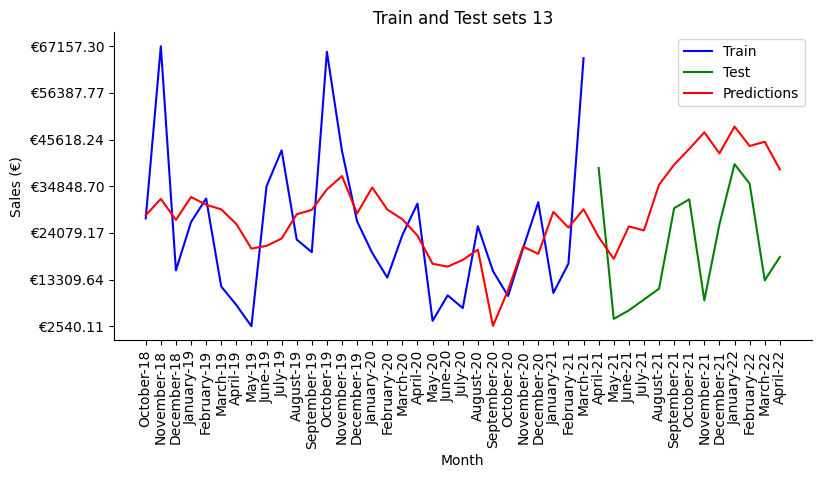

In [440]:
train_val_predictions('13', forecast_prophet13['Train'], forecast_prophet13['Test'], forecast_prophet13['Predictions'])

### Final Model

In [1412]:
# Values we have to predict
test_set[test_set['Mapped_GCK']=='#13']

,Month Year,Mapped_GCK,Sales_EUR
80,2022-03-01,#13,NaN
81,2022-06-01,#13,NaN
82,2022-07-01,#13,NaN
83,2022-08-01,#13,NaN
84,2022-09-01,#13,NaN
85,2022-10-01,#13,NaN
86,2022-11-01,#13,NaN
87,2022-12-01,#13,NaN
88,2023-01-01,#13,NaN
89,2023-02-01,#13,NaN


In [1413]:
# Arranging the dataset that will be used for the prediction
test_data_13=pd.DataFrame(index=test_set[test_set['Mapped_GCK']=='#13']['Month Year'],columns=data_agg13.columns).drop(
        columns='Unnamed: 0')
test_data_13.head()

,Producer Prices Electrical equipment Italy,Production Index Electrical equipment Switzerland,Adjusted Sales (€)
Month Year,,,
2022-03-01,NaN,NaN,NaN
2022-06-01,NaN,NaN,NaN
2022-07-01,NaN,NaN,NaN
2022-08-01,NaN,NaN,NaN
2022-09-01,NaN,NaN,NaN


In [1414]:
# Considering that the variables used have lags and that we have already predicted for some of the features, 
#we already have values we can fill
test_data_13.iloc[:6,0]=market_data_pred['Producer Prices Electrical equipment Italy '][-6:].values
test_data_13.iloc[0,1]=market_data_pred['Production Index Electrical equipment Switzerland '][-1:].values[0]

#### Producer Prices Electrical equipment Italy

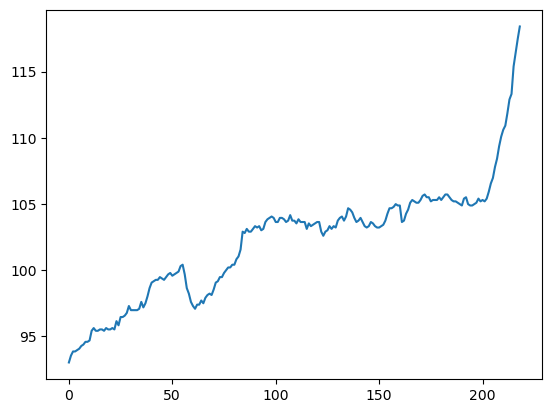

In [1415]:
plt.plot(market_data_pred.loc[:,'Producer Prices Electrical equipment Italy '])

In [1416]:
predict_ppeei=pd.DataFrame(market_data_pred.set_index('Unnamed: 0').loc[:,
            'Producer Prices Electrical equipment Italy '].dropna()).reset_index().rename(columns={'Unnamed: 0':'ds',
            'Producer Prices Electrical equipment Italy ':'y'})
predict_ppeei.head()

,ds,y
0,2004-02-01,93.020027
1,2004-03-01,93.540268
2,2004-04-01,93.852425
3,2004-05-01,93.852425
4,2004-06-01,93.956467


In [1417]:
prophet_ppeei=Prophet()
prophet_ppeei.fit(predict_ppeei)

23:17:47 - cmdstanpy - INFO - Chain [1] start processing
23:17:47 - cmdstanpy - INFO - Chain [1] done processing


In [1418]:
future = prophet_ppeei.make_future_dataframe(periods=4,freq='m')
forecast = prophet_ppeei.predict(future)

# Fill missing values
test_data_13.iloc[-4:,0]=forecast['yhat'][-4:]

#### Production Index Electrical equipment Switzerland

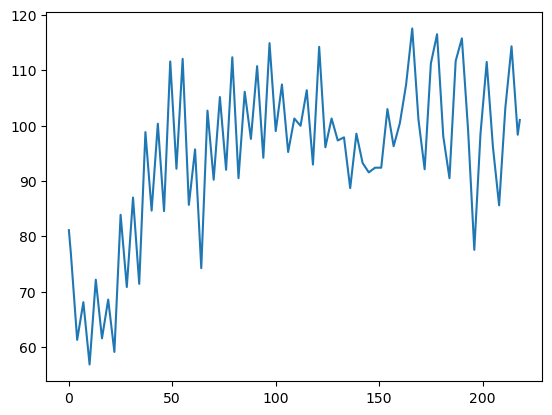

In [1419]:
plt.plot(market_data_pred.loc[:,'Production Index Electrical equipment Switzerland '])

In [1420]:
predict_piees=pd.DataFrame(market_data_pred.set_index('Unnamed: 0').loc[:,
            'Production Index Electrical equipment Switzerland '].dropna()).reset_index().rename(columns={'Unnamed: 0':'ds',
            'Production Index Electrical equipment Switzerland ':'y'})
predict_piees.head()

,ds,y
0,2004-02-01,81.100000
1,2004-03-01,76.690307
2,2004-04-01,71.552403
3,2004-05-01,66.414500
4,2004-06-01,61.276596


In [1421]:
prophet_piees=Prophet()
prophet_piees.fit(predict_piees)

23:17:51 - cmdstanpy - INFO - Chain [1] start processing
23:17:51 - cmdstanpy - INFO - Chain [1] done processing


In [1422]:
future = prophet_piees.make_future_dataframe(periods=9,freq='m')
forecast = prophet_piees.predict(future)

# Fill missing values
test_data_13.iloc[-9:,1]=forecast['yhat'][-9:]

In [1423]:
final_13=auto_arima(data_agg13.iloc[:,-1],X=data_agg13.iloc[:,1:3],stepwise=False)
forecast=final_13.predict(n_periods=10,X=test_data_13.iloc[:,:-1])
final_predictions_13=list(forecast.values)
final_predictions_13

[23188.269479824015,
 19193.452526151796,
 11592.7059365542,
 18811.032579759594,
 19465.32963978347,
 23472.08243436047,
 22239.823017340368,
 19924.5993445934,
 17663.846811355972,
 21734.158225675223]

<a class="anchor" id="gck14">
    
## Product Group 14
    
</a>

<a class="anchor" id="mean1">
    
### Mean
    
</a>

### data_agg14

In [224]:
split_list = [60,65,70,75,80,85,90]
best_split_mean(split_list, data_agg14)

,Split,Train Error,Test Error
0,60,13468.668,19740.704
1,65,13075.511,20855.989
2,70,12592.631,22960.965
3,75,12293.261,24918.778
4,80,16674.195,15152.720
5,85,16440.368,16039.377
6,90,16052.309,18644.152
7,year,12412.877,23898.132


In [225]:
forecast_mean14 = mean_forecast(80, data_agg14)

In [226]:
forecast_mean14['Performance']

,Measure,Train Error,Test Error
0,MAE,1.036577e+04,1.172263e+04
1,RMSE,1.667419e+04,1.515272e+04
2,R^2,0.000000e+00,-2.000000e-03
3,MAPE (%),4.697578e+18,5.915468e+18


In [227]:
forecast_mean14['Predictions']

,Date,Sales Predictions
0,2018-10-01,11821.480458
1,2018-11-01,11821.480458
2,2018-12-01,11821.480458
3,2019-01-01,11821.480458
4,2019-02-01,11821.480458
5,2019-03-01,11821.480458
6,2019-04-01,11821.480458
7,2019-05-01,11821.480458
8,2019-06-01,11821.480458
9,2019-07-01,11821.480458


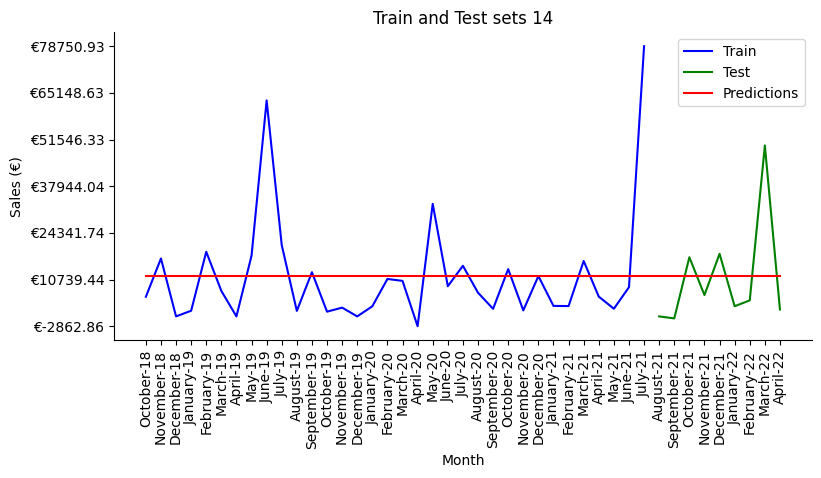

In [228]:
train_val_predictions('14', forecast_mean14['Train'], forecast_mean14['Test'], forecast_mean14['Predictions'])

### out_data_agg14

In [229]:
split_list = [60,65,70,75,80,85,90]
best_split_mean(split_list, out_data_agg14)

,Split,Train Error,Test Error
0,60,8516.222,11469.513
1,65,8329.678,12007.092
2,70,8153.038,12970.921
3,75,7990.035,13969.697
4,80,7784.126,15402.184
5,85,7819.476,17022.590
6,90,7763.466,19607.424
7,year,8037.968,13479.331


In [230]:
forecast_mean14 = mean_forecast(80, out_data_agg14)

In [231]:
forecast_mean14['Performance']

,Measure,Train Error,Test Error
0,MAE,6.408373e+03,1.056369e+04
1,RMSE,7.784126e+03,1.540218e+04
2,R^2,0.000000e+00,-3.500000e-02
3,MAPE (%),3.315977e+18,4.175675e+18


In [232]:
forecast_mean14['Predictions']

,Date,Sales Predictions
0,2018-10-01,8344.674133
1,2018-11-01,8344.674133
2,2018-12-01,8344.674133
3,2019-01-01,8344.674133
4,2019-02-01,8344.674133
5,2019-03-01,8344.674133
6,2019-04-01,8344.674133
7,2019-05-01,8344.674133
8,2019-06-01,8344.674133
9,2019-07-01,8344.674133


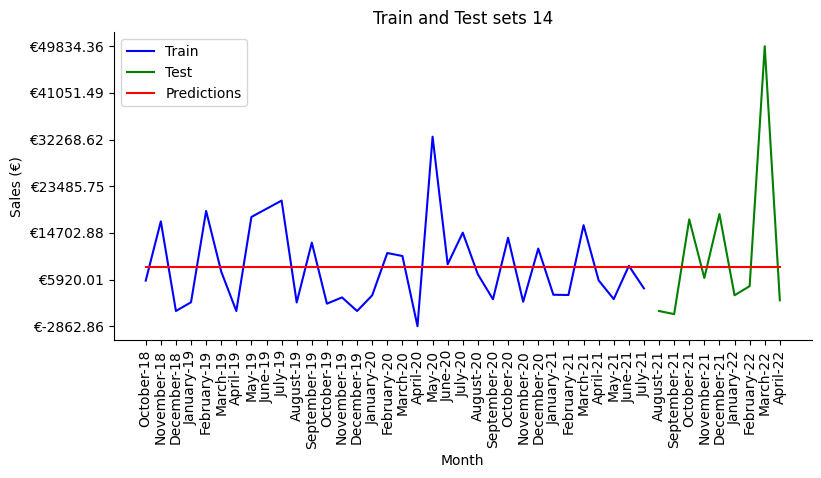

In [233]:
train_val_predictions('14', forecast_mean14['Train'], forecast_mean14['Test'], forecast_mean14['Predictions'])

<a class="anchor" id="median14">
    
### Median
    
</a>

### data_agg14

In [115]:
split_list = [60,65,70,75,80,85,90]
best_split_median(split_list, data_agg14)

,Split,Train Error,Test Error
0,60,13895.063,20376.930
1,65,13440.918,21539.199
2,70,12959.521,23796.018
3,75,12782.385,26152.654
4,80,17313.410,15663.440
5,85,17131.576,17673.066
6,90,16703.954,20231.193


In [118]:
forecast_median14 = mean_forecast(80, data_agg14)
forecast_median14['Predictions']

,Date,Sales Predictions
0,2018-10-01,11821.480458
1,2018-11-01,11821.480458
2,2018-12-01,11821.480458
3,2019-01-01,11821.480458
4,2019-02-01,11821.480458
5,2019-03-01,11821.480458
6,2019-04-01,11821.480458
7,2019-05-01,11821.480458
8,2019-06-01,11821.480458
9,2019-07-01,11821.480458


In [119]:
forecast_median14['Performance']

,Measure,Train Error,Test Error
0,MAE,1.036577e+04,1.172263e+04
1,RMSE,1.667419e+04,1.515272e+04
2,R^2,0.000000e+00,-2.000000e-03
3,MAPE (%),4.697578e+18,5.915468e+18


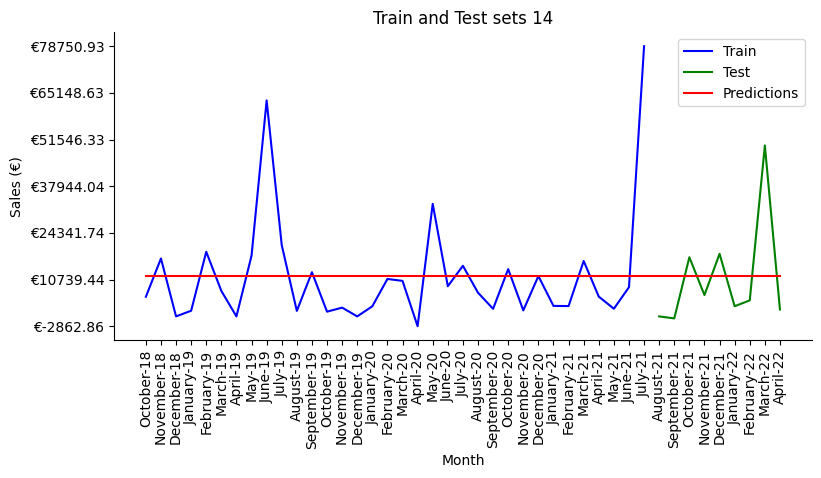

In [120]:
train_val_predictions('14', forecast_median14['Train'], forecast_median14['Test'], forecast_median14['Predictions'])

<a class="anchor" id="auto_arima14">
    
### Auto Arima
    
</a>

### data_agg14

In [213]:
split_list = [60,65,70,75,80,85,90]
best_split_autoarima(split_list, data_agg14)

,Split,Train Error,Test Error
0,60,12714.791,20019.769
1,65,12403.668,20992.130
2,70,12099.714,22577.970
3,75,11784.216,24447.589
4,80,16195.972,14338.775
5,85,15935.100,15347.803
6,90,15558.941,17892.687


In [214]:
forecast_autoarima14 = autoarima_forecast(80, data_agg14)
forecast_autoarima14['Predictions']

,Date,Sales Predictions
0,2018-10-01,12853.179408
1,2018-11-01,12760.452066
2,2018-12-01,11678.762991
3,2019-01-01,11010.554916
4,2019-02-01,12026.421216
5,2019-03-01,13918.926799
6,2019-04-01,11567.560100
7,2019-05-01,13129.692960
8,2019-06-01,14409.298648
9,2019-07-01,13613.122667


In [215]:
forecast_autoarima14['Performance']

,Measure,Train Error,Test Error
0,MAE,1.009815e+04,1.139709e+04
1,RMSE,1.619597e+04,1.433877e+04
2,R^2,5.700000e-02,1.030000e-01
3,MAPE (%),4.678757e+18,4.467349e+18


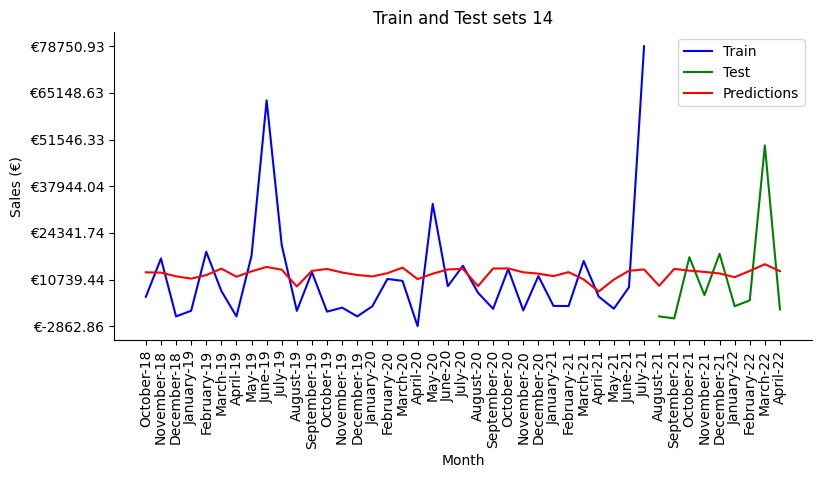

In [253]:
train_val_predictions('14', forecast_autoarima14['Train'], forecast_autoarima14['Test'], forecast_autoarima14['Predictions'])

### out_data_agg14

In [217]:
split_list = [60,65,70,75,80,85,90]
best_split_autoarima(split_list, out_data_agg14)

,Split,Train Error,Test Error
0,60,7657.424,12421.193
1,65,7650.155,12353.451
2,70,7720.129,12739.518
3,75,7538.573,13768.883
4,80,7359.490,15148.330
5,85,7235.252,17288.736
6,90,7270.768,19688.140


In [218]:
forecast_autoarima14_out = autoarima_forecast(65, out_data_agg14)
forecast_autoarima14_out['Predictions']

,Date,Sales Predictions
0,2018-10-01,10907.525448
1,2018-11-01,10831.693259
2,2018-12-01,6662.174522
3,2019-01-01,8752.846825
4,2019-02-01,9509.400503
5,2019-03-01,10885.900120
6,2019-04-01,10530.245274
7,2019-05-01,13121.794029
8,2019-06-01,9774.794353
9,2019-07-01,11385.610733


In [219]:
forecast_autoarima14_out['Performance']

,Measure,Train Error,Test Error
0,MAE,6.533415e+03,7.663429e+03
1,RMSE,7.650155e+03,1.235345e+04
2,R^2,1.570000e-01,-5.900000e-02
3,MAPE (%),3.907615e+18,1.814291e+17


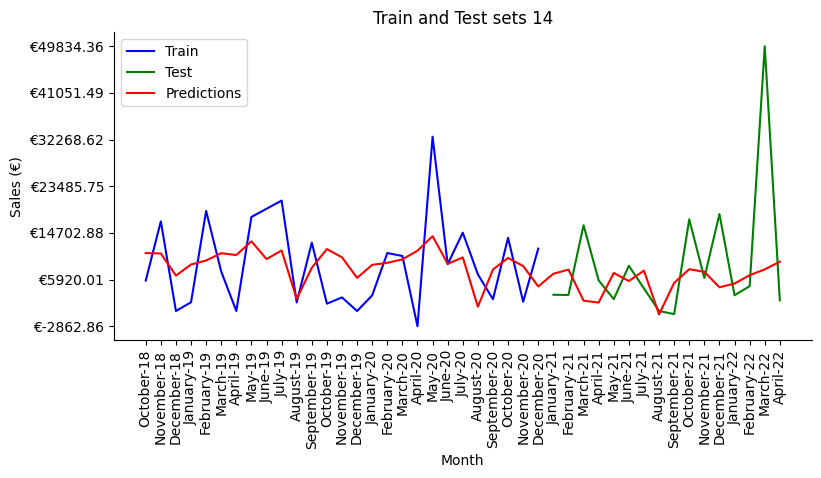

In [254]:
train_val_predictions('14', forecast_autoarima14_out['Train'], forecast_autoarima14_out['Test'], forecast_autoarima14_out['Predictions'])

<a class="anchor" id="xgboost1">
    
### XGBoost
    
</a>

### lag_data14

In [57]:
split_list = [60,65,70,75,80,85,90]
best_split_xgboost(split_list, lag_data14)

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\658444845.py:22: RuntimeWarning: Mean of empty slice.
  error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast[len(train_sales):])**2).mean()), 3)
C:\Users\migue\anaconda3\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


,Split,Train Error,Test Error
0,60,0.003,22467.200
1,65,0.003,25600.875
2,70,0.006,13282.181
3,75,0.006,13230.676
4,80,0.006,13923.169
5,85,0.006,15527.734
6,90,0.005,19466.357
7,year,0.005,NaN


In [107]:
split_data = data_split(lag_data14, 75)
train_sales = split_data['train_sales']
test_sales = split_data['test_sales']
train_market = split_data['train_market']
test_market = split_data['test_market']

model_parameters = pd.DataFrame(columns = ['Parameters', 'Train Error', 'Test Error'])

# define the parameter grid to search over
params_grid = {
    'alpha':[0,1,2,5],
    'subsample':[0.1,0.3,0.5,1],
    'learning_rate': [0.5,0.1, 0.01, 0.001],
               'max_depth': [1, 2, 3, 5, 6, 8],
               'min_child_weight': [1,3, 5]}
grid = ParameterGrid(params_grid)

for p in grid:   
    model = xgb.XGBRegressor(**p)
    model.fit(train_market.iloc[:,1:], train_sales)
    forecast = model.predict(pd.concat([train_market, test_market]).drop('Date', axis=1))
    error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-forecast[:len(train_sales)])**2).mean()), 3)
    error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast[len(train_sales):])**2).mean()), 3)
    model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\3674349009.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

In [108]:
model_parameters['Diff']=model_parameters['Test Error']-model_parameters['Train Error']
model_parameters['|Diff|']=abs(model_parameters['Diff'])
model_parameters.sort_values('Test Error', ascending= True).head(30)

,Parameters,Train Error,Test Error,Diff,|Diff|
5,"{'alpha': 0, 'learning_rate': 0.5, 'max_depth'...",8718.140,8154.643,-563.497,563.497
293,"{'alpha': 1, 'learning_rate': 0.5, 'max_depth'...",8718.166,8154.666,-563.500,563.500
581,"{'alpha': 2, 'learning_rate': 0.5, 'max_depth'...",8718.194,8154.693,-563.501,563.501
869,"{'alpha': 5, 'learning_rate': 0.5, 'max_depth'...",8718.278,8154.774,-563.504,563.504
943,"{'alpha': 5, 'learning_rate': 0.1, 'max_depth'...",8344.461,9349.796,1005.335,1005.335
655,"{'alpha': 2, 'learning_rate': 0.1, 'max_depth'...",8344.125,9349.896,1005.771,1005.771
367,"{'alpha': 1, 'learning_rate': 0.1, 'max_depth'...",8344.011,9349.927,1005.916,1005.916
79,"{'alpha': 0, 'learning_rate': 0.1, 'max_depth'...",8343.899,9349.959,1006.060,1006.060
942,"{'alpha': 5, 'learning_rate': 0.1, 'max_depth'...",9208.501,9435.796,227.295,227.295
654,"{'alpha': 2, 'learning_rate': 0.1, 'max_depth'...",9208.229,9435.858,227.629,227.629


In [110]:
model_parameters.iloc[943,:]['Parameters']

{'alpha': 5,
 'learning_rate': 0.1,
 'max_depth': 1,
 'min_child_weight': 3,
 'subsample': 1}

In [111]:
forecast_xgboost14 = xgboost_forecast(75,lag_data14,5,0.1,1,3,1)

In [112]:
forecast_xgboost14['Performance']

,Measure,Train Error,Test Error
0,MAE,5.808786e+03,6931.728
1,RMSE,8.344461e+03,9349.796
2,R^2,7.580000e-01,0.645
3,MAPE (%),6.606115e+17,1.443


In [113]:
forecast_xgboost14['Predictions']

,Date,Sales Predictions
0,2020-01-01,2087.570068
1,2020-02-01,21461.728516
2,2020-03-01,18091.083984
3,2020-04-01,2087.570068
4,2020-05-01,19543.203125
5,2020-06-01,17796.830078
6,2020-07-01,17796.830078
7,2020-08-01,635.450500
8,2020-09-01,5611.918945
9,2020-10-01,17796.830078


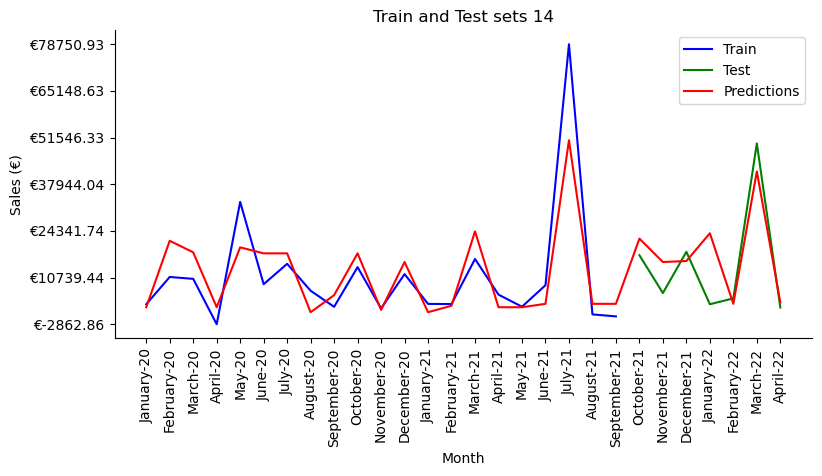

In [114]:
train_val_predictions('14', forecast_xgboost14['Train'], forecast_xgboost14['Test'], forecast_xgboost14['Predictions'])

<a class="anchor" id="xgboost1">
    
### Prophet
    
</a>

### data_agg14

In [441]:
split_list = [60,65,70,75,80,85,90]
best_split_prophet(split_list, data_agg14)

15:37:01 - cmdstanpy - INFO - Chain [1] start processing
15:37:24 - cmdstanpy - INFO - Chain [1] done processing
15:37:24 - cmdstanpy - INFO - Chain [1] start processing
15:37:45 - cmdstanpy - INFO - Chain [1] done processing
15:37:46 - cmdstanpy - INFO - Chain [1] start processing
15:37:46 - cmdstanpy - INFO - Chain [1] done processing
15:37:46 - cmdstanpy - INFO - Chain [1] start processing
15:37:46 - cmdstanpy - INFO - Chain [1] done processing
15:37:46 - cmdstanpy - INFO - Chain [1] start processing
15:37:46 - cmdstanpy - INFO - Chain [1] done processing
15:37:46 - cmdstanpy - INFO - Chain [1] start processing
15:37:47 - cmdstanpy - INFO - Chain [1] done processing
15:37:47 - cmdstanpy - INFO - Chain [1] start processing
15:37:47 - cmdstanpy - INFO - Chain [1] done processing
15:37:47 - cmdstanpy - INFO - Chain [1] start processing
15:37:47 - cmdstanpy - INFO - Chain [1] done processing


,Split,Train Error,Test Error
0,60,0.438,75247.792
1,65,0.476,105158.832
2,70,2772.878,27017.139
3,75,4689.454,20937.962
4,80,7228.165,33316.563
5,85,9138.622,12100.541
6,90,8923.988,14312.588
7,year,2858.595,24713.630


In [442]:
split_data = data_split(data_agg14, 70)
train_sales = split_data['train_sales']
test_sales = split_data['test_sales']
train_market = split_data['train_market']
test_market = split_data['test_market']
prophet_data_train = pd.concat([train_market, train_sales], axis=1)
prophet_data_train.rename(columns={'Date': 'ds', 'Adjusted Sales (€)': 'y'}, inplace=True)
future = pd.concat([train_market, test_market])
model_parameters = pd.DataFrame(columns = ['Parameters'])
for p in grid:   
    train_model =Prophet(seasonality_mode = p['seasonality_mode'],
                         changepoint_prior_scale = p['changepoint_prior_scale'],
                         changepoint_range=p['changepoint_range'],
                         seasonality_prior_scale=p['seasonality_prior_scale']
                         )
    for column in train_market.columns[1:]:
        train_model.add_regressor(column)
    train_model.fit(prophet_data_train)
    forecast = train_model.predict(future.rename(columns={'Date': 'ds'}))
    error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-forecast['yhat'][:len(train_sales)].values)**2).mean()), 3)
    error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast['yhat'][len(train_sales):].values)**2).mean()), 3)
    model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)

15:38:12 - cmdstanpy - INFO - Chain [1] start processing
15:38:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\451942902.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:38:12 - cmdstanpy - INFO - Chain [1] start processing
15:38:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\451942902.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:38:12 - cmdstanpy - INFO - Chain [1] start processing
15:38:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppD

15:38:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\451942902.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:38:17 - cmdstanpy - INFO - Chain [1] start processing
15:38:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\451942902.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:38:18 - cmdstanpy - INFO - Chain [1] start processing
15:38:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\451942902.py:22: FutureWarn

In [443]:
model_parameters['Diff']=model_parameters['Test Error']-model_parameters['Train Error']
model_parameters['|Diff|']= abs(model_parameters['Diff'])
model_parameters.sort_values('|Diff|', ascending= True).head(30)

,Parameters,Test Error,Train Error,Diff,|Diff|
15,"{'changepoint_prior_scale': 0.3, 'changepoint_...",24352.584,11097.057,13255.527,13255.527
3,"{'changepoint_prior_scale': 0.1, 'changepoint_...",24422.349,11097.987,13324.362,13324.362
9,"{'changepoint_prior_scale': 0.1, 'changepoint_...",24495.113,11098.023,13397.090,13397.090
21,"{'changepoint_prior_scale': 0.3, 'changepoint_...",24539.065,11097.524,13441.541,13441.541
33,"{'changepoint_prior_scale': 0.5, 'changepoint_...",25007.279,10970.603,14036.676,14036.676
27,"{'changepoint_prior_scale': 0.5, 'changepoint_...",25564.904,10782.251,14782.653,14782.653
34,"{'changepoint_prior_scale': 0.5, 'changepoint_...",23063.300,7951.141,15112.159,15112.159
30,"{'changepoint_prior_scale': 0.5, 'changepoint_...",26671.913,10612.610,16059.303,16059.303
31,"{'changepoint_prior_scale': 0.5, 'changepoint_...",21920.217,5544.085,16376.132,16376.132
28,"{'changepoint_prior_scale': 0.5, 'changepoint_...",24791.793,8156.672,16635.121,16635.121


In [444]:
model_parameters.iloc[15,:]['Parameters']

{'changepoint_prior_scale': 0.3,
 'changepoint_range': 0.6,
 'seasonality_mode': 'additive',
 'seasonality_prior_scale': 0.01}

In [445]:
forecast_prophet14 = prophet_forecast(70, data_agg14,0.3, 0.6, 'additive', 0.01 )

15:39:04 - cmdstanpy - INFO - Chain [1] start processing
15:39:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\514556311.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result.rename(columns={'ds': 'Date', 'yhat': 'Sales Predictions'}, inplace = True)
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\514556311.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result['Date'] = result['Date'].dt.strftime('%Y-%m-%d')


In [446]:
forecast_prophet14['Performance']

,Measure,Train Error,Test Error
0,MAE,7.223216e+03,1.639017e+04
1,RMSE,1.109706e+04,2.435258e+04
2,R^2,2.230000e-01,-1.770000e-01
3,MAPE (%),3.999851e+18,1.895636e+18


In [447]:
forecast_prophet14['Predictions']

,Date,Sales Predictions
0,2018-10-01,14621.476343
1,2018-11-01,12251.502337
2,2018-12-01,13646.855432
3,2019-01-01,9947.247740
4,2019-02-01,12432.490338
5,2019-03-01,16698.935600
6,2019-04-01,1413.840528
7,2019-05-01,11073.283017
8,2019-06-01,16777.554867
9,2019-07-01,11273.871667


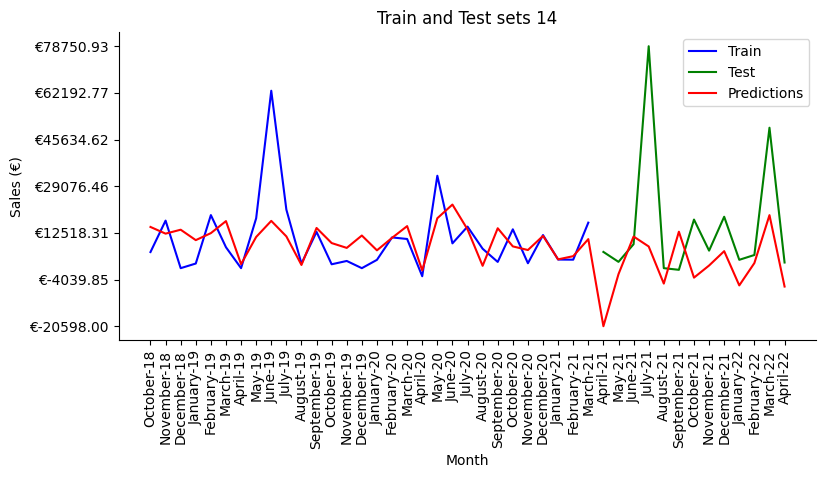

In [448]:
train_val_predictions('14', forecast_prophet14['Train'], forecast_prophet14['Test'], forecast_prophet14['Predictions'])

### Final Model

In [1424]:
# Values we have to predict
test_set[test_set['Mapped_GCK']=='#14']

,Month Year,Mapped_GCK,Sales_EUR
90,2022-03-01,#14,NaN
91,2022-06-01,#14,NaN
92,2022-07-01,#14,NaN
93,2022-08-01,#14,NaN
94,2022-09-01,#14,NaN
95,2022-10-01,#14,NaN
96,2022-11-01,#14,NaN
97,2022-12-01,#14,NaN
98,2023-01-01,#14,NaN
99,2023-02-01,#14,NaN


In [1425]:
# Arranging the dataset that will be used for the prediction
test_data_14=pd.DataFrame(index=test_set[test_set['Mapped_GCK']=='#14']['Month Year'],columns=out_data_agg14.columns).drop(
        columns='Unnamed: 0')
test_data_14.head()

,Production Index Electrical equipment Germany,Production Index Electrical equipment Switzerland,Price of Copper World,Shipments Index Machinery & Electricals Germany,Producer Prices Electrical equipment United Kingdom,Adjusted Sales (€)
Month Year,,,,,,
2022-03-01,NaN,NaN,NaN,NaN,NaN,NaN
2022-06-01,NaN,NaN,NaN,NaN,NaN,NaN
2022-07-01,NaN,NaN,NaN,NaN,NaN,NaN
2022-08-01,NaN,NaN,NaN,NaN,NaN,NaN
2022-09-01,NaN,NaN,NaN,NaN,NaN,NaN


In [1426]:
# Considering that the variables used have lags and that we have already predicted for some of the features, 
#we already have values we can fill
test_data_14.iloc[:4,0]=market_data_pred['Production Index Electrical equipment Germany  '][-4:].values
test_data_14.iloc[:,1]=market_data_pred['Production Index Electrical equipment Switzerland '][207:217].values
test_data_14.iloc[:5,2]=market_data_pred['Price of Copper World '][-5:].values
test_data_14.iloc[:8,3]=market_data_pred['Shipments Index Machinery & Electricals Germany'][-8:].values
test_data_14.iloc[:9,4]=market_data_pred['Producer Prices Electrical equipment United Kingdom '][-9:].values

#### Production Index Electrical equipment Germany  

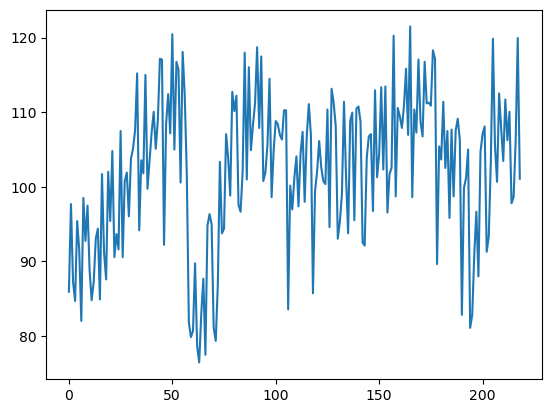

In [1427]:
plt.plot(market_data_pred.loc[:,'Production Index Electrical equipment Germany  '])

In [1428]:
predict_pieeg=pd.DataFrame(market_data_pred.set_index('Unnamed: 0').loc[:,
            'Production Index Electrical equipment Germany  '].dropna()).reset_index().rename(columns={'Unnamed: 0':'ds',
            'Production Index Electrical equipment Germany  ':'y'})
predict_pieeg.head()

,ds,y
0,2004-02-01,85.913200
1,2004-03-01,97.670815
2,2004-04-01,87.253983
3,2004-05-01,84.675552
4,2004-06-01,95.401802


In [1429]:
prophet_pieeg=Prophet()
prophet_pieeg.fit(predict_pieeg)

23:18:36 - cmdstanpy - INFO - Chain [1] start processing
23:18:36 - cmdstanpy - INFO - Chain [1] done processing


In [1430]:
future = prophet_pieeg.make_future_dataframe(periods=6,freq='m')
forecast = prophet_pieeg.predict(future)

# Fill missing values
test_data_14.iloc[-6:,0]=forecast['yhat'][-6:]

#### Price of Copper World

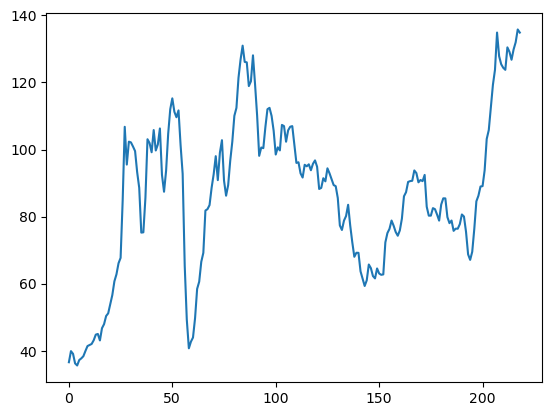

In [1431]:
plt.plot(market_data_pred.loc[:,'Price of Copper World '])

In [1432]:
predict_pcw=pd.DataFrame(market_data_pred.set_index('Unnamed: 0').loc[:,
            'Price of Copper World '].dropna()).reset_index().rename(columns={'Unnamed: 0':'ds',
            'Price of Copper World ':'y'})
predict_pcw.head()

,ds,y
0,2004-02-01,36.623832
1,2004-03-01,39.931055
2,2004-04-01,39.134854
3,2004-05-01,36.278433
4,2004-06-01,35.657380


In [1433]:
prophet_pcw=Prophet()
prophet_pcw.fit(predict_pcw)

23:18:39 - cmdstanpy - INFO - Chain [1] start processing
23:18:39 - cmdstanpy - INFO - Chain [1] done processing


In [1434]:
future = prophet_simei.make_future_dataframe(periods=5,freq='m')
forecast = prophet_simei.predict(future)

# Fill missing values
test_data_14.iloc[-5:,2]=forecast['yhat'][-5:]

#### Shipments Index Machinery & Electricals Germany

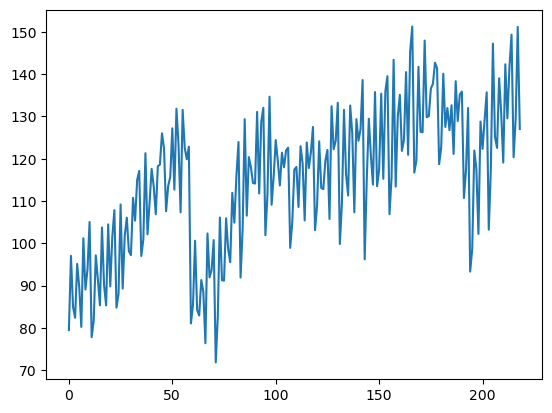

In [1435]:
plt.plot(market_data_pred.loc[:,'Shipments Index Machinery & Electricals Germany'])

In [1436]:
predict_simeg=pd.DataFrame(market_data_pred.set_index('Unnamed: 0').loc[:,
            'Shipments Index Machinery & Electricals Germany'].dropna()).reset_index().rename(columns={'Unnamed: 0':'ds',
            'Shipments Index Machinery & Electricals Germany':'y'})
predict_simeg.head()

,ds,y
0,2004-02-01,79.452532
1,2004-03-01,97.012918
2,2004-04-01,84.932358
3,2004-05-01,82.372794
4,2004-06-01,95.108740


In [1437]:
prophet_simeg=Prophet()
prophet_simeg.fit(predict_simeg)

23:18:43 - cmdstanpy - INFO - Chain [1] start processing
23:18:43 - cmdstanpy - INFO - Chain [1] done processing


In [1438]:
future = prophet_simeg.make_future_dataframe(periods=2,freq='m')
forecast = prophet_simeg.predict(future)

# Fill missing values
test_data_14.iloc[-2:,3]=forecast['yhat'][-2:]

#### Producer Prices Electrical equipment United Kingdom

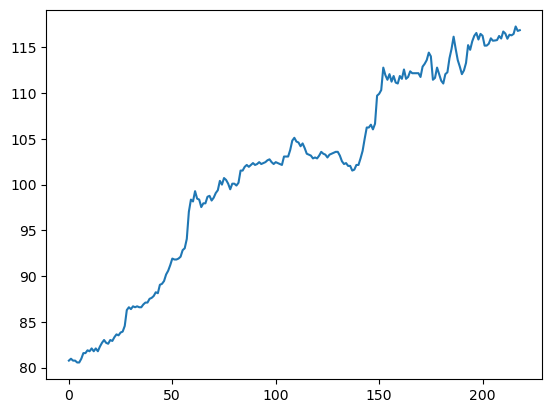

In [1439]:
plt.plot(market_data_pred.loc[:,'Producer Prices Electrical equipment United Kingdom '])

In [1440]:
predict_ppeeuk=pd.DataFrame(market_data_pred.set_index('Unnamed: 0').loc[:,
            'Producer Prices Electrical equipment United Kingdom '].dropna()).reset_index().rename(columns={'Unnamed: 0':'ds',
            'Producer Prices Electrical equipment United Kingdom ':'y'})
predict_ppeeuk.head()

,ds,y
0,2004-02-01,80.757423
1,2004-03-01,80.962135
2,2004-04-01,80.757423
3,2004-05-01,80.757423
4,2004-06-01,80.552711


In [1441]:
prophet_ppeeuk=Prophet()
prophet_ppeeuk.fit(predict_ppeeuk)

23:18:46 - cmdstanpy - INFO - Chain [1] start processing
23:18:46 - cmdstanpy - INFO - Chain [1] done processing


In [1442]:
future = prophet_ppeeuk.make_future_dataframe(periods=2,freq='m')
forecast = prophet_ppeeuk.predict(future)

# Fill missing values
test_data_14.iloc[-1:,4]=forecast['yhat'][-1:]

In [1443]:
final_14=auto_arima(out_data_agg14.iloc[:,-1],X=out_data_agg14.iloc[:,1:6],stepwise=False)
forecast=final_14.predict(n_periods=10,X=test_data_14.iloc[:,:-1])
final_predictions_14=list(forecast.values)
final_predictions_14

[16215.383707933799,
 12728.815286348936,
 15133.583501889803,
 14275.992844935563,
 9647.971561341206,
 9513.970361848284,
 12972.673561148444,
 8361.561466107085,
 8601.638781845102,
 11137.925215523288]

<a class="anchor" id="gck16">
    
## Product Group 16
    
</a>

<a class="anchor" id="mean1">
    
### Mean
    
</a>

### data_agg16

In [234]:
split_list = [60,65,70,75,80,85,90]
best_split_mean(split_list, data_agg16)

,Split,Train Error,Test Error
0,60,954724.223,441049.510
1,65,924664.412,416992.220
2,70,886955.930,371546.916
3,75,863275.319,351231.943
4,80,841929.937,327106.493
5,85,820043.302,335918.869
6,90,800791.311,338101.038
7,year,875498.050,355580.615


In [235]:
forecast_mean16 = mean_forecast(80, data_agg16)

In [236]:
forecast_mean16['Performance']

,Measure,Train Error,Test Error
0,MAE,454206.668,314891.452
1,RMSE,841929.937,327106.493
2,R^2,-0.000,-12.644
3,MAPE (%),1.887,2.826


In [237]:
forecast_mean16['Predictions']

,Date,Sales Predictions
0,2018-10-01,492311.344481
1,2018-11-01,492311.344481
2,2018-12-01,492311.344481
3,2019-01-01,492311.344481
4,2019-02-01,492311.344481
5,2019-03-01,492311.344481
6,2019-04-01,492311.344481
7,2019-05-01,492311.344481
8,2019-06-01,492311.344481
9,2019-07-01,492311.344481


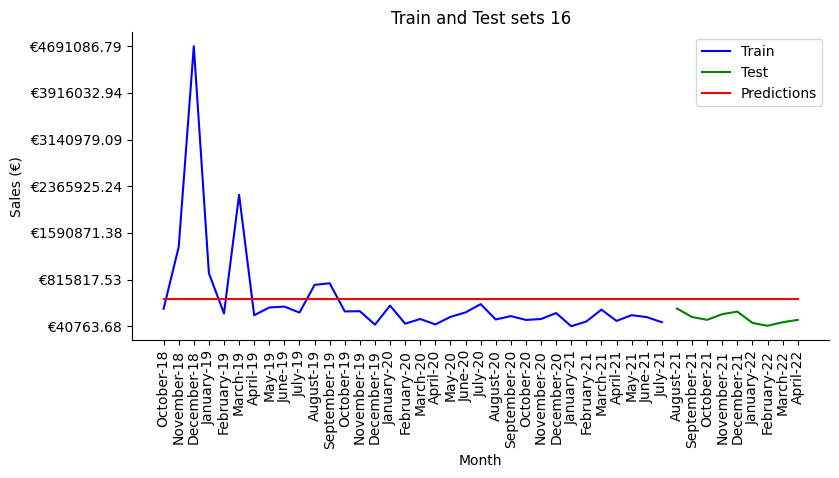

In [238]:
train_val_predictions('16', forecast_mean16['Train'], forecast_mean16['Test'], forecast_mean16['Predictions'])

### out_data_agg16

In [239]:
split_list = [60,65,70,75,80,85,90]
best_split_mean(split_list, out_data_agg16)

,Split,Train Error,Test Error
0,60,485409.472,302828.813
1,65,472047.436,289626.139
2,70,457552.974,257037.027
3,75,447015.784,244764.499
4,80,437855.129,228297.485
5,85,426783.566,240918.722
6,90,417635.564,248282.027
7,year,453001.094,245358.709


In [240]:
forecast_mean16 = mean_forecast(80, out_data_agg16)

In [241]:
forecast_mean16['Performance']

,Measure,Train Error,Test Error
0,MAE,283322.833,210422.695
1,RMSE,437855.129,228297.485
2,R^2,0.000,-5.646
3,MAPE (%),1.344,2.014


In [242]:
forecast_mean16['Predictions']

,Date,Sales Predictions
0,2018-10-01,387842.587123
1,2018-11-01,387842.587123
2,2018-12-01,387842.587123
3,2019-01-01,387842.587123
4,2019-02-01,387842.587123
5,2019-03-01,387842.587123
6,2019-04-01,387842.587123
7,2019-05-01,387842.587123
8,2019-06-01,387842.587123
9,2019-07-01,387842.587123


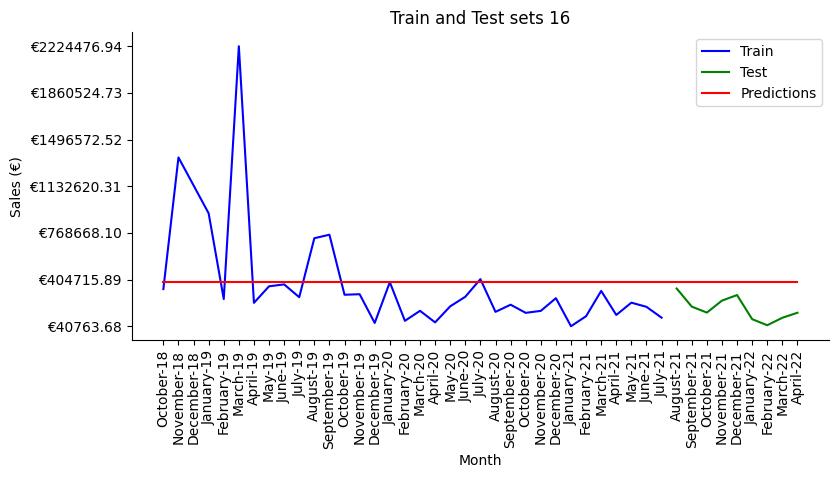

In [243]:
train_val_predictions('16', forecast_mean16['Train'], forecast_mean16['Test'], forecast_mean16['Predictions'])

<a class="anchor" id="median16">
    
### Median
    
</a>

### data_agg16

In [121]:
split_list = [60,65,70,75,80,85,90]
best_split_median(split_list, data_agg16)

,Split,Train Error,Test Error
0,60,1007369.073,139885.156
1,65,974505.177,132606.027
2,70,926398.659,123770.270
3,75,898864.256,122961.391
4,80,874406.056,118537.834
5,85,849934.968,128931.350
6,90,829913.611,136532.249


In [122]:
forecast_median16 = median_forecast(80, data_agg16)
forecast_median16['Predictions']

,Date,Sales Predictions
0,2018-10-01,256218.28787
1,2018-11-01,256218.28787
2,2018-12-01,256218.28787
3,2019-01-01,256218.28787
4,2019-02-01,256218.28787
5,2019-03-01,256218.28787
6,2019-04-01,256218.28787
7,2019-05-01,256218.28787
8,2019-06-01,256218.28787
9,2019-07-01,256218.28787


In [236]:
forecast_median16['Performance']

,Measure,Train Error,Test Error
0,MAE,454206.668,314891.452
1,RMSE,841929.937,327106.493
2,R^2,-0.000,-12.644
3,MAPE (%),1.887,2.826


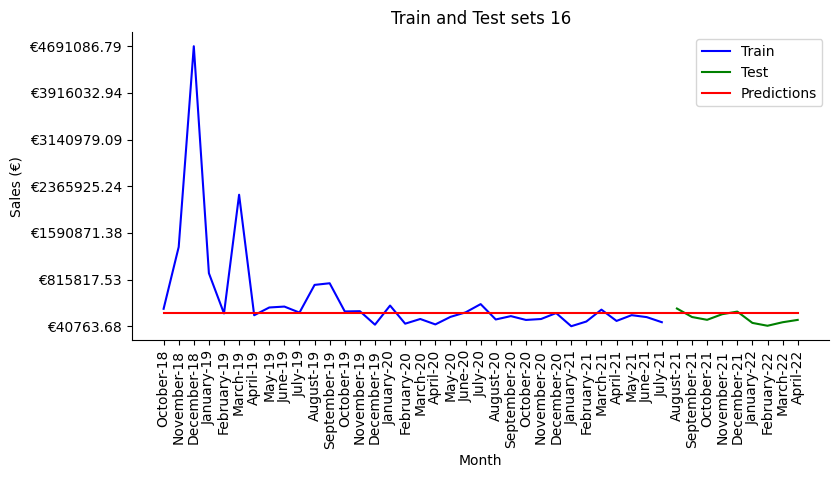

In [123]:
train_val_predictions('16', forecast_median16['Train'], forecast_median16['Test'], forecast_median16['Predictions'])

<a class="anchor" id="auto_arima16">
    
### Auto Arima
    
</a>

### data_agg16

In [221]:
split_list = [60,65,70,75,80,85,90]
best_split_autoarima(split_list, data_agg16)

,Split,Train Error,Test Error
0,60,840118.058,453459.437
1,65,811003.228,490143.577
2,70,771496.822,513583.704
3,75,748020.031,544314.575
4,80,728170.542,574111.858
5,85,721421.712,525556.302
6,90,708664.860,521492.836


In [222]:
forecast_autoarima16 = autoarima_forecast(60, data_agg16)
forecast_autoarima16['Predictions']

,Date,Sales Predictions
0,2018-10-01,8.473362e+05
1,2018-11-01,1.082155e+06
2,2018-12-01,1.369071e+06
3,2019-01-01,8.652163e+05
4,2019-02-01,3.573700e+05
5,2019-03-01,9.508822e+05
6,2019-04-01,9.789592e+05
7,2019-05-01,8.354110e+05
8,2019-06-01,4.769057e+05
9,2019-07-01,4.449541e+05


In [223]:
forecast_autoarima16['Performance']

,Measure,Train Error,Test Error
0,MAE,533455.189,367508.626
1,RMSE,840118.058,453459.437
2,R^2,0.226,-27.805
3,MAPE (%),2.017,2.410


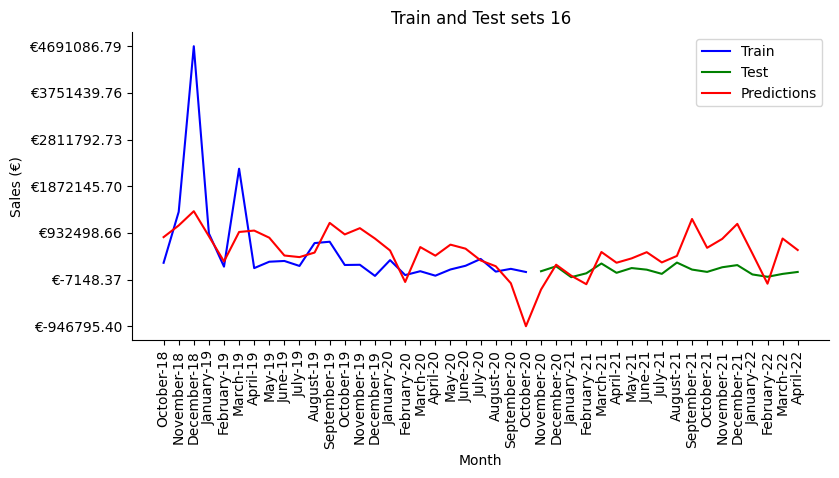

In [255]:
train_val_predictions('16', forecast_autoarima16['Train'], forecast_autoarima16['Test'], forecast_autoarima16['Predictions'])

### out_data_agg16

In [225]:
split_list = [60,65,70,75,80,85,90]
best_split_autoarima(split_list, out_data_agg16)

,Split,Train Error,Test Error
0,60,421513.524,312945.231
1,65,407205.807,332634.789
2,70,387409.194,353849.615
3,75,375403.531,382625.942
4,80,367601.541,397123.296
5,85,364289.382,409968.924
6,90,361703.132,409682.910


In [226]:
forecast_autoarima16_out = autoarima_forecast(60, out_data_agg16)
forecast_autoarima16_out['Predictions']

,Date,Sales Predictions
0,2018-10-01,686394.662199
1,2018-11-01,806128.025429
2,2018-12-01,756383.587661
3,2019-01-01,614930.304636
4,2019-02-01,598575.683813
5,2019-03-01,716694.112645
6,2019-04-01,677197.522906
7,2019-05-01,520530.631856
8,2019-06-01,308100.682387
9,2019-07-01,425607.879613


In [227]:
forecast_autoarima16_out['Performance']

,Measure,Train Error,Test Error
0,MAE,313575.095,259288.963
1,RMSE,421513.524,312945.231
2,R^2,0.246,-12.719
3,MAPE (%),1.280,2.090


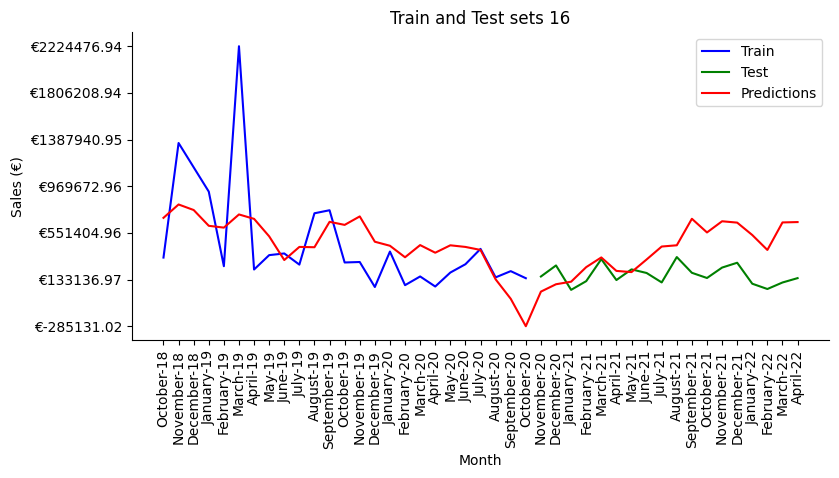

In [256]:
train_val_predictions('16', forecast_autoarima16_out['Train'], forecast_autoarima16_out['Test'], forecast_autoarima16_out['Predictions'])

<a class="anchor" id="xgboost1">
    
### XGBoost
    
</a>

### lag_data16

In [22]:
split_list = [60,65,70,75,80,85,90]
best_split_xgboost(split_list, lag_data16)

,Split,Train Error,Test Error
0,60,0.060,229265.774
1,65,0.051,173223.121
2,70,0.064,108941.174
3,75,0.075,107612.374
4,80,0.063,83649.065
5,85,0.055,79642.234
6,90,0.067,75263.591
7,year,0.055,79642.234


In [98]:
split_data = data_split(lag_data16, 90)
train_sales = split_data['train_sales']
test_sales = split_data['test_sales']
train_market = split_data['train_market']
test_market = split_data['test_market']

model_parameters = pd.DataFrame(columns = ['Parameters', 'Train Error', 'Test Error'])

# define the parameter grid to search over
params_grid = {
    'alpha':[0,1,2,5],
    'subsample':[0.1,0.3,0.5,1],
    'learning_rate': [0.5,0.1, 0.01, 0.001],
               'max_depth': [1, 2, 3, 5, 6, 8],
               'min_child_weight': [1,3, 5]}
grid = ParameterGrid(params_grid)

for p in grid:   
    model = xgb.XGBRegressor(**p)
    model.fit(train_market.iloc[:,1:], train_sales)
    forecast = model.predict(pd.concat([train_market, test_market]).drop('Date', axis=1))
    error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-forecast[:len(train_sales)])**2).mean()), 3)
    error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast[len(train_sales):])**2).mean()), 3)
    model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1376526499.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

In [99]:
model_parameters['Diff']=model_parameters['Test Error']-model_parameters['Train Error']
model_parameters['|Diff|']=abs(model_parameters['Diff'])
model_parameters.sort_values('|Diff|', ascending= True).head(30)

,Parameters,Train Error,Test Error,Diff,|Diff|
68,"{'alpha': 0, 'learning_rate': 0.5, 'max_depth'...",94896.385,109278.445,14382.060,14382.060
32,"{'alpha': 0, 'learning_rate': 0.5, 'max_depth'...",94896.385,109278.445,14382.060,14382.060
56,"{'alpha': 0, 'learning_rate': 0.5, 'max_depth'...",94896.385,109278.445,14382.060,14382.060
20,"{'alpha': 0, 'learning_rate': 0.5, 'max_depth'...",94896.385,109278.445,14382.060,14382.060
8,"{'alpha': 0, 'learning_rate': 0.5, 'max_depth'...",94896.385,109278.445,14382.060,14382.060
44,"{'alpha': 0, 'learning_rate': 0.5, 'max_depth'...",94896.385,109278.445,14382.060,14382.060
296,"{'alpha': 1, 'learning_rate': 0.5, 'max_depth'...",94896.391,109278.547,14382.156,14382.156
308,"{'alpha': 1, 'learning_rate': 0.5, 'max_depth'...",94896.391,109278.547,14382.156,14382.156
320,"{'alpha': 1, 'learning_rate': 0.5, 'max_depth'...",94896.391,109278.547,14382.156,14382.156
332,"{'alpha': 1, 'learning_rate': 0.5, 'max_depth'...",94896.391,109278.547,14382.156,14382.156


In [100]:
model_parameters.iloc[68,:]['Parameters']

{'alpha': 0,
 'learning_rate': 0.5,
 'max_depth': 8,
 'min_child_weight': 5,
 'subsample': 0.1}

In [102]:
forecast_xgboost16 = xgboost_forecast(90,lag_data16,0,0.5,8,5,0.1)

In [103]:
forecast_xgboost16['Performance']

,Measure,Train Error,Test Error
0,MAE,77882.825,101682.261
1,RMSE,94896.385,109278.445
2,R^2,-0.003,-6.452
3,MAPE (%),0.601,1.483


In [104]:
forecast_xgboost16['Predictions']

,Date,Sales Predictions
0,2020-01-01,202027.296875
1,2020-02-01,202027.296875
2,2020-03-01,202027.296875
3,2020-04-01,202027.296875
4,2020-05-01,202027.296875
5,2020-06-01,202027.296875
6,2020-07-01,202027.296875
7,2020-08-01,202027.296875
8,2020-09-01,202027.296875
9,2020-10-01,202027.296875


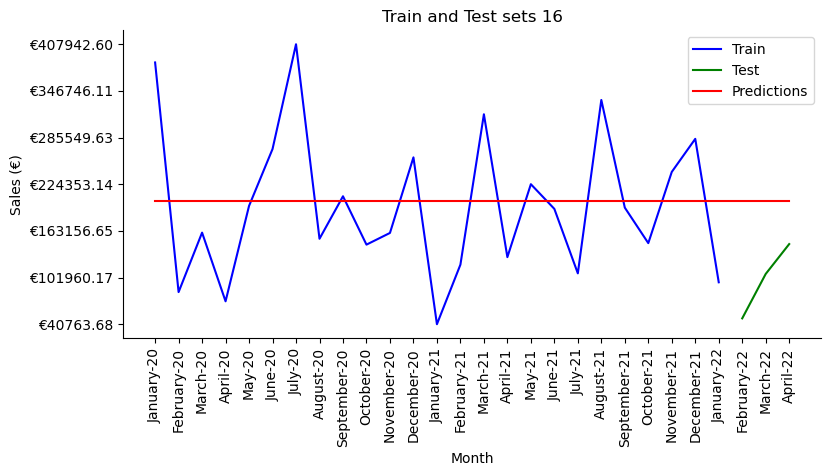

In [105]:
train_val_predictions('16', forecast_xgboost16['Train'], forecast_xgboost16['Test'], forecast_xgboost16['Predictions'])

<a class="anchor" id="xgboost1">
    
### Prophet
    
</a>

### data_agg16

In [449]:
split_list = [60,65,70,75,80,85,90]
best_split_prophet(split_list, data_agg16)

15:39:44 - cmdstanpy - INFO - Chain [1] start processing
15:40:08 - cmdstanpy - INFO - Chain [1] done processing
15:40:08 - cmdstanpy - INFO - Chain [1] start processing
15:40:08 - cmdstanpy - INFO - Chain [1] done processing
15:40:08 - cmdstanpy - INFO - Chain [1] start processing
15:40:08 - cmdstanpy - INFO - Chain [1] done processing
15:40:08 - cmdstanpy - INFO - Chain [1] start processing
15:40:08 - cmdstanpy - INFO - Chain [1] done processing
15:40:08 - cmdstanpy - INFO - Chain [1] start processing
15:40:08 - cmdstanpy - INFO - Chain [1] done processing
15:40:09 - cmdstanpy - INFO - Chain [1] start processing
15:40:09 - cmdstanpy - INFO - Chain [1] done processing
15:40:09 - cmdstanpy - INFO - Chain [1] start processing
15:40:09 - cmdstanpy - INFO - Chain [1] done processing
15:40:09 - cmdstanpy - INFO - Chain [1] start processing
15:40:09 - cmdstanpy - INFO - Chain [1] done processing


,Split,Train Error,Test Error
0,60,27.399,7455834.872
1,65,546108.213,2522687.277
2,70,547576.638,1759389.456
3,75,530726.464,1905944.563
4,80,519280.263,1824046.589
5,85,514075.913,1622650.656
6,90,506584.389,1516344.077
7,year,539202.690,1828378.044


In [450]:
split_data = data_split(data_agg16, 70)
train_sales = split_data['train_sales']
test_sales = split_data['test_sales']
train_market = split_data['train_market']
test_market = split_data['test_market']
prophet_data_train = pd.concat([train_market, train_sales], axis=1)
prophet_data_train.rename(columns={'Date': 'ds', 'Adjusted Sales (€)': 'y'}, inplace=True)
future = pd.concat([train_market, test_market])
model_parameters = pd.DataFrame(columns = ['Parameters'])
for p in grid:   
    train_model =Prophet(seasonality_mode = p['seasonality_mode'],
                         changepoint_prior_scale = p['changepoint_prior_scale'],
                         changepoint_range=p['changepoint_range'],
                         seasonality_prior_scale=p['seasonality_prior_scale']
                         )
    for column in train_market.columns[1:]:
        train_model.add_regressor(column)
    train_model.fit(prophet_data_train)
    forecast = train_model.predict(future.rename(columns={'Date': 'ds'}))
    error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-forecast['yhat'][:len(train_sales)].values)**2).mean()), 3)
    error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast['yhat'][len(train_sales):].values)**2).mean()), 3)
    model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)

15:40:37 - cmdstanpy - INFO - Chain [1] start processing
15:40:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\822640381.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:40:37 - cmdstanpy - INFO - Chain [1] start processing
15:40:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\822640381.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:40:38 - cmdstanpy - INFO - Chain [1] start processing
15:40:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppD

15:40:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\822640381.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:40:43 - cmdstanpy - INFO - Chain [1] start processing
15:41:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\822640381.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:41:04 - cmdstanpy - INFO - Chain [1] start processing
15:41:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\822640381.py:22: FutureWarn

In [451]:
model_parameters['Diff']=model_parameters['Test Error']-model_parameters['Train Error']
model_parameters['|Diff|']= abs(model_parameters['Diff'])
model_parameters.sort_values('|Diff|', ascending= True).head(30)

,Parameters,Test Error,Train Error,Diff,|Diff|
8,"{'changepoint_prior_scale': 0.1, 'changepoint_...",73756.777,78652.221,-4895.444,4895.444
1,"{'changepoint_prior_scale': 0.1, 'changepoint_...",77054.991,91027.654,-13972.663,13972.663
19,"{'changepoint_prior_scale': 0.3, 'changepoint_...",91584.052,75207.051,16377.001,16377.001
14,"{'changepoint_prior_scale': 0.3, 'changepoint_...",112865.956,62589.067,50276.889,50276.889
13,"{'changepoint_prior_scale': 0.3, 'changepoint_...",138369.867,84703.897,53665.970,53665.970
7,"{'changepoint_prior_scale': 0.1, 'changepoint_...",144381.931,86129.218,58252.713,58252.713
25,"{'changepoint_prior_scale': 0.5, 'changepoint_...",159427.342,76420.065,83007.277,83007.277
31,"{'changepoint_prior_scale': 0.5, 'changepoint_...",131321.413,33420.402,97901.011,97901.011
26,"{'changepoint_prior_scale': 0.5, 'changepoint_...",156410.224,54389.091,102021.133,102021.133
2,"{'changepoint_prior_scale': 0.1, 'changepoint_...",202383.448,88905.123,113478.325,113478.325


In [452]:
model_parameters.iloc[8,:]['Parameters']

{'changepoint_prior_scale': 0.1,
 'changepoint_range': 0.9,
 'seasonality_mode': 'multiplicative',
 'seasonality_prior_scale': 1.0}

In [453]:
forecast_prophet16 = prophet_forecast(70, data_agg16,0.1, 0.9, 'multiplicative', 1.0 )

15:42:55 - cmdstanpy - INFO - Chain [1] start processing
15:42:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\514556311.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result.rename(columns={'ds': 'Date', 'yhat': 'Sales Predictions'}, inplace = True)
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\514556311.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result['Date'] = result['Date'].dt.strftime('%Y-%m-%d')


In [454]:
forecast_prophet16['Performance']

,Measure,Train Error,Test Error
0,MAE,46135.993,55172.078
1,RMSE,78652.221,73756.777
2,R^2,0.992,0.116
3,MAPE (%),0.328,0.319


In [455]:
forecast_prophet16['Predictions']

,Date,Sales Predictions
0,2018-10-01,3.361336e+05
1,2018-11-01,1.358411e+06
2,2018-12-01,4.676691e+06
3,2019-01-01,9.265214e+05
4,2019-02-01,2.496339e+05
5,2019-03-01,2.222767e+06
6,2019-04-01,2.210972e+05
7,2019-05-01,3.500596e+05
8,2019-06-01,3.637979e+05
9,2019-07-01,2.872681e+05


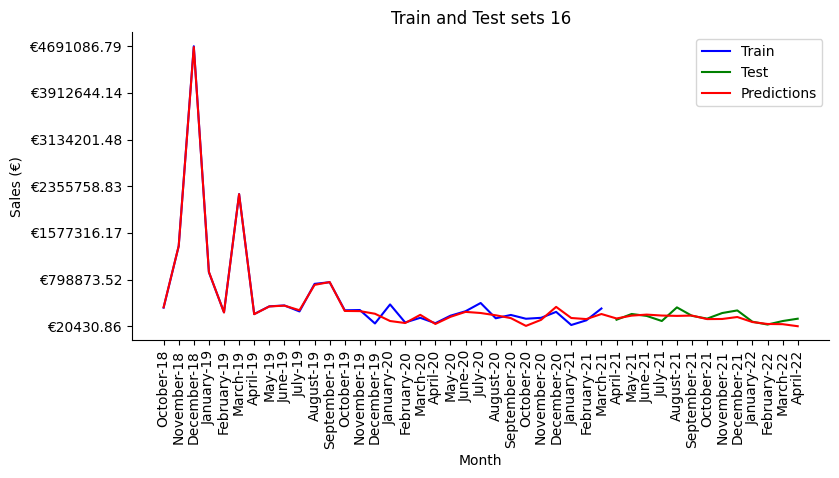

In [456]:
train_val_predictions('16', forecast_prophet16['Train'], forecast_prophet16['Test'], forecast_prophet16['Predictions'])

### Final Model

In [1444]:
# Values we have to predict
test_set[test_set['Mapped_GCK']=='#16']

,Month Year,Mapped_GCK,Sales_EUR
100,2022-03-01,#16,NaN
101,2022-06-01,#16,NaN
102,2022-07-01,#16,NaN
103,2022-08-01,#16,NaN
104,2022-09-01,#16,NaN
105,2022-10-01,#16,NaN
106,2022-11-01,#16,NaN
107,2022-12-01,#16,NaN
108,2023-01-01,#16,NaN
109,2023-02-01,#16,NaN


In [1445]:
# Arranging the dataset that will be used for the prediction
test_data_16=pd.DataFrame(index=test_set[test_set['Mapped_GCK']=='#16']['Month Year'],columns=data_agg16.columns).drop(
        columns='Unnamed: 0')
test_data_16.head()

,Shipments Index Machinery & Electricals Europe,Adjusted Sales (€)
Month Year,,
2022-03-01,NaN,NaN
2022-06-01,NaN,NaN
2022-07-01,NaN,NaN
2022-08-01,NaN,NaN
2022-09-01,NaN,NaN


In [1446]:
# Considering that the variables used have lags and that we have already predicted for some of the features, 
#we already have values we can fill
test_data_16.iloc[:4,0]=market_data_pred['Shipments Index Machinery & Electricals Europe'][-4:].values

#### Shipments Index Machinery & Electricals Europe

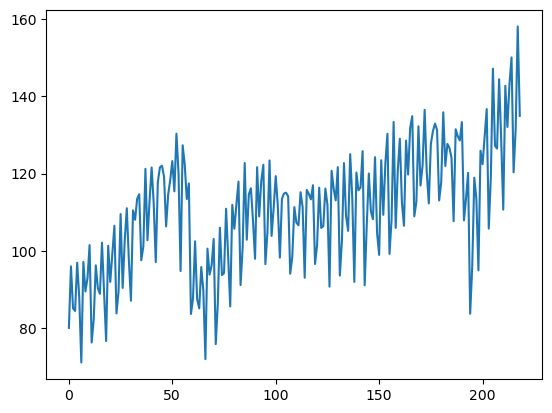

In [1447]:
plt.plot(market_data_pred.loc[:,'Shipments Index Machinery & Electricals Europe'])

In [1448]:
predict_simee=pd.DataFrame(market_data_pred.set_index('Unnamed: 0').loc[:,
            'Shipments Index Machinery & Electricals Europe'].dropna()).reset_index().rename(columns={'Unnamed: 0':'ds',
            'Shipments Index Machinery & Electricals Europe':'y'})
predict_simee.head()

,ds,y
0,2004-02-01,80.098530
1,2004-03-01,96.015929
2,2004-04-01,85.167236
3,2004-05-01,84.485767
4,2004-06-01,96.963294


In [1449]:
prophet_simee=Prophet()
prophet_simee.fit(predict_simee)

23:19:25 - cmdstanpy - INFO - Chain [1] start processing
23:19:25 - cmdstanpy - INFO - Chain [1] done processing


In [1450]:
future = prophet_simee.make_future_dataframe(periods=6,freq='m')
forecast = prophet_simee.predict(future)

# Fill missing values
test_data_16.iloc[-6:,0]=forecast['yhat'][-6:]

In [1452]:
final_16=Prophet(seasonality_mode='multiplicative',changepoint_prior_scale=0.1,changepoint_range=0.9,seasonality_prior_scale=1)
final_16.add_regressor('Shipments Index Machinery & Electricals Europe')
final_16.fit(data_agg16.rename(columns={'Unnamed: 0':'ds','Adjusted Sales (€)':'y'}))
forecast=final_16.predict(test_data_16.reset_index().rename(columns={'Month Year':'ds'}).iloc[:,:2])
final_predictions_16=list(forecast['yhat'])
final_predictions_16

23:19:38 - cmdstanpy - INFO - Chain [1] start processing
23:19:39 - cmdstanpy - INFO - Chain [1] done processing


[206020.2552853637,
 48671.53880996667,
 41377.82930981091,
 130485.86136046828,
 168952.17963469072,
 19129.016562340617,
 68507.94247248862,
 252113.4268745037,
 50881.4630289101,
 13864.403531884269]

<a class="anchor" id="gck20">
    
## Product Group 20
    
</a>

<a class="anchor" id="mean1">
    
### Mean
    
</a>

### data_agg20

In [244]:
split_list = [60,65,70,75,80,85,90]
best_split_mean(split_list, data_agg20)

,Split,Train Error,Test Error
0,60,1875.263,2827.888
1,65,2225.062,2464.004
2,70,2145.841,2662.460
3,75,2405.249,2052.791
4,80,2341.475,2225.666
5,85,2311.987,2326.767
6,90,2271.081,2621.625
7,year,2426.694,2036.464


In [261]:
forecast_mean20 = mean_forecast(75, data_agg20)

In [262]:
forecast_mean20['Performance']

,Measure,Train Error,Test Error
0,MAE,1.845003e+03,1.728895e+03
1,RMSE,2.405249e+03,2.052791e+03
2,R^2,0.000000e+00,-1.110000e-01
3,MAPE (%),8.481884e+17,1.644971e+18


In [263]:
forecast_mean20['Predictions']

,Date,Sales Predictions
0,2018-10-01,2008.913742
1,2018-11-01,2008.913742
2,2018-12-01,2008.913742
3,2019-01-01,2008.913742
4,2019-02-01,2008.913742
5,2019-03-01,2008.913742
6,2019-04-01,2008.913742
7,2019-05-01,2008.913742
8,2019-06-01,2008.913742
9,2019-07-01,2008.913742


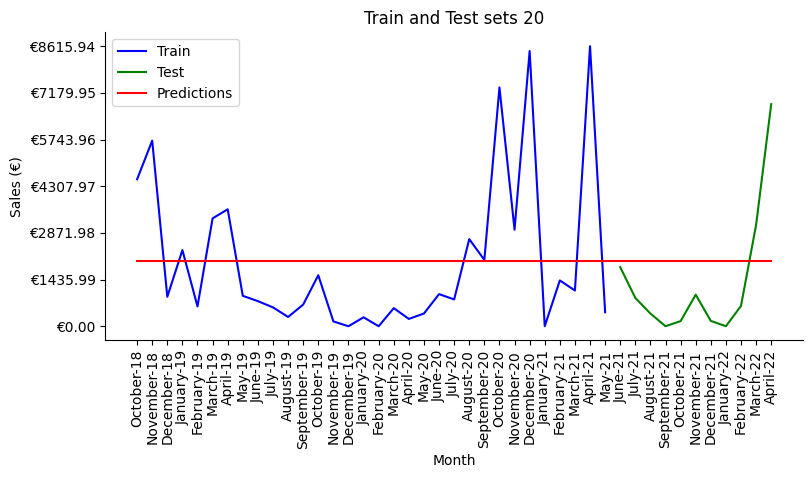

In [264]:
train_val_predictions('20', forecast_mean20['Train'], forecast_mean20['Test'], forecast_mean20['Predictions'])

<a class="anchor" id="median20">
    
### Median
    
</a>

### data_agg20

In [124]:
split_list = [60,65,70,75,80,85,90]
best_split_median(split_list, data_agg20)

,Split,Train Error,Test Error
0,60,2049.588,3071.797
1,65,2459.565,2558.955
2,70,2335.257,2818.808
3,75,2640.254,1996.053
4,80,2566.060,2186.272
5,85,2512.293,2456.574
6,90,2448.190,2888.019


In [125]:
forecast_median20 = median_forecast(75, data_agg20)
forecast_median20['Predictions']

,Date,Sales Predictions
0,2018-10-01,920.007325
1,2018-11-01,920.007325
2,2018-12-01,920.007325
3,2019-01-01,920.007325
4,2019-02-01,920.007325
5,2019-03-01,920.007325
6,2019-04-01,920.007325
7,2019-05-01,920.007325
8,2019-06-01,920.007325
9,2019-07-01,920.007325


In [126]:
forecast_median20['Performance']

,Measure,Train Error,Test Error
0,MAE,1.592261e+03,1.208393e+03
1,RMSE,2.640254e+03,1.996053e+03
2,R^2,-2.050000e-01,-5.100000e-02
3,MAPE (%),3.884386e+17,7.533354e+17


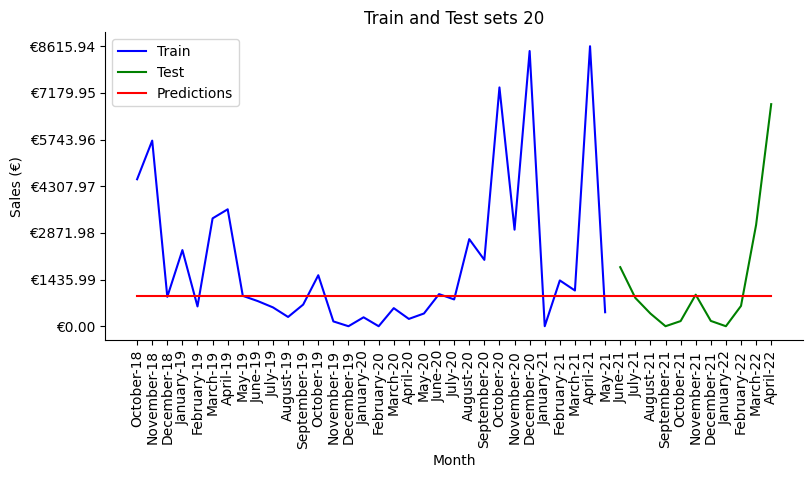

In [127]:
train_val_predictions('20', forecast_median20['Train'], forecast_median20['Test'], forecast_median20['Predictions'])

<a class="anchor" id="auto_arima20">
    
### Auto Arima
    
</a>

### data_agg20

In [229]:
split_list = [60,65,70,75,80,85,90]
best_split_autoarima(split_list, data_agg20)

,Split,Train Error,Test Error
0,60,1658.103,2610.260
1,65,2050.394,2763.618
2,70,2157.582,3168.822
3,75,2599.918,2513.498
4,80,2301.243,2585.004
5,85,2281.304,2486.185
6,90,2250.261,2770.427


In [230]:
forecast_autoarima20 = autoarima_forecast(85, data_agg20)
forecast_autoarima20['Predictions']

,Date,Sales Predictions
0,2018-10-01,1409.958865
1,2018-11-01,2241.822626
2,2018-12-01,2117.807856
3,2019-01-01,2418.410663
4,2019-02-01,2627.159683
5,2019-03-01,2276.638255
6,2019-04-01,1717.861276
7,2019-05-01,605.849477
8,2019-06-01,1401.999409
9,2019-07-01,1219.011870


In [231]:
forecast_autoarima20['Performance']

,Measure,Train Error,Test Error
0,MAE,1.713911e+03,2.130373e+03
1,RMSE,2.281304e+03,2.486185e+03
2,R^2,2.600000e-02,-1.480000e-01
3,MAPE (%),1.037685e+18,1.696442e+18


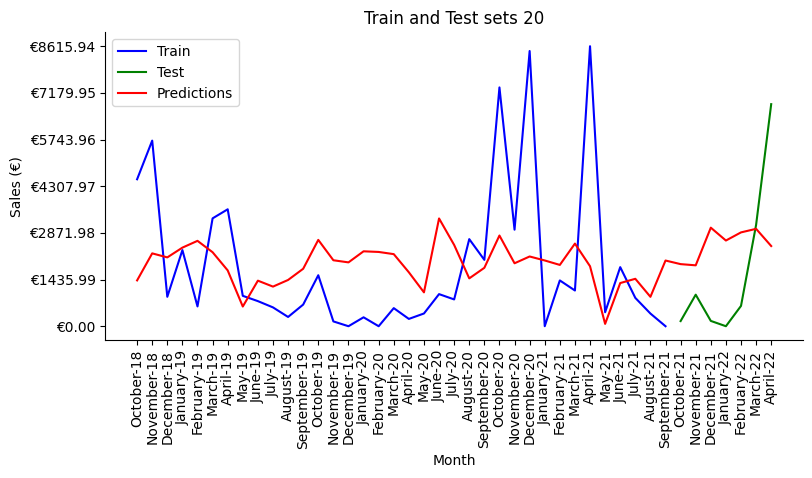

In [257]:
train_val_predictions('20', forecast_autoarima20['Train'], forecast_autoarima20['Test'], forecast_autoarima20['Predictions'])

<a class="anchor" id="median20">
    
### XGBoost
    
</a>

### lag_data20

In [131]:
split_list = [60,65,70,75,80,85,90]
best_split_xgboost(split_list, lag_data20)

,Split,Train Error,Test Error
0,60,0.001,2270.333
1,65,0.001,2266.270
2,70,0.001,1788.586
3,75,0.001,1991.978
4,80,0.001,2216.847
5,85,0.001,2457.488
6,90,0.001,3582.012
7,year,0.001,2457.488


In [260]:
split_data = data_split(lag_data20, 75)
train_sales = split_data['train_sales']
test_sales = split_data['test_sales']
train_market = split_data['train_market']
test_market = split_data['test_market']

model_parameters = pd.DataFrame(columns = ['Parameters', 'Train Error', 'Test Error'])

# define the parameter grid to search over
params_grid = {
    'alpha':[0,1,2,5],
    'subsample':[0.1,0.3,0.5,1],
    'learning_rate': [0.5,0.1, 0.01, 0.001],
               'max_depth': [1, 2, 3, 5, 6],
               'min_child_weight': [1,3,5]}
grid = ParameterGrid(params_grid)

for p in grid:   
    model = xgb.XGBRegressor(**p)
    model.fit(train_market.iloc[:,1:], train_sales)
    forecast = model.predict(pd.concat([train_market, test_market]).drop('Date', axis=1))
    error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-forecast[:len(train_sales)])**2).mean()), 3)
    error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast[len(train_sales):])**2).mean()), 3)
    model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1750698551.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

In [261]:
model_parameters['Diff']=model_parameters['Test Error']-model_parameters['Train Error']
model_parameters['|Diff|']= abs(model_parameters['Diff'])
model_parameters.sort_values('|Diff|', ascending= True).head(30)

,Parameters,Train Error,Test Error,Diff,|Diff|
854,"{'alpha': 5, 'learning_rate': 0.01, 'max_depth...",1947.727,1953.464,5.737,5.737
614,"{'alpha': 2, 'learning_rate': 0.01, 'max_depth...",1947.493,1953.362,5.869,5.869
374,"{'alpha': 1, 'learning_rate': 0.01, 'max_depth...",1947.415,1953.327,5.912,5.912
134,"{'alpha': 0, 'learning_rate': 0.01, 'max_depth...",1947.338,1953.293,5.955,5.955
386,"{'alpha': 1, 'learning_rate': 0.01, 'max_depth...",1906.465,1951.376,44.911,44.911
866,"{'alpha': 5, 'learning_rate': 0.01, 'max_depth...",1906.597,1951.547,44.950,44.950
146,"{'alpha': 0, 'learning_rate': 0.01, 'max_depth...",1906.367,1951.334,44.967,44.967
626,"{'alpha': 2, 'learning_rate': 0.01, 'max_depth...",1906.304,1951.421,45.117,45.117
117,"{'alpha': 0, 'learning_rate': 0.1, 'max_depth'...",1934.343,1887.771,-46.572,46.572
69,"{'alpha': 0, 'learning_rate': 0.1, 'max_depth'...",1934.343,1887.771,-46.572,46.572


In [267]:
model_parameters.iloc[614,:]['Parameters']

{'alpha': 2,
 'learning_rate': 0.01,
 'max_depth': 2,
 'min_child_weight': 1,
 'subsample': 0.5}

In [268]:
forecast_xgboost20 = xgboost_forecast(90, lag_data20,2,0.01,2,1,0.5 )

In [269]:
forecast_xgboost20['Performance']

,Measure,Train Error,Test Error
0,MAE,9.570160e+02,2.343258e+03
1,RMSE,1.845288e+03,3.371320e+03
2,R^2,3.360000e-01,-5.760000e-01
3,MAPE (%),2.172263e+17,4.193089e+17


In [270]:
forecast_xgboost20['Predictions']

,Date,Sales Predictions
0,2019-04-01,543.771790
1,2019-05-01,609.153687
2,2019-06-01,622.312927
3,2019-07-01,376.506561
4,2019-08-01,331.974335
5,2019-09-01,332.902344
6,2019-10-01,344.768158
7,2019-11-01,296.289337
8,2019-12-01,351.611542
9,2020-01-01,284.382904


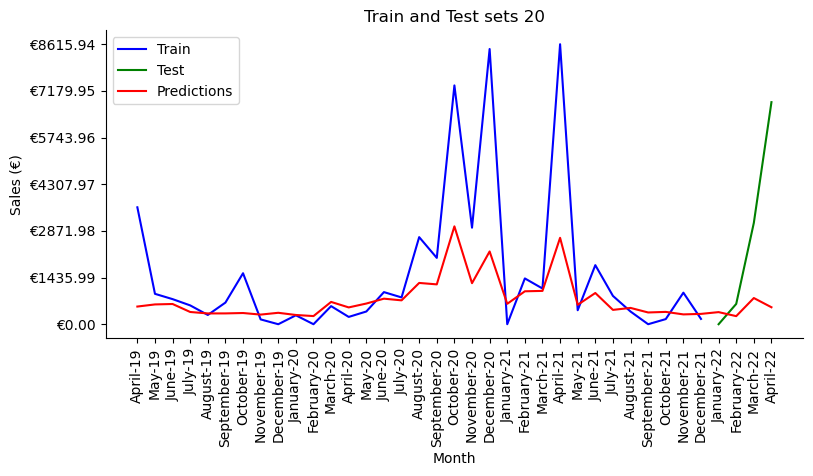

In [271]:
train_val_predictions('20', forecast_xgboost20['Train'], forecast_xgboost20['Test'], forecast_xgboost20['Predictions'])

<a class="anchor" id="xgboost1">
    
### Prophet
    
</a>

### data_agg20

In [457]:
split_list = [60,65,70,75,80,85,90]
best_split_prophet(split_list, data_agg20)

15:44:12 - cmdstanpy - INFO - Chain [1] start processing
15:44:27 - cmdstanpy - INFO - Chain [1] done processing
15:44:27 - cmdstanpy - INFO - Chain [1] start processing
15:44:27 - cmdstanpy - INFO - Chain [1] done processing
15:44:27 - cmdstanpy - INFO - Chain [1] start processing
15:44:27 - cmdstanpy - INFO - Chain [1] done processing
15:44:27 - cmdstanpy - INFO - Chain [1] start processing
15:44:28 - cmdstanpy - INFO - Chain [1] done processing
15:44:28 - cmdstanpy - INFO - Chain [1] start processing
15:44:28 - cmdstanpy - INFO - Chain [1] done processing
15:44:28 - cmdstanpy - INFO - Chain [1] start processing
15:44:28 - cmdstanpy - INFO - Chain [1] done processing
15:44:28 - cmdstanpy - INFO - Chain [1] start processing
15:44:28 - cmdstanpy - INFO - Chain [1] done processing
15:44:28 - cmdstanpy - INFO - Chain [1] start processing
15:44:29 - cmdstanpy - INFO - Chain [1] done processing


,Split,Train Error,Test Error
0,60,0.060,9564.793
1,65,892.953,9244.764
2,70,940.554,7426.467
3,75,1197.608,5198.856
4,80,1310.147,2443.667
5,85,1293.499,2518.335
6,90,1358.987,2785.235
7,year,1145.718,4096.498


In [458]:
split_data = data_split(data_agg20, 80)
train_sales = split_data['train_sales']
test_sales = split_data['test_sales']
train_market = split_data['train_market']
test_market = split_data['test_market']
prophet_data_train = pd.concat([train_market, train_sales], axis=1)
prophet_data_train.rename(columns={'Date': 'ds', 'Adjusted Sales (€)': 'y'}, inplace=True)
future = pd.concat([train_market, test_market])
model_parameters = pd.DataFrame(columns = ['Parameters'])
for p in grid:   
    train_model =Prophet(seasonality_mode = p['seasonality_mode'],
                         changepoint_prior_scale = p['changepoint_prior_scale'],
                         changepoint_range=p['changepoint_range'],
                         seasonality_prior_scale=p['seasonality_prior_scale']
                         )
    for column in train_market.columns[1:]:
        train_model.add_regressor(column)
    train_model.fit(prophet_data_train)
    forecast = train_model.predict(future.rename(columns={'Date': 'ds'}))
    error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-forecast['yhat'][:len(train_sales)].values)**2).mean()), 3)
    error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast['yhat'][len(train_sales):].values)**2).mean()), 3)
    model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)

15:44:48 - cmdstanpy - INFO - Chain [1] start processing
15:44:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\4140024658.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:44:48 - cmdstanpy - INFO - Chain [1] start processing
15:44:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\4140024658.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:44:48 - cmdstanpy - INFO - Chain [1] start processing
15:44:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\Ap

15:44:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\4140024658.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:44:53 - cmdstanpy - INFO - Chain [1] start processing
15:44:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\4140024658.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:44:54 - cmdstanpy - INFO - Chain [1] start processing
15:44:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\4140024658.py:22: FutureW

In [459]:
model_parameters['Diff']=model_parameters['Test Error']-model_parameters['Train Error']
model_parameters['|Diff|']= abs(model_parameters['Diff'])
model_parameters.sort_values('|Diff|', ascending= True).head(30)

,Parameters,Test Error,Train Error,Diff,|Diff|
9,"{'changepoint_prior_scale': 0.1, 'changepoint_...",2174.790,2070.667,104.123,104.123
3,"{'changepoint_prior_scale': 0.1, 'changepoint_...",2174.851,2070.667,104.184,104.184
0,"{'changepoint_prior_scale': 0.1, 'changepoint_...",2224.516,2097.264,127.252,127.252
6,"{'changepoint_prior_scale': 0.1, 'changepoint_...",2235.588,2097.029,138.559,138.559
15,"{'changepoint_prior_scale': 0.3, 'changepoint_...",2357.772,1988.831,368.941,368.941
21,"{'changepoint_prior_scale': 0.3, 'changepoint_...",2364.509,1987.609,376.900,376.900
4,"{'changepoint_prior_scale': 0.1, 'changepoint_...",2271.778,1735.635,536.143,536.143
10,"{'changepoint_prior_scale': 0.1, 'changepoint_...",2271.917,1735.534,536.383,536.383
5,"{'changepoint_prior_scale': 0.1, 'changepoint_...",2166.881,1411.954,754.927,754.927
11,"{'changepoint_prior_scale': 0.1, 'changepoint_...",2167.189,1412.070,755.119,755.119


In [460]:
model_parameters.iloc[9,:]['Parameters']

{'changepoint_prior_scale': 0.1,
 'changepoint_range': 0.9,
 'seasonality_mode': 'additive',
 'seasonality_prior_scale': 0.01}

In [461]:
forecast_prophet20 = prophet_forecast(80, data_agg20,0.1, 0.9, 'additive', 0.01 )

15:45:51 - cmdstanpy - INFO - Chain [1] start processing
15:45:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\514556311.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result.rename(columns={'ds': 'Date', 'yhat': 'Sales Predictions'}, inplace = True)
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\514556311.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result['Date'] = result['Date'].dt.strftime('%Y-%m-%d')


In [462]:
forecast_prophet20['Performance']

,Measure,Train Error,Test Error
0,MAE,1.658094e+03,1.897812e+03
1,RMSE,2.070667e+03,2.174790e+03
2,R^2,2.180000e-01,-3.200000e-02
3,MAPE (%),7.072849e+17,1.488653e+18


In [463]:
forecast_prophet20['Predictions']

,Date,Sales Predictions
0,2018-10-01,1924.431347
1,2018-11-01,2728.233061
2,2018-12-01,2119.849210
3,2019-01-01,976.077145
4,2019-02-01,1828.810026
5,2019-03-01,1649.092224
6,2019-04-01,2622.983267
7,2019-05-01,956.757277
8,2019-06-01,1588.859979
9,2019-07-01,1643.426945


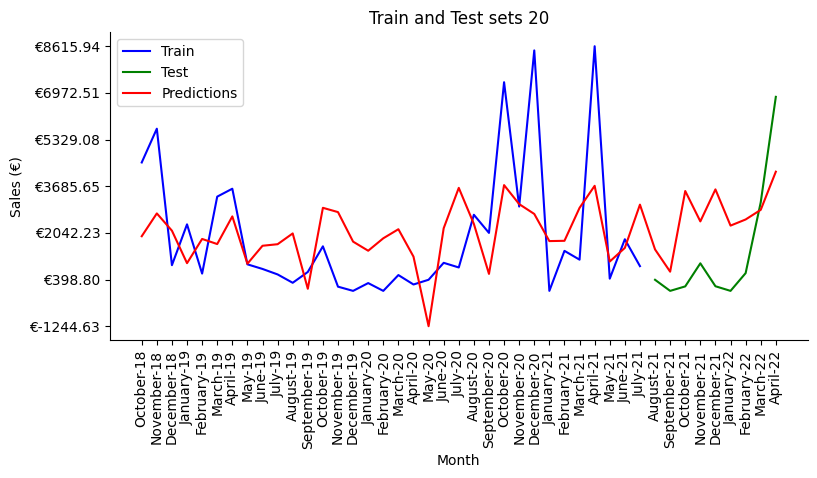

In [464]:
train_val_predictions('20', forecast_prophet20['Train'], forecast_prophet20['Test'], forecast_prophet20['Predictions'])

### Final Model

In [1453]:
# Values we have to predict
test_set[test_set['Mapped_GCK']=='#20']

,Month Year,Mapped_GCK,Sales_EUR
110,2022-03-01,#20,NaN
111,2022-06-01,#20,NaN
112,2022-07-01,#20,NaN
113,2022-08-01,#20,NaN
114,2022-09-01,#20,NaN
115,2022-10-01,#20,NaN
116,2022-11-01,#20,NaN
117,2022-12-01,#20,NaN
118,2023-01-01,#20,NaN
119,2023-02-01,#20,NaN


In [1454]:
# Arranging the dataset that will be used for the prediction
test_data_20=pd.DataFrame(index=test_set[test_set['Mapped_GCK']=='#20']['Month Year'],columns=data_agg20.columns).drop(
        columns='Unnamed: 0')
test_data_20.head()

,Producer Prices Electrical equipment China,Shipments Index Machinery & Electricals United Kingdom,Adjusted Sales (€)
Month Year,,,
2022-03-01,NaN,NaN,NaN
2022-06-01,NaN,NaN,NaN
2022-07-01,NaN,NaN,NaN
2022-08-01,NaN,NaN,NaN
2022-09-01,NaN,NaN,NaN


In [1455]:
# Considering that the variables used have lags and that we have already predicted for some of the features, 
#we already have values we can fill
test_data_20.iloc[:9,0]=market_data_pred['Producer Prices Electrical equipment China '][-9:].values
test_data_20.iloc[:4,1]=market_data_pred['Shipments Index Machinery & Electricals United Kingdom'][-4:].values
test_data_20.iloc[-1,0]=test_data_1.iloc[1,4]

#### Shipments Index Machinery & Electricals United Kingdom

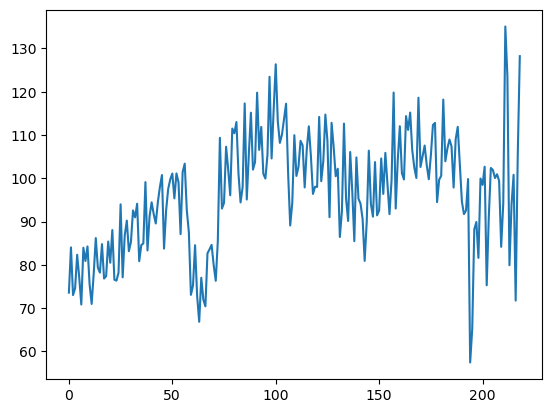

In [1456]:
plt.plot(market_data_pred.loc[:,'Shipments Index Machinery & Electricals United Kingdom'])

In [1457]:
predict_simeuk=pd.DataFrame(market_data_pred.set_index('Unnamed: 0').loc[:,
            'Shipments Index Machinery & Electricals United Kingdom'].dropna()).reset_index().rename(columns={'Unnamed: 0':'ds',
            'Shipments Index Machinery & Electricals United Kingdom':'y'})
predict_simeuk.head()

,ds,y
0,2004-02-01,73.601265
1,2004-03-01,84.047595
2,2004-04-01,73.026027
3,2004-05-01,74.591883
4,2004-06-01,82.343346


In [1458]:
prophet_simeuk=Prophet()
prophet_simeuk.fit(predict_simeuk)

23:19:55 - cmdstanpy - INFO - Chain [1] start processing
23:19:55 - cmdstanpy - INFO - Chain [1] done processing


In [1459]:
future = prophet_simeuk.make_future_dataframe(periods=6,freq='m')
forecast = prophet_simeuk.predict(future)

# Fill missing values
test_data_20.iloc[-6:,1]=forecast['yhat'][-6:]

In [1460]:
final_20=auto_arima(data_agg20.iloc[:,-1],X=data_agg20.iloc[:,1:3],stepwise=False)
forecast=final_20.predict(n_periods=10,X=test_data_20.iloc[:,:-1])
final_predictions_20=list(forecast.values)
final_predictions_20

[2057.5548191460325,
 4291.748910112466,
 1810.2609705640352,
 10.85918993629966,
 2434.412466042972,
 1921.3150534724218,
 2434.747057344681,
 2756.8008900855652,
 1701.6624193369337,
 1588.2585027845673]

<a class="anchor" id="gck36">
    
## Product Group 36
    
</a>

<a class="anchor" id="mean1">
    
### Mean
    
</a>

### data_agg36

In [268]:
split_list = [60,65,70,75,80,85,90]
best_split_mean(split_list, data_agg36)

,Split,Train Error,Test Error
0,60,27930.065,58000.713
1,65,27079.590,61521.432
2,70,25901.704,68315.633
3,75,48961.360,16450.656
4,80,47517.691,17893.767
5,85,46253.667,19214.113
6,90,45287.740,17828.117
7,year,49693.144,16355.524


In [269]:
forecast_mean36 = mean_forecast(90, data_agg36)

In [270]:
forecast_mean36['Performance']

,Measure,Train Error,Test Error
0,MAE,21257.878,15808.304
1,RMSE,45287.740,17828.117
2,R^2,0.000,-0.009
3,MAPE (%),2.999,2.280


In [271]:
forecast_mean36['Predictions']

,Date,Sales Predictions
0,2018-10-01,23774.27904
1,2018-11-01,23774.27904
2,2018-12-01,23774.27904
3,2019-01-01,23774.27904
4,2019-02-01,23774.27904
5,2019-03-01,23774.27904
6,2019-04-01,23774.27904
7,2019-05-01,23774.27904
8,2019-06-01,23774.27904
9,2019-07-01,23774.27904


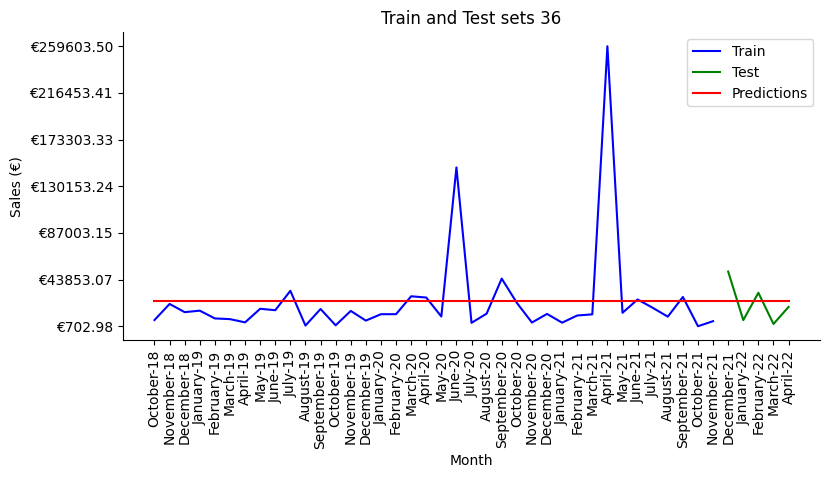

In [272]:
train_val_predictions('36', forecast_mean36['Train'], forecast_mean36['Test'], forecast_mean36['Predictions'])

### out_data_agg36

In [273]:
split_list = [60,65,70,75,80,85,90]
best_split_mean(split_list, out_data_agg36)

,Split,Train Error,Test Error
0,60,27930.065,13404.719
1,65,27079.590,13230.460
2,70,25901.704,13583.963
3,75,25113.270,14585.488
4,80,24397.721,15933.395
5,85,23807.454,17400.051
6,90,23420.136,18396.721
7,year,25500.728,14034.010


In [274]:
forecast_otmean36 = mean_forecast(85, out_data_agg36)

In [275]:
forecast_otmean36['Performance']

,Measure,Train Error,Test Error
0,MAE,11977.754,14901.285
1,RMSE,23807.454,17400.051
2,R^2,0.000,-0.007
3,MAPE (%),1.512,5.075


In [276]:
forecast_otmean36['Predictions']

,Date,Sales Predictions
0,2018-10-01,18059.368676
1,2018-11-01,18059.368676
2,2018-12-01,18059.368676
3,2019-01-01,18059.368676
4,2019-02-01,18059.368676
5,2019-03-01,18059.368676
6,2019-04-01,18059.368676
7,2019-05-01,18059.368676
8,2019-06-01,18059.368676
9,2019-07-01,18059.368676


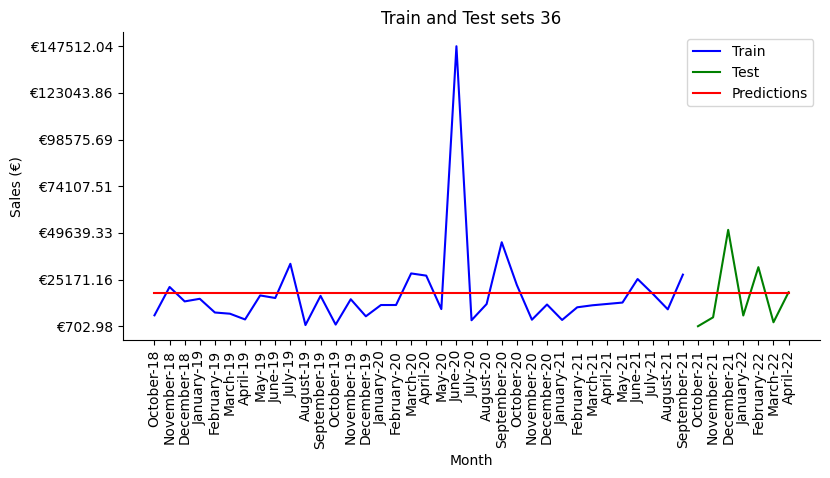

In [277]:
train_val_predictions('36', forecast_otmean36['Train'], forecast_otmean36['Test'], forecast_otmean36['Predictions'])

<a class="anchor" id="median36">
    
### Median
    
</a>

### data_agg36

In [128]:
split_list = [60,65,70,75,80,85,90]
best_split_median(split_list, data_agg36)

,Split,Train Error,Test Error
0,60,28642.980,59253.944
1,65,27929.890,63193.504
2,70,26629.889,70199.298
3,75,50739.770,15661.640
4,80,49152.516,16497.412
5,85,47836.134,17783.667
6,90,46740.674,20320.878


In [129]:
forecast_median36 = median_forecast(75, data_agg36)
forecast_median36['Predictions']

,Date,Sales Predictions
0,2018-10-01,12210.922925
1,2018-11-01,12210.922925
2,2018-12-01,12210.922925
3,2019-01-01,12210.922925
4,2019-02-01,12210.922925
5,2019-03-01,12210.922925
6,2019-04-01,12210.922925
7,2019-05-01,12210.922925
8,2019-06-01,12210.922925
9,2019-07-01,12210.922925


In [130]:
forecast_median36['Performance']

,Measure,Train Error,Test Error
0,MAE,18385.568,12310.953
1,RMSE,50739.770,15661.640
2,R^2,-0.074,-0.153
3,MAPE (%),1.047,2.306


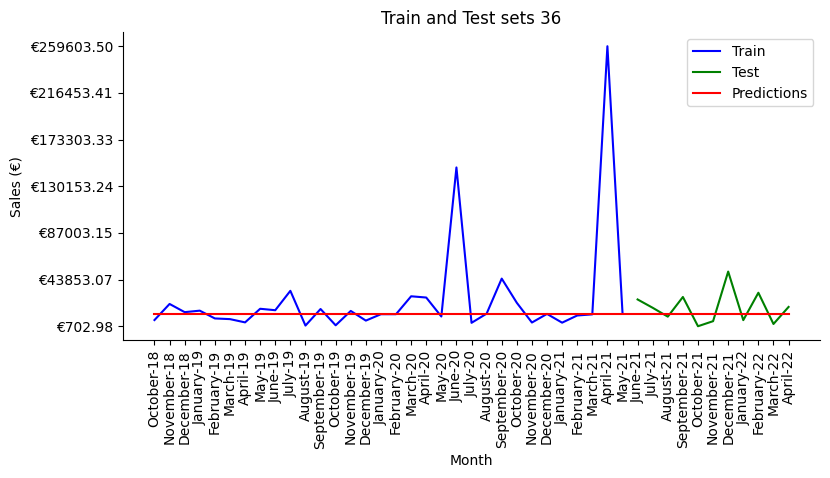

In [131]:
train_val_predictions('36', forecast_median36['Train'], forecast_median36['Test'], forecast_median36['Predictions'])

<a class="anchor" id="auto_arima36">
    
### Auto Arima
    
</a>

### data_agg36

In [233]:
split_list = [60,65,70,75,80,85,90]
best_split_autoarima(split_list, data_agg36)

,Split,Train Error,Test Error
0,60,22939.017,62313.741
1,65,21541.477,64155.769
2,70,21152.910,68873.750
3,75,43531.512,30589.922
4,80,42898.061,28286.740
5,85,41886.408,29973.630
6,90,42134.046,29707.007


In [234]:
forecast_autoarima36 = autoarima_forecast(80, data_agg36)
forecast_autoarima36['Predictions']

,Date,Sales Predictions
0,2018-10-01,30617.722637
1,2018-11-01,-3327.131718
2,2018-12-01,34420.856218
3,2019-01-01,8129.928604
4,2019-02-01,17489.725392
5,2019-03-01,15122.160546
6,2019-04-01,45357.205278
7,2019-05-01,23190.553988
8,2019-06-01,57018.249656
9,2019-07-01,28548.521169


In [235]:
forecast_autoarima36['Performance']

,Measure,Train Error,Test Error
0,MAE,23374.261,26158.577
1,RMSE,42898.061,28286.740
2,R^2,0.185,-2.162
3,MAPE (%),2.169,9.735


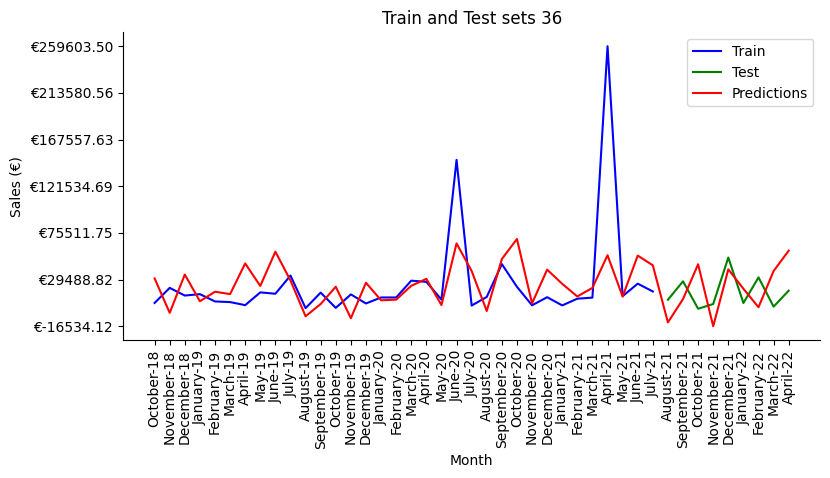

In [258]:
train_val_predictions('36', forecast_autoarima36['Train'], forecast_autoarima36['Test'], forecast_autoarima36['Predictions'])

### out_data_agg36

In [237]:
split_list = [60,65,70,75,80,85,90]
best_split_autoarima(split_list, out_data_agg36)

,Split,Train Error,Test Error
0,60,22939.017,18582.270
1,65,21541.477,17109.096
2,70,21152.910,19557.703
3,75,19753.532,19425.661
4,80,19364.864,21566.356
5,85,19190.088,23711.515
6,90,20508.443,17448.440


In [238]:
forecast_autoarima36_out = autoarima_forecast(65, out_data_agg36)
forecast_autoarima36_out['Predictions']

,Date,Sales Predictions
0,2018-10-01,31798.951200
1,2018-11-01,-9711.286367
2,2018-12-01,7045.778003
3,2019-01-01,6247.842569
4,2019-02-01,23141.828848
5,2019-03-01,15311.730301
6,2019-04-01,14540.569892
7,2019-05-01,3777.075262
8,2019-06-01,32024.284788
9,2019-07-01,12071.019629


In [239]:
forecast_autoarima36_out['Performance']

,Measure,Train Error,Test Error
0,MAE,15895.353,13305.067
1,RMSE,21541.477,17109.096
2,R^2,0.367,-0.808
3,MAPE (%),2.020,4.892


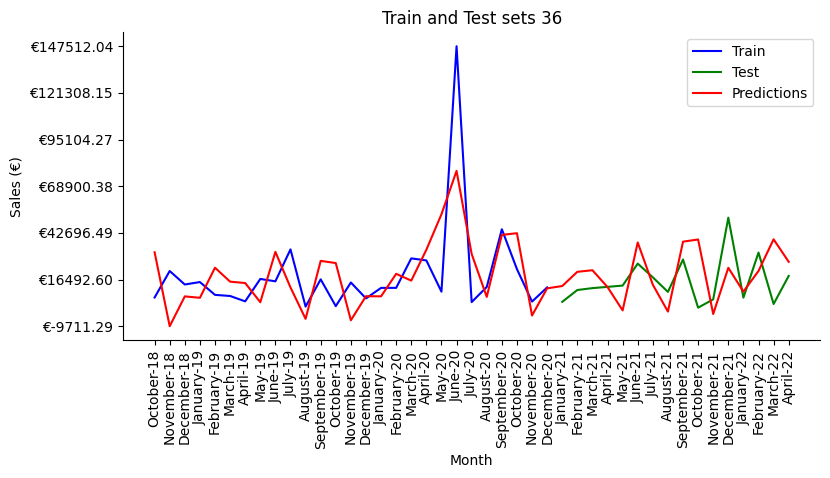

In [259]:
train_val_predictions('36', forecast_autoarima36_out['Train'], forecast_autoarima36_out['Test'], forecast_autoarima36_out['Predictions'])

<a class="anchor" id="xgboost1">
    
### XGBoost
    
</a>

### lag_data36

In [278]:
split_list = [60,65,70,75,80,85,90]
best_split_xgboost(split_list, lag_data36)

,Split,Train Error,Test Error
0,60,0.010,65551.566
1,65,0.013,69781.942
2,70,0.015,13554.273
3,75,0.014,14513.304
4,80,0.020,17678.803
5,85,0.026,18785.597
6,90,0.019,9531.551
7,year,0.026,18785.597


In [272]:
split_data = data_split(lag_data36, 90)
train_sales = split_data['train_sales']
test_sales = split_data['test_sales']
train_market = split_data['train_market']
test_market = split_data['test_market']

model_parameters = pd.DataFrame(columns = ['Parameters', 'Train Error', 'Test Error'])

# define the parameter grid to search over
params_grid = {
    'alpha':[0,1,2,5],
    'subsample':[0.1,0.3,0.5,1],
    'learning_rate': [0.5,0.1, 0.01, 0.001],
               'max_depth': [1, 2, 3, 5, 6],
               'min_child_weight': [1,3,5]}
grid = ParameterGrid(params_grid)

for p in grid:   
    model = xgb.XGBRegressor(**p)
    model.fit(train_market.iloc[:,1:], train_sales)
    forecast = model.predict(pd.concat([train_market, test_market]).drop('Date', axis=1))
    error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-forecast[:len(train_sales)])**2).mean()), 3)
    error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast[len(train_sales):])**2).mean()), 3)
    model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\1651889451.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Parameters': p, 'Train Error': error1, 'Test Error': error2}, ignore_index=True)
C:\Users\migu

In [273]:
model_parameters['Diff']=model_parameters['Test Error']-model_parameters['Train Error']
model_parameters['|Diff|']= abs(model_parameters['Diff'])
model_parameters.sort_values('|Diff|', ascending= True).head(30)

,Parameters,Train Error,Test Error,Diff,|Diff|
65,"{'alpha': 0, 'learning_rate': 0.1, 'max_depth'...",36523.806,36236.383,-287.423,287.423
305,"{'alpha': 1, 'learning_rate': 0.1, 'max_depth'...",36523.822,36236.205,-287.617,287.617
545,"{'alpha': 2, 'learning_rate': 0.1, 'max_depth'...",36523.838,36236.041,-287.797,287.797
785,"{'alpha': 5, 'learning_rate': 0.1, 'max_depth'...",36523.899,36235.534,-288.365,288.365
77,"{'alpha': 0, 'learning_rate': 0.1, 'max_depth'...",34482.848,33605.847,-877.001,877.001
317,"{'alpha': 1, 'learning_rate': 0.1, 'max_depth'...",34482.864,33605.695,-877.169,877.169
557,"{'alpha': 2, 'learning_rate': 0.1, 'max_depth'...",34482.889,33605.555,-877.334,877.334
797,"{'alpha': 5, 'learning_rate': 0.1, 'max_depth'...",34482.945,33605.119,-877.826,877.826
119,"{'alpha': 0, 'learning_rate': 0.1, 'max_depth'...",20360.301,18818.731,-1541.570,1541.570
107,"{'alpha': 0, 'learning_rate': 0.1, 'max_depth'...",20360.301,18818.731,-1541.570,1541.570


In [274]:
model_parameters.loc[65,:]['Parameters']

{'alpha': 0,
 'learning_rate': 0.1,
 'max_depth': 1,
 'min_child_weight': 3,
 'subsample': 0.3}

In [374]:
forecast_xgboost36 = xgboost_forecast(90, lag_data36, 0,0.1,1,3,0.3)

In [276]:
forecast_xgboost36['Performance']

,Measure,Train Error,Test Error
0,MAE,19605.524,33126.289
1,RMSE,36523.806,36236.383
2,R^2,0.431,-9.205
3,MAPE (%),3.760,6.478


In [277]:
forecast_xgboost36['Predictions']

,Date,Sales Predictions
0,2019-04-01,30152.906250
1,2019-05-01,4878.710938
2,2019-06-01,49221.332031
3,2019-07-01,5592.601074
4,2019-08-01,14796.449219
5,2019-09-01,20381.984375
6,2019-10-01,15461.454102
7,2019-11-01,9261.302734
8,2019-12-01,-5917.272949
9,2020-01-01,12854.675781


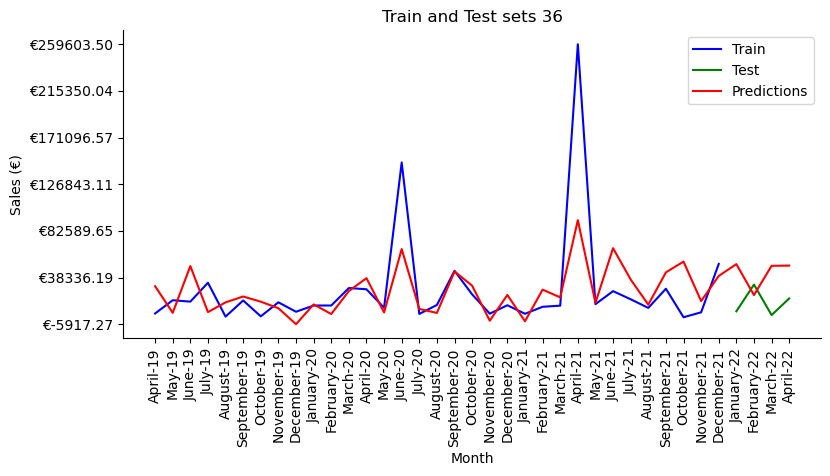

In [278]:
train_val_predictions('36', forecast_xgboost36['Train'], forecast_xgboost36['Test'], forecast_xgboost36['Predictions'])

<a class="anchor" id="xgboost1">
    
### Prophet
    
</a>

### data_agg36

In [465]:
split_list = [60,65,70,75,80,85,90]
best_split_prophet(split_list, data_agg36)

15:47:07 - cmdstanpy - INFO - Chain [1] start processing
15:47:32 - cmdstanpy - INFO - Chain [1] done processing
15:47:32 - cmdstanpy - INFO - Chain [1] start processing
15:47:54 - cmdstanpy - INFO - Chain [1] done processing
15:47:54 - cmdstanpy - INFO - Chain [1] start processing
15:47:55 - cmdstanpy - INFO - Chain [1] done processing
15:47:55 - cmdstanpy - INFO - Chain [1] start processing
15:47:55 - cmdstanpy - INFO - Chain [1] done processing
15:47:55 - cmdstanpy - INFO - Chain [1] start processing
15:47:55 - cmdstanpy - INFO - Chain [1] done processing
15:47:55 - cmdstanpy - INFO - Chain [1] start processing
15:47:55 - cmdstanpy - INFO - Chain [1] done processing
15:47:56 - cmdstanpy - INFO - Chain [1] start processing
15:47:56 - cmdstanpy - INFO - Chain [1] done processing
15:47:56 - cmdstanpy - INFO - Chain [1] start processing
15:47:56 - cmdstanpy - INFO - Chain [1] done processing


,Split,Train Error,Test Error
0,60,0.763,79149.230
1,65,1.323,710022.725
2,70,1830.640,290378.043
3,75,20199.420,303086.503
4,80,21306.381,68342.789
5,85,21724.018,36912.207
6,90,22969.670,31011.141
7,year,12328.224,1526367.104


In [467]:
split_data = data_split(data_agg36, 75)
train_sales = split_data['train_sales']
test_sales = split_data['test_sales']
train_market = split_data['train_market']
test_market = split_data['test_market']
prophet_data_train = pd.concat([train_market, train_sales], axis=1)
prophet_data_train.rename(columns={'Date': 'ds', 'Adjusted Sales (€)': 'y'}, inplace=True)
future = pd.concat([train_market, test_market])
model_parameters = pd.DataFrame(columns = ['Parameters'])
for p in grid:   
    train_model =Prophet(seasonality_mode = p['seasonality_mode'],
                         changepoint_prior_scale = p['changepoint_prior_scale'],
                         changepoint_range=p['changepoint_range'],
                         seasonality_prior_scale=p['seasonality_prior_scale']
                         )
    for column in train_market.columns[1:]:
        train_model.add_regressor(column)
    train_model.fit(prophet_data_train)
    forecast = train_model.predict(future.rename(columns={'Date': 'ds'}))
    error1 = round(np.sqrt(((train_sales['Adjusted Sales (€)'].values-forecast['yhat'][:len(train_sales)].values)**2).mean()), 3)
    error2 = round(np.sqrt(((test_sales['Adjusted Sales (€)'].values-forecast['yhat'][len(train_sales):].values)**2).mean()), 3)
    model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)

15:49:05 - cmdstanpy - INFO - Chain [1] start processing
15:49:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\3089479893.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:49:05 - cmdstanpy - INFO - Chain [1] start processing
15:49:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\3089479893.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:49:05 - cmdstanpy - INFO - Chain [1] start processing
15:49:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\Ap

15:49:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\3089479893.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:49:11 - cmdstanpy - INFO - Chain [1] start processing
15:49:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\3089479893.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  model_parameters = model_parameters.append({'Train Error':error1,'Test Error':error2,'Parameters':p},ignore_index=True)
15:49:32 - cmdstanpy - INFO - Chain [1] start processing
15:49:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\rodri\AppData\Local\Temp\ipykernel_9400\3089479893.py:22: FutureW

In [468]:
model_parameters['Diff']=model_parameters['Test Error']-model_parameters['Train Error']
model_parameters['|Diff|']= abs(model_parameters['Diff'])
model_parameters.sort_values('|Diff|', ascending= True).head(30)

,Parameters,Test Error,Train Error,Diff,|Diff|
34,"{'changepoint_prior_scale': 0.5, 'changepoint_...",49336.582,30798.684,18537.898,18537.898
33,"{'changepoint_prior_scale': 0.5, 'changepoint_...",88228.142,39493.413,48734.729,48734.729
15,"{'changepoint_prior_scale': 0.3, 'changepoint_...",88351.339,39498.128,48853.211,48853.211
27,"{'changepoint_prior_scale': 0.5, 'changepoint_...",88352.333,39497.841,48854.492,48854.492
21,"{'changepoint_prior_scale': 0.3, 'changepoint_...",88355.950,39498.132,48857.818,48857.818
9,"{'changepoint_prior_scale': 0.1, 'changepoint_...",88605.106,39497.429,49107.677,49107.677
3,"{'changepoint_prior_scale': 0.1, 'changepoint_...",88686.448,39497.089,49189.359,49189.359
23,"{'changepoint_prior_scale': 0.3, 'changepoint_...",98801.847,19295.743,79506.104,79506.104
28,"{'changepoint_prior_scale': 0.5, 'changepoint_...",139576.001,32441.750,107134.251,107134.251
24,"{'changepoint_prior_scale': 0.5, 'changepoint_...",178457.188,33500.532,144956.656,144956.656


In [469]:
model_parameters.iloc[34,:]['Parameters']

{'changepoint_prior_scale': 0.5,
 'changepoint_range': 0.9,
 'seasonality_mode': 'additive',
 'seasonality_prior_scale': 0.1}

In [373]:
forecast_prophet36 = prophet_forecast(85, data_agg36,0.5, 0.9, 'additive', 0.1 )

17:59:39 - cmdstanpy - INFO - Chain [1] start processing
17:59:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\514556311.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result.rename(columns={'ds': 'Date', 'yhat': 'Sales Predictions'}, inplace = True)
C:\Users\migue\AppData\Local\Temp\ipykernel_10032\514556311.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result['Date'] = result['Date'].dt.strftime('%Y-%m-%d')


In [471]:
forecast_prophet36['Performance']

,Measure,Train Error,Test Error
0,MAE,17880.543,33312.881
1,RMSE,30077.141,39196.557
2,R^2,0.577,-4.108
3,MAPE (%),1.870,10.593


In [472]:
forecast_prophet36['Predictions']

,Date,Sales Predictions
0,2018-10-01,181.906471
1,2018-11-01,19041.399991
2,2018-12-01,3122.276903
3,2019-01-01,-8877.873685
4,2019-02-01,13131.035220
5,2019-03-01,-13587.160251
6,2019-04-01,92442.021419
7,2019-05-01,5327.858120
8,2019-06-01,34852.837368
9,2019-07-01,-24710.774289


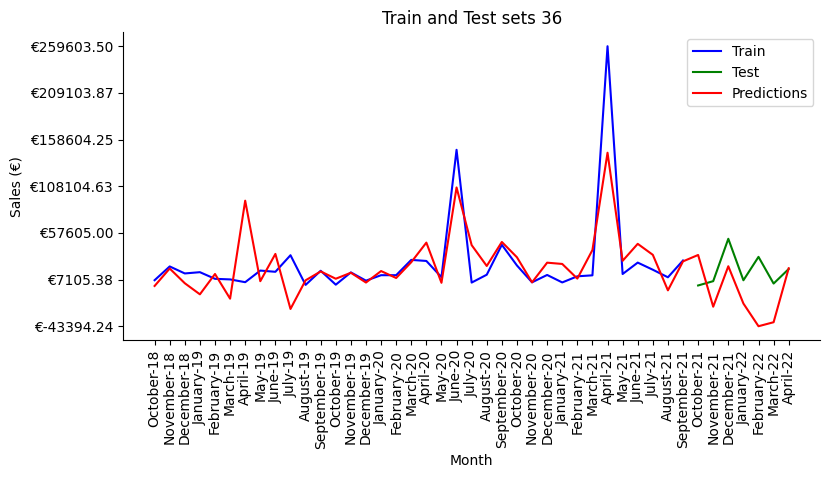

In [473]:
train_val_predictions('36', forecast_prophet36['Train'], forecast_prophet36['Test'], forecast_prophet36['Predictions'])

### Final Model

In [1461]:
# Values we have to predict
test_set[test_set['Mapped_GCK']=='#36']

,Month Year,Mapped_GCK,Sales_EUR
120,2022-03-01,#36,NaN
121,2022-06-01,#36,NaN
122,2022-07-01,#36,NaN
123,2022-08-01,#36,NaN
124,2022-09-01,#36,NaN
125,2022-10-01,#36,NaN
126,2022-11-01,#36,NaN
127,2022-12-01,#36,NaN
128,2023-01-01,#36,NaN
129,2023-02-01,#36,NaN


In [1462]:
# Arranging the dataset that will be used for the prediction
test_data_36=pd.DataFrame(index=test_set[test_set['Mapped_GCK']=='#36']['Month Year'],columns=data_agg36.columns).drop(
        columns='Unnamed: 0')
test_data_36.head()

,Production Index Machinery & Electricals Italy,Producer Prices Electrical equipment United States,Shipments Index Machinery & Electricals United States,Production Index Machinery & Electricals France,Adjusted Sales (€)
Month Year,,,,,
2022-03-01,NaN,NaN,NaN,NaN,NaN
2022-06-01,NaN,NaN,NaN,NaN,NaN
2022-07-01,NaN,NaN,NaN,NaN,NaN
2022-08-01,NaN,NaN,NaN,NaN,NaN
2022-09-01,NaN,NaN,NaN,NaN,NaN


In [1463]:
# Considering that the variables used have lags and that we have already predicted for some of the features, 
#we already have values we can fill
test_data_36.iloc[:2,0]=market_data_pred['Production Index Machinery & Electricals Italy'][-2:].values
test_data_36.iloc[:2,1]=market_data_pred['Producer Prices Electrical equipment United States'][-2:].values
test_data_36.iloc[:5,2]=market_data_pred['Shipments Index Machinery & Electricals United States'][-5:].values
test_data_36.iloc[0,3]=market_data_pred['Production Index Machinery & Electricals France'][-1:].values[0]

#### Production Index Machinery & Electricals Italy

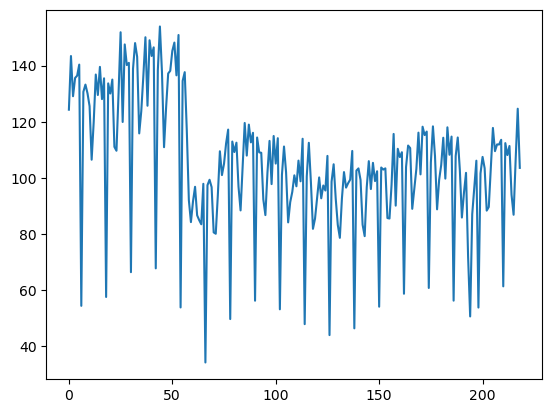

In [1464]:
plt.plot(market_data_pred.loc[:,'Production Index Machinery & Electricals Italy'])

In [1465]:
predict_pimei=pd.DataFrame(market_data_pred.set_index('Unnamed: 0').loc[:,
            'Production Index Machinery & Electricals Italy'].dropna()).reset_index().rename(columns={'Unnamed: 0':'ds',
            'Production Index Machinery & Electricals Italy':'y'})
predict_pimei.head()

,ds,y
0,2004-02-01,124.289603
1,2004-03-01,143.411662
2,2004-04-01,129.083828
3,2004-05-01,135.590391
4,2004-06-01,136.424935


In [1466]:
prophet_pimei=Prophet()
prophet_pimei.fit(predict_pimei)

23:20:28 - cmdstanpy - INFO - Chain [1] start processing
23:20:28 - cmdstanpy - INFO - Chain [1] done processing


In [1467]:
future = prophet_pimei.make_future_dataframe(periods=8,freq='m')
forecast = prophet_pimei.predict(future)

# Fill missing values
test_data_36.iloc[-8:,0]=forecast['yhat'][-8:]

#### Producer Prices Electrical equipment United States

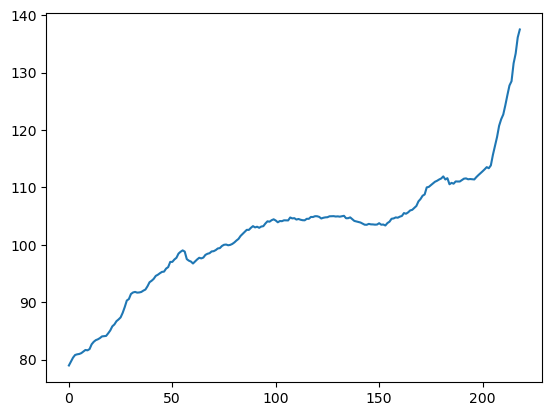

In [1468]:
plt.plot(market_data_pred.loc[:,'Producer Prices Electrical equipment United States'])

In [1469]:
predict_ppeeus=pd.DataFrame(market_data_pred.set_index('Unnamed: 0').loc[:,
            'Producer Prices Electrical equipment United States'].dropna()).reset_index().rename(columns={'Unnamed: 0':'ds',
            'Producer Prices Electrical equipment United States':'y'})
predict_ppeeus.head()

,ds,y
0,2004-02-01,78.969864
1,2004-03-01,79.673569
2,2004-04-01,80.337639
3,2004-05-01,80.798828
4,2004-06-01,80.913490


In [1470]:
prophet_ppeeus=Prophet()
prophet_ppeeus.fit(predict_ppeeus)

23:20:31 - cmdstanpy - INFO - Chain [1] start processing
23:20:31 - cmdstanpy - INFO - Chain [1] done processing


In [1471]:
future = prophet_ppeec.make_future_dataframe(periods=8,freq='m')
forecast = prophet_ppeec.predict(future)

# Fill missing values
test_data_36.iloc[-8:,1]=forecast['yhat'][-8:]

#### Shipments Index Machinery & Electricals United States

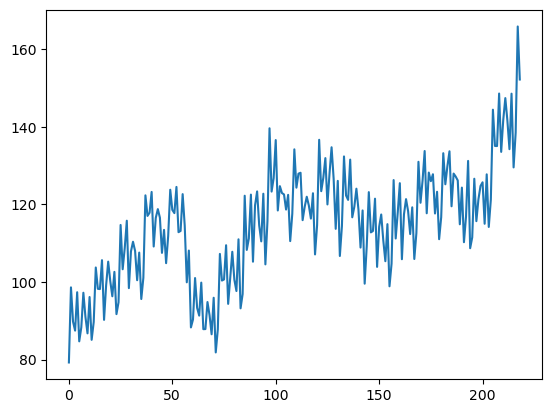

In [1472]:
plt.plot(market_data_pred.loc[:,'Shipments Index Machinery & Electricals United States'])

In [1473]:
predict_simeus=pd.DataFrame(market_data_pred.set_index('Unnamed: 0').loc[:,
            'Shipments Index Machinery & Electricals United States'].dropna()).reset_index().rename(columns={'Unnamed: 0':'ds',
            'Shipments Index Machinery & Electricals United States':'y'})
predict_simeus.head()

C:\Users\migue\anaconda3\lib\site-packages\IPython\core\displayhook.py:275: UserWarning: Output cache limit (currently 1000 entries) hit.
Flushing oldest 200 entries.
  warn('Output cache limit (currently {sz} entries) hit.\n'


,ds,y
0,2004-02-01,79.240230
1,2004-03-01,98.619024
2,2004-04-01,89.774031
3,2004-05-01,87.463813
4,2004-06-01,97.364496


In [1474]:
prophet_simeus=Prophet()
prophet_simeus.fit(predict_simeus)

23:20:35 - cmdstanpy - INFO - Chain [1] start processing
23:20:35 - cmdstanpy - INFO - Chain [1] done processing


In [1475]:
future = prophet_simeus.make_future_dataframe(periods=5,freq='m')
forecast = prophet_ppeec.predict(future)

# Fill missing values
test_data_36.iloc[-5:,2]=forecast['yhat'][-5:]

#### Production Index Machinery & Electricals France

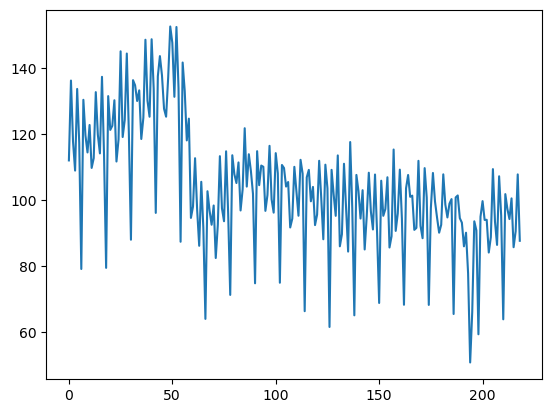

In [1476]:
plt.plot(market_data_pred.loc[:,'Production Index Machinery & Electricals France'])

In [1477]:
predict_pimef=pd.DataFrame(market_data_pred.set_index('Unnamed: 0').loc[:,
            'Production Index Machinery & Electricals France'].dropna()).reset_index().rename(columns={'Unnamed: 0':'ds',
            'Production Index Machinery & Electricals France':'y'})
predict_pimef.head()

,ds,y
0,2004-02-01,112.091273
1,2004-03-01,136.327976
2,2004-04-01,117.791806
3,2004-05-01,109.002541
4,2004-06-01,133.785737


In [1478]:
prophet_pimef=Prophet()
prophet_pimef.fit(predict_pimef)

23:20:39 - cmdstanpy - INFO - Chain [1] start processing
23:20:39 - cmdstanpy - INFO - Chain [1] done processing


In [1479]:
future = prophet_pimef.make_future_dataframe(periods=9,freq='m')
forecast = prophet_pimef.predict(future)

# Fill missing values
test_data_36.iloc[-9:,3]=forecast['yhat'][-9:]

In [1480]:
final_36=auto_arima(out_data_agg36.iloc[:,-1],X=out_data_agg36.iloc[:,1:5],stepwise=False)
forecast=final_36.predict(n_periods=10,X=test_data_36.iloc[:,:-1])
final_predictions_36=list(forecast.values)
final_predictions_36

[34863.87960538363,
 54612.79277597431,
 -33547.757367838865,
 -53089.36382608089,
 -23581.48509082837,
 19470.33571459074,
 8908.898359529509,
 9702.153957671475,
 12134.09545671987,
 18215.563005085598]

<a class="anchor" id="re">
    
## Readjusting Predictions
    
</a>

In [1500]:
list(price_index[220:230]['Consumer Price Index (2020=100)'].values.astype(float))

[109.8, 109.8, 110.3, 110.7, 112.7, 113.5, 113.7, 113.2, 114.3, 115.2]

In [1551]:
final_predictions_1=[final_predictions_1[i] * (list(price_index[220:230]['Consumer Price Index (2020=100)'].values.astype(float))[i]/100) for i 
         in range(len(final_predictions_1))]
final_predictions_3=[final_predictions_3[i] * (list(price_index[220:230]['Consumer Price Index (2020=100)'].values.astype(float))[i]/100) for i 
         in range(len(final_predictions_3))]
final_predictions_4=[final_predictions_4[i] * (list(price_index[220:230]['Consumer Price Index (2020=100)'].values.astype(float))[i]/100) for i 
         in range(len(final_predictions_4))]
final_predictions_5=[final_predictions_5[i] * (list(price_index[220:230]['Consumer Price Index (2020=100)'].values.astype(float))[i]/100) for i 
         in range(len(final_predictions_5))]
final_predictions_6=[final_predictions_6[i] * (list(price_index[220:230]['Consumer Price Index (2020=100)'].values.astype(float))[i]/100) for i 
         in range(len(final_predictions_6))]
final_predictions_8=[final_predictions_8[i] * (list(price_index[220:230]['Consumer Price Index (2020=100)'].values.astype(float))[i]/100) for i 
         in range(len(final_predictions_8))]
final_predictions_9=[final_predictions_9[i] * (list(price_index[220:230]['Consumer Price Index (2020=100)'].values.astype(float))[i]/100) for i 
         in range(len(final_predictions_9))]
final_predictions_11=[final_predictions_11[i] * (list(price_index[220:230]['Consumer Price Index (2020=100)'].values.astype(float))[i]/100) for i 
         in range(len(final_predictions_11))]
final_predictions_12=[final_predictions_12[i] * (list(price_index[220:230]['Consumer Price Index (2020=100)'].values.astype(float))[i]/100) for i 
         in range(len(final_predictions_12))]
final_predictions_13=[final_predictions_13[i] * (list(price_index[220:230]['Consumer Price Index (2020=100)'].values.astype(float))[i]/100) for i 
         in range(len(final_predictions_13))]
final_predictions_14=[final_predictions_14[i] * (list(price_index[220:230]['Consumer Price Index (2020=100)'].values.astype(float))[i]/100) for i 
         in range(len(final_predictions_14))]
final_predictions_16=[final_predictions_16[i] * (list(price_index[220:230]['Consumer Price Index (2020=100)'].values.astype(float))[i]/100) for i 
         in range(len(final_predictions_16))]
final_predictions_20=[final_predictions_20[i] * (list(price_index[220:230]['Consumer Price Index (2020=100)'].values.astype(float))[i]/100) for i 
         in range(len(final_predictions_20))]
final_predictions_36=[final_predictions_36[i] * (list(price_index[220:230]['Consumer Price Index (2020=100)'].values.astype(float))[i]/100) for i 
         in range(len(final_predictions_36))]